# Where we are at
- So far, we used NSGA2 to determine the top features in the Kimianet Dataset
    - We re-ran the algorithm 10 times after making slight changes: (1) instead of splitting the Kimianet validation data into training/test sets, we made the training set equal to the entire Kimianet validation data, and the test set equal to the entire Kimianet test data (2) when calcuating the test error of the solutions in the final pareto front of each run, we iterated through each test set sample and found the 5 nearest test set neighbours instead of the 5 nearest training set neighbours
- We also stored the number of times each feature showed up in a solution at the final pareto front of each of the NSGA2 runs 
- Next, we analyzed the results of each run's final pareto front even further:
    - Across all 10 runs, we found the solution with the lowest training error as well as the solution with the lowest test error
    - Across all 10 runs, we found the average number of features used in the solutions with the lowest training error and the solutions with the lowest test error
    - Across all 10 runs, we found the average training error from the 10 solutions with the lowest training error, as well as the average test error from the 10 solutions with the lowest test error

# Next Steps
- Take the top 100 features (based on the number of times each feature was selected in a final pareto front solution from the 10 runs)
- Using the features selected from above, implement and run the GDE3 algorithm using pymoo to determine optimal weighting for each feature.
    - Objectives: 
        1. KNN error (f1 score)
        2. number of features used (i.e., number of features with a weight > epsilon, where epslion may be 0.001)
    - Initialization (similar to NSGA2):
        1. randomly generate 100 integers between 0 and n (where n=number of features)
        2. Assign each integer (i) to a solution (s) in the initial population, and randomly generate a weight between 0-1 for i randomly chosen features in solution s. For the remaining unchosen features, assign a weight of 0. The sum of the feature weights should equal 1.
# How is weighting determined using GDE3?
- Feature weighting is another multi-objective optimization problem
    - Objective 1: KNN error
    - Objective 2: number of features used (an unused feature is detected as having a weight less than Epsilon (e.g., Epsilon = 0.001))
- However, the difference here is that the space of potential solutions is continuous, not binary
    - Feature selection is binary: each solution selects some features (1) and ignores the other features (0)
    - Feature weighting is continuous: each solution assigns every feature a weight between 0 and 1, and the sum of the feature weights must equal to 1
- In order to determine optimal weights, the following steps are done:
    1. 


# NEXT STEPS:
- make the algorithm so that, whenever a feature has a weight less than epsilon, before running KNN, change that feature's weight to 0
- make the algorithm so that, whenever a new solution gets generated, we change each features weight less than epsilon to be exactly 0. This helps with future mutations if that solution is chosen
- Params for GDE3 are good, no need to change that. 

In [31]:
from random import randint
import numpy as np
import os
from sklearn.metrics import f1_score
from scipy.spatial import distance_matrix
from collections import Counter
from pymoo.algorithms.moo.nsga2 import NSGA2
from pymoode.algorithms import GDE3 # new addition
from pymoo.core.problem import Problem
from pymoo.optimize import minimize
from pymoo.operators.sampling.rnd import BinaryRandomSampling
from pymoo.core.population import Population
from pymoo.core.evaluator import Evaluator
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split # for splitting the dataset for training and testing
from sklearn.metrics import accuracy_score # for calculating accuracy of model
import math
from sklearn.feature_selection import mutual_info_classif
import matplotlib.pyplot as plt
from pymoo.operators.crossover.ux import UniformCrossover
from pymoo.operators.mutation.bitflip import BitflipMutation
from pymoo.indicators.hv import HV
from sklearn.preprocessing import (StandardScaler, OrdinalEncoder,LabelEncoder, MinMaxScaler, OneHotEncoder)
import tensorflow as tf
from tensorflow import keras
from keras.datasets import mnist
from keras.models import Model
from keras.layers import Input, Dense, Flatten

import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import MeanAbsoluteError
from tensorflow.keras.datasets import mnist
from tensorflow.keras.models import Model

************************* Top 10 Features *************************
   Feature  Occurrences
0     1022          114
1      996           99
2      976           99
3      708           89
4      766           86
5      955           85
6      630           82
7      881           79
8      793           78
9      545           77
************************* Error Using Top 10 Features *************************
F1 Score Error using only validation data: 0.2217
F1 Score Error using only test data: 0.2576
************************* Top 20 Features *************************
    Feature  Occurrences
0      1022          114
1       996           99
2       976           99
3       708           89
4       766           86
5       955           85
6       630           82
7       881           79
8       793           78
9       545           77
10      769           75
11      781           74
12      855           73
13      767           72
14      819           69
15      841           65
1

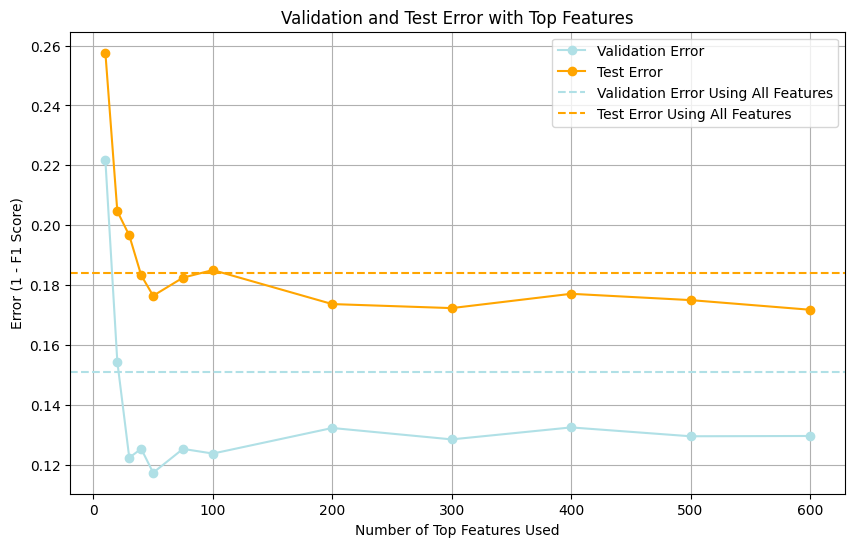

In [44]:
# Fetch top 100 features, run KNN on it using validation/testing data to get baseline results
# NOTE: csv contains feature names from 1-1024, NOT feature indices from 0-1023
def top_features_accuracy(num_features):
    print("*"*25, f"Top {num_features} Features", "*"*25)
    top_features = pd.read_csv("Top_NSGA2_Features.csv").head(num_features)
    print(top_features)
    print("*"*25, f"Error Using Top {num_features} Features", "*"*25)
    validation_path = "KimiaNet_Data/kimianet_validation_data_averaged_feature_vectors.csv"
    validation = pd.read_csv(validation_path)
    dclass = validation.columns[0]
    xval = validation.drop(columns=[dclass])
    yval = validation[dclass]
    test_path = "KimiaNet_Data/kimianet_test_data_averaged_feature_vectors.csv"
    test = pd.read_csv(test_path)
    dclass = test.columns[0]
    xtest = test.drop(columns=[dclass])
    ytest = test[dclass]
    def knn(x, y, top_features):
        featureNames = []
        for i in top_features['Feature'].tolist():
            featureNames.append(x.columns[i-1]) # e.g., if csv says feature 12, it's located at index 11 in x
        x = x[featureNames]
        dist_matrix = distance_matrix(x, x) 
        predy = [] 
        for i in range(len(x)):
            distances = dist_matrix[i]
            distances[i] = np.inf
            nearest_neighbors = np.argsort(distances)[:5]
            neighbor_labels = y[nearest_neighbors]
            most_common_label = Counter(neighbor_labels).most_common(1)[0][0]
            predy.append(most_common_label)
        f1 = f1_score(y, predy, average='weighted')
        return 1 - f1
    val_error = knn(xval, yval, top_features)
    test_error = knn(xtest, ytest, top_features)
    print(f"F1 Score Error using only validation data: {round(val_error, 4)}")
    print(f"F1 Score Error using only test data: {round(test_error, 4)}")
    return val_error, test_error

feature_counts = [10, 20, 30, 40, 50, 75, 100, 200, 300, 400, 500, 600]
val_errors = []
test_errors = []
baseline_val_error = 0.1511 # error results obtained when running 5NN with all 1024 features
baseline_test_error = 0.1842 
for count in feature_counts:
    val_error, test_error = top_features_accuracy(count)
    val_errors.append(val_error)
    test_errors.append(test_error)
plt.figure(figsize=(10, 6))
plt.plot(feature_counts, val_errors, marker='o', label='Validation Error', color='powderblue')
plt.plot(feature_counts, test_errors, marker='o', label='Test Error', color='orange')
plt.axhline(y=baseline_val_error, color='powderblue', linestyle='dashed', label='Validation Error Using All Features')
plt.axhline(y=baseline_test_error, color='orange', linestyle='dashed', label='Test Error Using All Features')
plt.xlabel('Number of Top Features Used')
plt.ylabel('Error (1 - F1 Score)')
plt.title('Validation and Test Error with Top Features')
plt.legend()
plt.grid(True)
plt.show()

In [2]:
'''
we need to define objectives with f1 and f2
what are constraints? we have an inequality constraint here?
Constraints are used to filter out invalid solutions. Solutions violating the constraint (where the constraint value is positive) will be penalized, and thus, the optimizer will avoid selecting such solutions
In the case of NSGA2, we used a constraint of 1-sum(bitstring) to penalize solutions that selected no features (since sum(bitstring) would be 0 in that case, resulting in the constraint being violated since we end up with a positive value (1-0=1))

For GDE3, we still want to keep this constraint to avoid solutions that don't select any features. 
However, our solutions are no longer binary with 0s and 1s. So, if a solution assigns a weight >0 to any feature,
we know that solution considers at least one feature. Therefore, if sum(solution)>0, the constraint is not violated.
We can translate that to a constraint as epsilon-sum(solution), where epsilon is an extremely small positive number.
If we replace epsilon with 0, that's incorrect since 0-sum(solution) for a solution with no weights for any feature is 0, which Pymoo doesn't recognize as a violated constraint since it isn't positive.

We do not need a constraint to ensure sum(weights)=1. Rather, we normalize all weights within classification_error before calculating the KNN error
However maybe its a good idea to apply this constraint to limit the search space?
No, it makes the process inflexible
'''


class MyProblem(Problem):

    def __init__(self, xtrain, ytrain, epsilon = 0.01):
        self.xtrain = xtrain
        self.ytrain = ytrain
        self.epsilon = epsilon
        n_features = xtrain.shape[1]  # Number of features (columns in xtrain)
        xl = np.full(n_features, 0)  # lower bound 0 for all feature weights
        xu = np.full(n_features, 1)  # upper bound 1 for all feature weights
        super().__init__(n_var=n_features, # decision variables
                         n_obj=2, # two objective functions
                         n_ieq_constr=1, # one inequality constraint
                         xl=xl, # lower bound on all decision variables (feature weights)
                         xu=xu) # upper bound on all decision variables (feature weights)

    def __classification_error__(self,weights): # objective 1: minimize classification error
        # instead of a bitstring, we use an array/vector consisting of a weight for each feature
        weights = np.where(weights < self.epsilon, 0, weights) # replace all weights < epsilon with 0
        if np.sum(weights) > 0:
            weights_normalized = weights / np.sum(weights) # normalize weights so that the sum of weights is 1
        else:
            weights_normalized = weights
        # weights_normalized = [x / sum(weights) for x in weights] 
        trainx = self.xtrain * weights_normalized # multiply each column by its respective weights
        trainy = self.ytrain
        # Implement leave-one-out KNN and return error using f1 score
        trainxknn = trainx.reset_index(drop=True)
        trainyknn = trainy.reset_index(drop=True)
        dist_matrix = distance_matrix(trainxknn, trainxknn) 
        predy = [] 
        for i in range(len(trainxknn)):
            distances = dist_matrix[i]
            distances[i] = np.inf
            nearest_neighbors = np.argsort(distances)[:5]
            neighbor_labels = trainyknn[nearest_neighbors]
            most_common_label = Counter(neighbor_labels).most_common(1)[0][0]
            predy.append(most_common_label)
        f1 = f1_score(trainyknn, predy, average='weighted')
        return 1 - f1

    def __features_number__(self,weights): # objective 2: minimize the number of features used; a used feature is identified by having a weight greater than epsilon
        return np.sum(weights > self.epsilon)

    def __constrain__(self,weights): # constraint 1: sum of weights must be >= epsilon to penalize solutions that don't assign weights to any features (i.e., solutions that don't use any features)
        return self.epsilon - np.sum(weights)

    def _evaluate(self, x, out, *args, **kwargs):
        x = np.where(x < self.epsilon, 0, x) # for the current generation x, replace all weights < epsilon with 0 for ALL solutions in the generation
        f1 = [self.__features_number__(x[i]) for i in range(0, len(x))]
        f2 = [self.__classification_error__(x[i]) for i in range(0, len(x))]
        g1 = [self.__constrain__(x[i]) for i in range(0, len(x))]
        out["F"] = np.column_stack([f1, f2])
        out["G"] = np.column_stack([g1])


def generate_individuals(total_features, epsilon, popsize):
    num_features_selected = np.random.randint(0, total_features, size=popsize)
    population = []
    i=1
    for num_selected in num_features_selected:
        individual = np.zeros(total_features)
        if num_selected > 0:
            selected_indices = np.random.choice(range(total_features), size=num_selected, replace=False)
            individual[selected_indices] = np.random.uniform(epsilon, 1, size=num_selected)  # Set selected features to have a random weight between epsilon-1
            print(f"INDIVIDUAL {i}, {num_selected} features: {individual[:10]}...")
        population.append(individual)
        i+=1
    return np.array(population)


def visualize(res, xtrain, ytrain, xtest, ytest, epsilon):

    hv_values = []
    num_unique_features = []
    feature_weights_sum = np.zeros(len(res.history[0].opt.get("X")[0]))
    total_solutions = 0

    # Loop through each iteration in the NSGA2 history
    for i in range(len(res.history)):
        # Get the Pareto front at iteration i
        pareto_front_F = res.history[i].opt.get("F")
        pareto_front_X = res.history[i].opt.get("X")
        # Calculate HV
        '''
        ref_point = np.array([1, 1])
        ind = HV(ref_point=ref_point)
        scaler = MinMaxScaler()
        hv = ind(scaler.fit_transform(pareto_front_F))
        '''
        pareto_front_F_scaled = pareto_front_F.copy()
        pareto_front_F_scaled[:, 0] = pareto_front_F_scaled[:, 0] / xtrain.shape[1] 
        ref_point = np.array([1, 1])
        ind = HV(ref_point=ref_point)
        hv = ind(pareto_front_F_scaled)
        hv_values.append(hv)
        # Calculate number of features used across all solutions in this iteration
        selected_features = np.array(pareto_front_X) > epsilon
        unique_features = np.sum(np.any(selected_features, axis=0))
        num_unique_features.append(unique_features)
        # Calculate total feature weights across all solutions in this iteration
        feature_weights_sum += np.sum(pareto_front_X, axis=0)
        total_solutions += len(pareto_front_X)

    # Plot HV history
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, len(hv_values) + 1), hv_values, marker='o', color='powderblue')
    plt.title('HV Value of Pareto Front Over Iterations')
    plt.xlabel('Iteration')
    plt.ylabel('HV Value')
    plt.show()

    # Plot feature usage history
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, len(num_unique_features) + 1), num_unique_features, marker='o', color='orange')
    plt.title('Number of Features Used Over Iterations')
    plt.xlabel('Iteration')
    plt.ylabel('Number of Features')
    plt.show()

    # Plot average feature weights
    plt.figure(figsize=(12, 6))
    plt.bar(range(len(res.history[0].opt.get("X")[0])), feature_weights_sum / total_solutions, color='palegreen')
    plt.title('Average Feature Weights')
    plt.xlabel('Feature Index')
    plt.ylabel('Average Weight')
    plt.show()

    # Plot initial pareto front
    i_f = res.history[0].opt.get("F")
    i_pop = res.history[0].pop
    print(f"Total population members: {len(i_pop)}")
    print(f"Pareto front members: {len(i_f)}")
    plt.scatter(i_pop.get("F")[:,0], i_pop.get("F")[:,1], edgecolor="blue", facecolor="none", label = "solutions")
    plt.scatter(i_f[:,0], i_f[:,1], marker='*', edgecolor="red", facecolor="none", label = "optimal pareto front")
    plt.xlabel('number of features')
    plt.ylabel('training error')
    plt.legend()
    plt.title("Initial Pareto Front")
    plt.show()

    # Plot final pareto front
    f = res.F
    pop = res.pop
    solutions = res.X
    print(f"Total population members: {len(pop)}")
    print(f"Pareto front members: {len(f)}")
    plt.scatter(pop.get("F")[:,0], pop.get("F")[:,1], edgecolor="blue", facecolor="none", label = "solutions")
    plt.scatter(f[:,0], f[:,1], marker='*', edgecolor="red", facecolor="none", label = "optimal pareto front")
    plt.xlabel('number of features')
    plt.ylabel('training error')
    plt.legend()
    plt.title("Final Pareto Front")
    plt.show()

    # Plot final pareto front using test accuracy
    final_pf_results = {}
    # Store information on pareto front results
    print("#"*50)
    print("Pareto Front Solution Details")
    for s in range(len(solutions)):
        solution = solutions[s] # solution represents a vector of feature weights
        solution = np.where(solution < epsilon, 0, solution) # replace all weights < epsilon with 0
        print("solution " + str(s) + ":")
        print("number of selected features is: " + str(f[:,0][s])) # i.e., number of features with a weight greater than epsilon
        #indices = [i + 1 for i, x in enumerate(np.multiply(solution, 1)) if x == 1]
        #print("corresponding indices: " + str(indices))
        print('corresponding weights: ', solution[:10], '...')
        if np.sum(solution) > 0:
            solution_normalized = solution / np.sum(solution) # normalize weights so that the sum of weights is 1
        else:
            solution_normalized = solution
        print('corresponding normalized weights: ', solution_normalized[:10], '...')
        print("classification error on train sets: " + str(f[:, 1][s]))
        trainx = xtrain * solution_normalized
        testx = xtest * solution_normalized
        trainy = ytrain
        testy = ytest
        '''
        knn = KNeighborsClassifier(n_neighbors=5)
        knn.fit(trainx, trainy.values.ravel())
        predy = knn.predict(testx)
        ac = accuracy_score(testy, predy)
        mce = 1-ac
        '''
        ################################
        '''
        # Here, we use training and test data, since we go through each test element and find the nearest training neighbours. Instead, we want to use test data only, as done below.
        # Implement leave-one-out KNN and return error using f1 score
        trainxknn = trainx.reset_index(drop=True)
        trainyknn = trainy.reset_index(drop=True)
        testxknn = testx.reset_index(drop=True)
        testyknn = testy.reset_index(drop=True)
        dist_matrix = distance_matrix(testxknn, trainxknn) # Calculate distance matrix between all samples using euclidean distance
        predy = [] # arr to store predicted labels
        for i in range(len(testxknn)):
            # Get distances of the current sample to all others
            distances = dist_matrix[i]
            #distances[i] = np.inf # no need to exclude current sample from any its neighbours for test 
            nearest_neighbors = np.argsort(distances)[:5]
            neighbor_labels = trainyknn[nearest_neighbors]
            # Assign most common label among the neighbors to the current sample
            most_common_label = Counter(neighbor_labels).most_common(1)[0][0]
            predy.append(most_common_label)
        # Calculate the F1 score between the predicted and actual labels
        f1 = f1_score(testyknn, predy, average='weighted') # weighted means we calculate f1 score for both labels and take the weighted average between them
        mce = 1 - f1
        '''
        testxknn = testx.reset_index(drop=True)
        testyknn = testy.reset_index(drop=True)
        dist_matrix = distance_matrix(testxknn, testxknn) # Calculate distance matrix between all samples using euclidean distance
        predy = [] # arr to store predicted labels
        for i in range(len(testxknn)):
            # Get distances of the current sample to all others
            distances = dist_matrix[i]
            distances[i] = np.inf # we need to exclude current sample from identifying itself as a neighbour
            nearest_neighbors = np.argsort(distances)[:5]
            neighbor_labels = testyknn[nearest_neighbors]
            # Assign most common label among the neighbors to the current sample
            most_common_label = Counter(neighbor_labels).most_common(1)[0][0]
            predy.append(most_common_label)
        # Calculate the F1 score between the predicted and actual labels
        f1 = f1_score(testyknn, predy, average='weighted') # weighted means we calculate f1 score for both labels and take the weighted average between them
        mce = 1 - f1
        ##################################

        print("classification error on test sets: " + str(mce))
        final_pf_results[s] = {
        'num_selected_features': f[:,0][s],
        'feature_weights': solution.tolist(),
        'train_error': f[:, 1][s],
        'test_error': mce
    }
    print("#"*50)
    # Extract number of features and test error from each pareto front solution
    num_features = [final_pf_results[key]['num_selected_features'] for key in final_pf_results]
    test_errors = [final_pf_results[key]['test_error'] for key in final_pf_results]
    # Find pareto front using test error and create points (num_features, test_error)
    points = list(zip(num_features, test_errors))
    sorted_points = sorted(points, key=lambda x: x[0])  # Sort by number of features
    pareto_front_points = [sorted_points[0]]  # Start with the first point
    for point in sorted_points[1:]:
        if point[1] < pareto_front_points[-1][1]:  # Test error must be lower
            pareto_front_points.append(point)
    # Plot the pareto front
    pareto_features = [p[0] for p in pareto_front_points]
    pareto_errors = [p[1] for p in pareto_front_points]
    print(f"Total population members: {len(num_features)}")
    print(f"Pareto front members: {len(pareto_features)}")
    plt.scatter(num_features, test_errors, edgecolor="blue", facecolor="none", label="solutions")
    plt.scatter(pareto_features, pareto_errors, marker='*', edgecolor="red", facecolor="none", label="optimal pareto front")
    plt.xlabel('Number of Features')
    plt.ylabel('Test Error')
    plt.legend()
    plt.title("Final Pareto Front using Test Error")
    plt.show()

    # Store information on test error pareto front results
    final_test_pf_results = {}
    for idx, (num_feat, test_err) in enumerate(pareto_front_points):
        for key in final_pf_results:
            if (final_pf_results[key]['num_selected_features'] == num_feat) and (final_pf_results[key]['test_error'] == test_err):
                final_test_pf_results[key] = final_pf_results[key]
    print("Final PF Results: ", final_pf_results)
    print("Final Test Error PF Results: ", final_test_pf_results)

    # Get HV results for pareto front using test & training error
    # NOTE: HV will be naturally low since it is very unlikely for weights to be assigned in a way where the number of features selected is close to 0
    # HV using test PF
    pareto_front_array = np.array([[num_feat, test_err] for num_feat, test_err in pareto_front_points])
    '''
    ref_point = np.array([1, 1])
    ind = HV(ref_point=ref_point)
    scaler = MinMaxScaler()
    hv_test = ind(scaler.fit_transform(pareto_front_array))
    '''
    pareto_front_array_scaled = pareto_front_array.copy()
    pareto_front_array_scaled[:, 0] = pareto_front_array_scaled[:, 0] / xtrain.shape[1] 
    ref_point = np.array([1, 1])
    ind = HV(ref_point=ref_point)
    hv_test = ind(pareto_front_array_scaled)
    print("HV of the best pareto front (using test error): " + str(round(hv_test, 5)))
    # HV using training PF
    '''
    ref_point = np.array([1, 1])
    ind = HV(ref_point=ref_point)
    scaler = MinMaxScaler()
    hv_training = ind(scaler.fit_transform(res.F))
    '''
    res_scaled = res.F.copy()
    res_scaled[:, 0] = res_scaled[:, 0] / xtrain.shape[1] 
    ref_point = np.array([1, 1])
    ind = HV(ref_point=ref_point)
    hv_training = ind(res_scaled)
    print("HV of the best pareto front (using training error): " + str(round(hv_training, 5)))

    # Find the solution with the lowest training and testing error
    lowest_train_error_solution = min(final_pf_results.values(), key=lambda x: x['train_error'])
    lowest_test_error_solution = min(final_test_pf_results.values(), key=lambda x: x['test_error'])

    print("Solution with the lowest training error:", lowest_train_error_solution)
    print("Solution with the lowest testing error:", lowest_test_error_solution)

    # Return final results
    return final_pf_results, final_test_pf_results, lowest_train_error_solution, lowest_test_error_solution, hv_test, hv_training


def store_results(dataset_name, final_pf_results, final_test_pf_results, lowest_train_error_solution, lowest_test_error_solution, hv_test, hv_training, epsilon, featureNames):
    csv_file_path = "data.csv" # file to store NSGA2 results for different datasets

    # If file doesn't exist, create it
    if not os.path.exists(csv_file_path):
        columns = [
            "Dataset", "Training PF", "Test PF", "HV for training PF", "HV for testing PF",
            "Minimum error on training PF", "Minimum error on testing PF",
            "Number of features for minimum error on training PF",
            "Number of features for minimum error on testing PF",
            "Feature Frequency"
        ]
        df_results = pd.DataFrame(columns=columns)
        df_results.to_csv(csv_file_path, index=False)

    # Otherwise, open the file
    else:
        df_results = pd.read_csv(csv_file_path)

    # Calculate feature frequency (using training PF)
    feature_count = {feature: 0 for feature in featureNames}
    for solution in final_pf_results.values():
        for i, weight in enumerate(solution['feature_weights']):
            if weight > epsilon:
                feature_count[featureNames[i]] += 1
    feature_freq_str = ', '.join([f"{key}: {value}" for key, value in feature_count.items()])

    # Create new row to put in file
    new_row = pd.DataFrame([{
        "Dataset": dataset_name,
        "Training PF": final_pf_results,
        "Test PF": final_test_pf_results,
        "HV for training PF": hv_training,
        "HV for testing PF": hv_test,
        "Minimum error on training PF": lowest_train_error_solution["train_error"],
        "Minimum error on testing PF": lowest_test_error_solution["test_error"],
        "Number of features for minimum error on training PF": lowest_train_error_solution["num_selected_features"],
        "Number of features for minimum error on testing PF": lowest_test_error_solution["num_selected_features"],
        "Feature Frequency": feature_freq_str
    }])

    # Put new row in file
    df_results = pd.concat([df_results, new_row], ignore_index=True)
    df_results.to_csv(csv_file_path, index=False)
    print("Results saved to data.csv")
    return



TOTAL NUMBER OF FEATURES:  100
************************************************** RUN 1 **************************************************
INDIVIDUAL 1, 35 features: [0.         0.         0.         0.         0.72750692 0.
 0.         0.         0.         0.        ]...
INDIVIDUAL 2, 17 features: [0.        0.        0.        0.3087939 0.        0.        0.
 0.        0.        0.       ]...
INDIVIDUAL 3, 41 features: [0.         0.         0.53806622 0.         0.         0.89360892
 0.         0.86903871 0.         0.        ]...
INDIVIDUAL 4, 73 features: [0.98046446 0.45028587 0.49084182 0.93422433 0.918496   0.6406759
 0.29775395 0.         0.         0.82964391]...
INDIVIDUAL 5, 37 features: [0.2839898  0.58360334 0.         0.         0.         0.
 0.71682638 0.         0.88735929 0.        ]...
INDIVIDUAL 6, 4 features: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]...
INDIVIDUAL 7, 92 features: [0.         0.08397127 0.82370449 0.93358768 0.41054369 0.81187069
 0.84392744 0.         0.

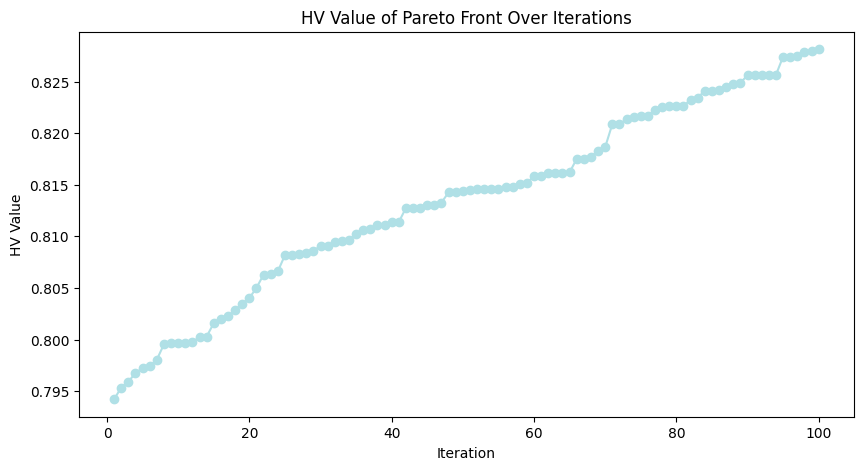

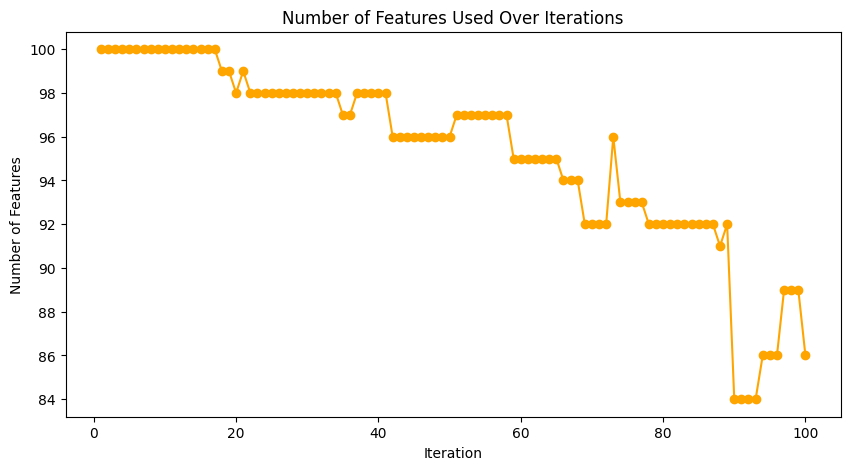

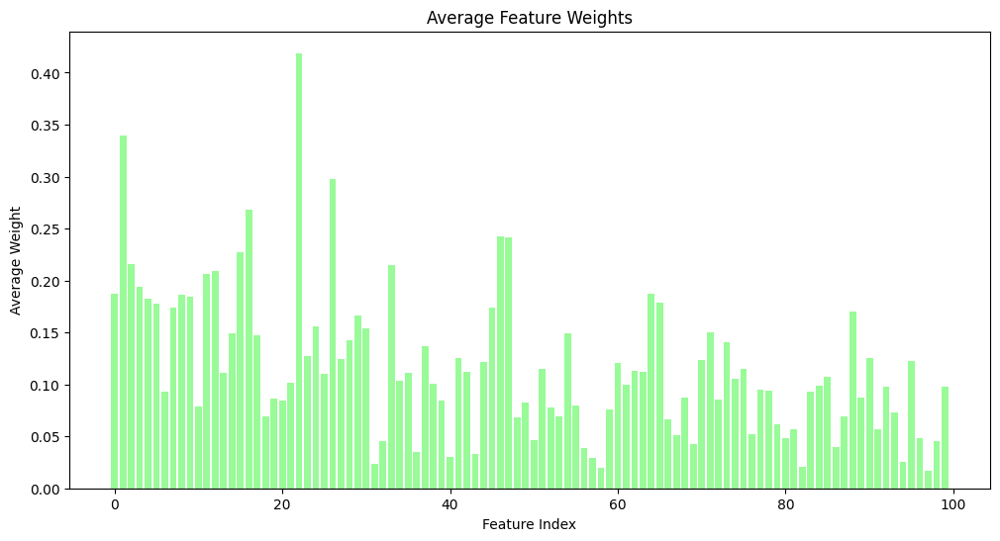

Total population members: 100
Pareto front members: 19


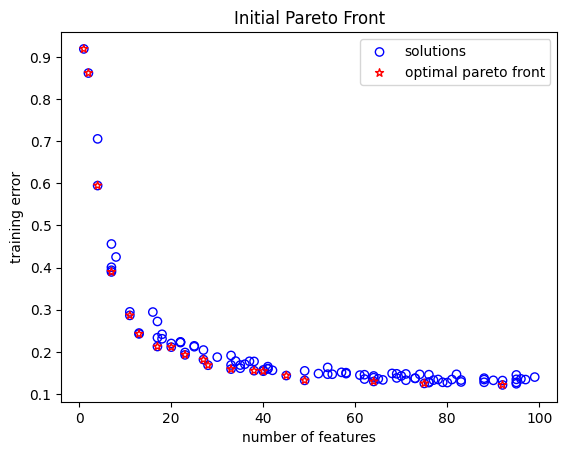

Total population members: 100
Pareto front members: 28


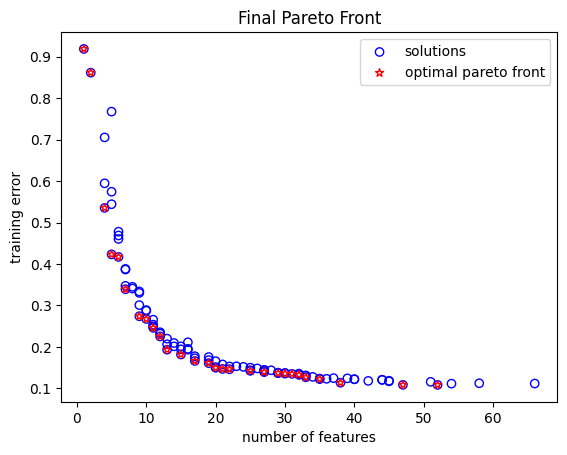

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.9187321900489495
classification error on test sets: 0.8807926274783703
solution 1:
number of selected features is: 2.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.8614807577066431
classification error on test sets: 0.7904391751776697
solution 2:
number of selected features is: 5.0
corresponding weights:  [0.         0.49862164 0.         0.         0.         0.
 0.11256594 0.41383822 0.         0.        ] ...
corresponding normalized weights:  [0.         0.2485519  0.         0.         0.         0.
 0.05611164 0.20628924 0.         0.        ] ...
classification err

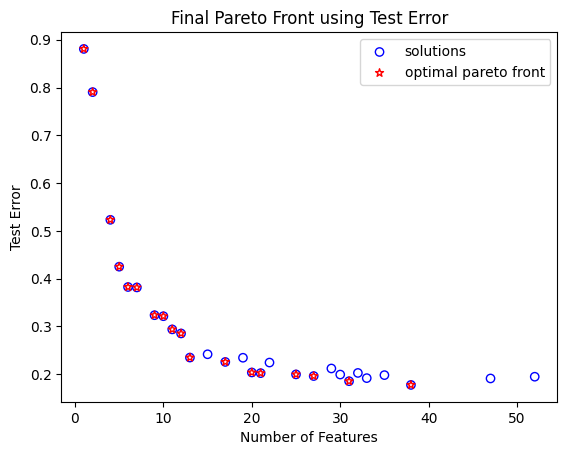

Final PF Results:  {0: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.049408816872707054, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.9187321900489495, 'test_error': 0.8807926274783703}, 1: {'num_selected_features': 2.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.03030029515262605, 0.0, 0.0, 0.0

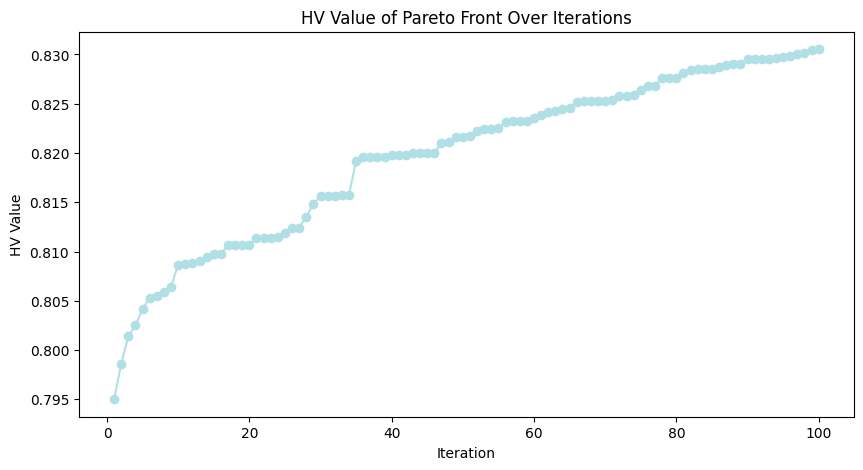

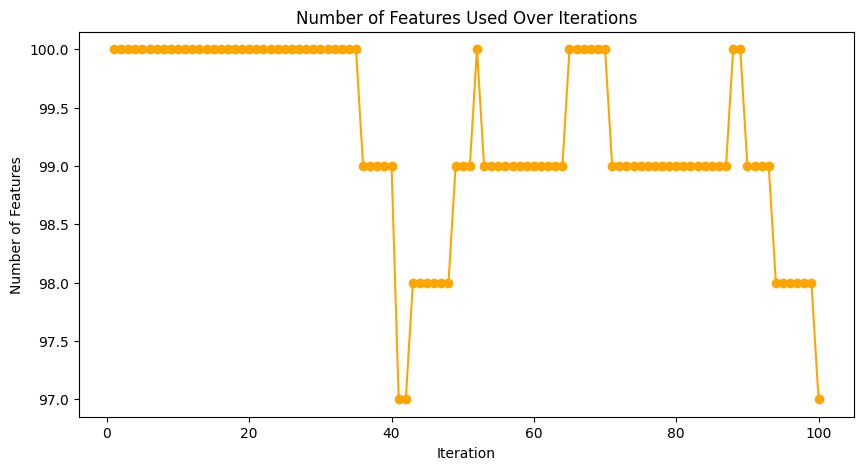

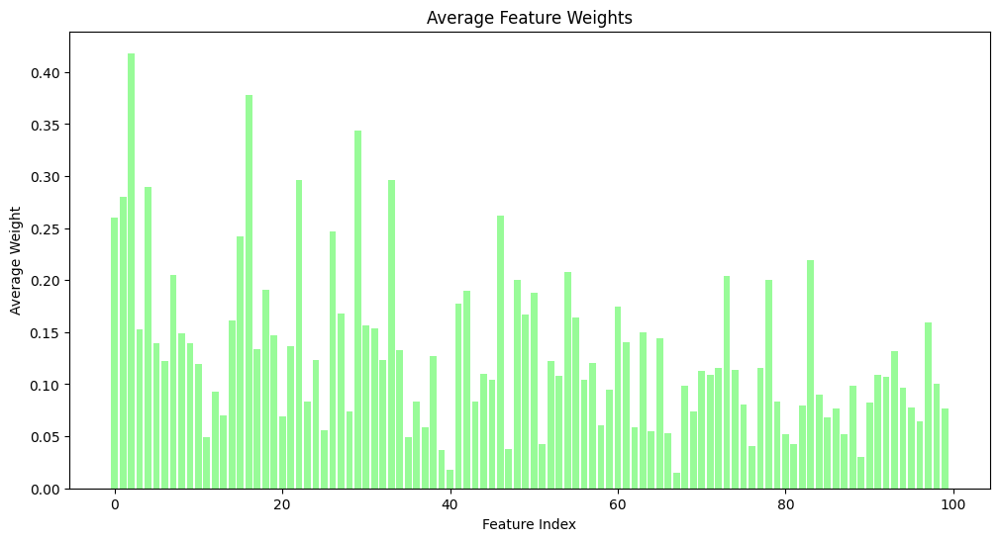

Total population members: 100
Pareto front members: 21


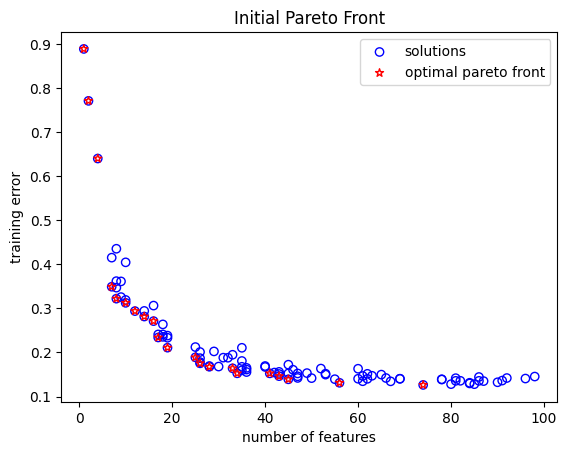

Total population members: 100
Pareto front members: 31


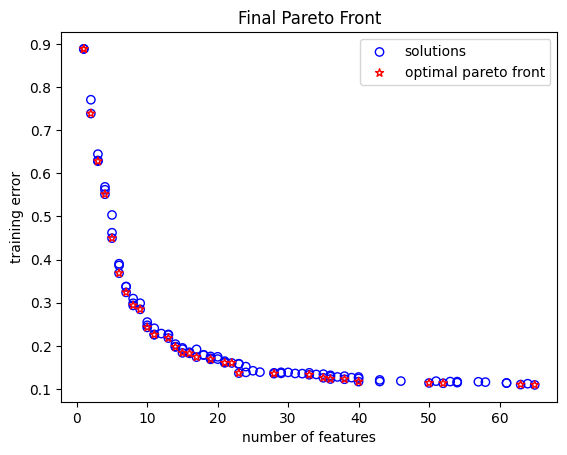

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.8884454016166456
classification error on test sets: 0.8655029507469052
solution 1:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.8884454016166456
classification error on test sets: 0.8655029507469052
solution 2:
number of selected features is: 3.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.6280779518341697
classification error on test sets: 0.6799931112088239
solution 3:
number of selected features is: 19.0
corres

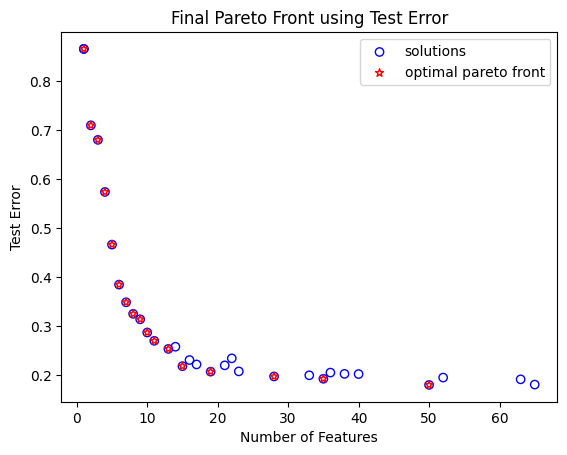

Final PF Results:  {0: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3316485216114534, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.8884454016166456, 'test_error': 0.8655029507469052}, 1: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

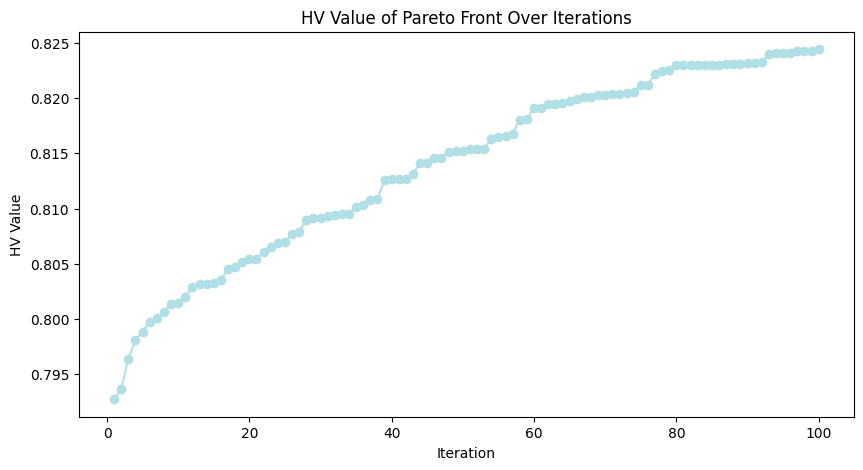

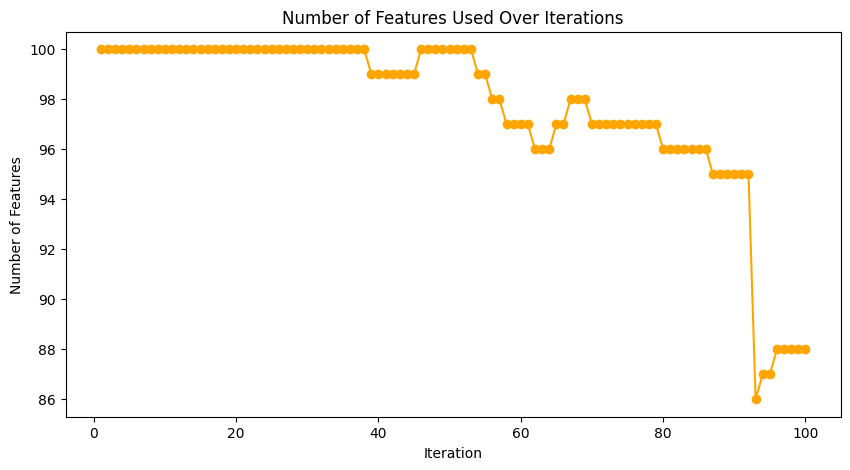

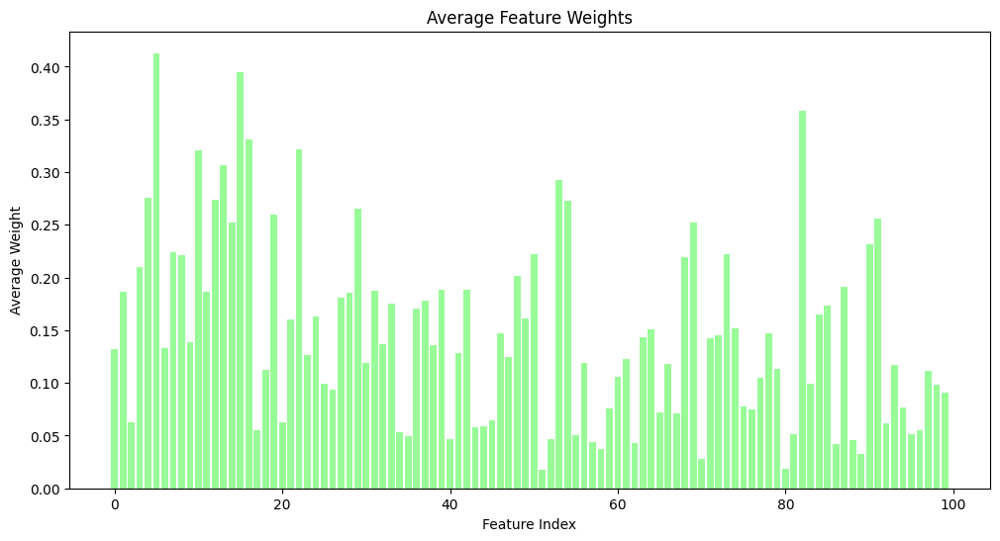

Total population members: 100
Pareto front members: 20


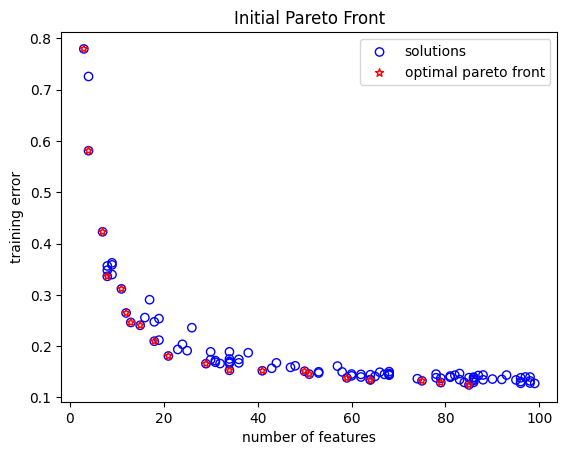

Total population members: 100
Pareto front members: 35


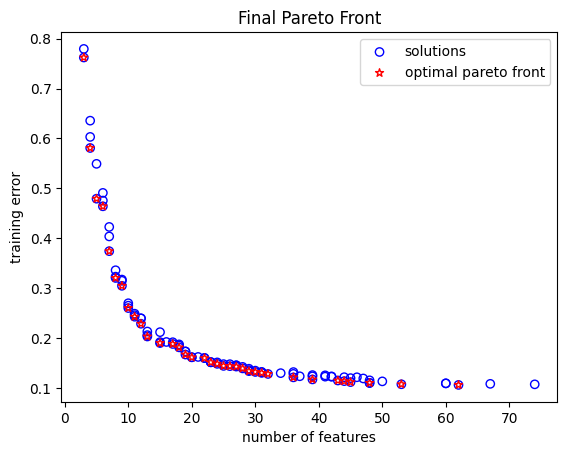

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 4.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.5809345406931552
classification error on test sets: 0.5968016442832565
solution 1:
number of selected features is: 13.0
corresponding weights:  [0.26687073 0.         0.         0.42519852 0.         0.50761071
 0.         0.         0.35120258 0.        ] ...
corresponding normalized weights:  [0.05297455 0.         0.         0.08440304 0.         0.10076208
 0.         0.         0.06971465 0.        ] ...
classification error on train sets: 0.2032196212419678
classification error on test sets: 0.24804101022422065
solution 2:
number of selected features is: 32.0
corresponding weights:  [0.         0.         0.         0.         0.7780907  0.95516543
 0.         0.69207462 0.76525963 0.   

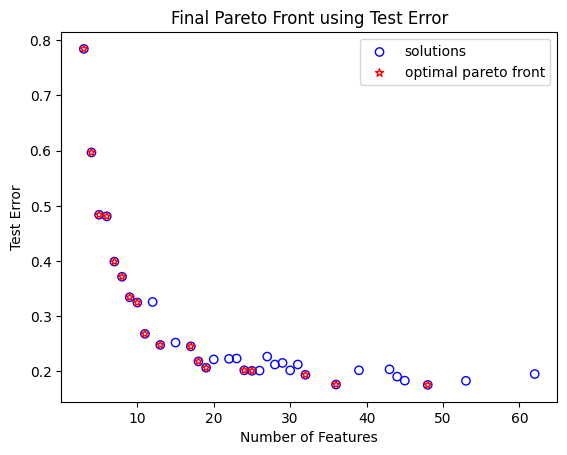

Final PF Results:  {0: {'num_selected_features': 4.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.19631664448738634, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5745277353777808, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5067929848964793, 0.0, 0.0, 0.0, 0.09138395857182373, 0.0, 0.0], 'train_error': 0.5809345406931552, 'test_error': 0.5968016442832565}, 1: {'num_selected_features': 13.0, 'feature_weights': [0.26687072831174313, 0.0, 0.0, 0.4251985205988304, 0.0, 0.5076107107165675, 0.0, 0.0, 0.35120258068521554, 0.0, 0.08333624529364776, 0.0, 0.29260966096227253, 0.0, 0.0, 0.17708403667520992, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

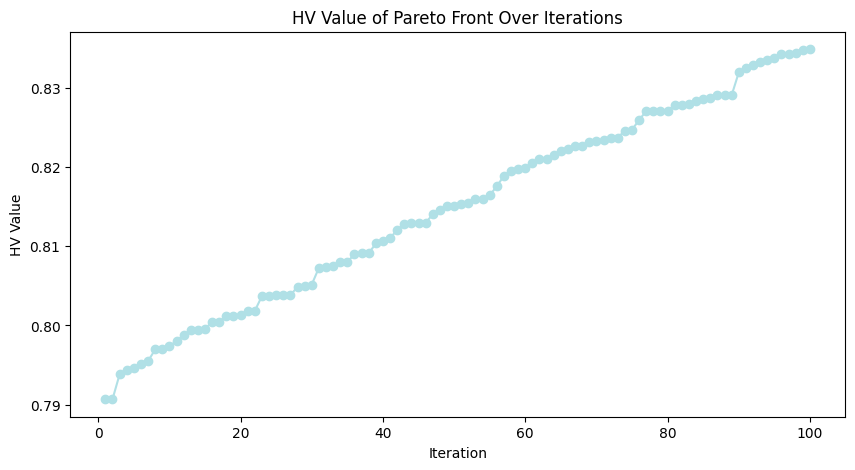

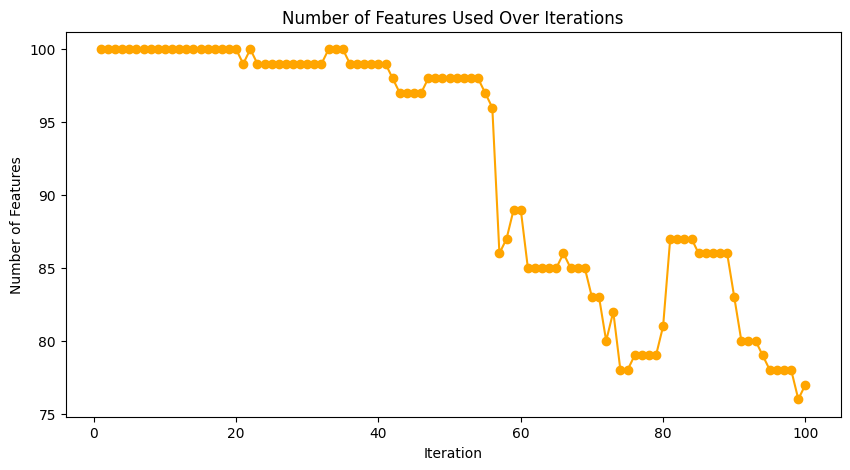

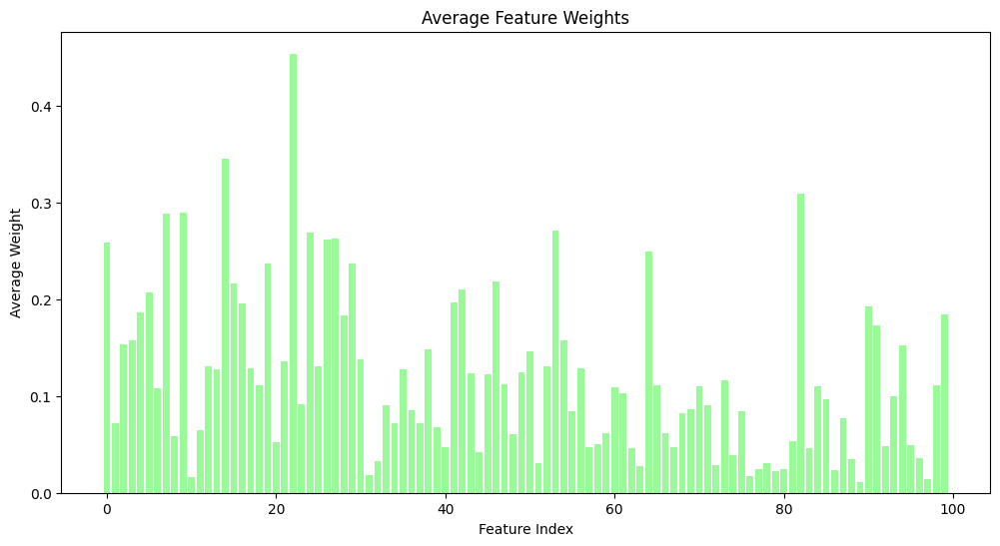

Total population members: 100
Pareto front members: 24


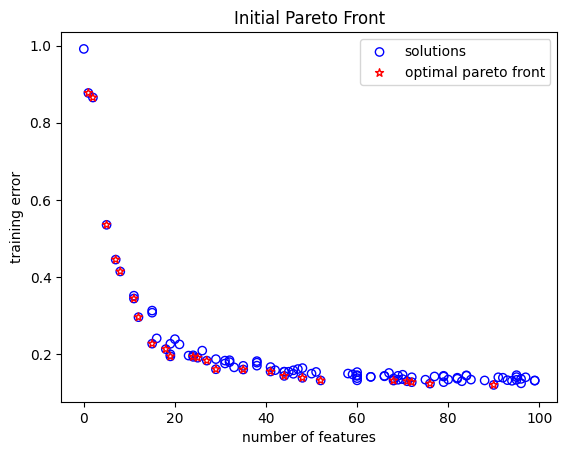

Total population members: 100
Pareto front members: 30


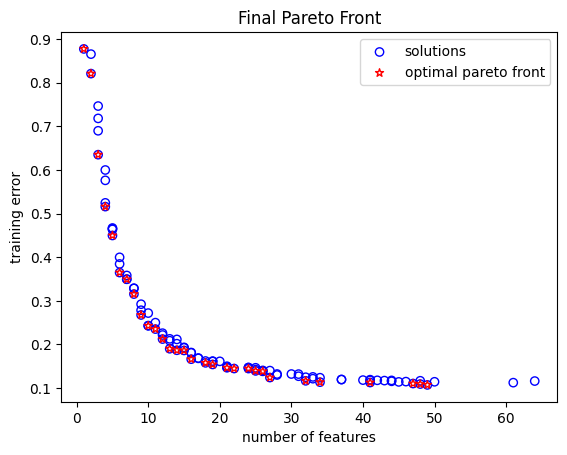

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.8772715766004864
classification error on test sets: 0.9089671018488644
solution 1:
number of selected features is: 15.0
corresponding weights:  [0.50816871 0.         0.         0.30039276 0.50504497 0.
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0.08323741 0.         0.         0.04920396 0.08272574 0.
 0.         0.         0.         0.        ] ...
classification error on train sets: 0.18617208370529725
classification error on test sets: 0.2568460365359041
solution 2:
number of selected features is: 3.0
corresponding weights:  [0.53895917 0.         0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
corresponding 

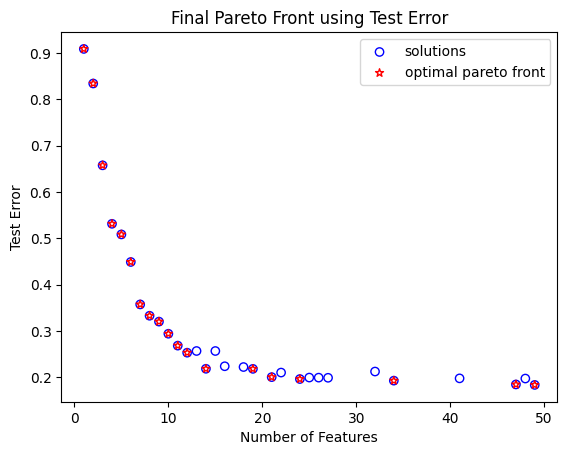

Final PF Results:  {0: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5495490702383713, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.8772715766004864, 'test_error': 0.9089671018488644}, 1: {'num_selected_features': 15.0, 'feature_weights': [0.5081687066729417, 0.0, 0.0, 0.30039276026108175, 0.5050449663894344, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.4411960868551494, 0.0, 0.0, 0.0, 0.0, 0.2557165072772262, 0.0, 0.0, 0.0, 0.0, 0.551615811530291, 0.0, 0.0, 0.1306099905327555, 0.0, 0.0, 0.0, 0.2474428031761

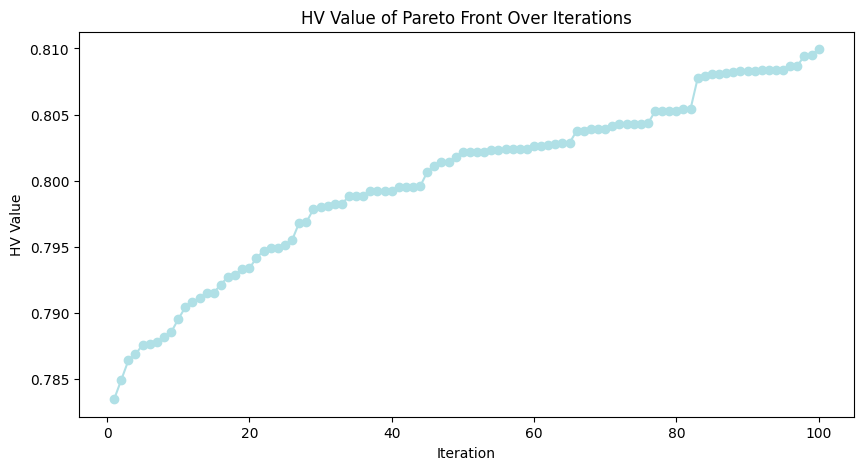

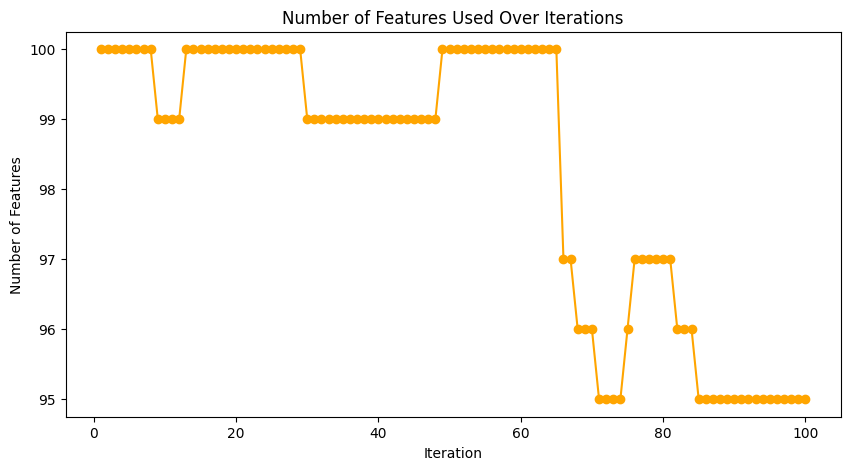

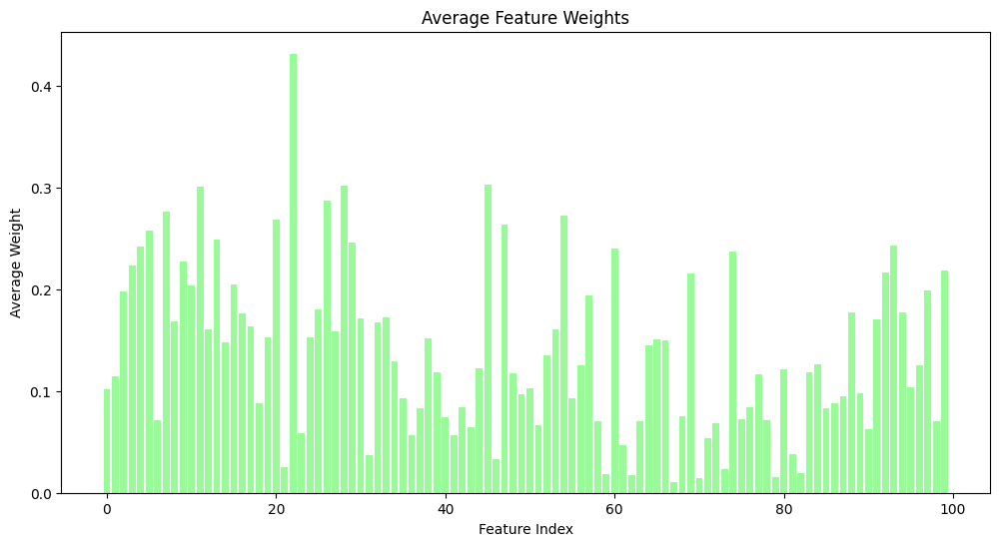

Total population members: 100
Pareto front members: 23


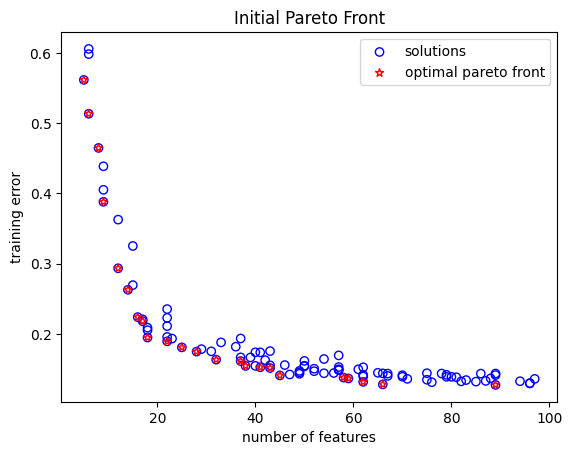

Total population members: 100
Pareto front members: 28


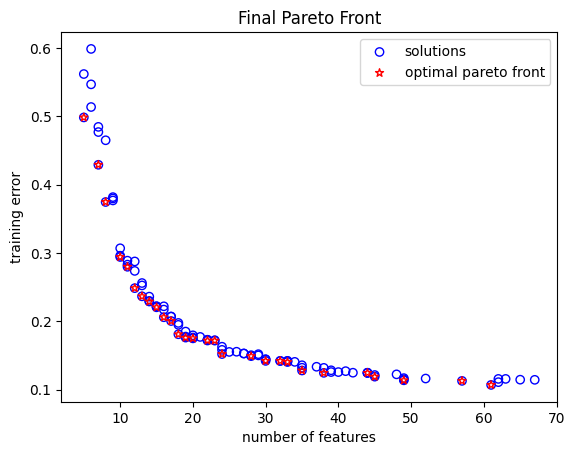

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 23.0
corresponding weights:  [0.         0.         0.         0.76931697 0.74041331 0.99827694
 0.06346452 0.73066803 0.         0.        ] ...
corresponding normalized weights:  [0.         0.         0.         0.06115707 0.05885937 0.07935831
 0.00504513 0.05808466 0.         0.        ] ...
classification error on train sets: 0.1716539231460703
classification error on test sets: 0.22179970159313833
solution 1:
number of selected features is: 7.0
corresponding weights:  [0.         0.80245279 0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0.         0.22026165 0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
classification error on train sets: 0.42895826881187493
classification error on test sets: 0.45347488262682745
solution 2:
number of selected 

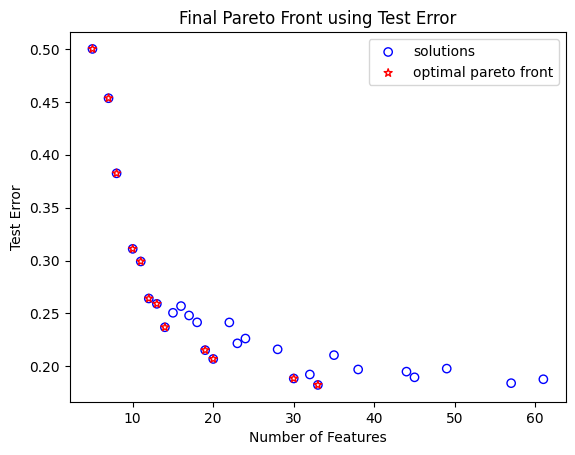

Final PF Results:  {0: {'num_selected_features': 23.0, 'feature_weights': [0.0, 0.0, 0.0, 0.7693169684415837, 0.7404133105450903, 0.9982769436283456, 0.06346451990065535, 0.7306680309618376, 0.0, 0.0, 0.8194956388665049, 0.748768495572861, 0.9536994890621954, 0.5301475402531973, 0.0, 0.0, 0.0, 0.544596613800395, 0.0, 0.0, 0.0, 0.0, 0.7100386180270801, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.49961318736401605, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.19832524358263598, 0.0, 0.0, 0.6600776982612584, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.37551883878797143, 0.0, 0.0, 0.7569663446137561, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.03423933622221371, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5529673375907719, 0.0, 0.0, 0.10447590121449185, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.48360910910321964, 0.0, 0.13457194235697173, 0.9533805736553905, 0.0, 0.0, 0.0, 0.21673082696533824, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.1716539231460703, 'test_error': 0.22179970159313833}, 1

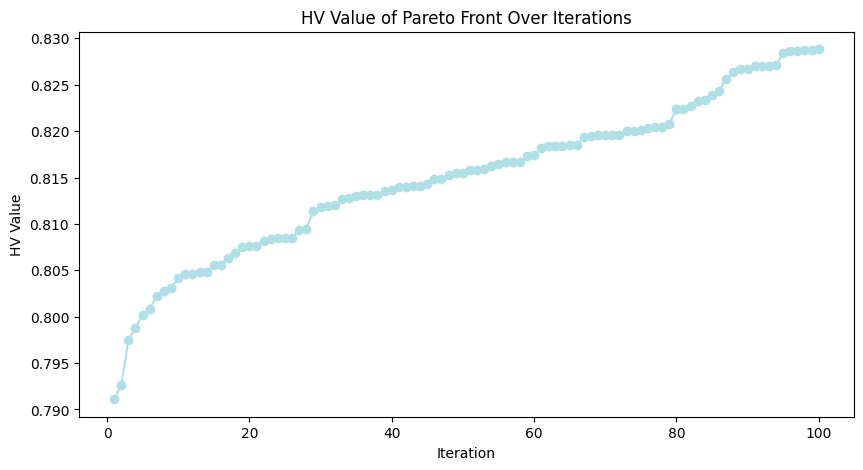

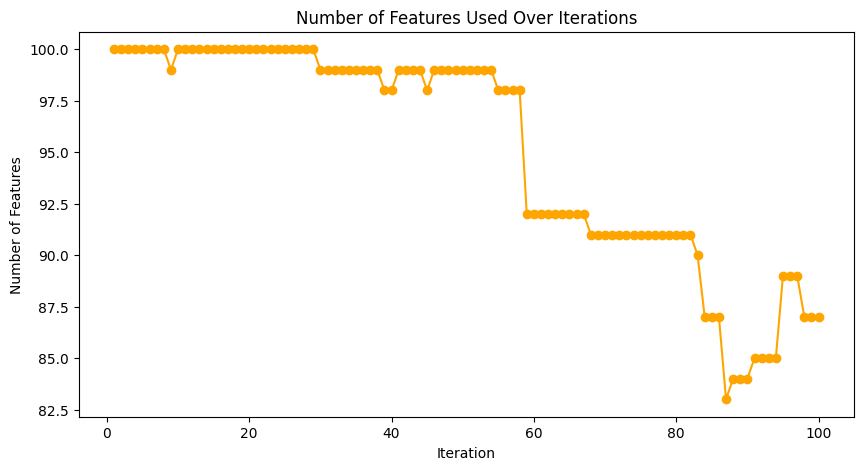

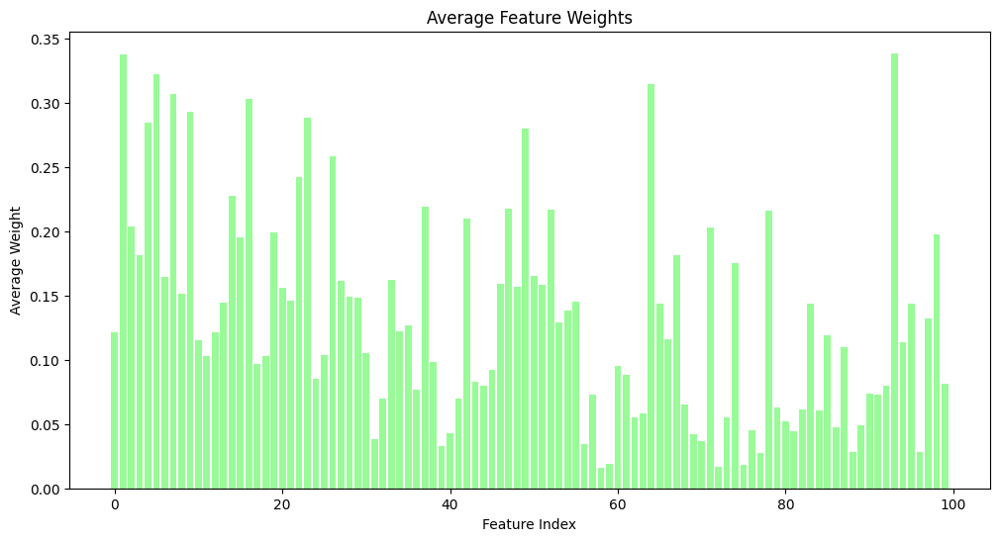

Total population members: 100
Pareto front members: 23


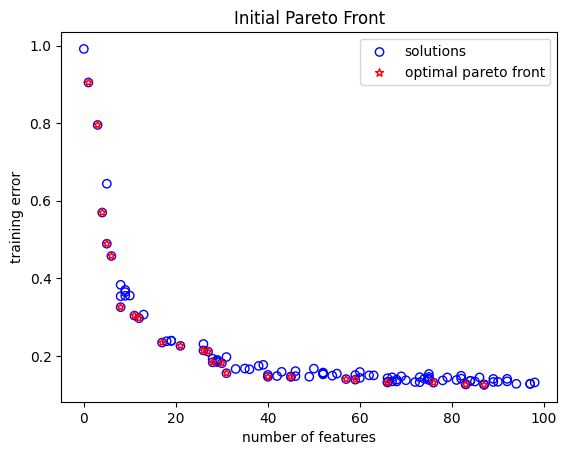

Total population members: 100
Pareto front members: 30


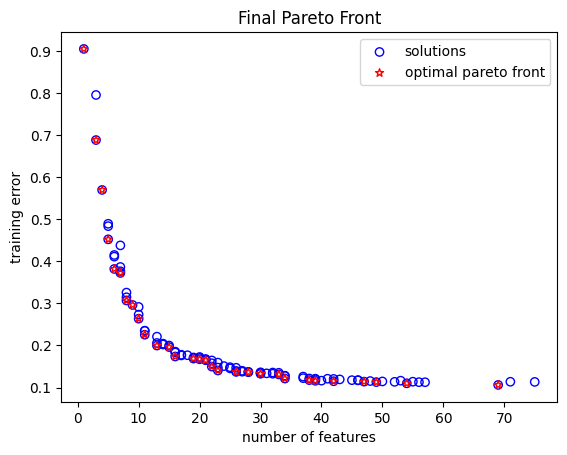

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 4.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.5695958214439505
classification error on test sets: 0.5832928656783364
solution 1:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.9047960892674531
classification error on test sets: 0.8763091752673552
solution 2:
number of selected features is: 5.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.4522434313258994
classification error on test sets: 0.46496926481646483
solution 3:
number of selected features is: 8.0
corres

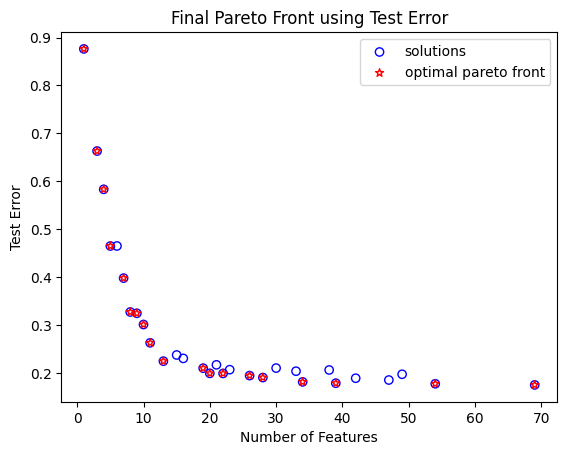

Final PF Results:  {0: {'num_selected_features': 4.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2671417586897414, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6212159073284597, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.89023444306401, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8064018075456103, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.5695958214439505, 'test_error': 0.5832928656783364}, 1: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7527257341886218, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

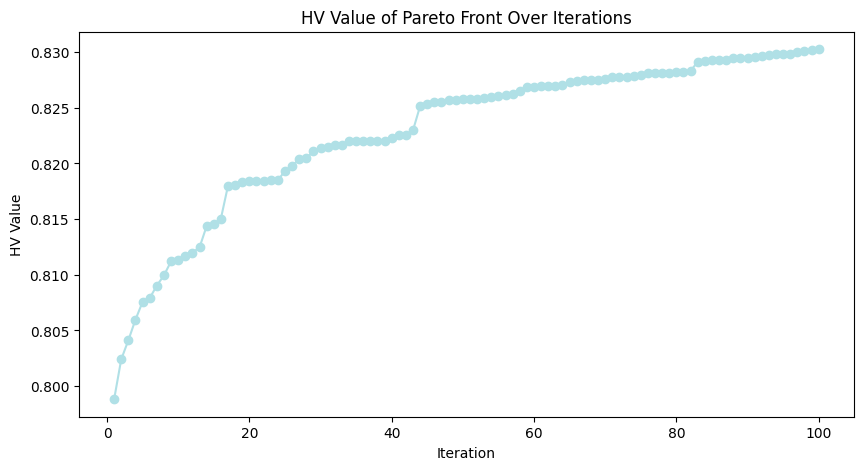

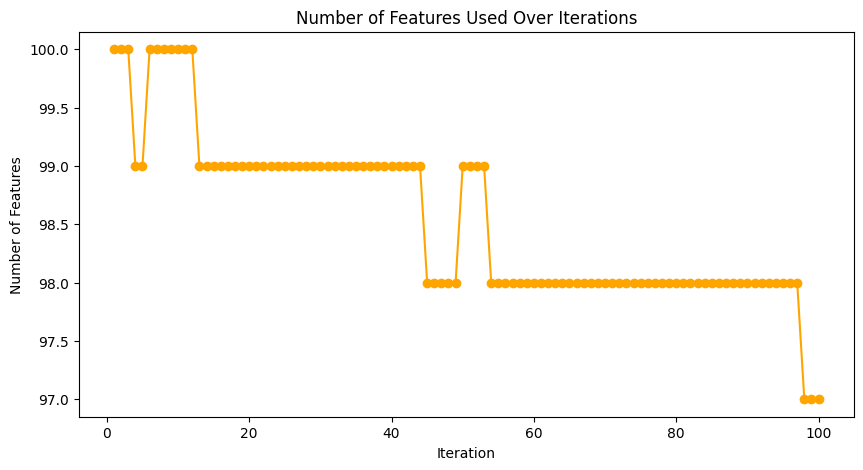

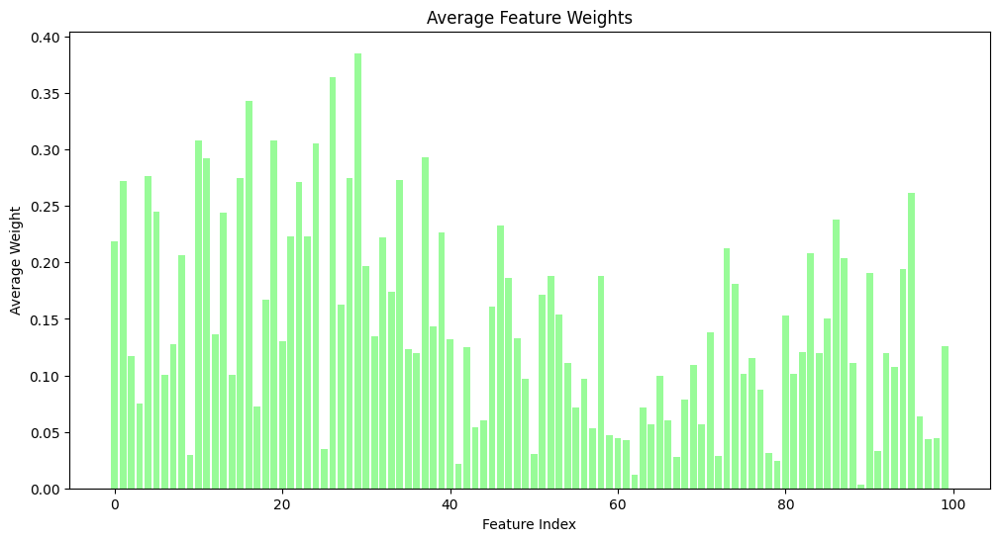

Total population members: 100
Pareto front members: 21


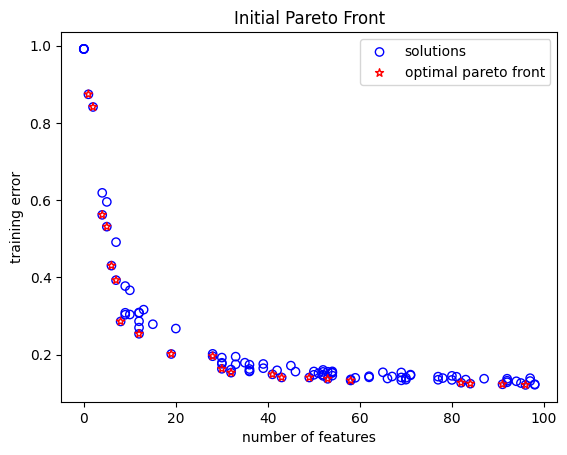

Total population members: 100
Pareto front members: 35


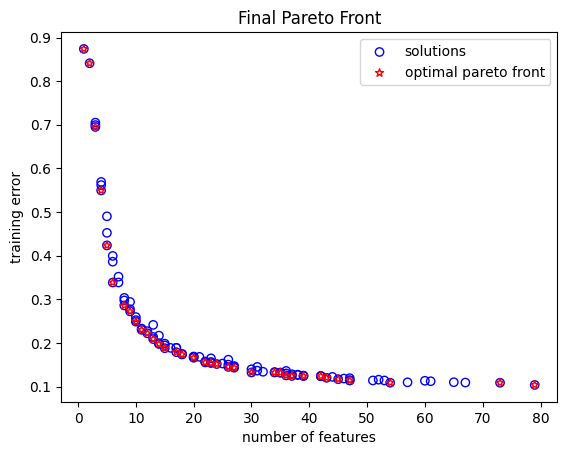

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 8.0
corresponding weights:  [0.         0.59138164 0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0.        0.1347946 0.        0.        0.        0.        0.
 0.        0.        0.       ] ...
classification error on train sets: 0.2858159694628025
classification error on test sets: 0.34417823992292096
solution 1:
number of selected features is: 9.0
corresponding weights:  [0.         0.59138164 0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0.         0.13985694 0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
classification error on train sets: 0.27226811446998866
classification error on test sets: 0.3104131363089795
solution 2:
number of selected features is: 5.0
correspond

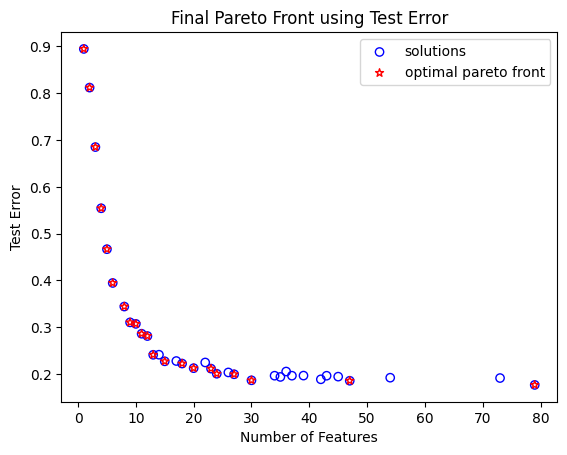

Final PF Results:  {0: {'num_selected_features': 8.0, 'feature_weights': [0.0, 0.5913816393896277, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7602754787977891, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5983278010774523, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.41247947312673044, 0.0, 0.0, 0.0, 0.4989717102374805, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3424904258807621, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1847095343462665, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.9986437892703616, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.2858159694628025, 'test_error': 0.34417823992292096}, 1: {'num_selected_features': 9.0, 'feature_weights': [0.0, 0.5913816393896277, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6419991744415876, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5138557628278904, 0.0, 0.0, 0.231603988351

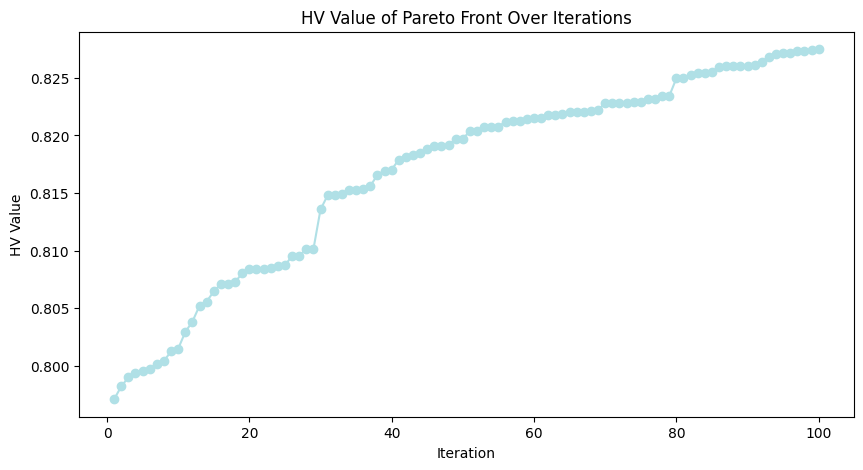

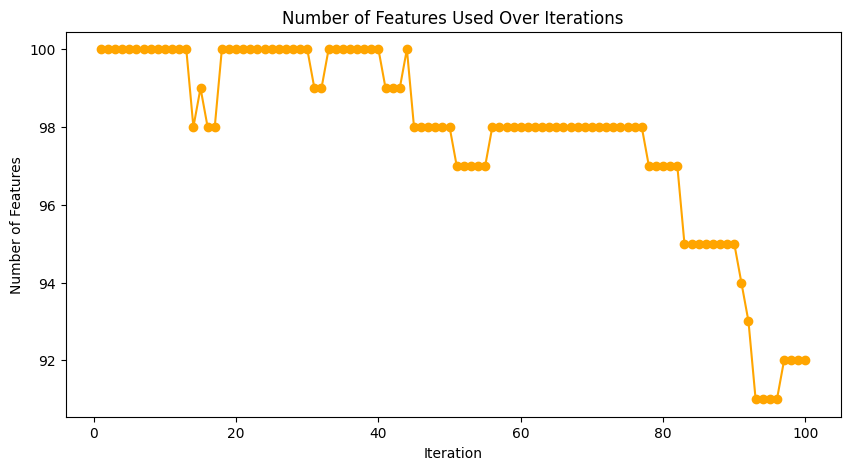

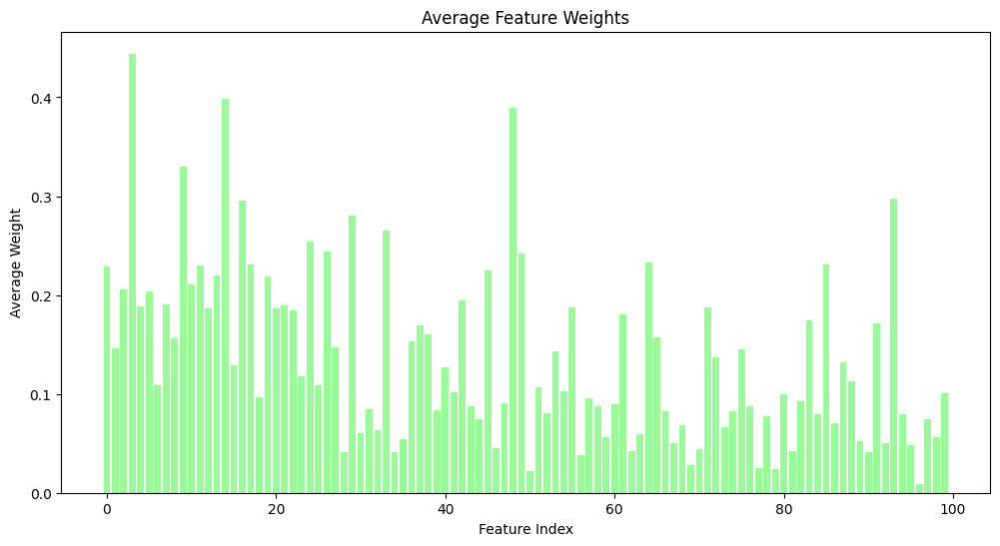

Total population members: 100
Pareto front members: 20


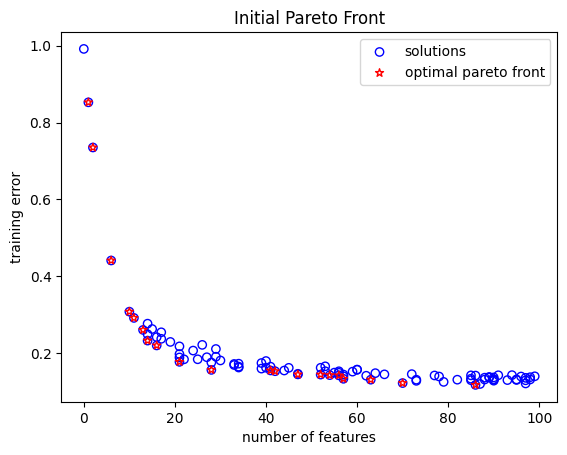

Total population members: 100
Pareto front members: 29


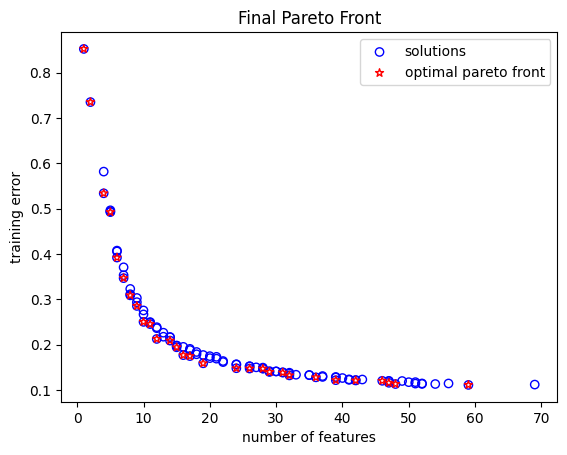

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 2.0
corresponding weights:  [0.32547795 0.         0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0.47329681 0.         0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
classification error on train sets: 0.7351634209761934
classification error on test sets: 0.7528343043791249
solution 1:
number of selected features is: 7.0
corresponding weights:  [0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.57000649] ...
corresponding normalized weights:  [0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.18425022] ...
classification error on train sets: 0.346543041310193
classification error on test sets: 0.3449849923124505
solution 2:
number of selected features is: 1.0
corr

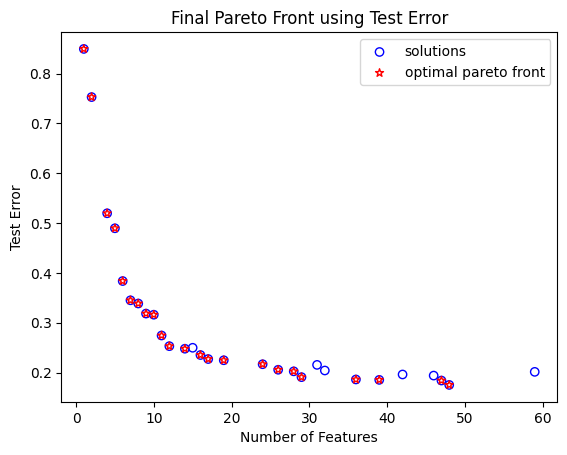

Final PF Results:  {0: {'num_selected_features': 2.0, 'feature_weights': [0.32547794902942556, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.36220458152364676, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.7351634209761934, 'test_error': 0.7528343043791249}, 1: {'num_selected_features': 7.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5700064879678411, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.41669770645149407, 0.0, 0.0, 0.0, 0.28165203241754605, 0.0, 0.5749392582090235, 0.3270689598416304, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.

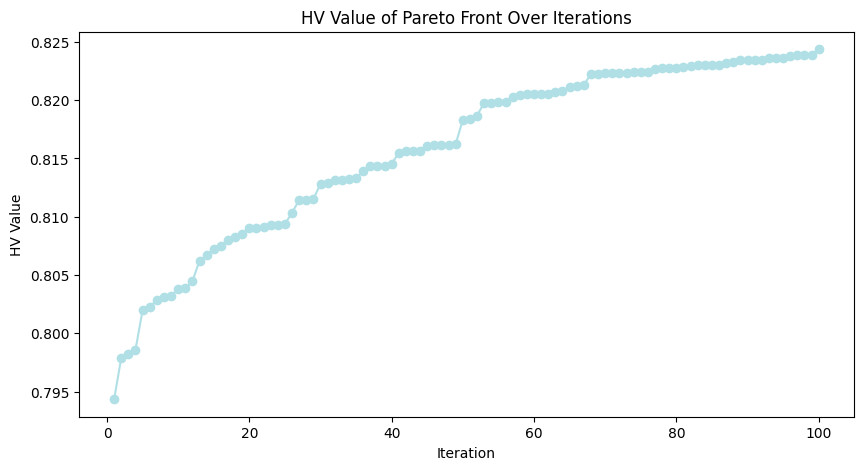

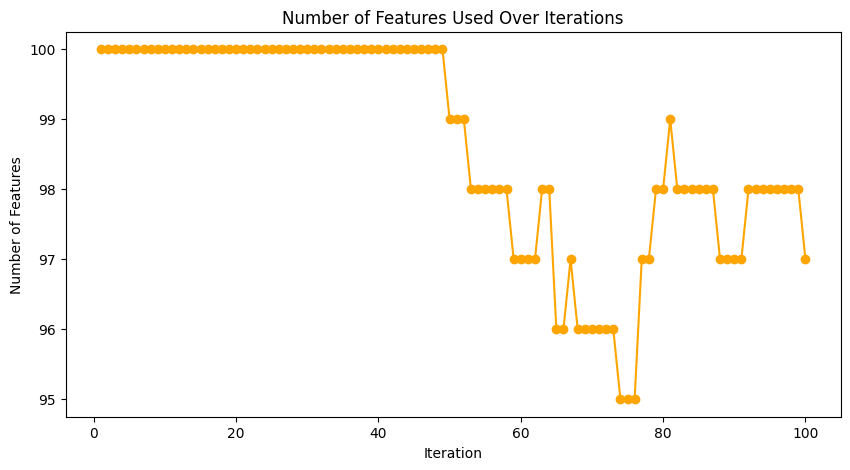

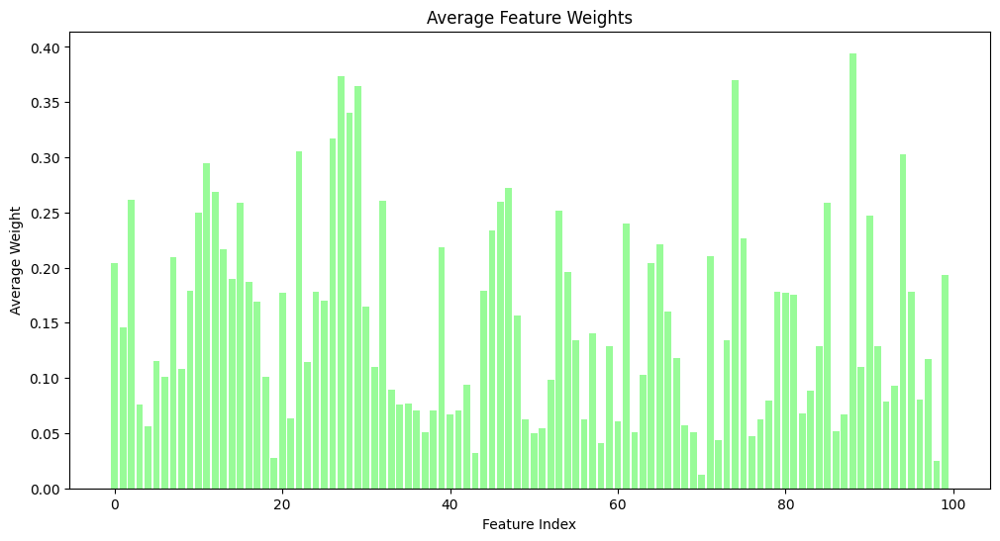

Total population members: 100
Pareto front members: 15


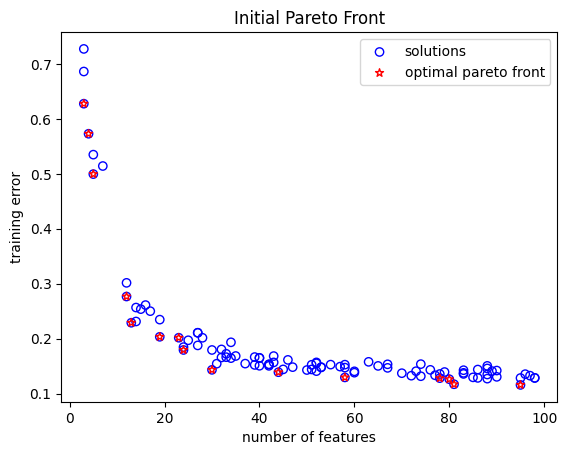

Total population members: 100
Pareto front members: 34


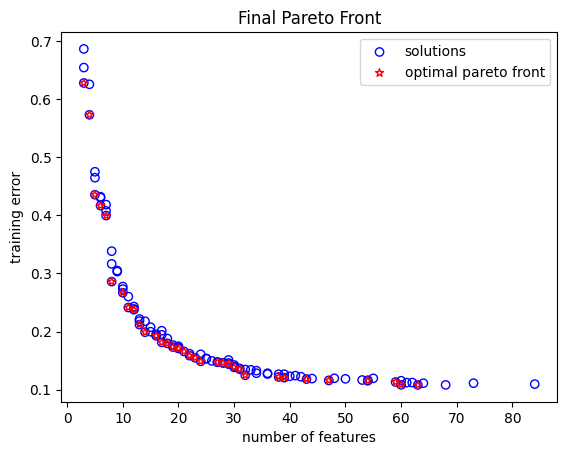

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 4.0
corresponding weights:  [0.         0.         0.         0.         0.         0.
 0.66698933 0.         0.         0.        ] ...
corresponding normalized weights:  [0.         0.         0.         0.         0.         0.
 0.27232298 0.         0.         0.        ] ...
classification error on train sets: 0.5730153043491133
classification error on test sets: 0.5654600076434875
solution 1:
number of selected features is: 3.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.6277606236479214
classification error on test sets: 0.6534052194133557
solution 2:
number of selected features is: 7.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification err

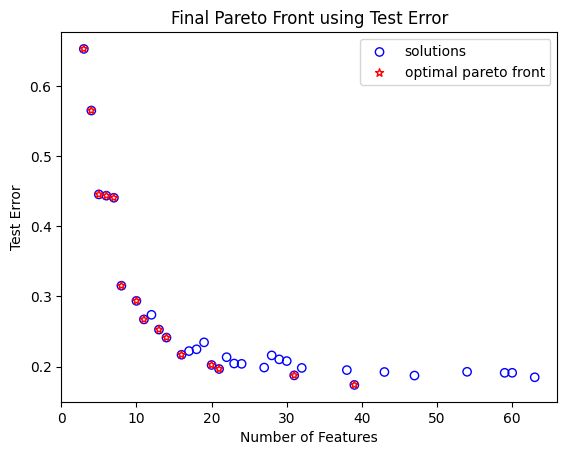

Final PF Results:  {0: {'num_selected_features': 4.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6669893348581842, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.9909394468126906, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3887688551725759, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.4025607629040703, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.5730153043491133, 'test_error': 0.5654600076434875}, 1: {'num_selected_features': 3.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7117639509528384, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8809413949648706, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

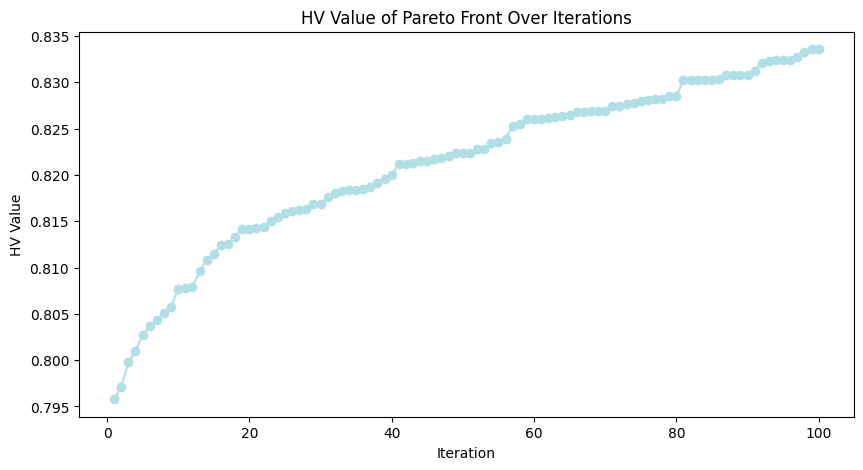

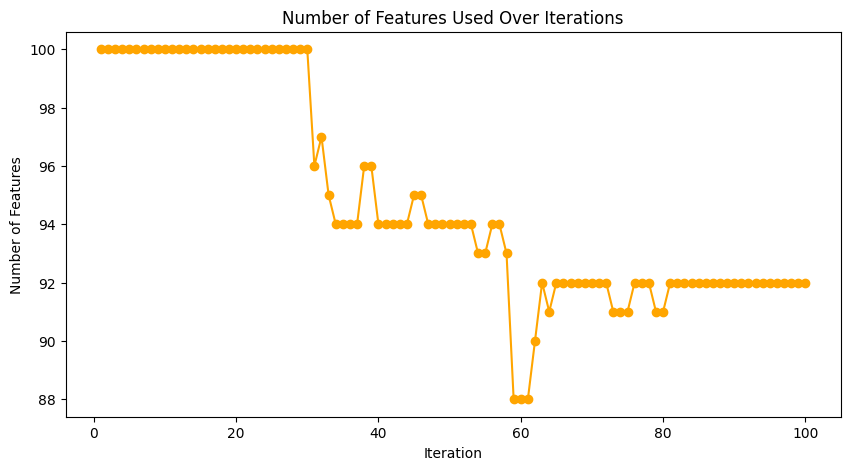

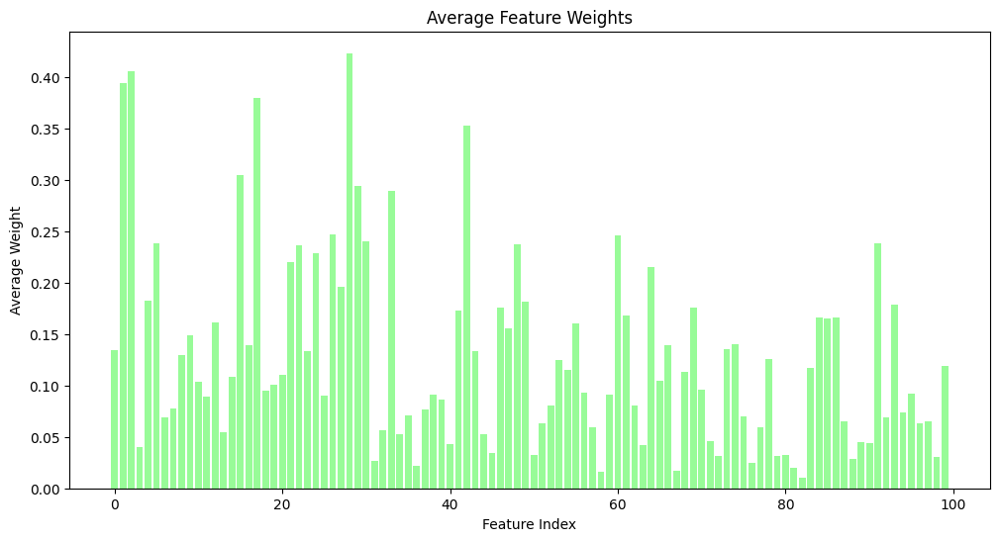

Total population members: 100
Pareto front members: 23


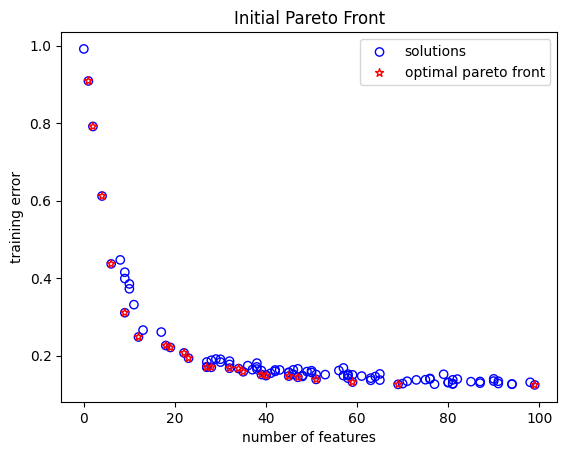

Total population members: 100
Pareto front members: 28


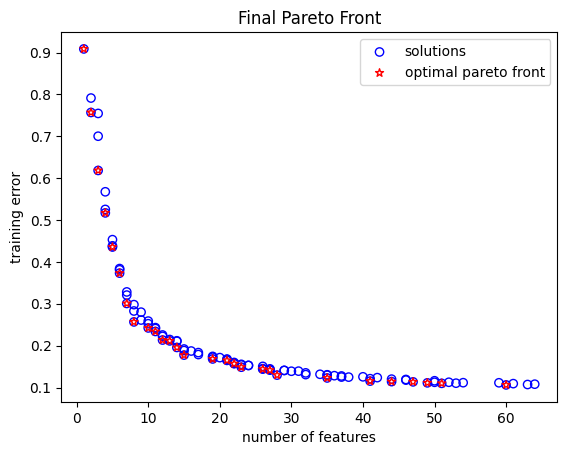

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 14.0
corresponding weights:  [0.         0.27246354 0.24163842 0.         0.         0.
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0.         0.07385561 0.06549997 0.         0.         0.
 0.         0.         0.         0.        ] ...
classification error on train sets: 0.19573200852876282
classification error on test sets: 0.23309644666078877
solution 1:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.9086361245815112
classification error on test sets: 0.9078139885775189
solution 2:
number of selected features is: 15.0
corresponding weights:  [0.76528113 0.63655401 0.54327789 0.         0.         0.
 0.         0.         0.         0.35718605] ...
correspondin

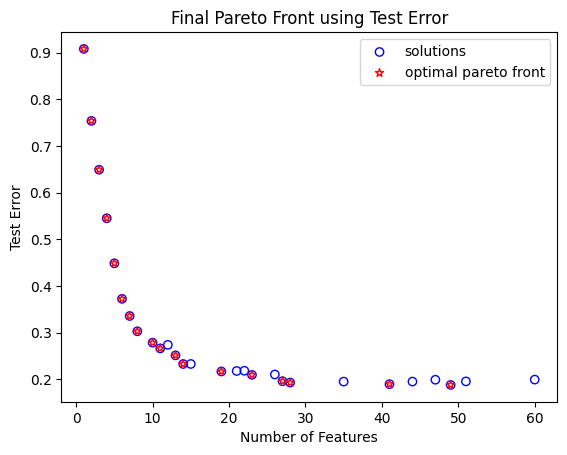

Final PF Results:  {0: {'num_selected_features': 14.0, 'feature_weights': [0.0, 0.27246354487484953, 0.2416384189446042, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.272851359839051, 0.0, 0.0, 0.0, 0.3294552068159788, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2486629907406772, 0.0, 0.0, 0.0, 0.1702519233934128, 0.0, 0.11413710320537784, 0.0, 0.0, 0.0, 0.3911232229416724, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.30371849748154695, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.37301597830779654, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.08293681458519098, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3646484155823817, 0.4036000470081994, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.12063456455340554, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.19573200852876282, 'test_error': 0.23309644666078877}, 1: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

In [63]:
# Read top 100 features
top_100 = pd.read_csv("Top_NSGA2_Features.csv").head(100)
print(top_100)
# Read validation data
validation_path = "KimiaNet_Data/kimianet_validation_data_averaged_feature_vectors.csv"
validation = pd.read_csv(validation_path)
dclass = validation.columns[0]
x = validation.drop(columns=[dclass])
y = validation[dclass]
featureNames = []
for i in top_100['Feature'].tolist():
    featureNames.append(x.columns[i-1]) #featureNames has feature names from 1-1024, not indices; so, to access feature x, we need to go to index i-1
print(featureNames)
x = x[featureNames]
# Read test data
test_path = "KimiaNet_Data/kimianet_test_data_averaged_feature_vectors.csv"
test = pd.read_csv(test_path)
dclass = test.columns[0]
xtest = test.drop(columns=[dclass])
ytest = test[dclass]
featureNames = []
for i in top_100['Feature'].tolist():
    featureNames.append(xtest.columns[i-1]) 
xtest = xtest[featureNames]

# Run GDE3 algorithm 10 times
epsilon = 0.01
total_features = x.shape[1] 
popsize=100
print("TOTAL NUMBER OF FEATURES: ", total_features)
for run in range(10):
    print("*"*50, f"RUN {run+1}", "*"*50)
    dataset_name = f"RUN {run+1}: GDE3 Kimianet Feature Weighting"

    custom_population = generate_individuals(total_features, epsilon, popsize)
    pop = Population.new("X", custom_population)

    problem = MyProblem(x,y,epsilon)
    Evaluator().eval(problem, pop) # evaluate initial population
    algorithm = GDE3(pop_size=popsize,
                    variant="DE/rand/1/bin", # selection = random, crossover = binary
                    CR=0.5, # crossover parameter [0,1]
                    F=(0.0, 0.9), # scale factor or mutation parameter (0,2]
                    sampling = pop
                    )
    res = minimize(problem,
                    algorithm,
                    ("n_gen", 100),
                    verbose=True, # prints results if true
                    save_history=True
                    )
    '''
    ALGORITHM DESCRIPTION
    The algorithm generates new solutions for the next generation by iteratively selecting each solution in the current generation (called the target vector) and performing the following steps:
    1. Selecting two random solutions from the current generation to calculate a difference vector.
    2. Scaling the difference vector by a factor F.
    3. Adding the scaled difference vector to a third random solution (called the base vector) to form a mutant vector, which becomes a candidate solution.
    4. Performing crossover between the target vector (current solution) and the mutant vector to form a trial vector.
    5. Evaluating the trial vector to determine if it should replace the target vector in the next generation (based on its fitness/performance).
    This process is repeated for each solution in the current generation.
    PARAMS DESCRIPTION
    pop_size: number of individuals in each generation
    variant: format of DE strategy as "DE/selection/n/crossover", where
        1. selection = how the base vector is selected when forming the mutant vector 
            (e.g., rand = base vector is chose randomly, best = best performing solution in current generation is always chosen as the base vector)
        2. n = number of difference vectors used for mutation 
            (e.g., 1 = one difference vector is used)
        3. crossover = how crossover is performed between the target vector and mutant vector to form the trial vector
            (e.g., bin = each component (i.e., each feature weight) of the offspring is selected either from the mutant vector or from the current parent vector based on probability CR)
    CR: crossover probability of the trial vector inheriting a component from the mutant vector (higher CR = more likely to inherit mutant component)
    F: scaling factor of difference vector; higher value leads to larger mutations and more exploration, lower value leads to smaller mutations and more exploitation (fine-tuning)
        (e.g., (0.0-0.9) means a random scaling factor will be chosen between 0 - 0.9 for each candidate solution in the next generation)
    sampling: used to manually input an initial generation
    '''

    final_pf_results, final_test_pf_results, lowest_train_error_solution, lowest_test_error_solution, hv_test, hv_training = visualize(res, x, y, xtest, ytest, epsilon)
    store_results(dataset_name, final_pf_results, final_test_pf_results, lowest_train_error_solution, lowest_test_error_solution, hv_test, hv_training, epsilon, featureNames)

TOTAL NUMBER OF FEATURES:  50
************************************************** RUN 1 **************************************************
INDIVIDUAL 1, 20 features: [0.4431918  0.         0.         0.37536978 0.         0.
 0.         0.         0.         0.95230069]...
INDIVIDUAL 2, 26 features: [0.         0.         0.         0.46919765 0.63172907 0.97303935
 0.76916288 0.         0.         0.        ]...
INDIVIDUAL 3, 7 features: [0.         0.92834013 0.         0.         0.         0.
 0.         0.         0.         0.03611202]...
INDIVIDUAL 4, 14 features: [0.3206698  0.         0.         0.61905619 0.         0.
 0.91395893 0.         0.         0.9282299 ]...
INDIVIDUAL 5, 40 features: [0.         0.05433088 0.07810599 0.18226173 0.68724512 0.20658704
 0.1247691  0.36935457 0.09637903 0.        ]...
INDIVIDUAL 6, 42 features: [0.27486608 0.51859888 0.         0.64596046 0.96469981 0.62129941
 0.78058002 0.         0.91511908 0.        ]...
INDIVIDUAL 7, 32 features: [0

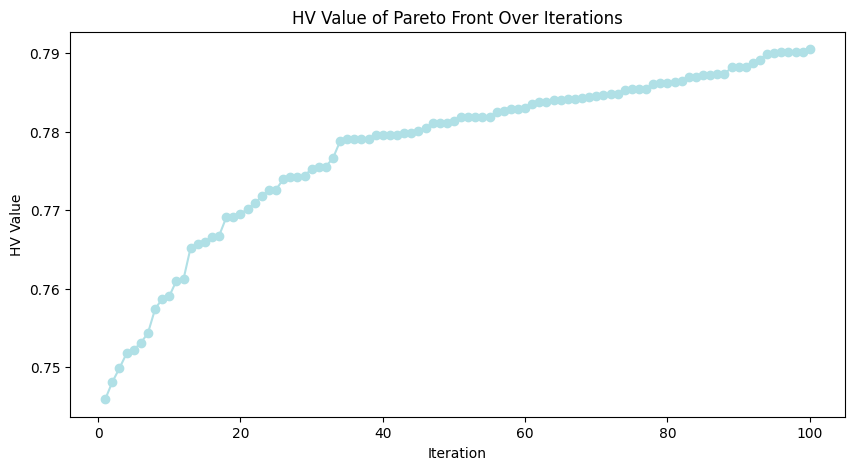

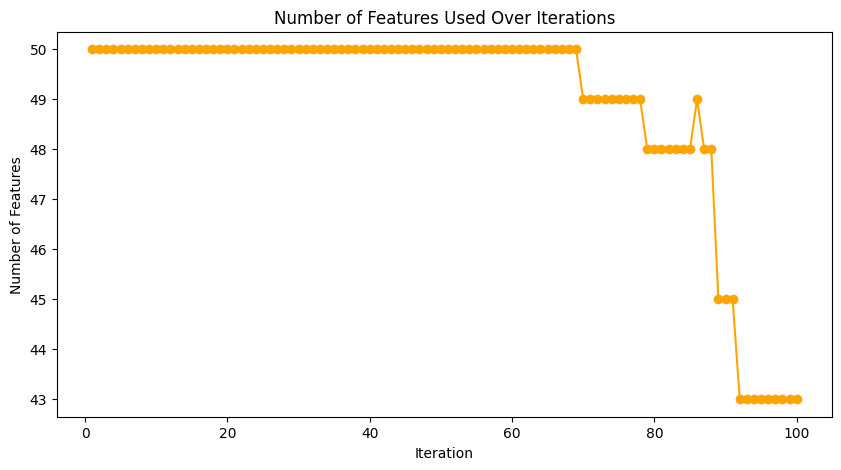

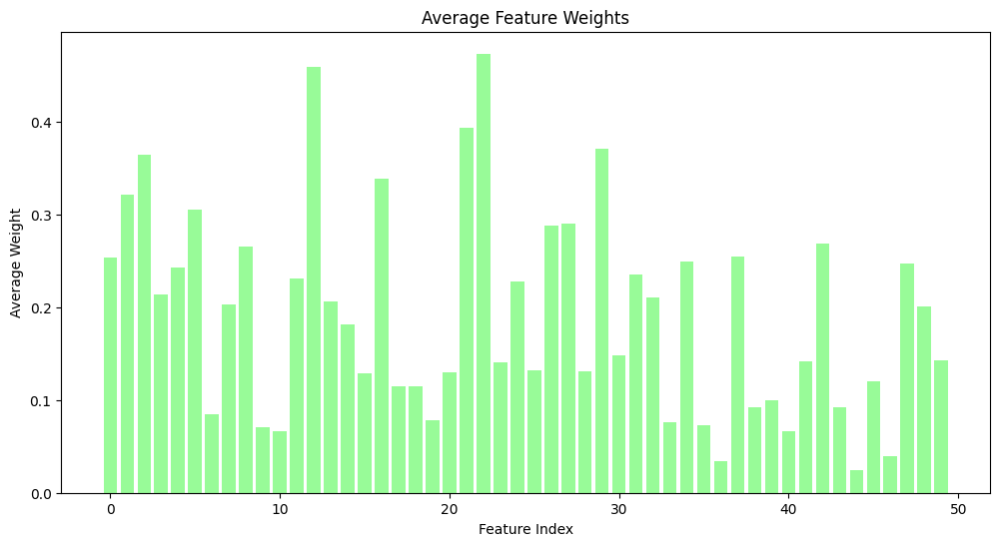

Total population members: 100
Pareto front members: 20


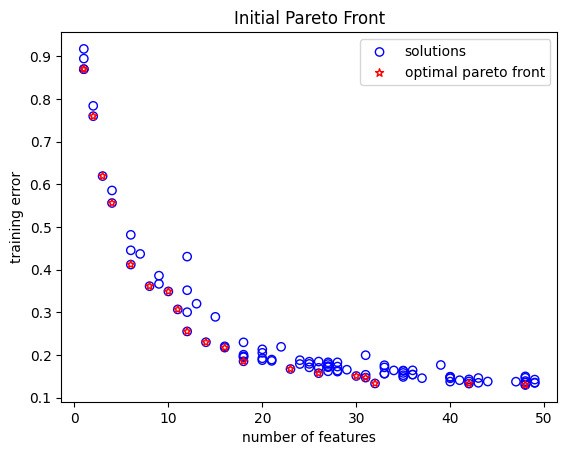

Total population members: 100
Pareto front members: 22


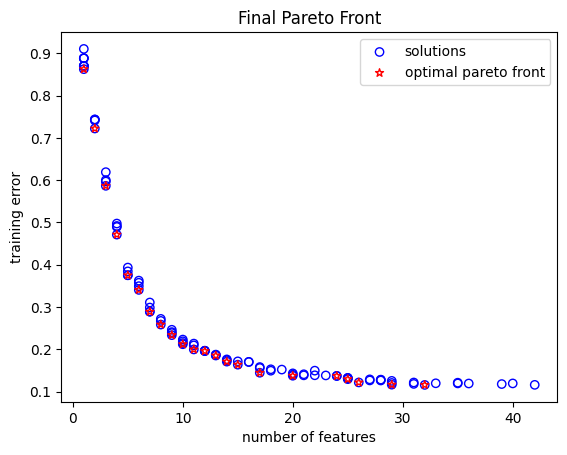

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 3.0
corresponding weights:  [0.         0.1797339  0.         0.         0.         0.11236419
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0.         0.46520905 0.         0.         0.         0.2908346
 0.         0.         0.         0.        ] ...
classification error on train sets: 0.586753750743631
classification error on test sets: 0.6273493894464848
solution 1:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.8628120538158484
classification error on test sets: 0.8898127569138303
solution 2:
number of selected features is: 6.0
corresponding weights:  [0.59313512 0.         0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
co

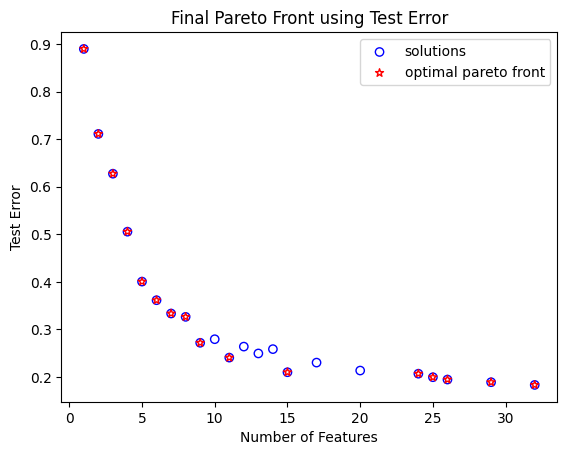

Final PF Results:  {0: {'num_selected_features': 3.0, 'feature_weights': [0.0, 0.17973389980882112, 0.0, 0.0, 0.0, 0.11236418574042689, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.09425273783415943, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.586753750743631, 'test_error': 0.6273493894464848}, 1: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.09425273783415943, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.8628120538158484, 'test_error': 0.8898127569138303}, 2: {'num_selected_features': 6.0, 'feature_weights': [0.593135119110267, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5990432264674037, 0.0, 0.0, 0.0, 0.0,

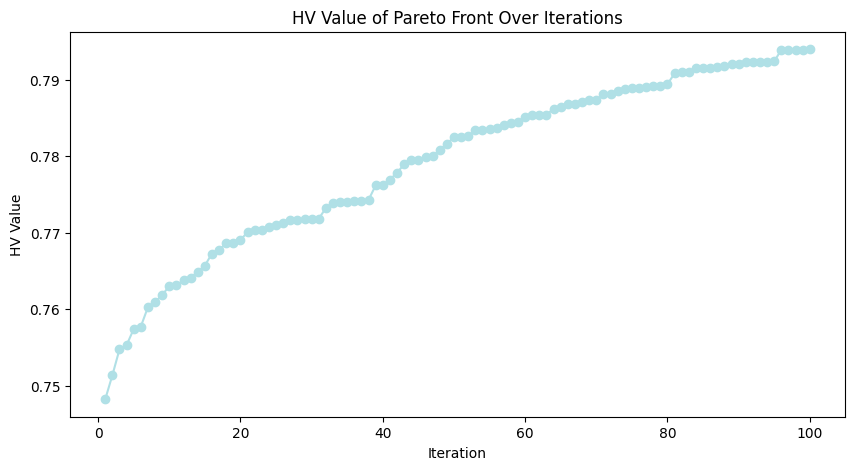

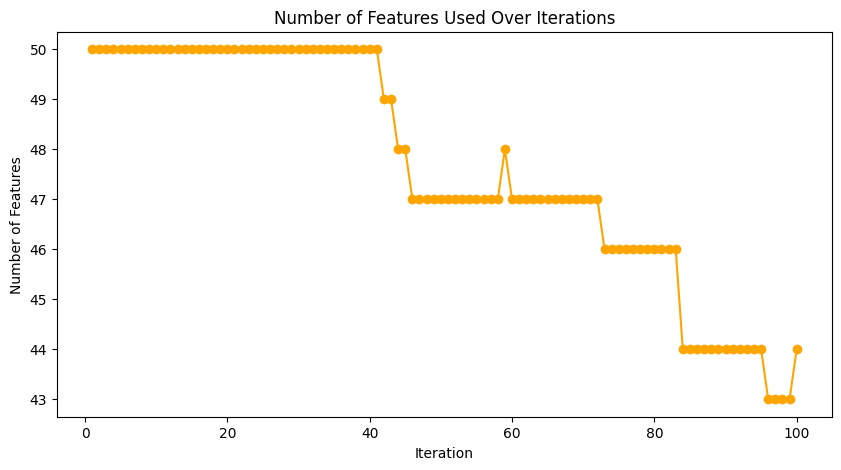

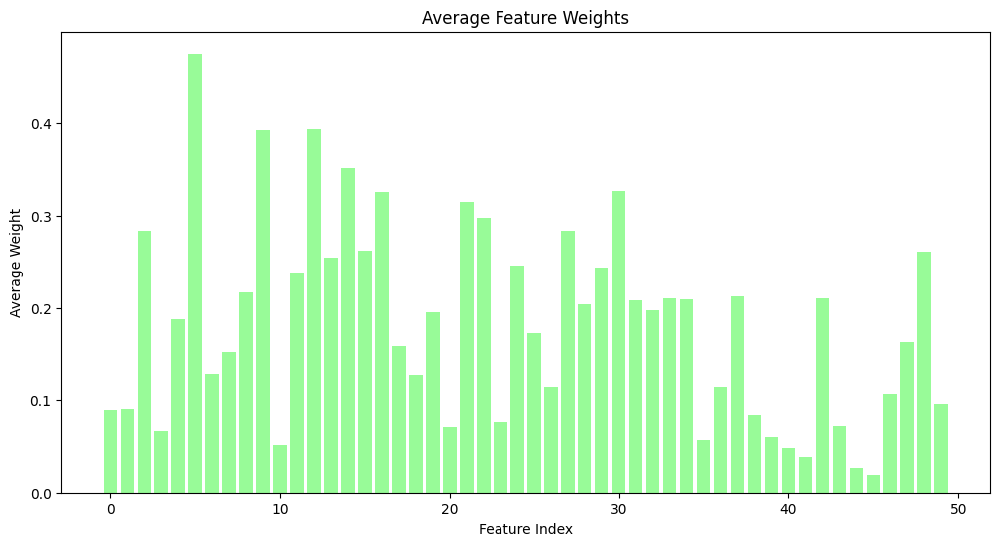

Total population members: 100
Pareto front members: 20


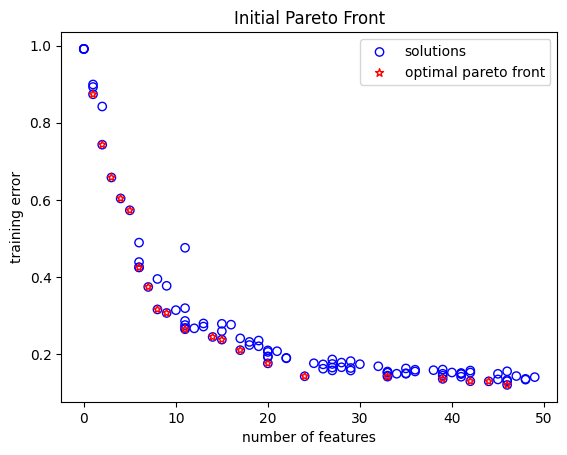

Total population members: 100
Pareto front members: 27


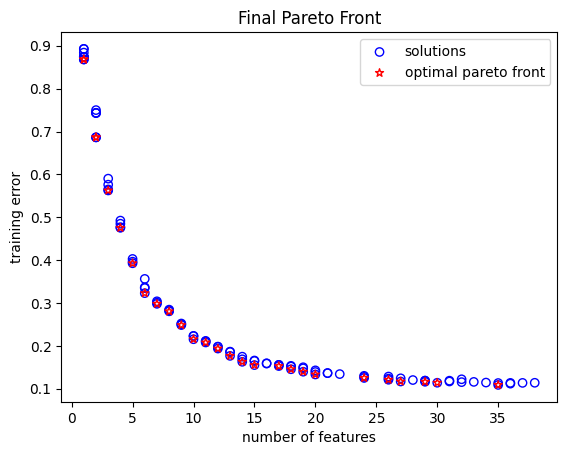

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 6.0
corresponding weights:  [0.         0.43325872 0.         0.         0.         0.
 0.         0.50169585 0.         0.        ] ...
corresponding normalized weights:  [0.         0.12480343 0.         0.         0.         0.
 0.         0.14451726 0.         0.        ] ...
classification error on train sets: 0.323045414671138
classification error on test sets: 0.39023861907225543
solution 1:
number of selected features is: 19.0
corresponding weights:  [0.         0.         0.32474491 0.         0.         0.3689466
 0.         0.59749283 0.68621541 0.69732271] ...
corresponding normalized weights:  [0.         0.         0.02891736 0.         0.         0.03285336
 0.         0.05320458 0.06110501 0.06209407] ...
classification error on train sets: 0.13975841945530942
classification error on test sets: 0.22634856413688642
solution 2:
number of selected fe

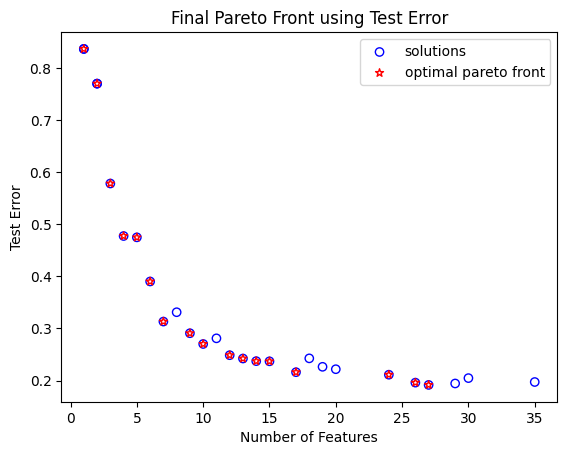

Final PF Results:  {0: {'num_selected_features': 6.0, 'feature_weights': [0.0, 0.43325871554818696, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5016958453961813, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6413820781512669, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6595216862025228, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6077947671935686, 0.0, 0.0, 0.0, 0.6278758721118957, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.323045414671138, 'test_error': 0.39023861907225543}, 1: {'num_selected_features': 19.0, 'feature_weights': [0.0, 0.0, 0.3247449120081172, 0.0, 0.0, 0.36894659671229235, 0.0, 0.597492829688372, 0.6862154094743093, 0.6973227084442285, 0.0, 0.0, 0.9969816262588006, 0.0, 0.9661726270029417, 0.0, 0.0, 0.0, 0.0, 0.5244838616017877, 0.0, 0.0, 0.6290891878792167, 0.0, 0.6437286116004103, 0.0, 0.0, 0.7879738803170704, 0.6345017280558982, 0.7148566191951053, 0.3440018646195461, 0.4228122980992004, 0.7032822859090779, 0.35510046038208826, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

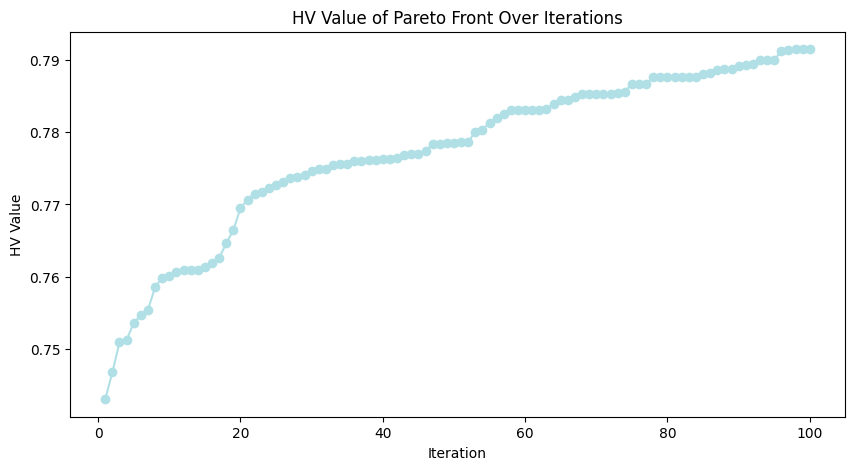

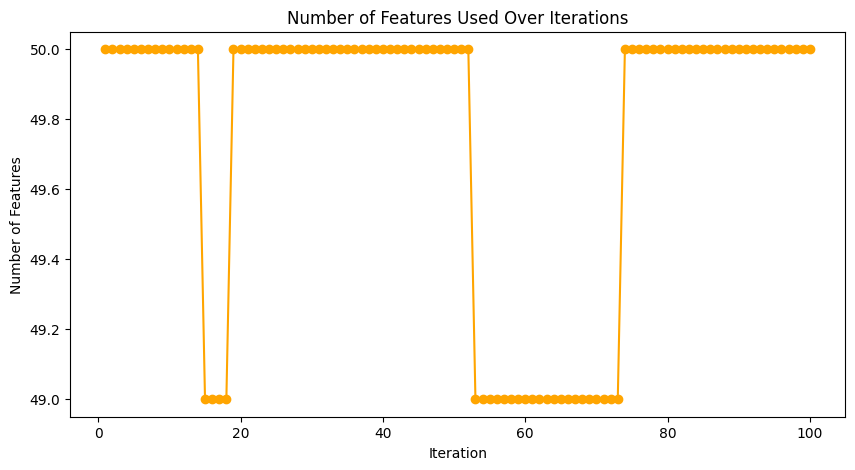

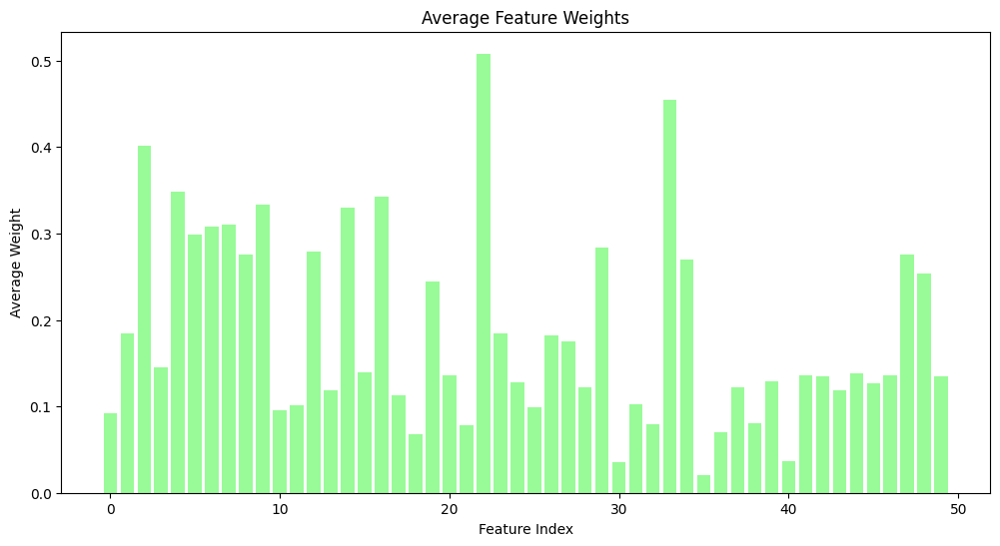

Total population members: 100
Pareto front members: 26


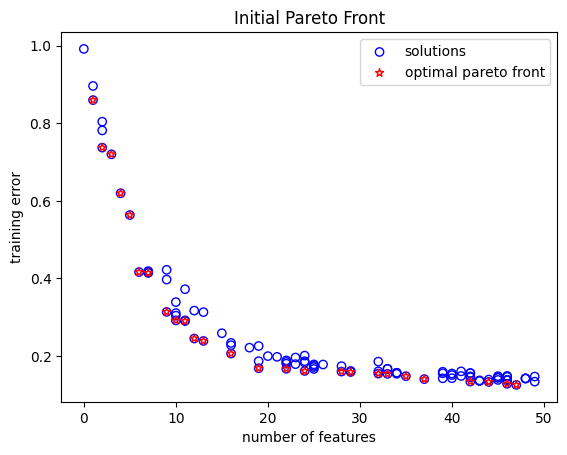

Total population members: 100
Pareto front members: 26


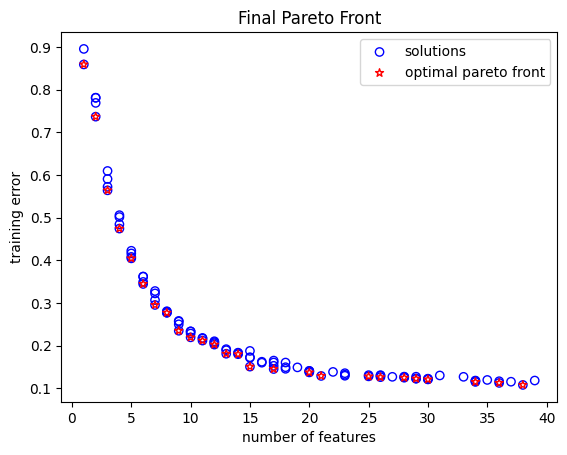

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 2.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.7369376521794782
classification error on test sets: 0.6948891871132526
solution 1:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.8594761613627901
classification error on test sets: 0.9127240052683039
solution 2:
number of selected features is: 4.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.47440335629450703
classification error on test sets: 0.46516225993445637
solution 3:
number of selected features is: 3.0
corre

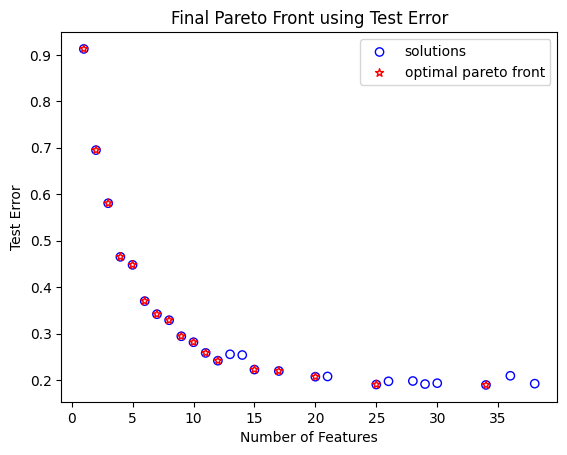

Final PF Results:  {0: {'num_selected_features': 2.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.9672916406067864, 0.8372515984491896, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.7369376521794782, 'test_error': 0.6948891871132526}, 1: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.27028730685456837, 0.0, 0.0, 0.0], 'train_error': 0.8594761613627901, 'test_error': 0.9127240052683039}, 2: {'num_selected_features': 4.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7499087976037465, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

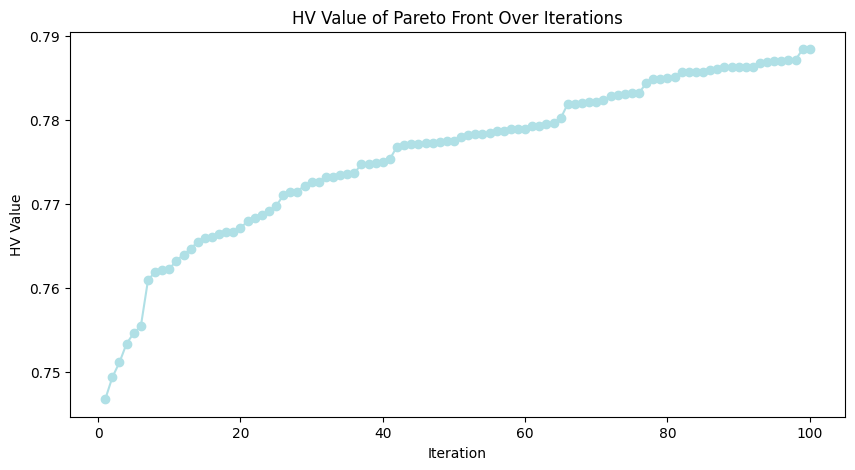

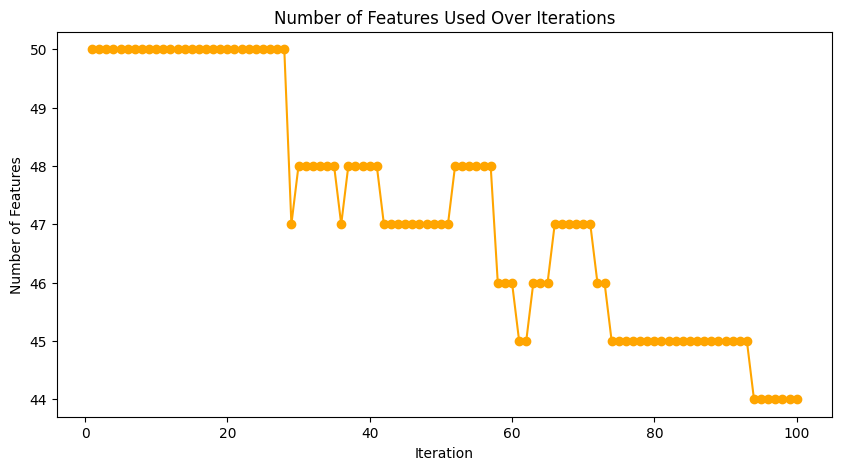

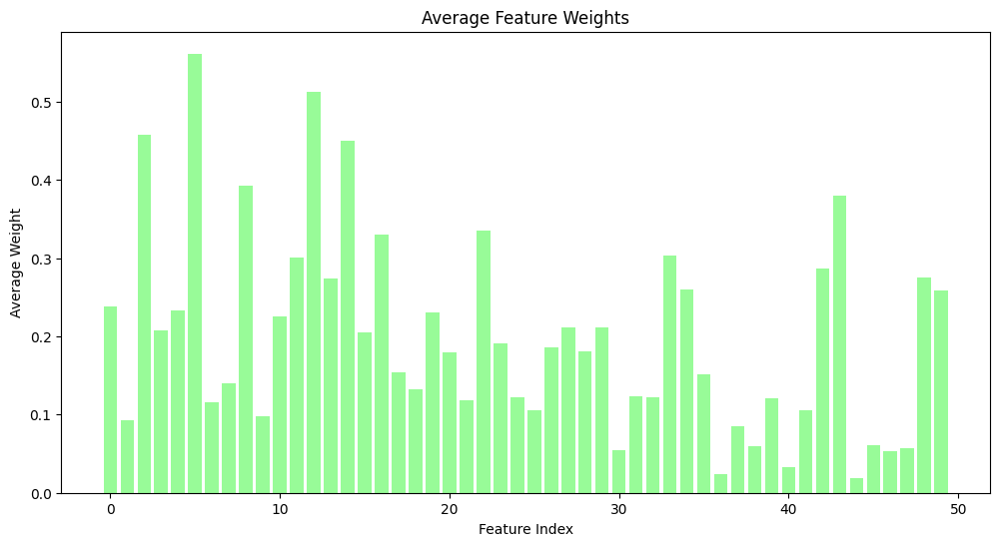

Total population members: 100
Pareto front members: 18


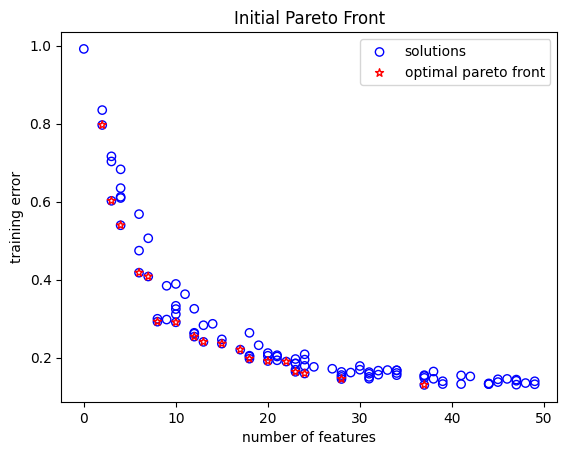

Total population members: 100
Pareto front members: 24


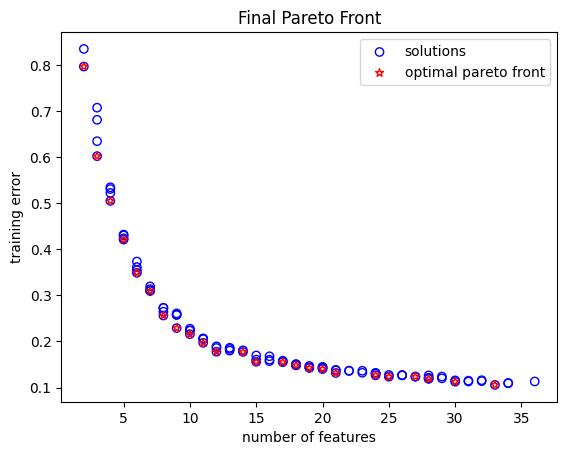

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 2.0
corresponding weights:  [0.         0.         0.02767838 0.         0.         0.
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0.         0.         0.15153762 0.         0.         0.
 0.         0.         0.         0.        ] ...
classification error on train sets: 0.7962868713936159
classification error on test sets: 0.7468082666925169
solution 1:
number of selected features is: 3.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.6019942371799444
classification error on test sets: 0.6228229833247731
solution 2:
number of selected features is: 7.0
corresponding weights:  [0.         0.         0.52707469 0.         0.         0.67198251
 0.         0.         0.         0.        ] ...
correspo

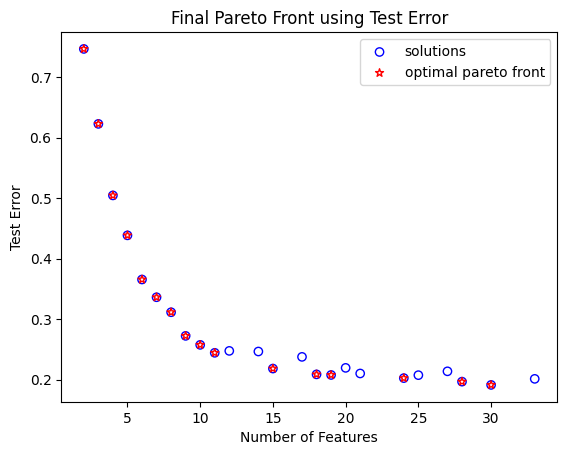

Final PF Results:  {0: {'num_selected_features': 2.0, 'feature_weights': [0.0, 0.0, 0.02767838117428608, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.15497184463713062, 0.0, 0.0], 'train_error': 0.7962868713936159, 'test_error': 0.7468082666925169}, 1: {'num_selected_features': 3.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8366885873364364, 0.8594191222218887, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6203198515959292, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.6019942371799444, 'test_error': 0.6228229833247731}, 2: {'num_selected_features': 7.0, 'feature_weights': [0.0, 0.0, 0.5270746861071618, 0.0, 0.0, 0.6719825070783016, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8454405

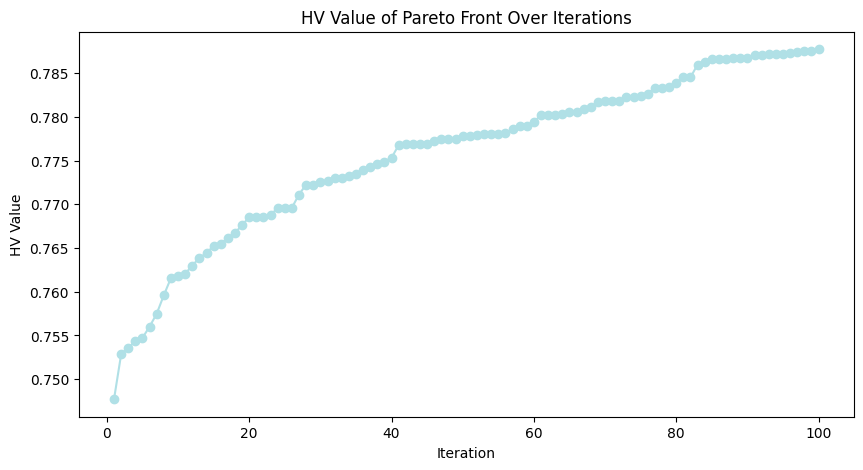

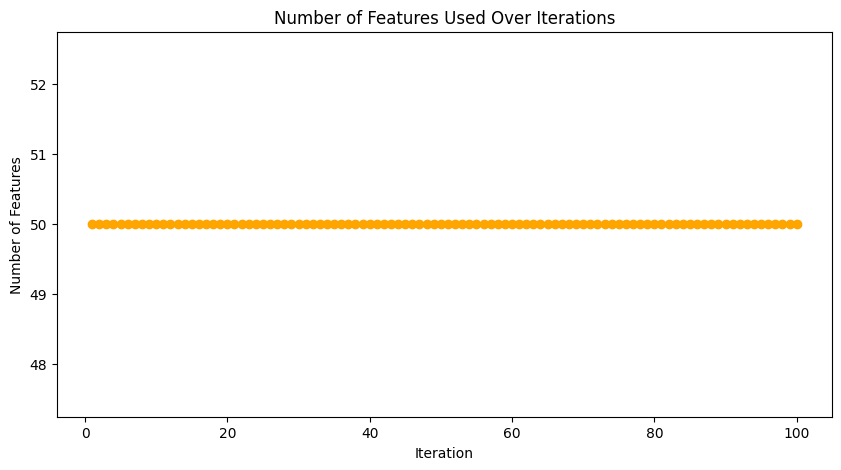

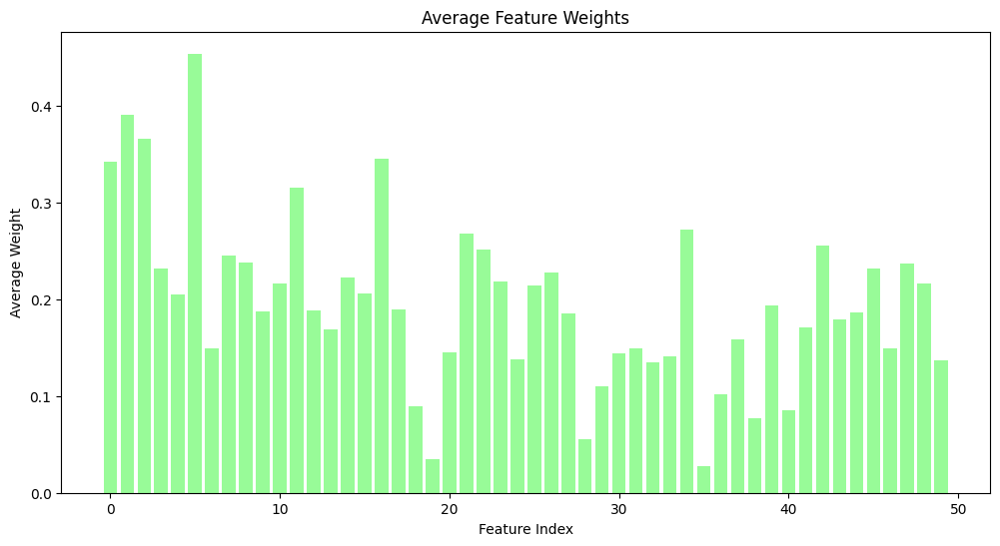

Total population members: 100
Pareto front members: 22


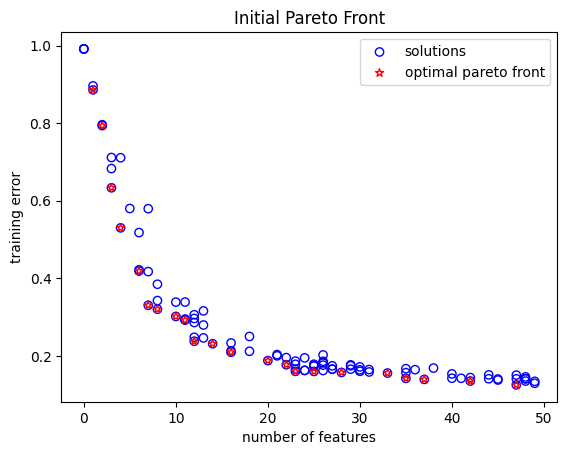

Total population members: 100
Pareto front members: 30


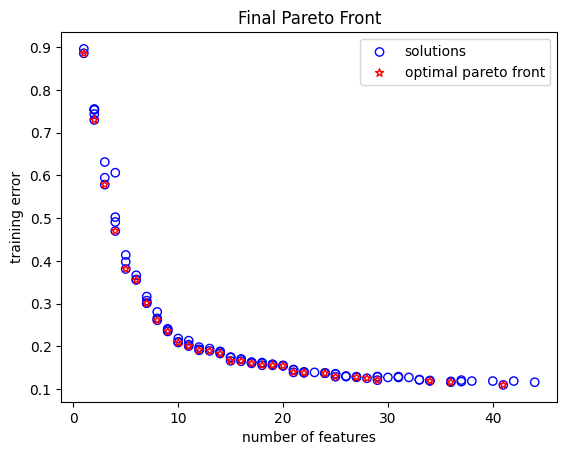

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.885657916705953
classification error on test sets: 0.8845769119976389
solution 1:
number of selected features is: 13.0
corresponding weights:  [0.91766707 0.79877999 0.         0.74781588 0.92377571 0.77417553
 0.         0.93357653 0.         0.        ] ...
corresponding normalized weights:  [0.10182644 0.08863445 0.         0.08297936 0.10250426 0.08590429
 0.         0.10359179 0.         0.        ] ...
classification error on train sets: 0.1896164431336671
classification error on test sets: 0.22487246535517003
solution 2:
number of selected features is: 6.0
corresponding weights:  [0.         0.         0.38808318 0.         0.29022246 0.
 0.         0.         0.         0.22619176] ...

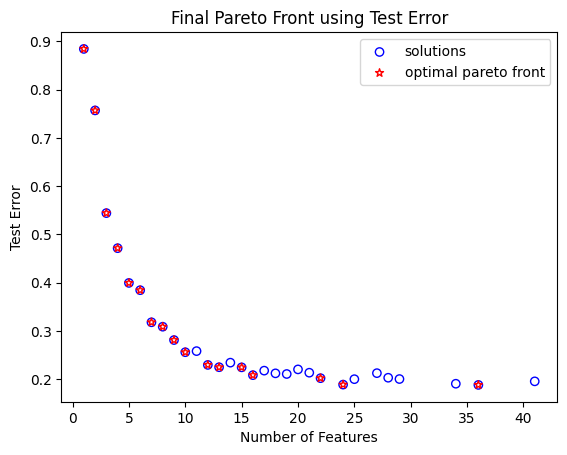

Final PF Results:  {0: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.012310489302657057, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.885657916705953, 'test_error': 0.8845769119976389}, 1: {'num_selected_features': 13.0, 'feature_weights': [0.9176670723197752, 0.7987799878701909, 0.0, 0.7478158751088166, 0.9237757130704819, 0.7741755323919498, 0.0, 0.9335765348892737, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7595203119609049, 0.5333250907939322, 0.0, 0.0, 0.48272499787516804, 0.8009331383628958, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.010491888334888256, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6555121013250094, 0.0, 0.6737727655037951, 0.0, 0.0], 'train_error': 0.1896164431336671, 'test_error': 0.22487246535517003}, 2: {'num_selec

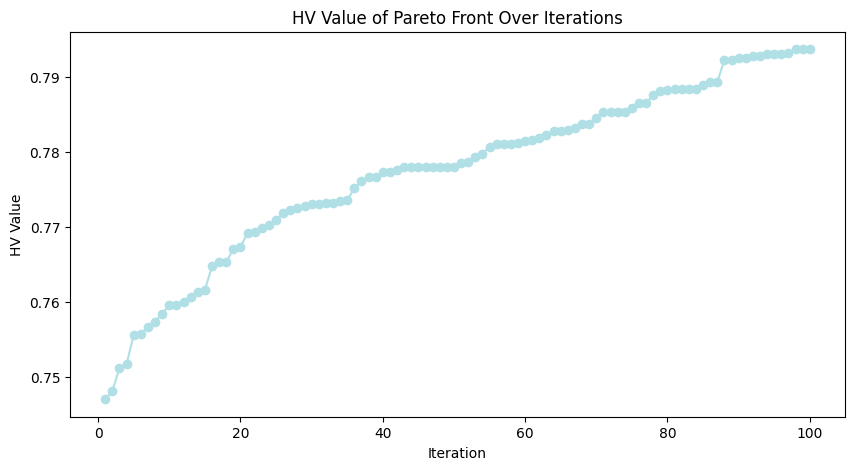

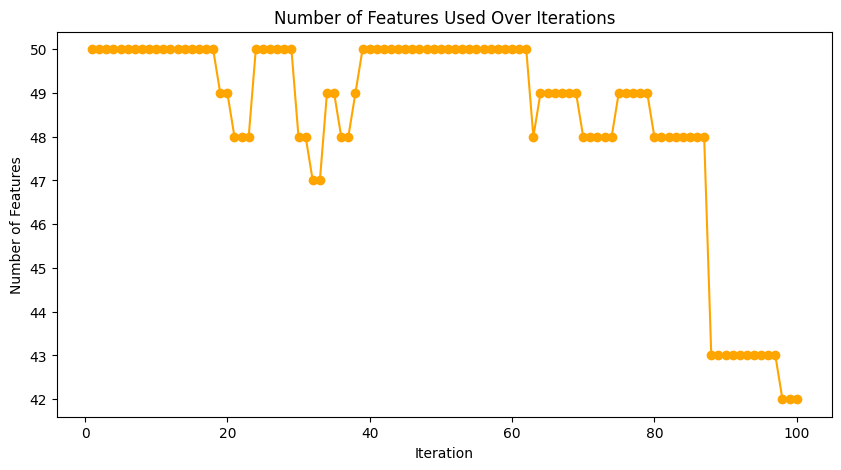

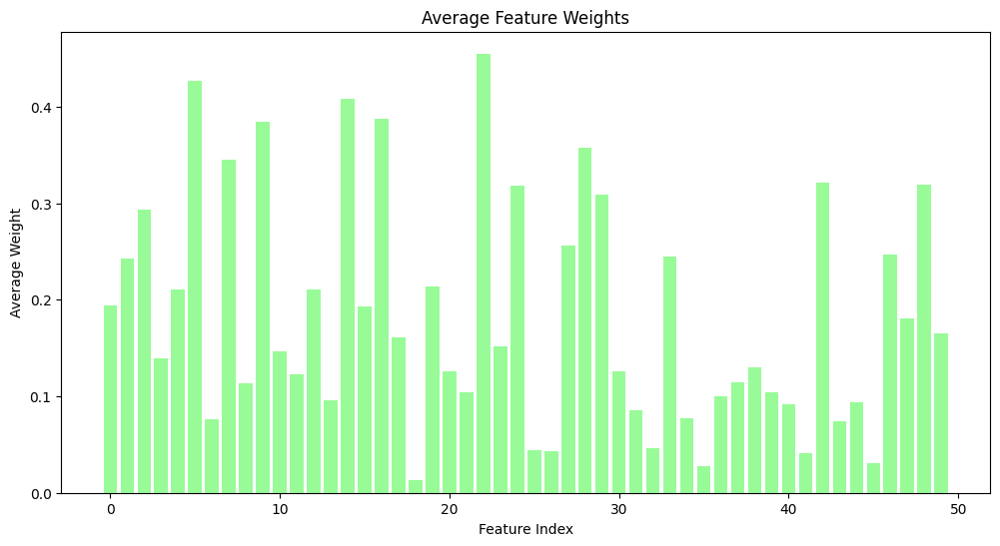

Total population members: 100
Pareto front members: 23


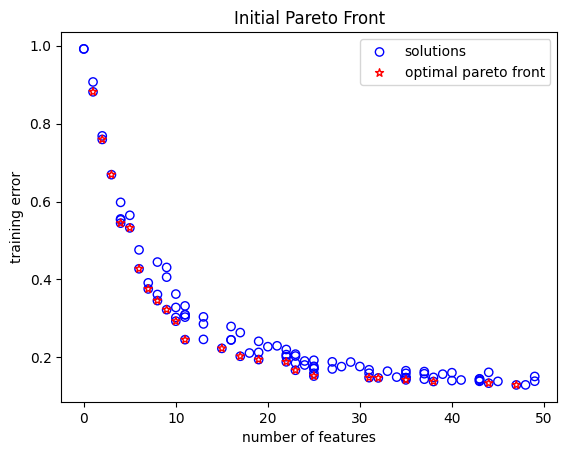

Total population members: 100
Pareto front members: 24


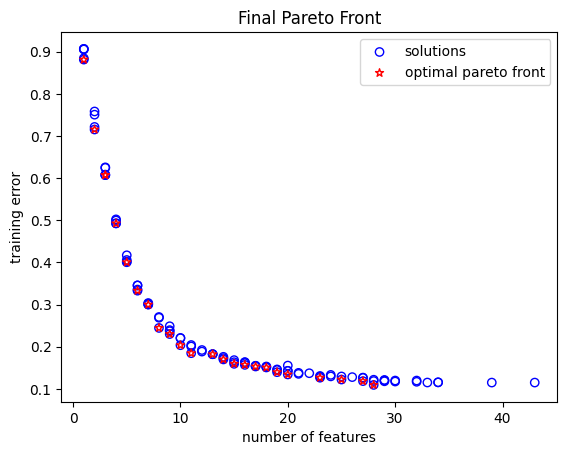

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.8812030334161925
classification error on test sets: 0.9061070769328197
solution 1:
number of selected features is: 16.0
corresponding weights:  [0.37809747 0.53736384 0.73259466 0.         0.64201833 0.64519111
 0.         0.54802505 0.         0.54391687] ...
corresponding normalized weights:  [0.04180882 0.05941999 0.081008   0.         0.07099236 0.07134319
 0.         0.06059888 0.         0.06014461] ...
classification error on train sets: 0.15699299591158167
classification error on test sets: 0.2291103000092407
solution 2:
number of selected features is: 18.0
corresponding weights:  [0.68430953 0.         0.         0.         0.44404457 0.84467226
 0.         0.         0.         0.471

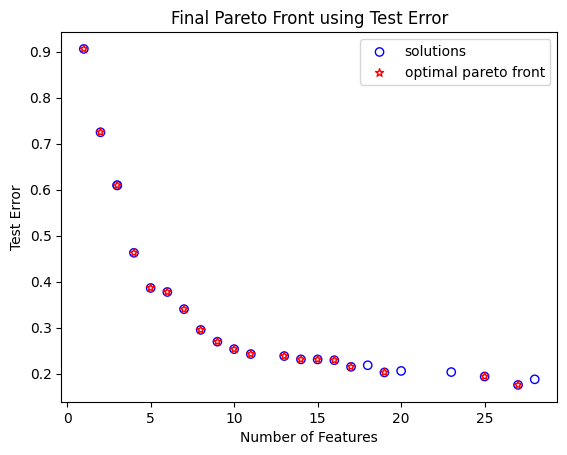

Final PF Results:  {0: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.15179165222119656, 0.0, 0.0], 'train_error': 0.8812030334161925, 'test_error': 0.9061070769328197}, 1: {'num_selected_features': 16.0, 'feature_weights': [0.3780974740218325, 0.5373638378084992, 0.7325946600834853, 0.0, 0.642018328530027, 0.6451911071973601, 0.0, 0.5480250530081326, 0.0, 0.5439168699650683, 0.0, 0.0, 0.5222758609501336, 0.0, 0.6560550768708263, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8502505922673894, 0.0, 0.0, 0.0, 0.0, 0.0, 0.882018467523609, 0.0, 0.0, 0.0, 0.0, 0.6299479293843901, 0.0, 0.0, 0.0, 0.05197803327322832, 0.2953492618936896, 0.0, 0.0, 0.0, 0.49443410196474236, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6339684728181095, 0.0], 'train_error': 0.15699299591158167, 'test_e

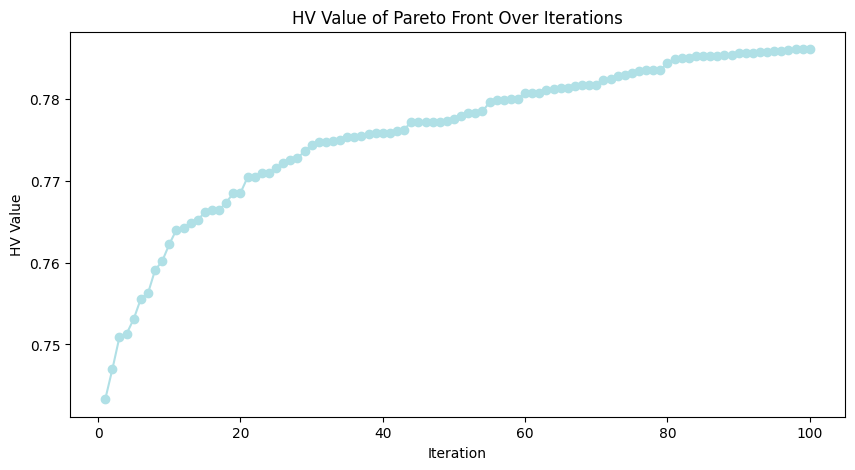

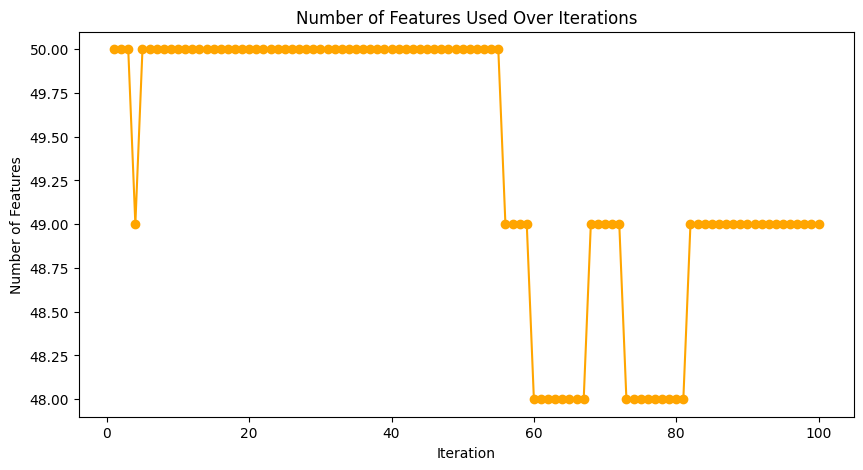

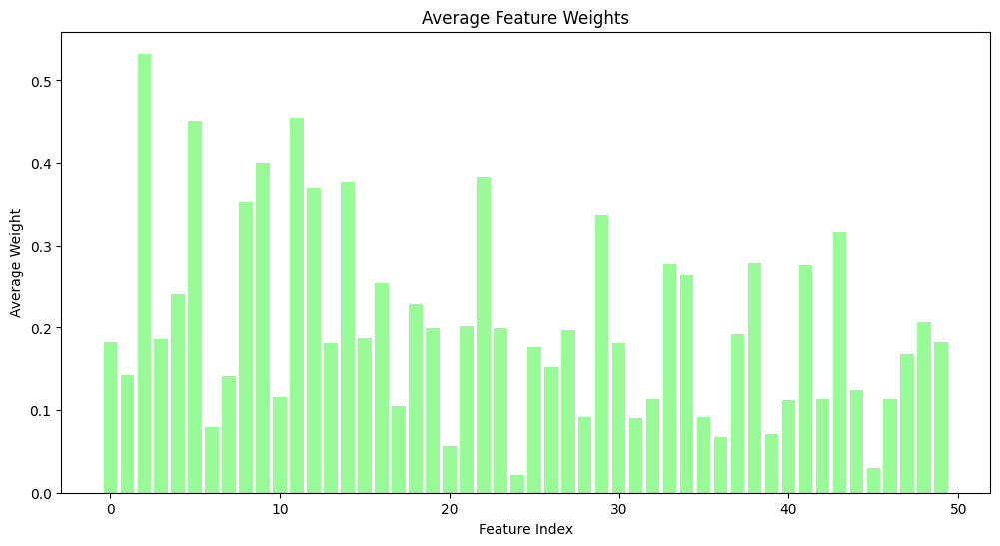

Total population members: 100
Pareto front members: 18


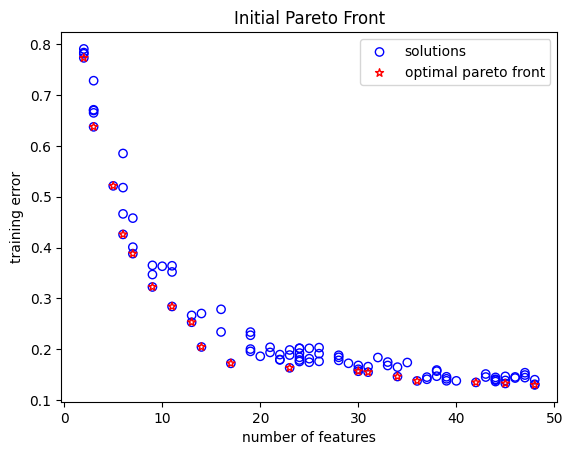

Total population members: 100
Pareto front members: 28


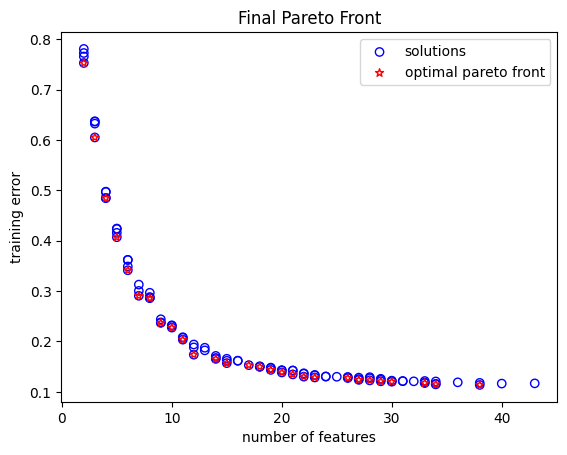

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 38.0
corresponding weights:  [0.4329044  0.28045765 0.90690423 0.         0.98982508 0.76897667
 0.         0.25659006 0.99146664 0.75349648] ...
corresponding normalized weights:  [0.01939729 0.01256656 0.04063596 0.         0.04435143 0.0344558
 0.         0.01149712 0.04442498 0.03376217] ...
classification error on train sets: 0.11367158905096153
classification error on test sets: 0.19648023695900962
solution 1:
number of selected features is: 7.0
corresponding weights:  [0.         0.39354529 0.3545984  0.         0.         0.
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0.         0.11590045 0.10443046 0.         0.         0.
 0.         0.         0.         0.        ] ...
classification error on train sets: 0.2907596101413884
classification error on test sets: 0.36558504367461153
solution 2:
number of selected f

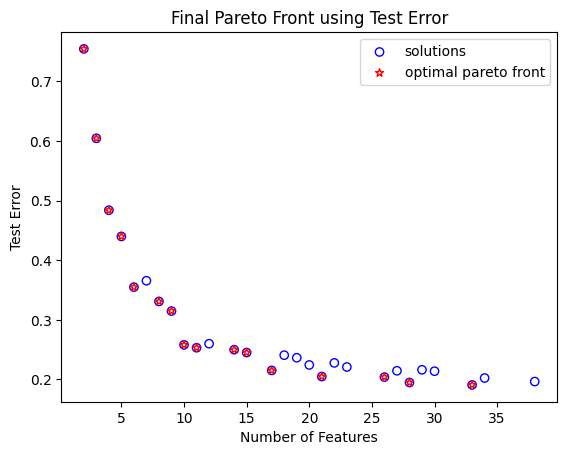

Final PF Results:  {0: {'num_selected_features': 38.0, 'feature_weights': [0.43290439609614806, 0.2804576467528408, 0.9069042283504299, 0.0, 0.9898250785078281, 0.7689766731226724, 0.0, 0.25659006146000074, 0.9914666394023488, 0.7534964822165704, 0.0, 0.296092935431957, 0.790116072948771, 0.5935919973899774, 0.9975229957675236, 0.9943488218863407, 0.9765011587841315, 0.5236100983332849, 0.24539153877025702, 0.4015012220663458, 0.01892437341552127, 0.0, 0.7834448276669673, 0.012855490193177416, 0.0, 0.5943035040311568, 0.7128554646437446, 0.0, 0.0, 0.9114810622117371, 0.3112579613141682, 0.0, 0.0, 0.7176276571104415, 0.7367786292106344, 0.015124651342644685, 0.0, 0.24011966438113008, 0.6754583103477119, 0.6320726720299933, 0.0, 0.7901531229660687, 0.4018645001207549, 0.2435439629904046, 0.7624280405802922, 0.0, 0.49112293664252554, 0.5616242075241371, 0.7012738645034627, 0.8041601279186092], 'train_error': 0.11367158905096153, 'test_error': 0.19648023695900962}, 1: {'num_selected_featur

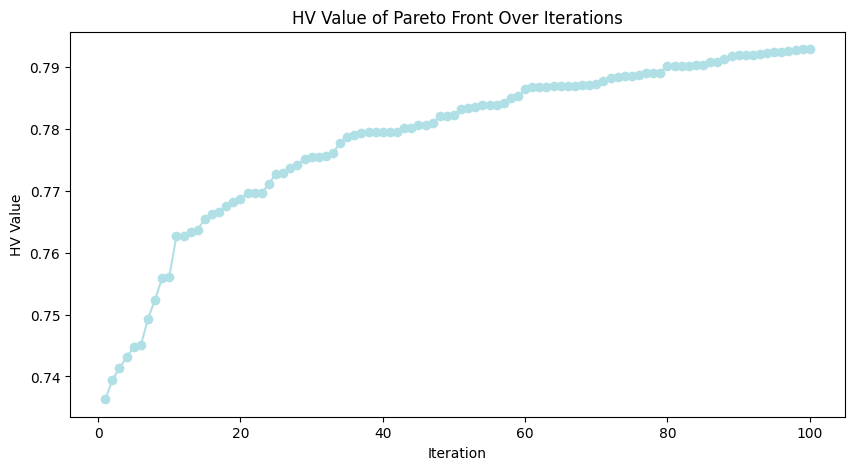

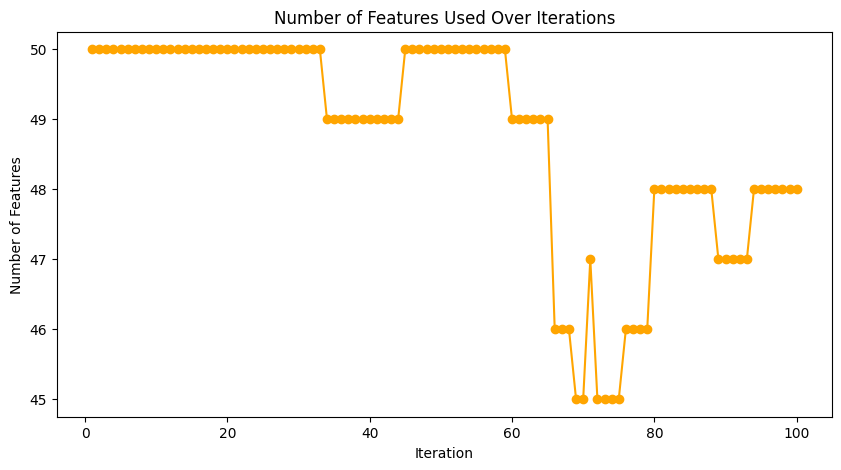

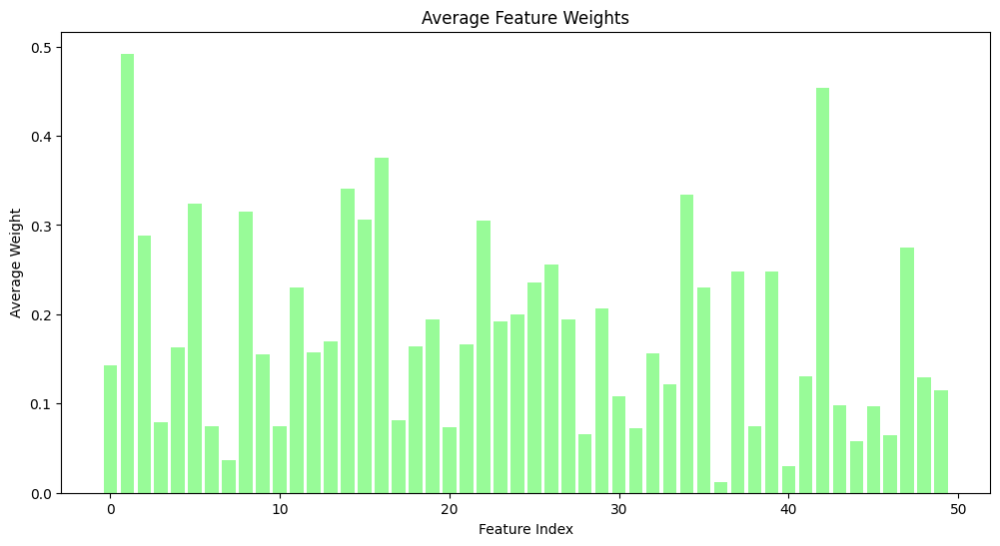

Total population members: 100
Pareto front members: 21


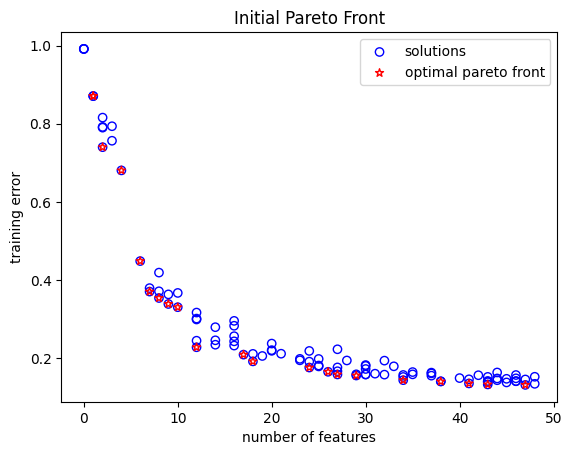

Total population members: 100
Pareto front members: 26


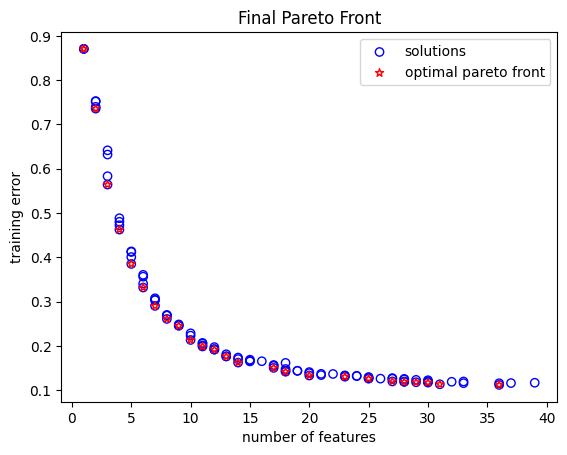

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.870651051601633
classification error on test sets: 0.8995574051213836
solution 1:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.870651051601633
classification error on test sets: 0.8995574051213836
solution 2:
number of selected features is: 23.0
corresponding weights:  [0.77935185 0.9141189  0.38083634 0.         0.74734389 0.66824843
 0.         0.         0.54114831 0.        ] ...
corresponding normalized weights:  [0.06244646 0.07324482 0.03051495 0.         0.05988178 0.05354417
 0.         0.         0.04336013 0.        ] ...
cla

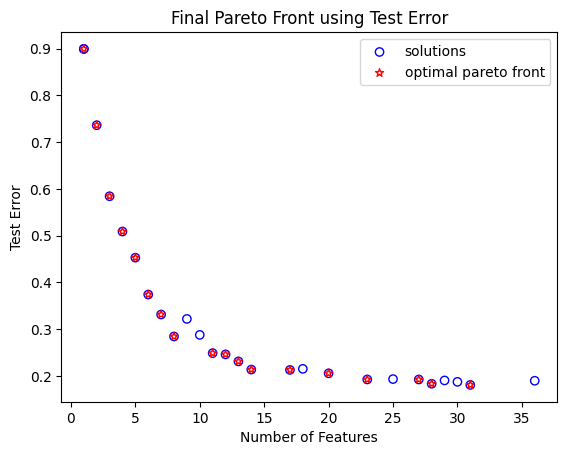

Final PF Results:  {0: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.26309212176194446, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.870651051601633, 'test_error': 0.8995574051213836}, 1: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.40117050503814905, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.870651051601633, 'test_error': 0.8995574051213836}, 2: {'num_selected_features': 23.0, 'feature_weights': [0.7793518485480433, 0.9141189026772859, 0.3808363391030953, 0.0, 0.7473438861139787, 0.6682484255283884, 0.0, 0.0, 0.5411483116693716, 0.0, 0.0, 

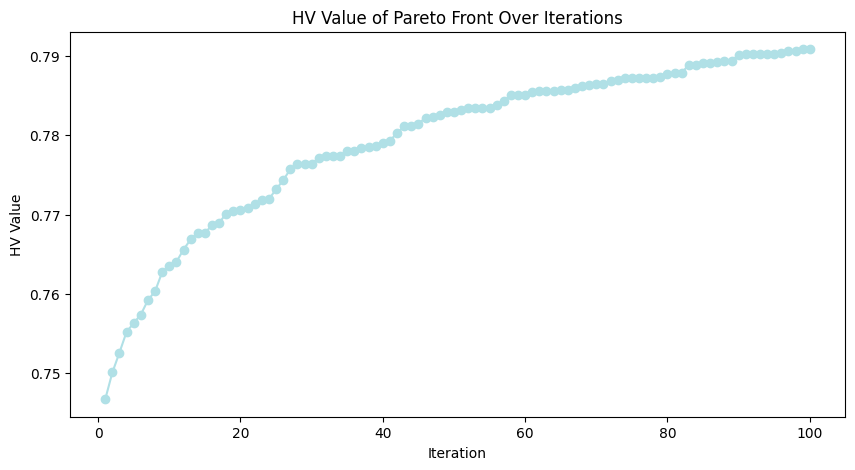

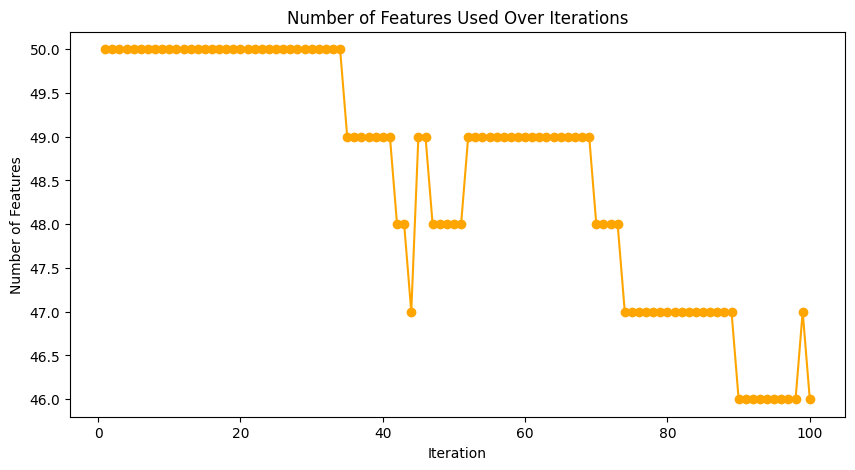

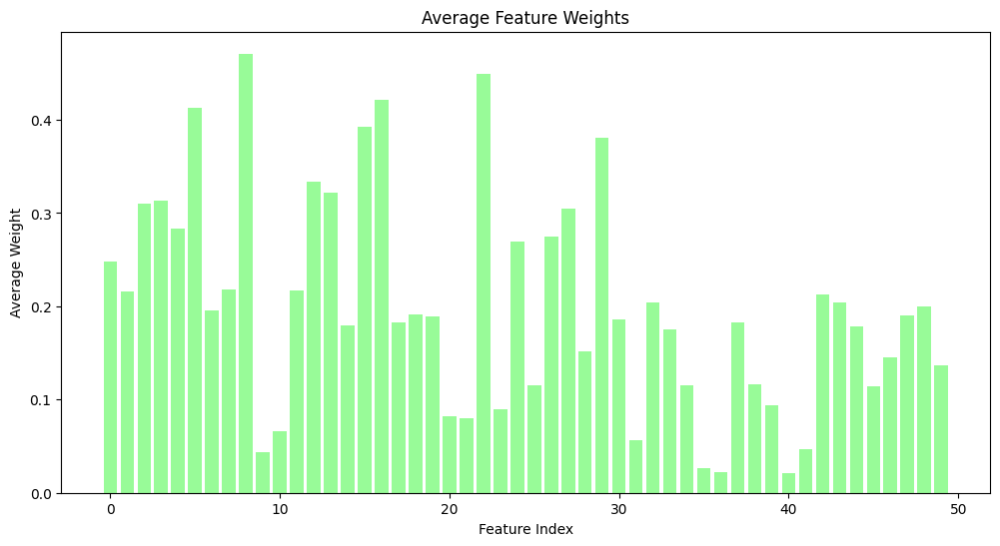

Total population members: 100
Pareto front members: 19


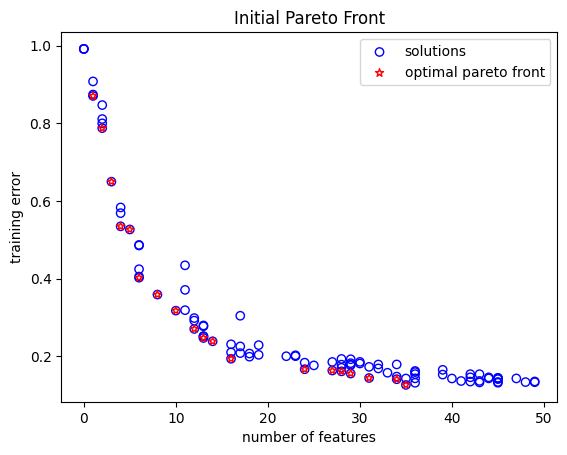

Total population members: 100
Pareto front members: 27


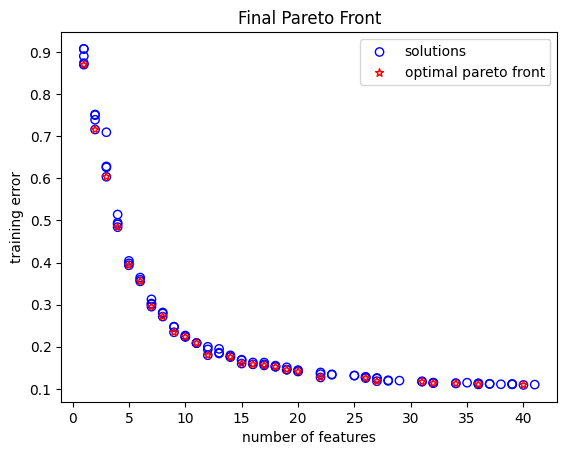

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 1.0
corresponding weights:  [0.         0.         0.24634843 0.         0.         0.
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.8701658728253405
classification error on test sets: 0.8763028041286546
solution 1:
number of selected features is: 6.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.35534589972730724
classification error on test sets: 0.3927749296079114
solution 2:
number of selected features is: 3.0
corresponding weights:  [0.         0.         0.18873357 0.         0.         0.
 0.39054818 0.         0.         0.        ] ...
corresponding normalized weights:  [0.         0.         0.2844527  0.         0.      

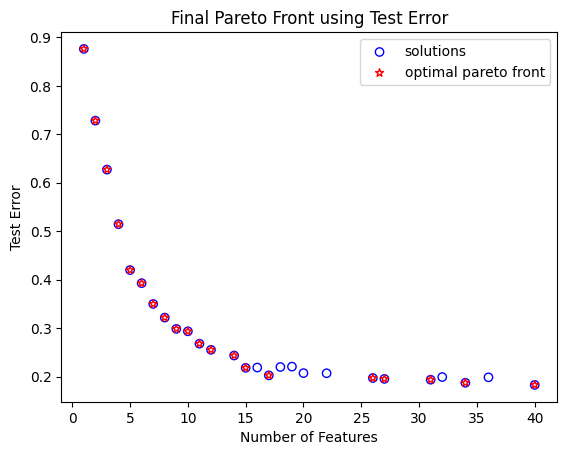

Final PF Results:  {0: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.24634842570398277, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.8701658728253405, 'test_error': 0.8763028041286546}, 1: {'num_selected_features': 6.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6173258440904626, 0.0, 0.0, 0.0, 0.0, 0.6585198309221885, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5105559307098225, 0.0, 0.0, 0.0, 0.7325987419263308, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5469063231140849, 0.0, 0.0, 0.0, 0.0, 0.734292357144704, 0.0], 'train_error': 0.35534589972730724, 'test_error': 0.3927749296079114}, 2: {'num_selected_features': 3.0, 'feature_weights': [0.0, 0.0, 0.1887335692345982, 0.0, 0.0, 0.0, 0.39054818459464946, 0.0,

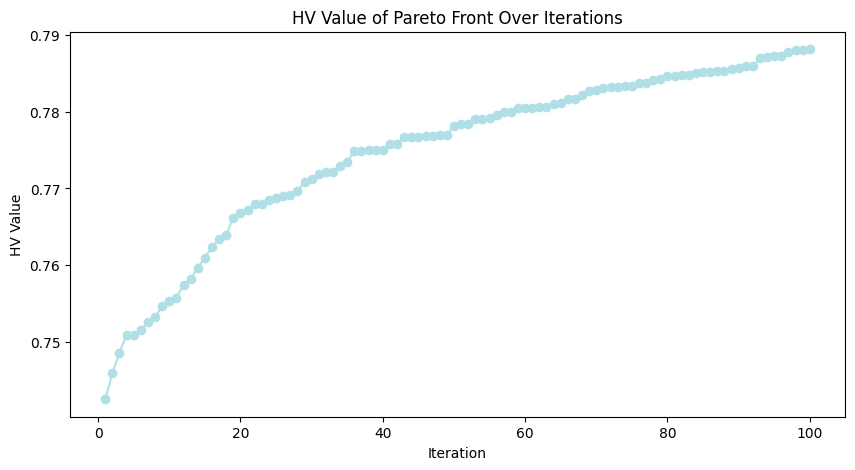

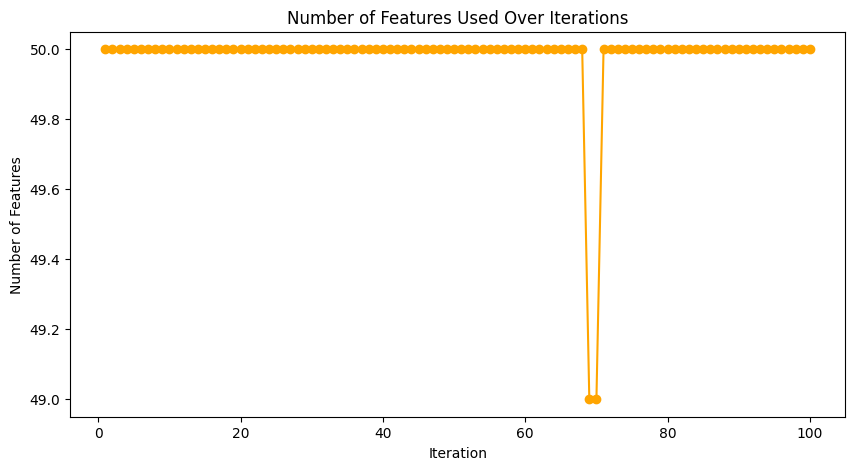

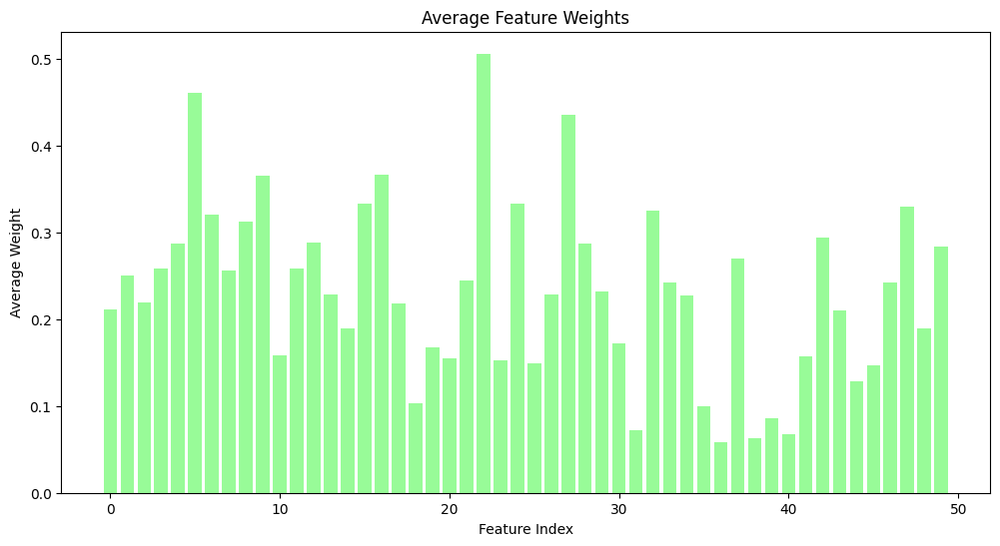

Total population members: 100
Pareto front members: 24


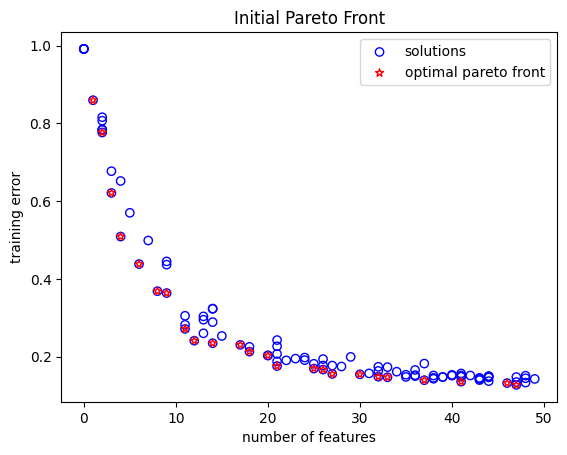

Total population members: 100
Pareto front members: 32


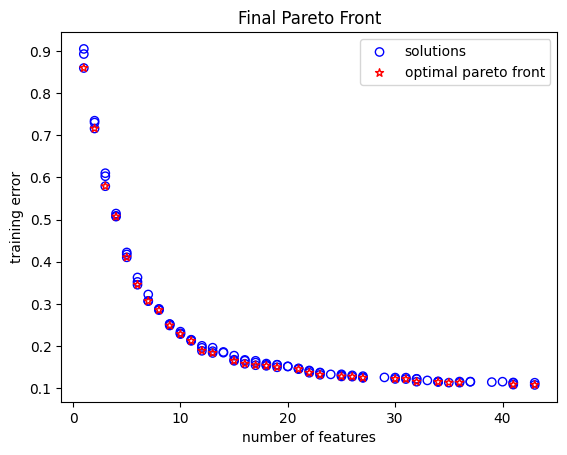

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.8594761613627901
classification error on test sets: 0.9127240052683039
solution 1:
number of selected features is: 5.0
corresponding weights:  [0.         0.34699882 0.         0.         0.         0.22579627
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0.         0.19127933 0.         0.         0.         0.12446774
 0.         0.         0.         0.        ] ...
classification error on train sets: 0.4104474713681404
classification error on test sets: 0.42831588980756974
solution 2:
number of selected features is: 22.0
corresponding weights:  [0.         0.         0.         0.77655868 0.37537965 0.09739006
 0.         0.7797968  0.55491659 0.9415

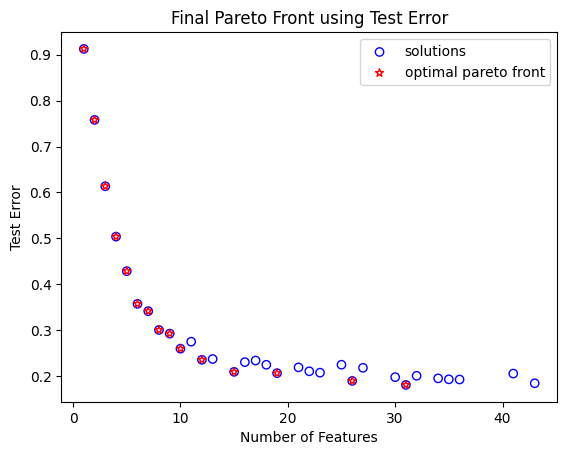

Final PF Results:  {0: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7655338616671794, 0.0, 0.0, 0.0], 'train_error': 0.8594761613627901, 'test_error': 0.9127240052683039}, 1: {'num_selected_features': 5.0, 'feature_weights': [0.0, 0.34699881638115376, 0.0, 0.0, 0.0, 0.22579626591441848, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7074788701302474, 0.2719594315660504, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2618612782785873, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.4104474713681404, 'test_error': 0.42831588980756974}, 2: {'num_selected_features': 22.0, 'feature_weights': [0.0, 0.0, 0.0, 0.7765586839862753, 0.37537965360827813, 0.09739005675423447, 0.0, 

In [64]:
# Run algorithm again, but this time with top 50 features
# Read top 50 features
top_50 = pd.read_csv("Top_NSGA2_Features.csv").head(50)
print(top_50)
# Read validation data
validation_path = "KimiaNet_Data/kimianet_validation_data_averaged_feature_vectors.csv"
validation = pd.read_csv(validation_path)
dclass = validation.columns[0]
x = validation.drop(columns=[dclass])
y = validation[dclass]
featureNames = []
for i in top_50['Feature'].tolist():
    featureNames.append(x.columns[i-1]) #featureNames has feature names from 1-1024, not indices; so, to access feature x, we need to go to index i-1
print(featureNames)
x = x[featureNames]
# Read test data
test_path = "KimiaNet_Data/kimianet_test_data_averaged_feature_vectors.csv"
test = pd.read_csv(test_path)
dclass = test.columns[0]
xtest = test.drop(columns=[dclass])
ytest = test[dclass]
featureNames = []
for i in top_50['Feature'].tolist():
    featureNames.append(xtest.columns[i-1]) 
xtest = xtest[featureNames]

# Run GDE3 algorithm 10 times
epsilon = 0.01
total_features = x.shape[1] 
popsize=100
print("TOTAL NUMBER OF FEATURES: ", total_features)
for run in range(10):
    print("*"*50, f"RUN {run+1}", "*"*50)
    dataset_name = f"RUN {run+1}: GDE3 Kimianet Feature Weighting"

    custom_population = generate_individuals(total_features, epsilon, popsize)
    pop = Population.new("X", custom_population)

    problem = MyProblem(x,y,epsilon)
    Evaluator().eval(problem, pop) # evaluate initial population
    algorithm = GDE3(pop_size=popsize,
                    variant="DE/rand/1/bin", # selection = random, crossover = binary
                    CR=0.5, # crossover parameter [0,1]
                    F=(0.0, 0.9), # scale factor or mutation parameter (0,2]
                    sampling = pop
                    )
    res = minimize(problem,
                    algorithm,
                    ("n_gen", 100),
                    verbose=True, # prints results if true
                    save_history=True
                    )
    '''
    ALGORITHM DESCRIPTION
    The algorithm generates new solutions for the next generation by iteratively selecting each solution in the current generation (called the target vector) and performing the following steps:
    1. Selecting two random solutions from the current generation to calculate a difference vector.
    2. Scaling the difference vector by a factor F.
    3. Adding the scaled difference vector to a third random solution (called the base vector) to form a mutant vector, which becomes a candidate solution.
    4. Performing crossover between the target vector (current solution) and the mutant vector to form a trial vector.
    5. Evaluating the trial vector to determine if it should replace the target vector in the next generation (based on its fitness/performance).
    This process is repeated for each solution in the current generation.
    PARAMS DESCRIPTION
    pop_size: number of individuals in each generation
    variant: format of DE strategy as "DE/selection/n/crossover", where
        1. selection = how the base vector is selected when forming the mutant vector 
            (e.g., rand = base vector is chose randomly, best = best performing solution in current generation is always chosen as the base vector)
        2. n = number of difference vectors used for mutation 
            (e.g., 1 = one difference vector is used)
        3. crossover = how crossover is performed between the target vector and mutant vector to form the trial vector
            (e.g., bin = each component (i.e., each feature weight) of the offspring is selected either from the mutant vector or from the current parent vector based on probability CR)
    CR: crossover probability of the trial vector inheriting a component from the mutant vector (higher CR = more likely to inherit mutant component)
    F: scaling factor of difference vector; higher value leads to larger mutations and more exploration, lower value leads to smaller mutations and more exploitation (fine-tuning)
        (e.g., (0.0-0.9) means a random scaling factor will be chosen between 0 - 0.9 for each candidate solution in the next generation)
    sampling: used to manually input an initial generation
    '''

    final_pf_results, final_test_pf_results, lowest_train_error_solution, lowest_test_error_solution, hv_test, hv_training = visualize(res, x, y, xtest, ytest, epsilon)
    store_results(dataset_name, final_pf_results, final_test_pf_results, lowest_train_error_solution, lowest_test_error_solution, hv_test, hv_training, epsilon, featureNames)

In [87]:
# Analyze results of the runs

def analyze(startrow, endrow):
    # Fetch results of all runs
    csv_file_path = 'data.csv'  
    df = pd.read_csv(csv_file_path)
    filtered_df = df.iloc[startrow:endrow].reset_index() # rows with new kimianet NSGA runs
    print("*"*25, "Runs considered", "*"*25)
    print(filtered_df['Dataset'])

    # Get average error and number of features from the best solution in each run
    print("*"*25, f"Average Results Over {filtered_df.shape[0]} Runs", "*"*25)
    print(f"Final Training PF: average error & number of features for the best solution = {round(filtered_df['Minimum error on training PF'].mean(), 4)}, {int(filtered_df['Number of features for minimum error on training PF'].mean())}")
    print(f"Final Test PF: average error & number of features for the best solution = {round(filtered_df['Minimum error on testing PF'].mean(), 4)}, {int(filtered_df['Number of features for minimum error on testing PF'].mean())}")

    # Get the two solutions with the lowest training/testing error and the corresponding number of features for both
    min_training_error_row = filtered_df.loc[filtered_df['Minimum error on training PF'].idxmin()]
    min_test_error_row = filtered_df.loc[filtered_df['Minimum error on testing PF'].idxmin()]
    print("*"*25, "Lowest Error Results", "*"*25)
    print(f"Lowest training error: {round(min_training_error_row['Minimum error on training PF'], 4)}, Number of features: {int(min_training_error_row['Number of features for minimum error on training PF'])}")
    print(f"Lowest test error: {round(min_test_error_row['Minimum error on testing PF'],4)}, Number of features: {int(min_test_error_row['Number of features for minimum error on testing PF'])}")

    # Get total number of solutions across the final training pareto front of all runs
    print("*"*25, "Total Number of Solutions in the Final Pareto Front", "*"*25)
    total_solutions = 0
    for i, pf_dict_str in filtered_df['Training PF'].items():
        pf_dict = eval(pf_dict_str)
        num_solutions = len(pf_dict)
        print(f"Run {i+1}: {num_solutions} solution(s)")
        total_solutions += num_solutions
    print(f"Total number of solutions across all runs: {total_solutions}")

    # Sort features based on how many solutions they appeared in across the final training pareto front of all runs
    total_feature_freq = Counter()
    feature_run_freq = Counter()
    for feature_freq_str in filtered_df['Feature Frequency']:
        feature_freq_pairs = feature_freq_str.split(', ')
        for pair in feature_freq_pairs:
            feature, freq = pair.split(': ')
            total_feature_freq[feature] += int(freq)
            feature_run_freq[feature] += 1
    sorted_feature_freq = sorted(total_feature_freq.items(), key=lambda x: x[1], reverse=True)
    rank=1
    print("*"*25, "Feature Occurrence Ranking", "*"*25)
    for feature, freq in sorted_feature_freq:
        run_count = feature_run_freq[feature]
        print(f"Rank {rank} - Feature {feature}: {freq} occurrence(s) in {run_count}/{filtered_df.shape[0]} runs ({round((freq/total_solutions) * 100, 4)}% of total solutions)")
        rank+=1
    return

analyze(54, 64) # runs using top 100 features
analyze(64, 74) # runs using top 50 features




************************* Runs considered *************************
0     RUN 1: GDE3 Kimianet Feature Weighting
1     RUN 2: GDE3 Kimianet Feature Weighting
2     RUN 3: GDE3 Kimianet Feature Weighting
3     RUN 4: GDE3 Kimianet Feature Weighting
4     RUN 5: GDE3 Kimianet Feature Weighting
5     RUN 6: GDE3 Kimianet Feature Weighting
6     RUN 7: GDE3 Kimianet Feature Weighting
7     RUN 8: GDE3 Kimianet Feature Weighting
8     RUN 9: GDE3 Kimianet Feature Weighting
9    RUN 10: GDE3 Kimianet Feature Weighting
Name: Dataset, dtype: object
************************* Average Results Over 10 Runs *************************
Final Training PF: average error & number of features for the best solution = 0.1073, 61
Final Test PF: average error & number of features for the best solution = 0.1788, 50
************************* Lowest Error Results *************************
Lowest training error: 0.1037, Number of features: 79
Lowest test error: 0.1737, Number of features: 39
*********************

TOTAL NUMBER OF FEATURES:  1024
INDIVIDUAL 1, 346 features: [0.         0.24090993 0.         0.         0.14324313 0.
 0.         0.66764784 0.         0.        ]...
INDIVIDUAL 2, 675 features: [0.38813375 0.03054462 0.28990459 0.89271235 0.         0.
 0.32030444 0.95984827 0.37261679 0.        ]...
INDIVIDUAL 3, 531 features: [0.25307241 0.59074065 0.99953968 0.13235661 0.         0.
 0.76187467 0.         0.89679176 0.39348713]...
INDIVIDUAL 4, 888 features: [0.70245356 0.         0.         0.45096593 0.37084354 0.42588591
 0.82606604 0.1771017  0.27870006 0.84952938]...
INDIVIDUAL 5, 35 features: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]...
INDIVIDUAL 6, 856 features: [0.         0.79775516 0.         0.56769942 0.11439656 0.81941557
 0.08858038 0.45910158 0.74139203 0.74997165]...
INDIVIDUAL 7, 370 features: [0.17100315 0.60689342 0.63662391 0.02551269 0.65323801 0.
 0.         0.         0.97587506 0.        ]...
INDIVIDUAL 8, 9 features: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]...
INDIVIDUAL 9,

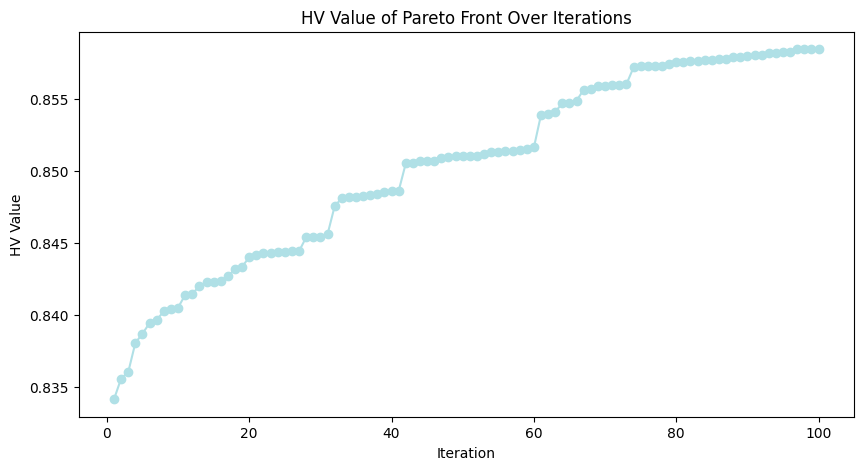

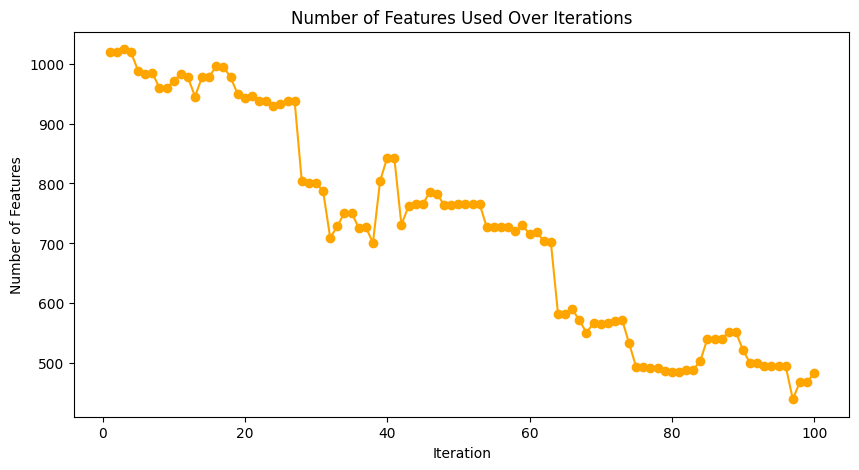

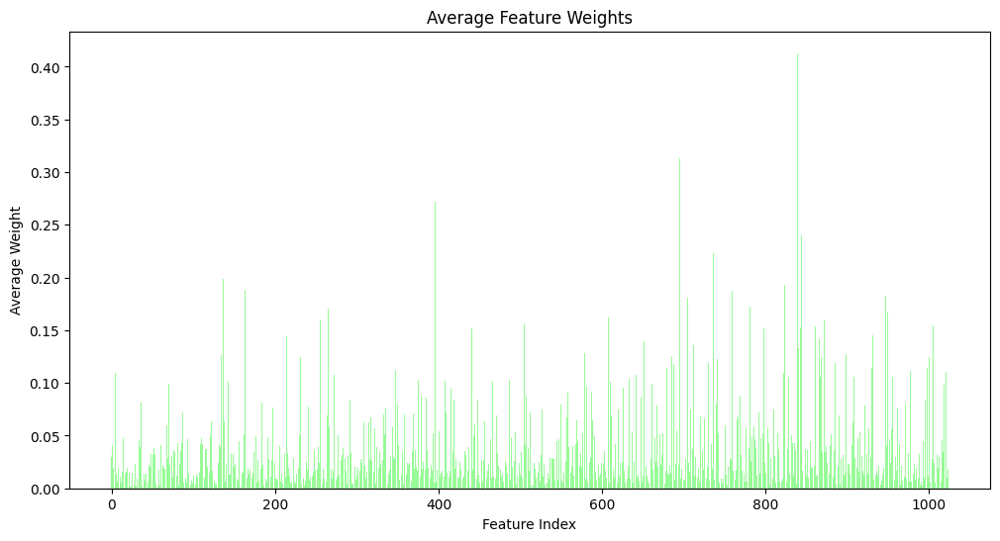

Total population members: 100
Pareto front members: 15


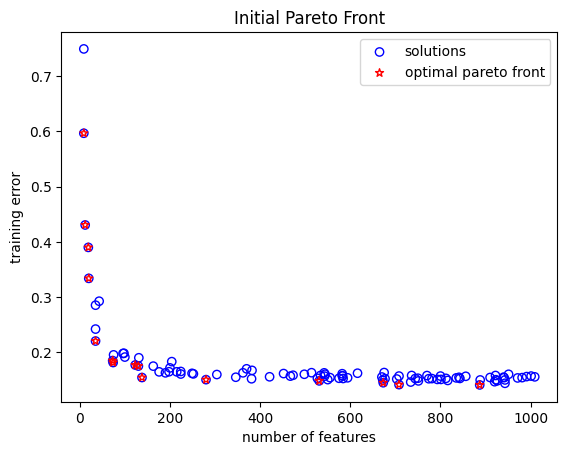

Total population members: 100
Pareto front members: 32


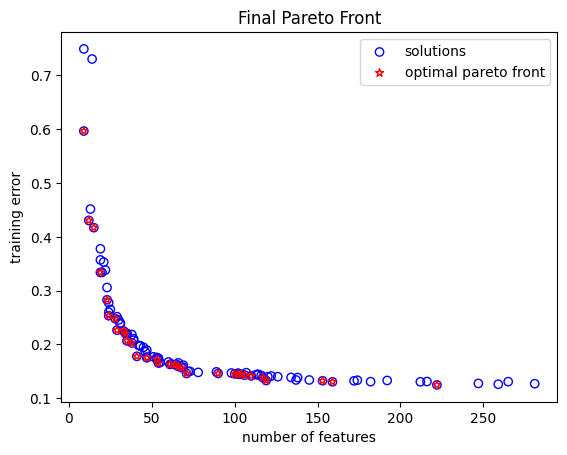

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 9.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.5965187406796366
classification error on test sets: 0.617028103701458
solution 1:
number of selected features is: 23.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.2830018692708255
classification error on test sets: 0.2927143991521507
solution 2:
number of selected features is: 34.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.2205624427449795
classification error on test sets: 0.2893864836876844
solution 3:
number of selected features is: 12.0
corre

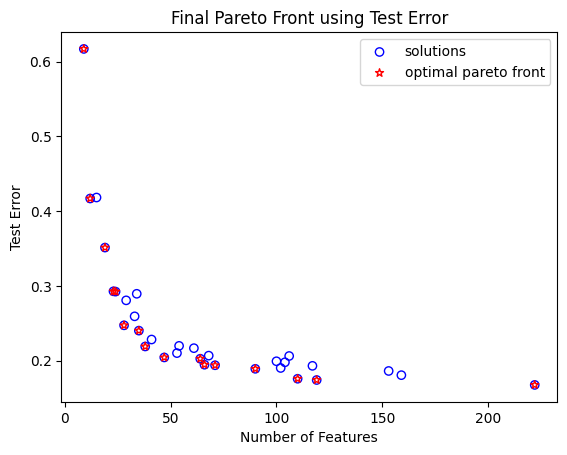

Final PF Results:  {0: {'num_selected_features': 9.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.4066083171672072, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

NameError: name 'featureNames' is not defined

In [4]:
# Baseline: get classification results of applying weights to ALL 1024 features

# Read validation data
validation_path = "KimiaNet_Data/kimianet_validation_data_averaged_feature_vectors.csv"
validation = pd.read_csv(validation_path)
dclass = validation.columns[0]
x = validation.drop(columns=[dclass])
y = validation[dclass]

# Read test data
test_path = "KimiaNet_Data/kimianet_test_data_averaged_feature_vectors.csv"
test = pd.read_csv(test_path)
dclass = test.columns[0]
xtest = test.drop(columns=[dclass])
ytest = test[dclass]

# Run GDE3 algorithm 
epsilon = 0.01
total_features = x.shape[1] 
popsize=100
print("TOTAL NUMBER OF FEATURES: ", total_features)
dataset_name = f"Baseline GDE3 Kimianet Feature Weighting (using all features)"
custom_population = generate_individuals(total_features, epsilon, popsize)
pop = Population.new("X", custom_population)

problem = MyProblem(x,y,epsilon)
Evaluator().eval(problem, pop) # evaluate initial population
algorithm = GDE3(pop_size=popsize,
                variant="DE/rand/1/bin", # selection = random, crossover = binary
                CR=0.5, # crossover parameter [0,1]
                F=(0.0, 0.9), # scale factor or mutation parameter (0,2]
                sampling = pop
                )
res = minimize(problem,
                algorithm,
                ("n_gen", 100),
                verbose=True, # prints results if true
                save_history=True
                )
final_pf_results, final_test_pf_results, lowest_train_error_solution, lowest_test_error_solution, hv_test, hv_training = visualize(res, x, y, xtest, ytest, epsilon)
store_results(dataset_name, final_pf_results, final_test_pf_results, lowest_train_error_solution, lowest_test_error_solution, hv_test, hv_training, epsilon, featureNames)

In [8]:
store_results(dataset_name, final_pf_results, final_test_pf_results, lowest_train_error_solution, lowest_test_error_solution, hv_test, hv_training, epsilon, xtest.columns.tolist())

Results saved to data.csv


    Feature  Occurrences
0      1022          114
1       996           99
2       976           99
3       708           89
4       766           86
5       955           85
6       630           82
7       881           79
8       793           78
9       545           77
10      769           75
11      781           74
12      855           73
13      767           72
14      819           69
15      841           65
16      982           65
17      790           62
18      586           61
19      845           59
20      794           59
21      898           59
22      773           56
23      735           53
24      918           52
25      698           50
26     1005           49
27      911           49
28      756           49
29      877           48
30      935           48
31      669           45
32      836           45
33     1017           44
34      625           43
35      763           43
36      888           43
37      978           42
38      737           42


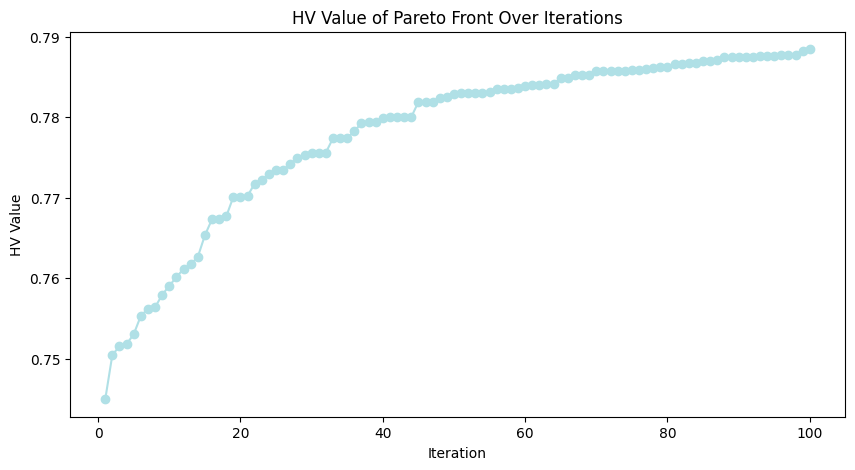

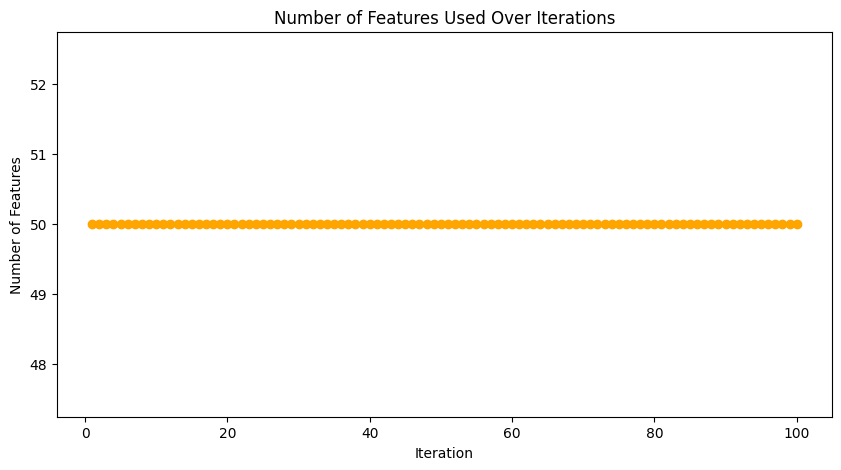

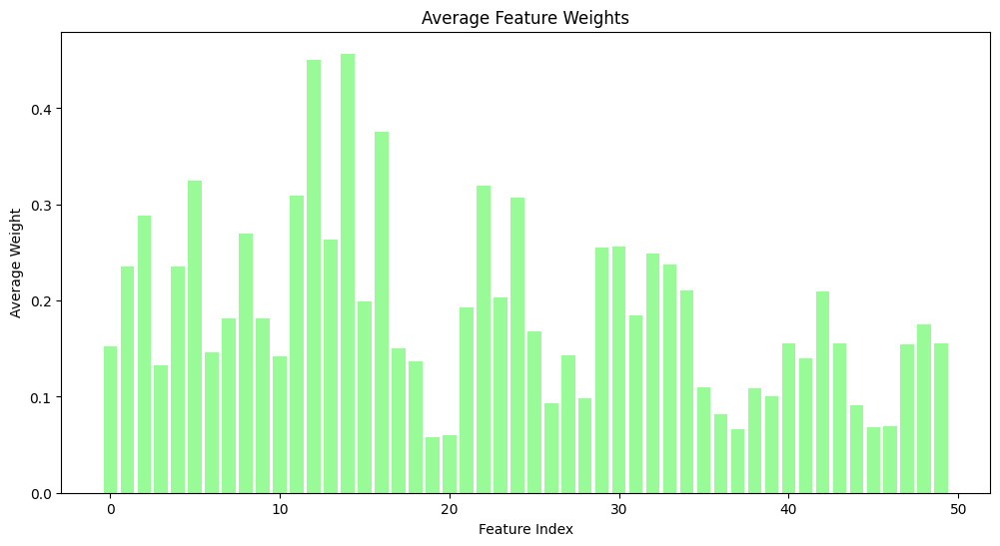

Total population members: 100
Pareto front members: 19


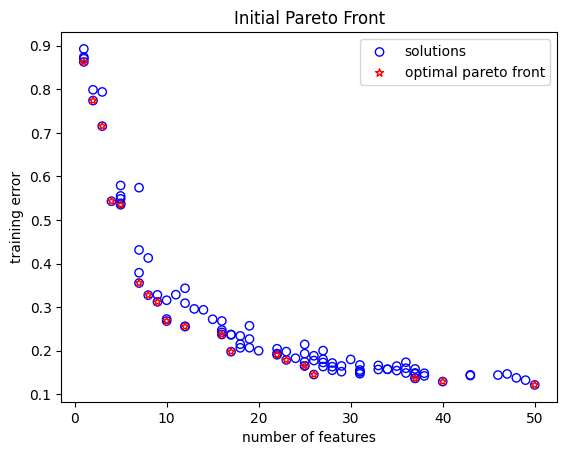

Total population members: 100
Pareto front members: 31


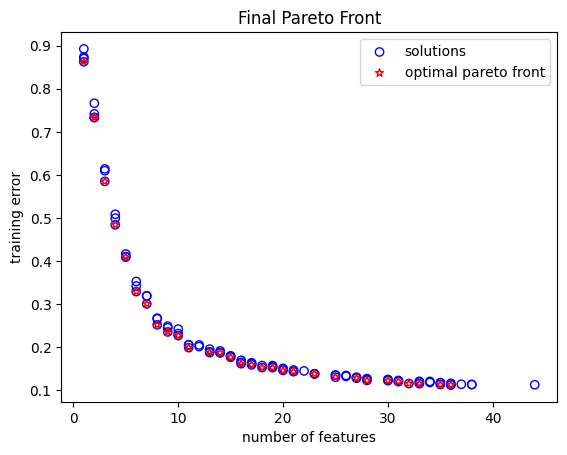

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.8628120538158484
classification error on test sets: 0.8898127569138303
solution 1:
number of selected features is: 14.0
corresponding weights:  [0.42939321 0.         0.         0.         0.         0.
 0.         0.         0.43721934 0.        ] ...
corresponding normalized weights:  [0.07611526 0.         0.         0.         0.         0.
 0.         0.         0.07750254 0.        ] ...
classification error on train sets: 0.1861333369064797
classification error on test sets: 0.2375976775693014
solution 2:
number of selected features is: 9.0
corresponding weights:  [0.42939321 0.         0.         0.         0.         0.
 0.49079832 0.         0.43721934 0.        ] ...
corresponding n

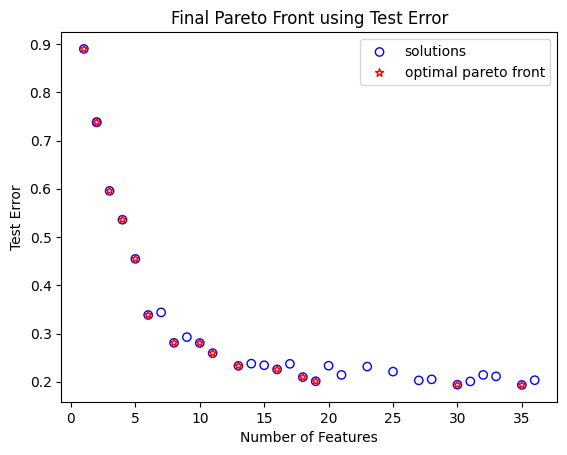

Final PF Results:  {0: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5634433271323819, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.8628120538158484, 'test_error': 0.8898127569138303}, 1: {'num_selected_features': 14.0, 'feature_weights': [0.42939320953821114, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.4372193350581583, 0.0, 0.0, 0.48252970682163543, 0.0, 0.561273406375232, 0.7322729134890507, 0.0, 0.7253519920302901, 0.0, 0.0, 0.3219622781256202, 0.0, 0.0, 0.0, 0.227666095713507, 0.0, 0.0, 0.0, 0.3647846018450382, 0.299552634943907, 0.5331370707099499, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2779161054067584, 0.048404192029209925, 0.0, 0.0, 0.0, 0.0, 0.19989121436948967, 0.0, 0.0], 'train_error': 0.1861333369064797, 'test_error': 0.2375976775693014}, 2:

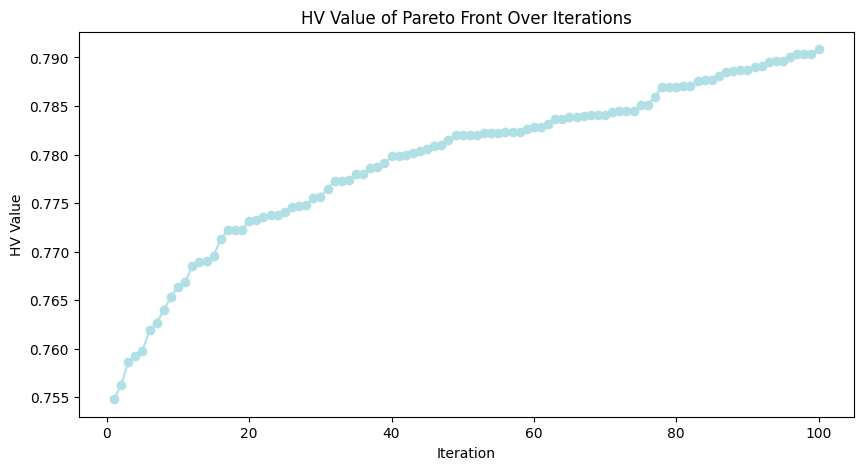

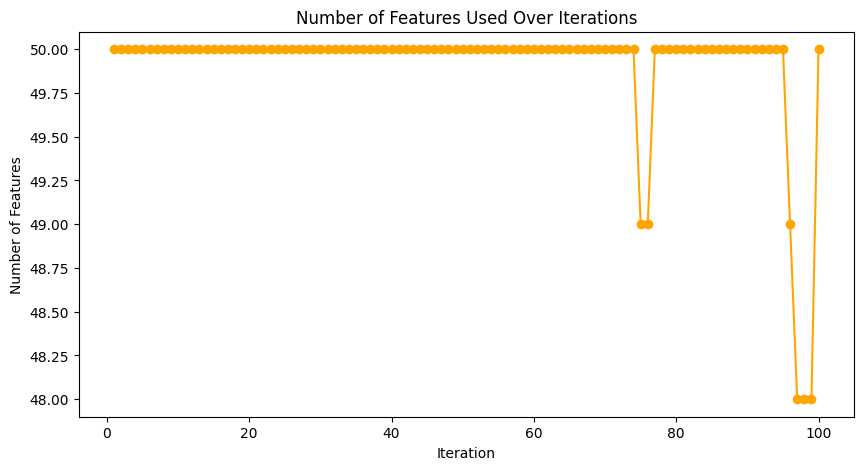

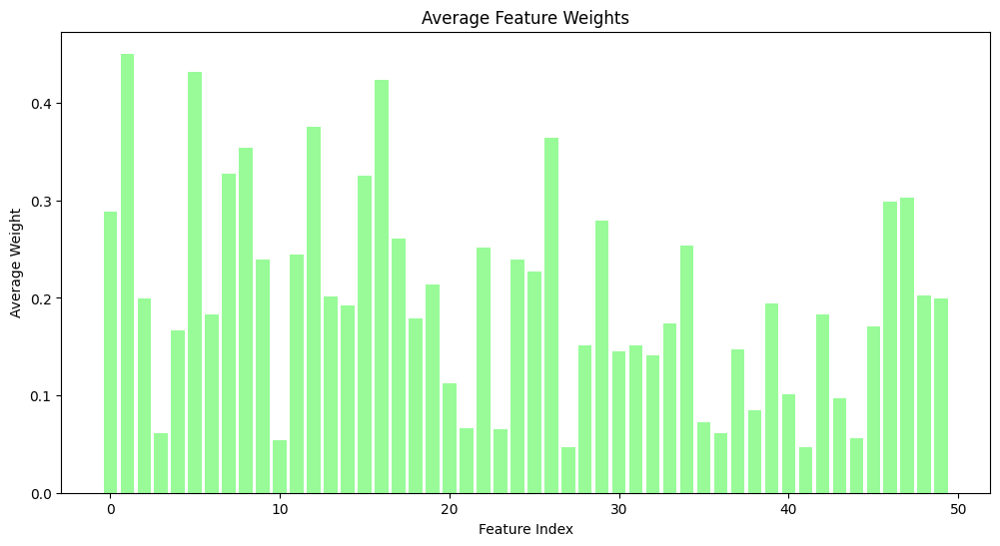

Total population members: 100
Pareto front members: 20


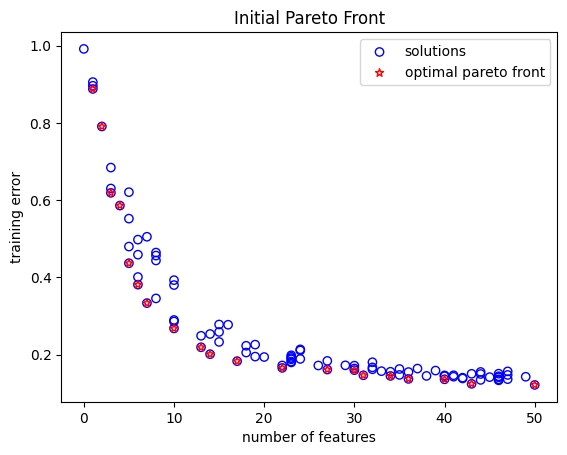

Total population members: 100
Pareto front members: 29


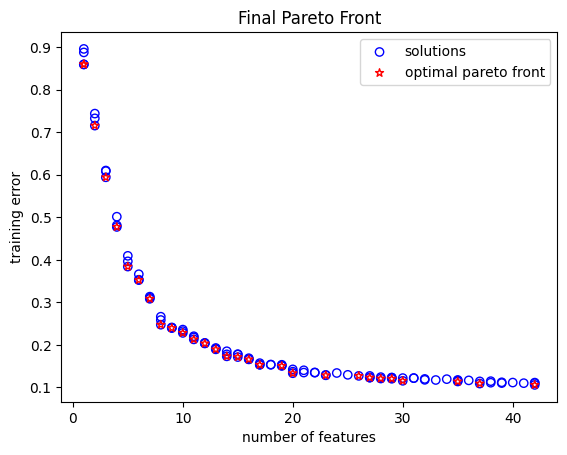

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 7.0
corresponding weights:  [0.         0.64184865 0.         0.         0.         0.
 0.         0.4694296  0.         0.        ] ...
corresponding normalized weights:  [0.         0.15770602 0.         0.         0.         0.
 0.         0.11534164 0.         0.        ] ...
classification error on train sets: 0.30841130284608675
classification error on test sets: 0.2953625678386045
solution 1:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.8594761613627901
classification error on test sets: 0.9127240052683039
solution 2:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification er

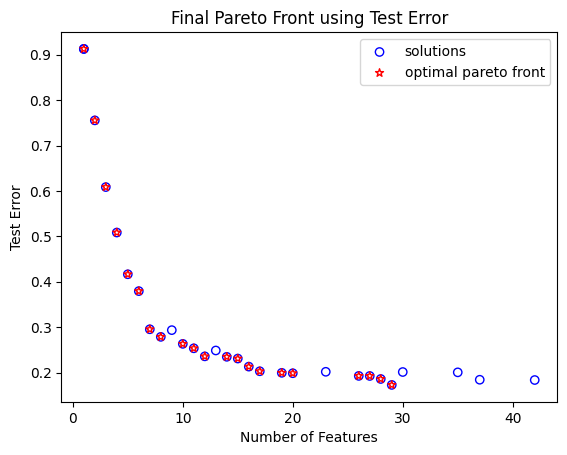

Final PF Results:  {0: {'num_selected_features': 7.0, 'feature_weights': [0.0, 0.6418486530886599, 0.0, 0.0, 0.0, 0.0, 0.0, 0.4694296026503148, 0.0, 0.0, 0.0, 0.0, 0.7999578279796572, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5472742945516094, 0.0, 0.4293154102212422, 0.0, 0.0, 0.0, 0.0, 0.6305321277908162, 0.0, 0.0, 0.5515479523075296, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.30841130284608675, 'test_error': 0.2953625678386045}, 1: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8703441698225668, 0.0, 0.0, 0.0], 'train_error': 0.8594761613627901, 'test_error': 0.9127240052683039}, 2: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

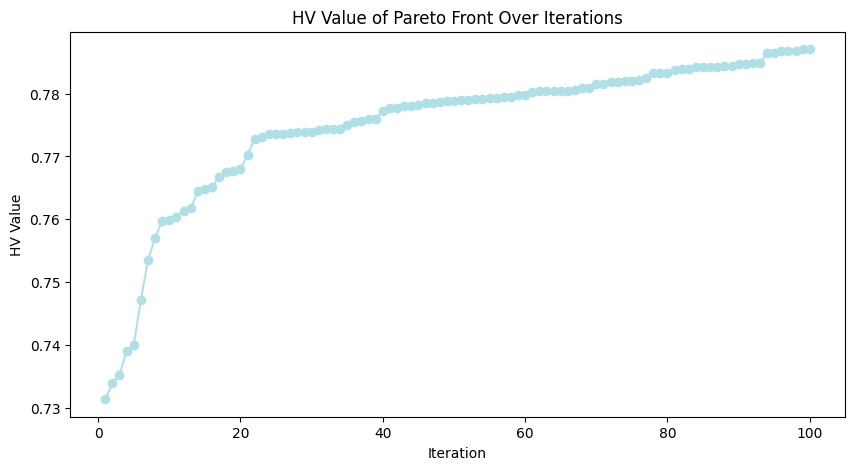

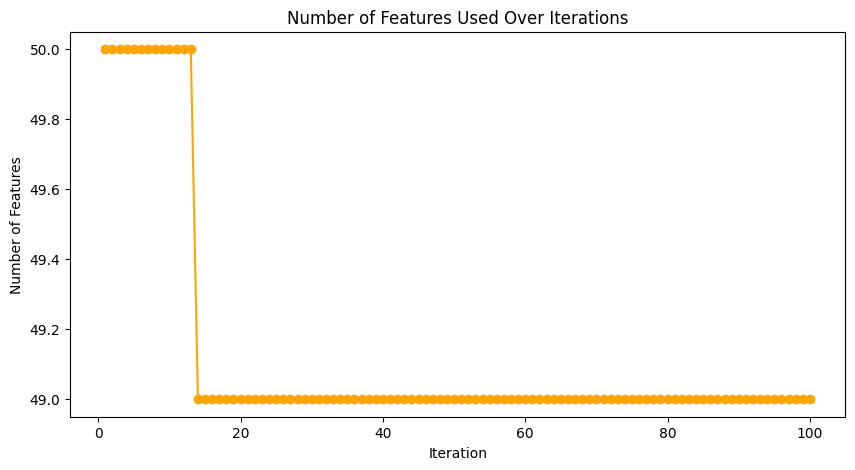

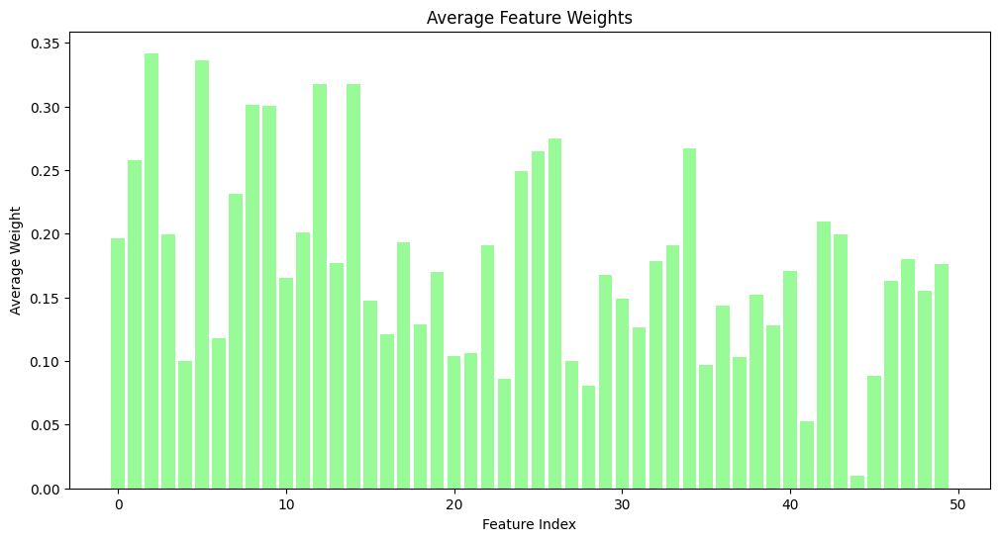

Total population members: 100
Pareto front members: 23


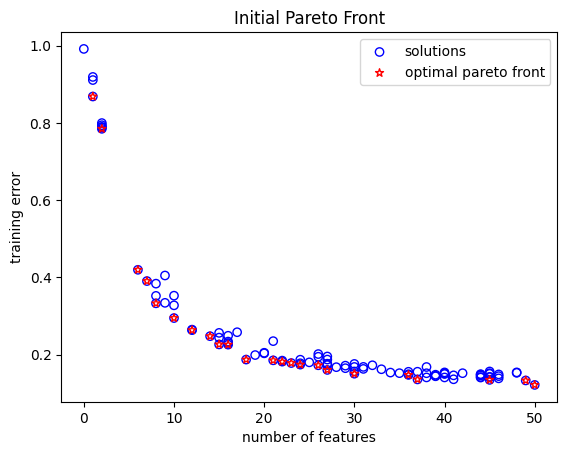

Total population members: 100
Pareto front members: 25


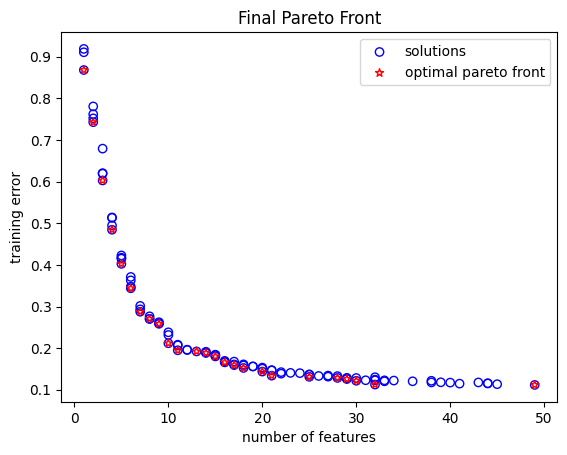

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 1.0
corresponding weights:  [0.         0.33081548 0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.8680708187352686
classification error on test sets: 0.8368629676777646
solution 1:
number of selected features is: 2.0
corresponding weights:  [0.         0.33081548 0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0.         0.39812276 0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
classification error on train sets: 0.7428033337501241
classification error on test sets: 0.7278994532874141
solution 2:
number of selected features is: 9.0
corresponding weights:  [0.         0.         0.30444158 0.4519748  0.     

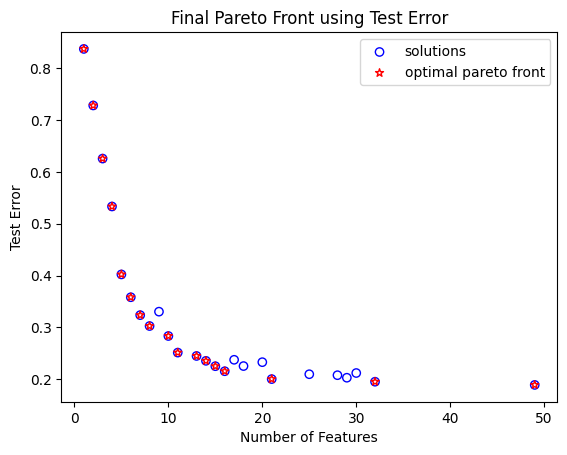

Final PF Results:  {0: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.3308154834369141, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.8680708187352686, 'test_error': 0.8368629676777646}, 1: {'num_selected_features': 2.0, 'feature_weights': [0.0, 0.3308154834369141, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5001229065587438, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.7428033337501241, 'test_error': 0.7278994532874141}, 2: {'num_selected_features': 9.0, 'feature_weights': [0.0, 0.0, 0.30444158061169513, 0.4519747962705122, 0.0, 0.0, 0.0, 0.0, 0.44979727611735204, 0.0, 0.0, 0.0, 0.7072890852392787, 0.0,

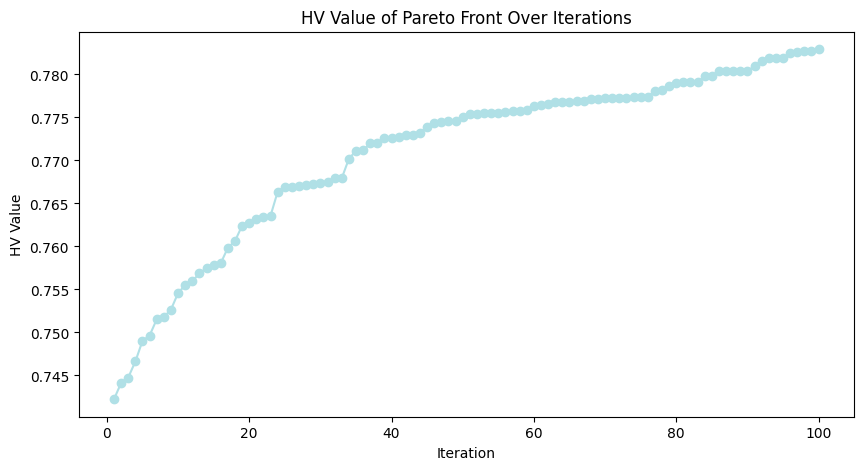

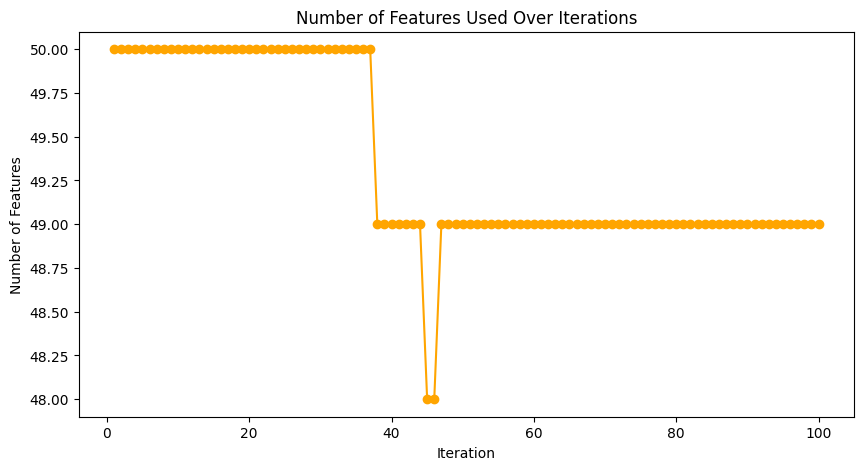

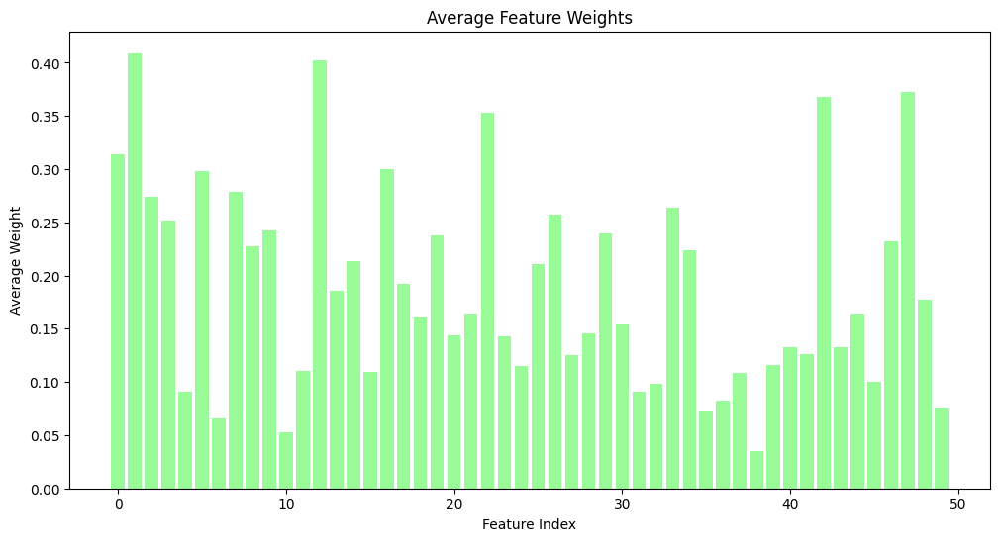

Total population members: 100
Pareto front members: 21


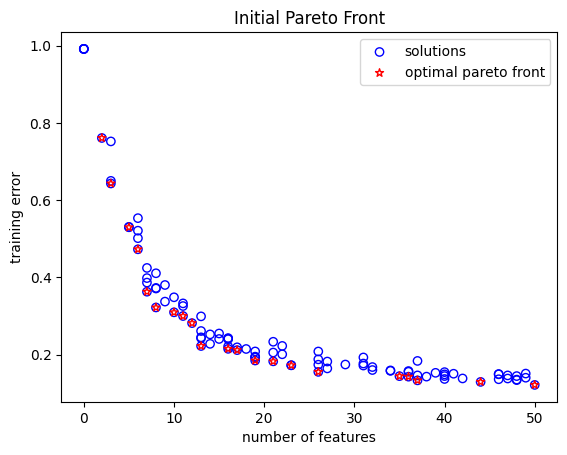

Total population members: 100
Pareto front members: 27


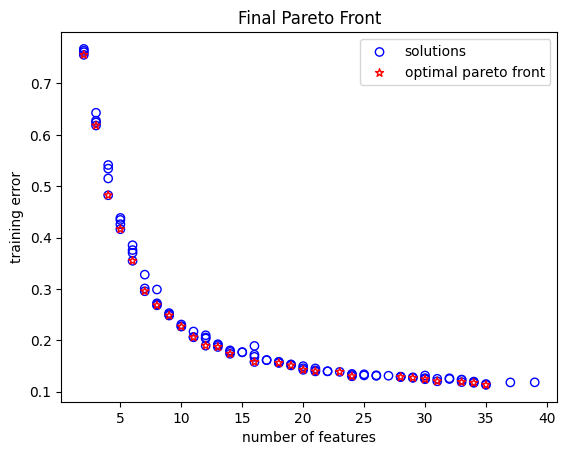

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 34.0
corresponding weights:  [0.7272501  0.55419284 0.54170689 0.         0.         0.57182331
 0.         0.55228395 0.54145507 0.69865976] ...
corresponding normalized weights:  [0.03907617 0.02977756 0.02910667 0.         0.         0.03072487
 0.         0.02967499 0.02909314 0.03753997] ...
classification error on train sets: 0.11724548514168442
classification error on test sets: 0.20277099238526763
solution 1:
number of selected features is: 24.0
corresponding weights:  [0.79609638 0.73989131 0.75102576 0.55428242 0.         0.86507076
 0.         0.71745414 0.         0.958656  ] ...
corresponding normalized weights:  [0.05656158 0.05256828 0.05335937 0.03938102 0.         0.06146211
 0.         0.05097415 0.         0.06811122] ...
classification error on train sets: 0.13000885792357442
classification error on test sets: 0.19055273998974498
solution 2:
n

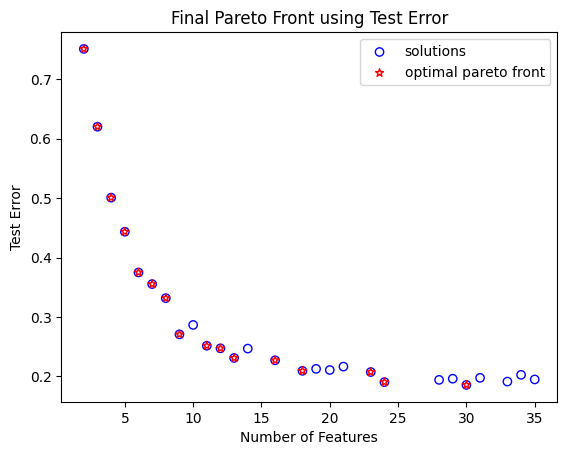

Final PF Results:  {0: {'num_selected_features': 34.0, 'feature_weights': [0.7272501044608646, 0.554192835044371, 0.5417068920502879, 0.0, 0.0, 0.5718233075814236, 0.0, 0.5522839548209854, 0.5414550671149242, 0.6986597626338394, 0.3791945163287731, 0.6484900993418279, 0.5315383013317145, 0.8190427337239554, 0.4539817526155172, 0.0, 0.4722326520737914, 0.5975343388253177, 0.5279269469304753, 0.0, 0.0, 0.6388537647985468, 0.0, 0.43747726445384344, 0.5165279659009689, 0.7437894919054284, 0.5344397275213008, 0.0, 0.0, 0.5331370707099499, 0.5715358432604228, 0.0, 0.6604907594658244, 0.45537339474227706, 0.3313992608048886, 0.0, 0.5372426175062057, 0.0, 0.0, 0.0, 0.6061159100407103, 0.0, 0.0, 0.5757716852061998, 0.4030494381180638, 0.47841807407061004, 0.6505558244558732, 0.5920639616886729, 0.4817549629149482, 0.24577947693928814], 'train_error': 0.11724548514168442, 'test_error': 0.20277099238526763}, 1: {'num_selected_features': 24.0, 'feature_weights': [0.7960963797514322, 0.739891312868

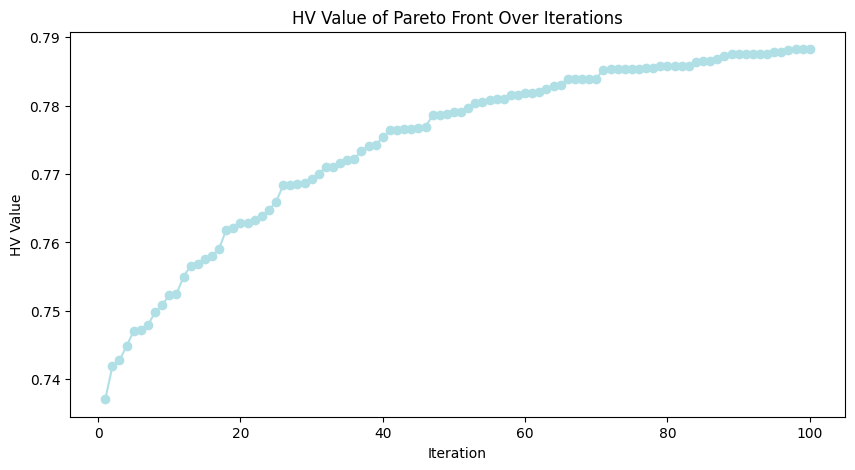

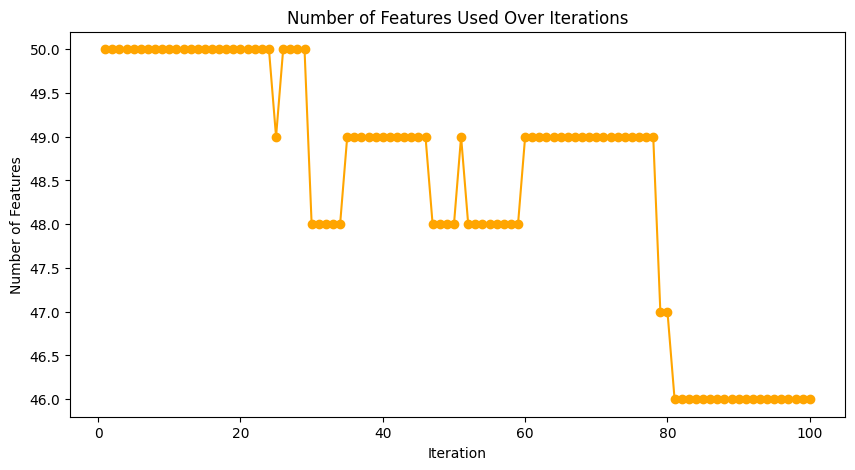

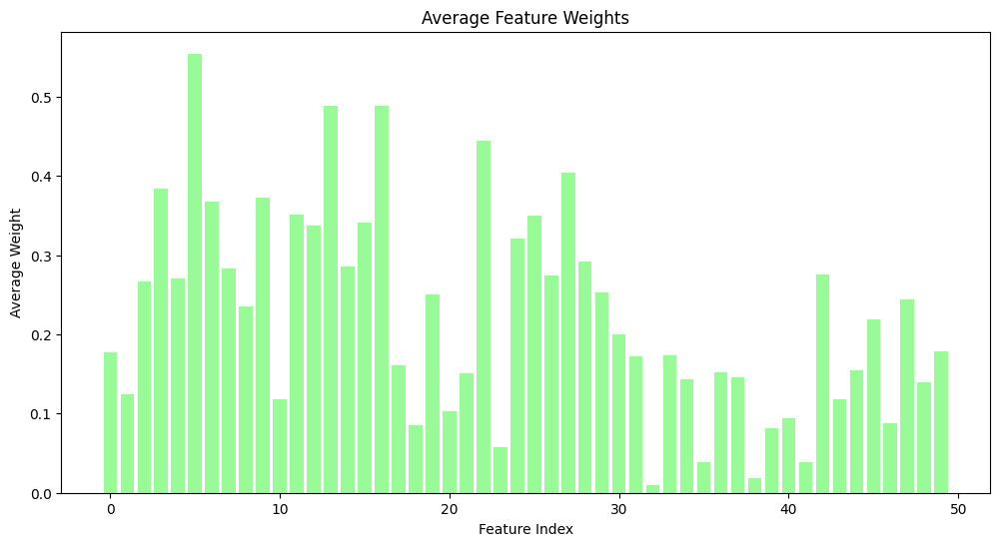

Total population members: 100
Pareto front members: 18


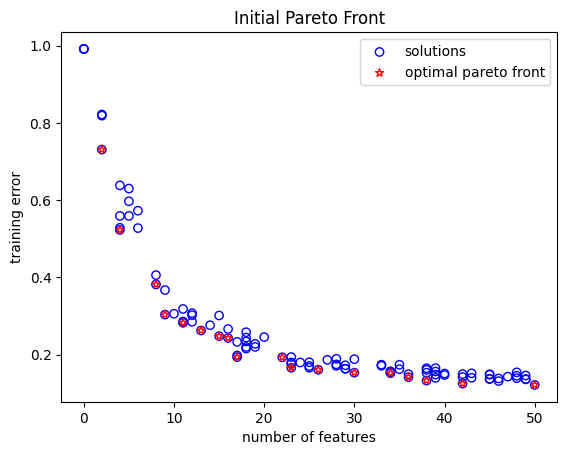

Total population members: 100
Pareto front members: 27


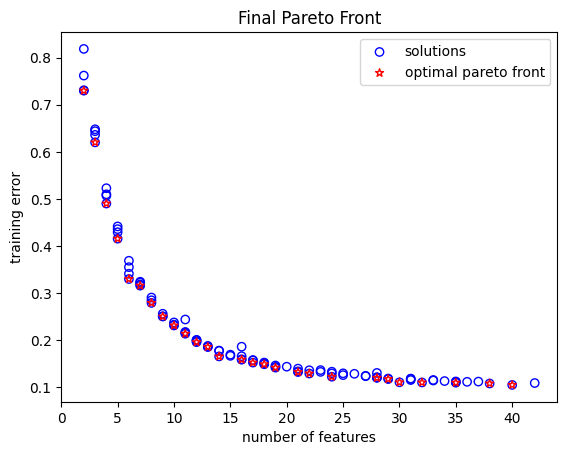

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 10.0
corresponding weights:  [0.         0.         0.         0.48304063 0.         0.5966477
 0.50493129 0.74174288 0.         0.94438172] ...
corresponding normalized weights:  [0.         0.         0.         0.08307122 0.         0.10260887
 0.08683588 0.12756171 0.         0.16241065] ...
classification error on train sets: 0.23104275377016903
classification error on test sets: 0.2746843208869739
solution 1:
number of selected features is: 6.0
corresponding weights:  [0.         0.         0.         0.48304063 0.         0.25259101
 0.50493129 0.         0.         0.        ] ...
corresponding normalized weights:  [0.         0.         0.         0.15887921 0.         0.08308092
 0.16607937 0.         0.         0.        ] ...
classification error on train sets: 0.32975472724067323
classification error on test sets: 0.4083064077099201
solution 2:
numbe

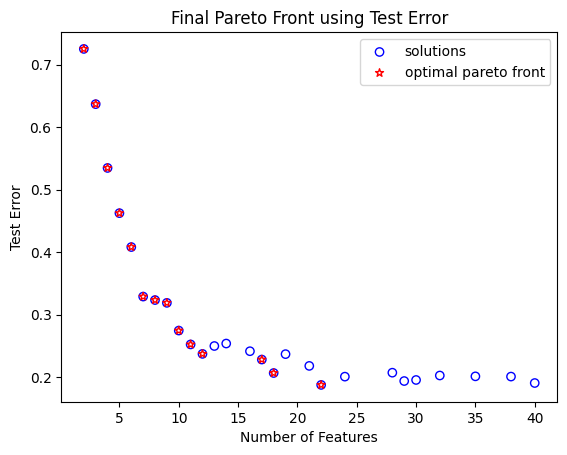

Final PF Results:  {0: {'num_selected_features': 10.0, 'feature_weights': [0.0, 0.0, 0.0, 0.4830406268246885, 0.0, 0.5966477029872529, 0.5049312874528211, 0.7417428810121729, 0.0, 0.9443817170111689, 0.0, 0.5356560550777536, 0.0, 0.0, 0.0, 0.0, 0.5333845792426317, 0.0, 0.0, 0.7306975000562993, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.4859218352173922, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.25837270402254353, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.23104275377016903, 'test_error': 0.2746843208869739}, 1: {'num_selected_features': 6.0, 'feature_weights': [0.0, 0.0, 0.0, 0.4830406268246885, 0.0, 0.25259100693782516, 0.5049312874528211, 0.0, 0.0, 0.0, 0.0, 0.5356560550777536, 0.0, 0.0, 0.0, 0.0, 0.5333845792426317, 0.0, 0.0, 0.7306975000562993, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.32975472724067323, 'test_error': 0.4083

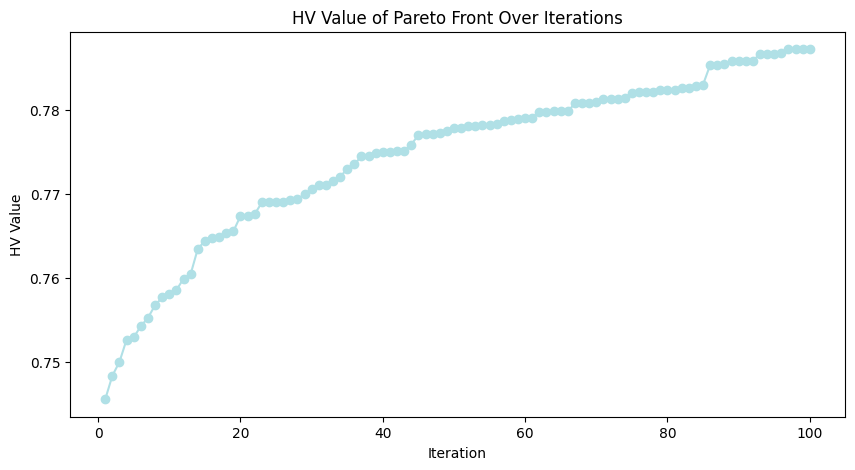

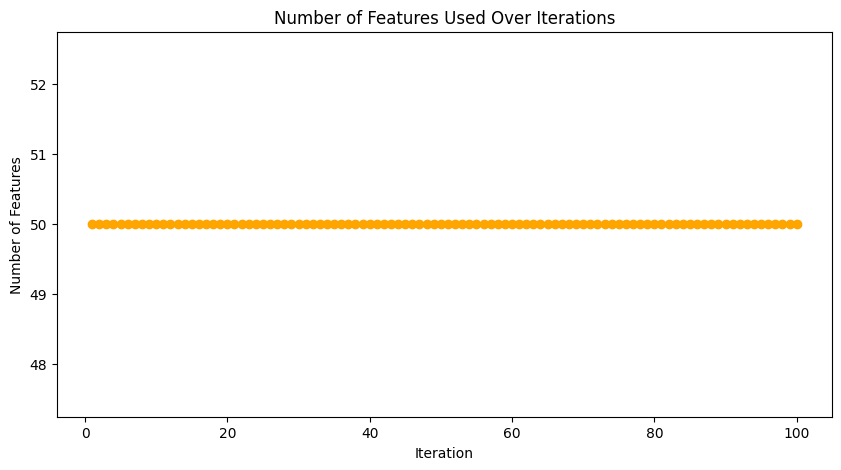

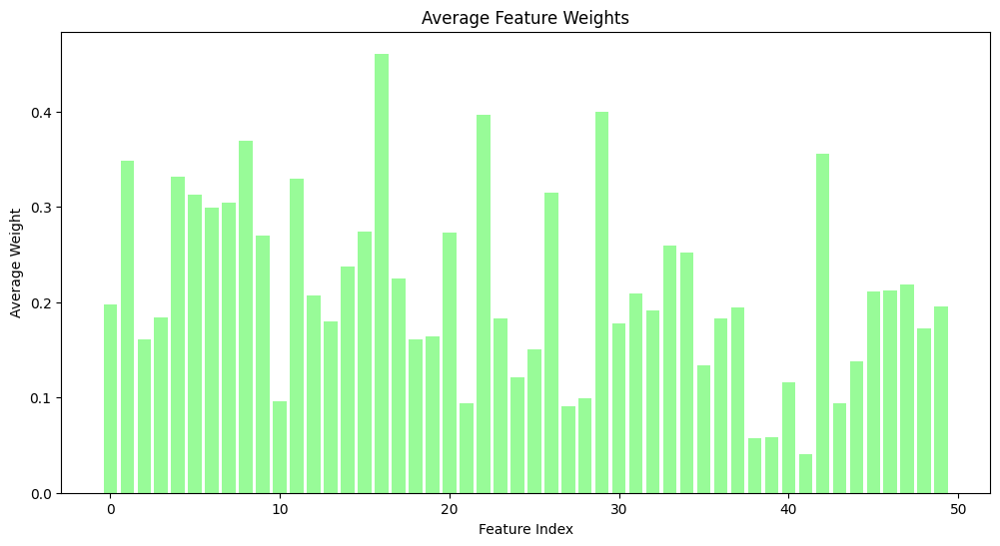

Total population members: 100
Pareto front members: 20


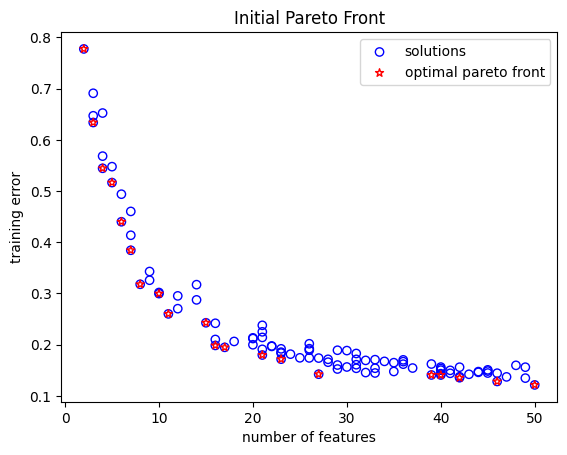

Total population members: 100
Pareto front members: 29


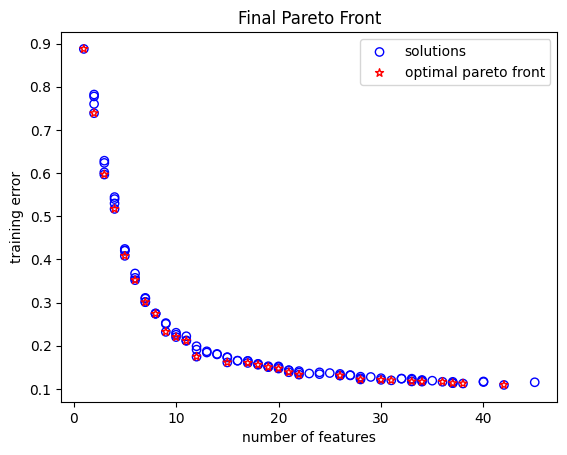

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 42.0
corresponding weights:  [0.         0.55419284 0.         0.         0.99849106 0.5668523
 0.87903164 0.88616186 0.53930146 0.53630417] ...
corresponding normalized weights:  [0.         0.0209655  0.         0.         0.03777362 0.02144442
 0.03325438 0.03352413 0.02040215 0.02028876] ...
classification error on train sets: 0.10922008144144324
classification error on test sets: 0.18482532350812408
solution 1:
number of selected features is: 22.0
corresponding weights:  [0.         0.         0.         0.         0.78992694 0.74390771
 0.6724177  0.69593036 0.77317849 0.48560232] ...
corresponding normalized weights:  [0.         0.         0.         0.         0.05855979 0.05514824
 0.04984846 0.05159153 0.05731818 0.03599924] ...
classification error on train sets: 0.13307432806390607
classification error on test sets: 0.21462977700784347
solution 2:
nu

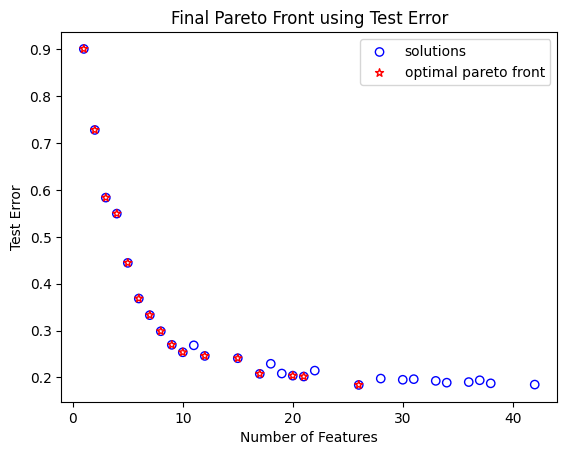

Final PF Results:  {0: {'num_selected_features': 42.0, 'feature_weights': [0.0, 0.554192835044371, 0.0, 0.0, 0.9984910629087592, 0.5668523022968338, 0.8790316406979739, 0.8861618574901604, 0.5393014584224134, 0.5363041663646824, 0.9648254975597319, 0.7567268052369321, 0.5315383013317145, 0.7811957570637043, 0.976199856777347, 0.4742245935545254, 0.8741240198909076, 0.9032444922544168, 0.613786430531414, 0.9558548258220474, 0.4650773321379742, 0.0, 0.8290442568974339, 0.5275131533152615, 0.5415924824652107, 0.380112973522664, 0.999949341109184, 0.0, 0.024990396017256836, 0.8644279749456254, 0.6482616243811892, 0.9683409683842413, 0.45320554300659865, 0.6312241016719139, 0.0749869972485674, 0.4975088241368204, 0.7212413270294304, 0.4034907288311955, 0.0, 0.0, 0.07768106750003934, 0.41056687800243763, 0.5506798873147722, 0.5757716852061998, 0.6267402416427249, 0.5032905226439388, 0.0, 0.5076697322570912, 0.9392299435438838, 0.4189020750642962], 'train_error': 0.10922008144144324, 'test_er

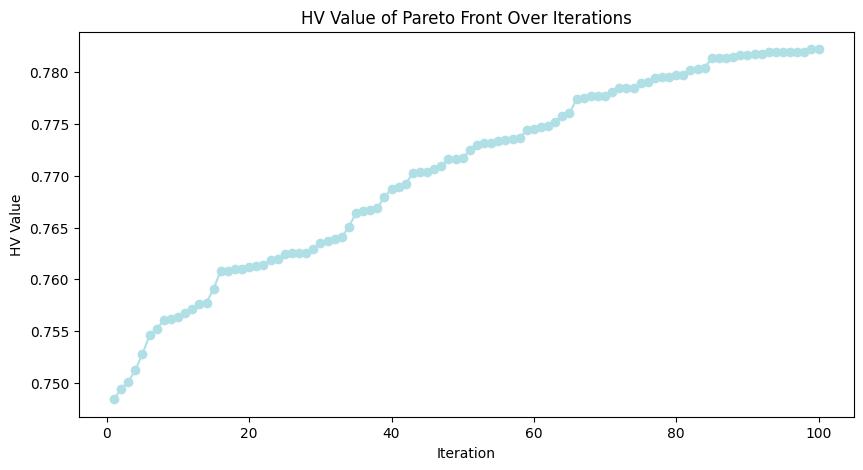

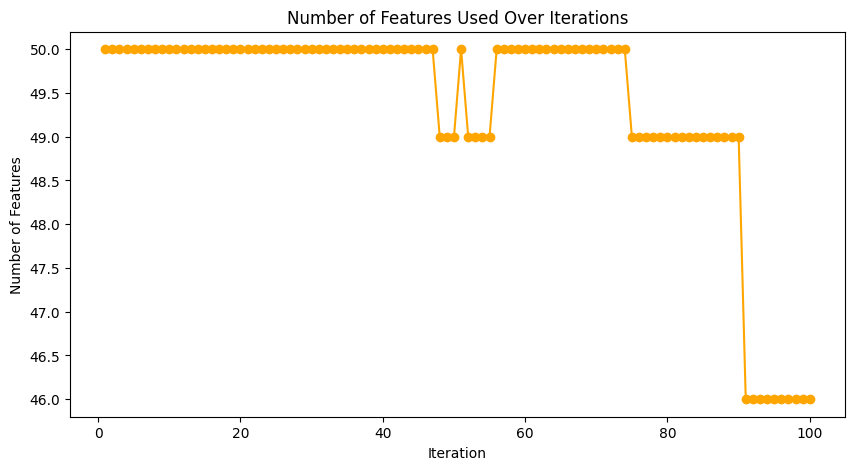

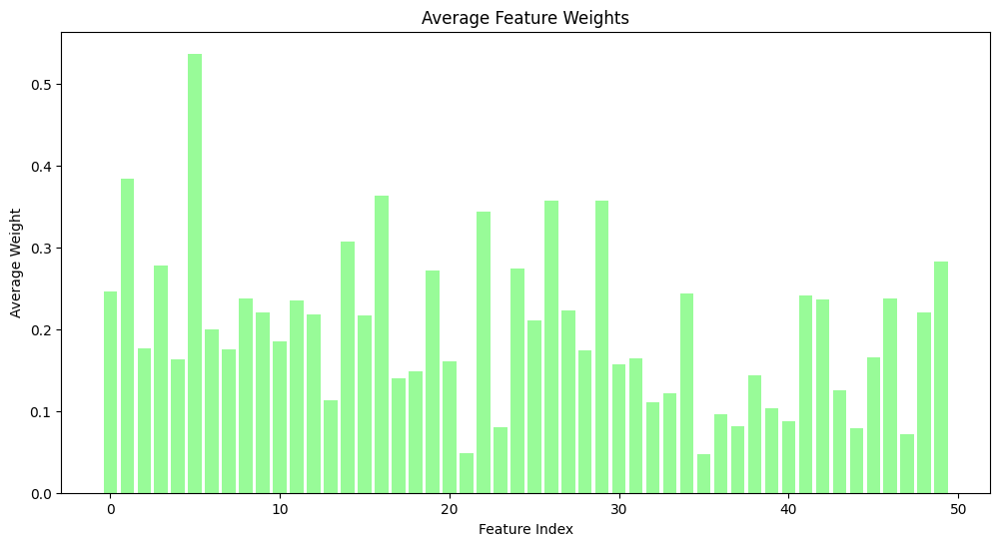

Total population members: 100
Pareto front members: 21


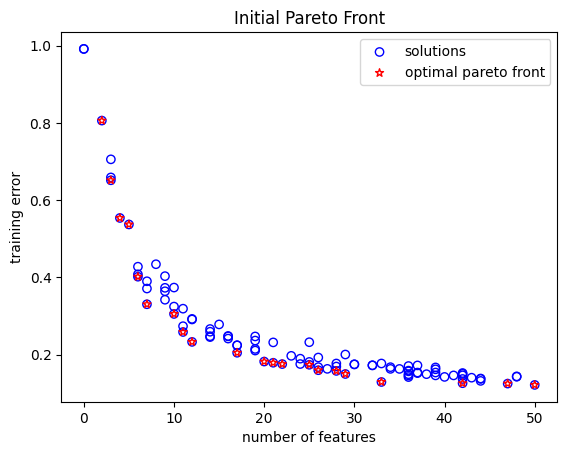

Total population members: 100
Pareto front members: 27


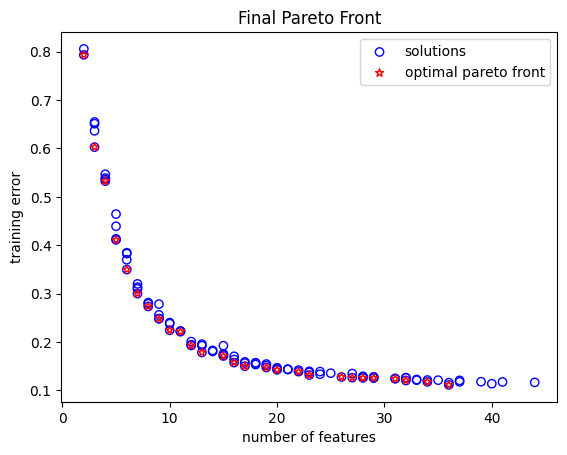

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 26.0
corresponding weights:  [0.33354377 0.90861736 0.6183902  0.         0.90063887 0.98959779
 0.         0.68180663 0.         0.79231119] ...
corresponding normalized weights:  [0.02018696 0.05499196 0.03742663 0.         0.05450908 0.05989311
 0.         0.04126477 0.         0.0479528 ] ...
classification error on train sets: 0.12762959823839726
classification error on test sets: 0.1951464558092536
solution 1:
number of selected features is: 20.0
corresponding weights:  [0.33354377 0.23825585 0.6183902  0.85163042 0.         0.98959779
 0.         0.68180663 0.         0.79231119] ...
corresponding normalized weights:  [0.02374178 0.01695915 0.04401726 0.0606194  0.         0.07043997
 0.         0.04853127 0.         0.05639703] ...
classification error on train sets: 0.14248252326716138
classification error on test sets: 0.22347079166480543
solution 2:
nu

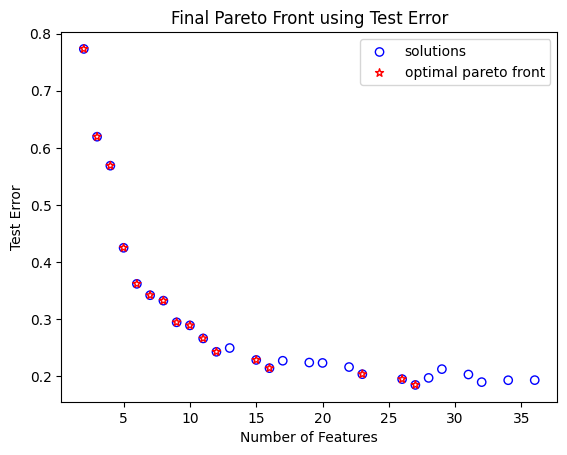

Final PF Results:  {0: {'num_selected_features': 26.0, 'feature_weights': [0.33354376939828234, 0.9086173592537276, 0.618390200152545, 0.0, 0.9006388741652656, 0.9895977913388038, 0.0, 0.6818066343708016, 0.0, 0.7923111945787926, 0.3442844858066867, 0.0, 0.675397383418531, 0.0, 0.6228956983034504, 0.6162294108359537, 0.0, 0.9351832311005422, 0.3816732616257383, 0.6279675873174193, 0.0, 0.0, 0.6924508666128314, 0.0, 0.851930799295548, 0.0, 0.6417625989210916, 0.41449215030436687, 0.0, 0.9658802542683029, 0.0, 0.04514117138399941, 0.0, 0.0, 0.0, 0.0, 0.20566770064699239, 0.0, 0.5300461195767434, 0.0, 0.0, 0.0, 0.7431121523006692, 0.0, 0.0, 0.0, 0.8810086461082471, 0.0, 0.5848329842501622, 0.5378685013724808], 'train_error': 0.12762959823839726, 'test_error': 0.1951464558092536}, 1: {'num_selected_features': 20.0, 'feature_weights': [0.33354376939828234, 0.23825584644133216, 0.618390200152545, 0.8516304233411802, 0.0, 0.9895977913388038, 0.0, 0.6818066343708016, 0.0, 0.7923111945787926, 0

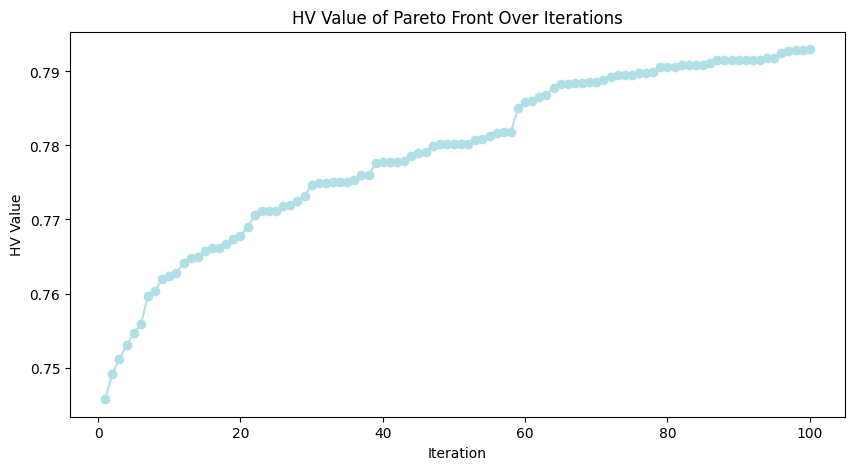

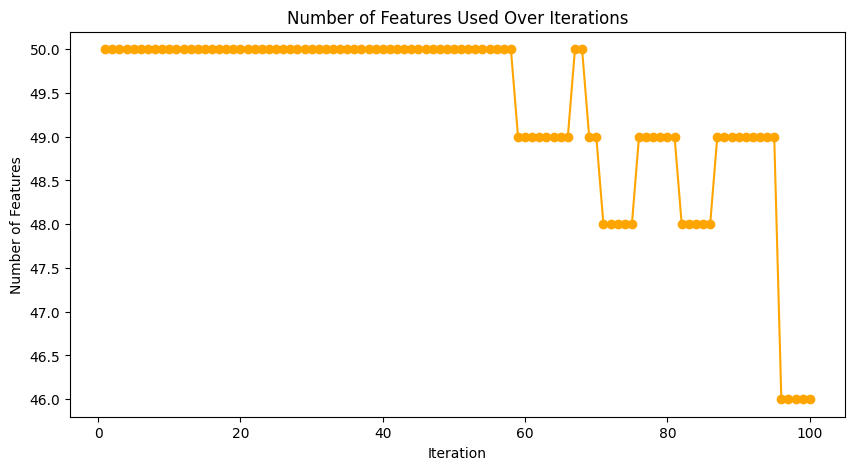

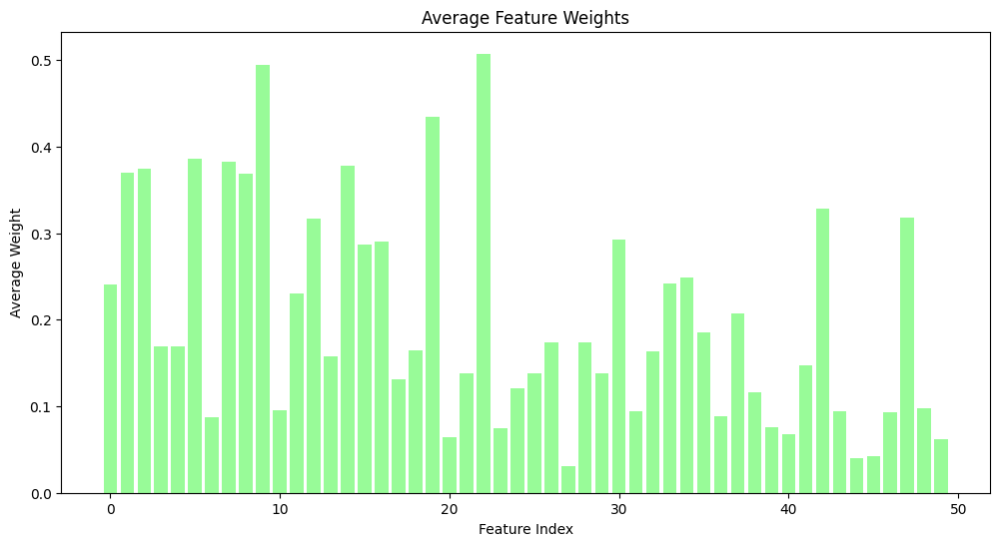

Total population members: 100
Pareto front members: 25


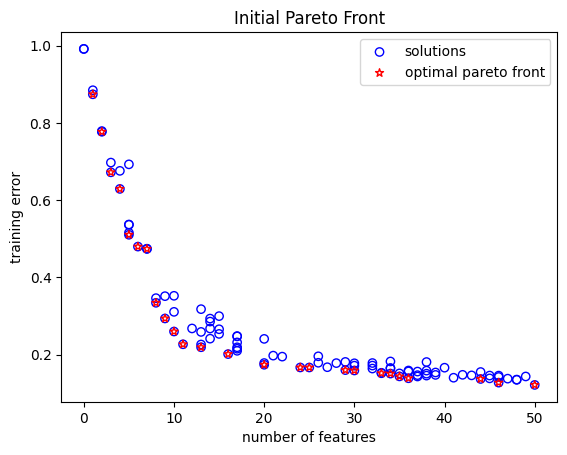

Total population members: 100
Pareto front members: 27


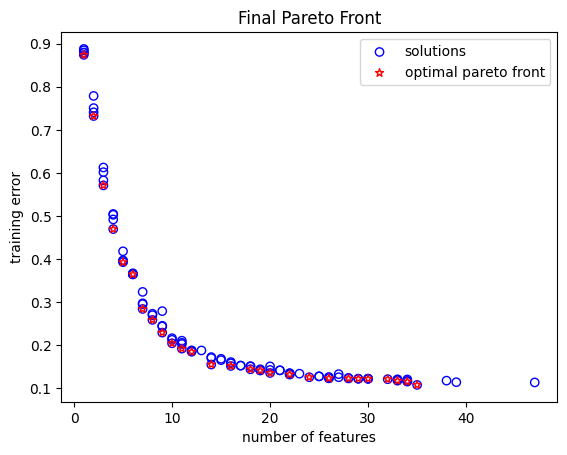

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.8738364247497924
classification error on test sets: 0.894524389883818
solution 1:
number of selected features is: 35.0
corresponding weights:  [0.56598922 0.         0.25344101 0.         0.44405435 0.94739376
 0.41918015 0.48763379 0.53930146 0.39846204] ...
corresponding normalized weights:  [0.02970349 0.         0.01330075 0.         0.02330426 0.04971985
 0.02199885 0.02559134 0.02830289 0.02091155] ...
classification error on train sets: 0.10818237406733644
classification error on test sets: 0.19510582173787083
solution 2:
number of selected features is: 6.0
corresponding weights:  [0.         0.98826918 0.         0.27942707 0.         0.
 0.         0.90635615 0.         0.57243656] ..

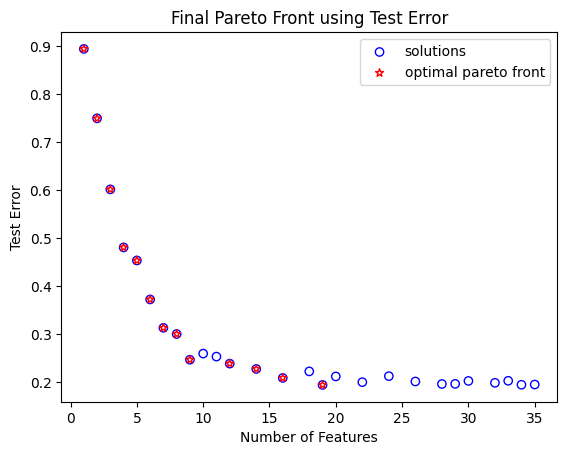

Final PF Results:  {0: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7073392477356225, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.8738364247497924, 'test_error': 0.894524389883818}, 1: {'num_selected_features': 35.0, 'feature_weights': [0.5659892245849969, 0.0, 0.25344100938646835, 0.0, 0.44405435092789913, 0.9473937605300504, 0.41918015053904295, 0.4876337935031483, 0.5393014584224134, 0.39846204447331357, 0.0, 0.5209728191168328, 0.5315383013317145, 0.3241590417665916, 0.9470007564497038, 0.7967462484622154, 0.4722326520737914, 0.5454362522079402, 0.5279269469304753, 0.5275333333936927, 0.7052455793417907, 0.0, 0.6426541232619114, 0.0, 0.301972429467417, 0.6831547607228398, 0.6533524094958643, 0.0, 0.4317078944424658, 0.0, 0.42771454050367685, 0.419580778295913

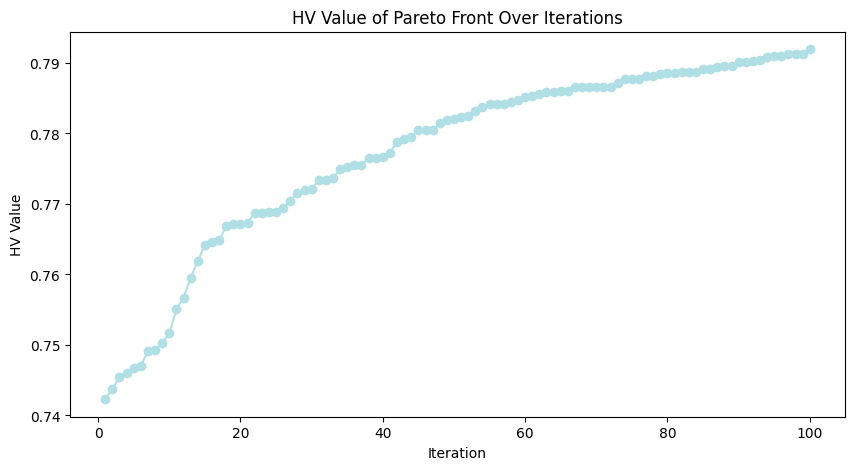

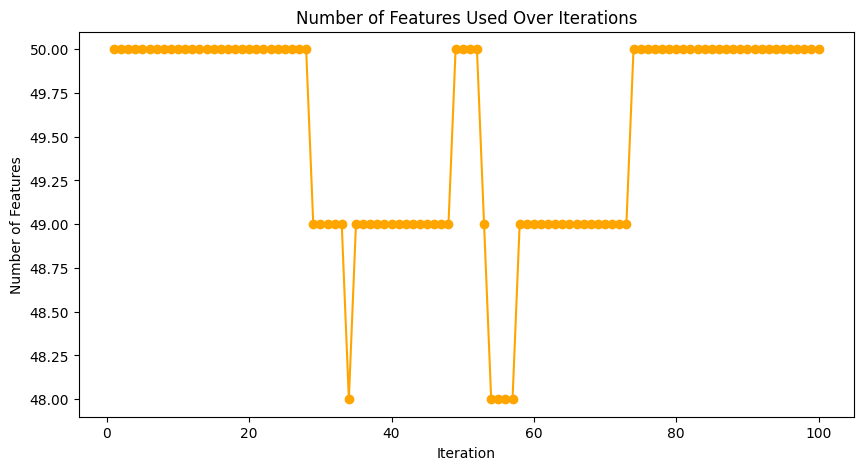

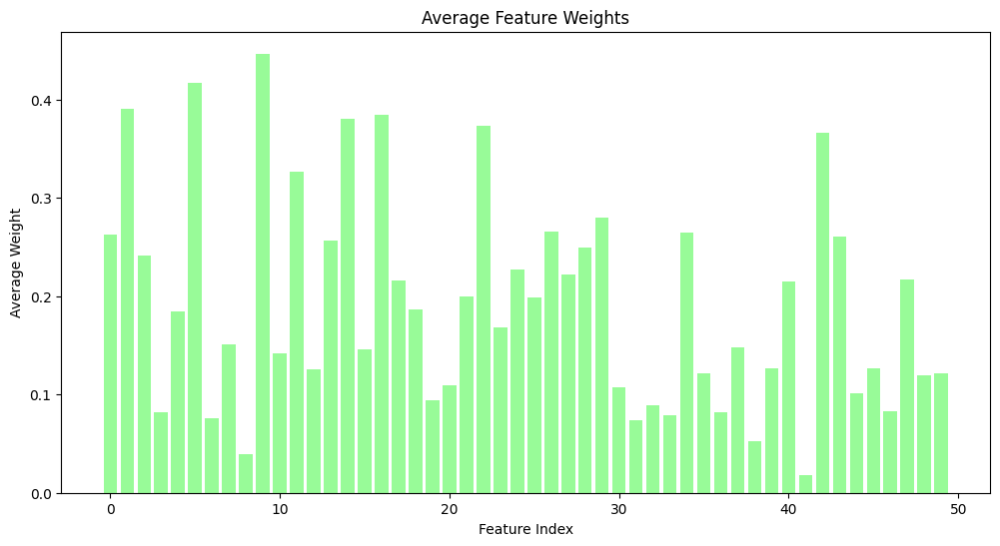

Total population members: 100
Pareto front members: 21


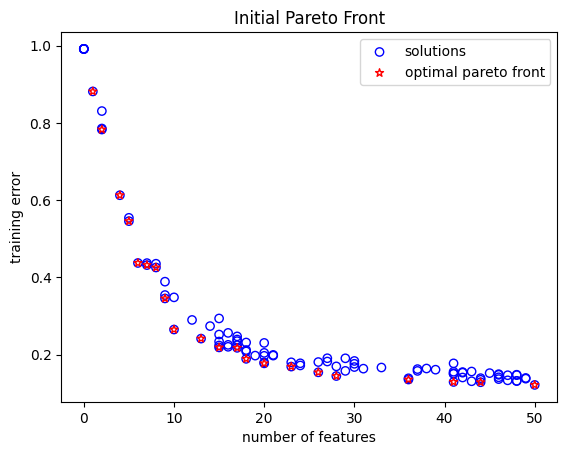

Total population members: 100
Pareto front members: 27


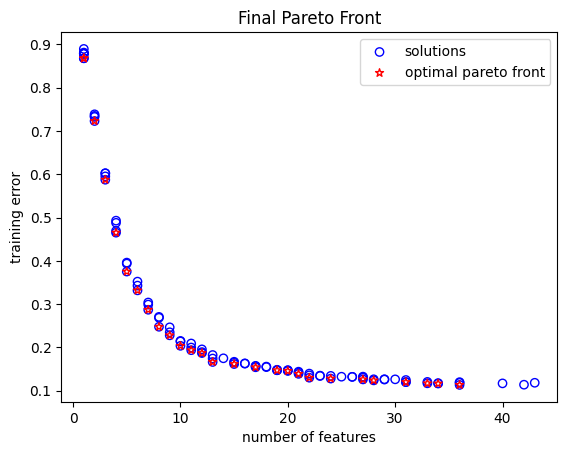

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 6.0
corresponding weights:  [0.17470538 0.15339953 0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0.17714474 0.15554141 0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
classification error on train sets: 0.33166426930546233
classification error on test sets: 0.37312707071439566
solution 1:
number of selected features is: 33.0
corresponding weights:  [0.47418825 0.39153276 0.         0.         0.99610327 0.90169187
 0.25655101 0.39656428 0.         0.82576154] ...
corresponding normalized weights:  [0.02642575 0.02181949 0.         0.         0.05551123 0.05024984
 0.01429718 0.02209989 0.         0.04601836] ...
classification error on train sets: 0.11685333151786437
classification error on test sets: 0.19031102750710505
solution 2:
number of selected

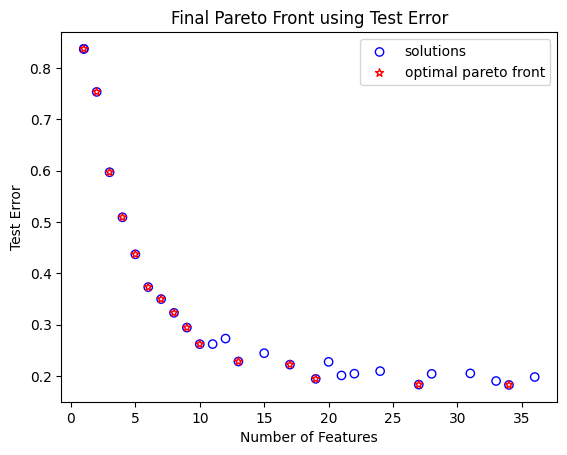

Final PF Results:  {0: {'num_selected_features': 6.0, 'feature_weights': [0.17470538045631137, 0.15339953404682552, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.22378499235768384, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.12147000955755466, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.15079773585404585, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.16207191174615426, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.33166426930546233, 'test_error': 0.37312707071439566}, 1: {'num_selected_features': 33.0, 'feature_weights': [0.47418824829219586, 0.3915327560796256, 0.0, 0.0, 0.9961032729597322, 0.9016918692705278, 0.2565510147807507, 0.3965642771644043, 0.0, 0.8257615399883974, 0.0, 0.6479232917834288, 0.27884334183341575, 0.20163159365446318, 0.9139116921980578, 0.0, 0.9275524165838641, 0.0, 0.0, 0.0, 0.0, 0.6016344977908141, 0.6863887683256971, 0.4451073770707759, 0.3991536450947563, 0.6021179908886708, 0.996951866531528, 0.0, 0.7886866114242129, 0.5136585546324248, 

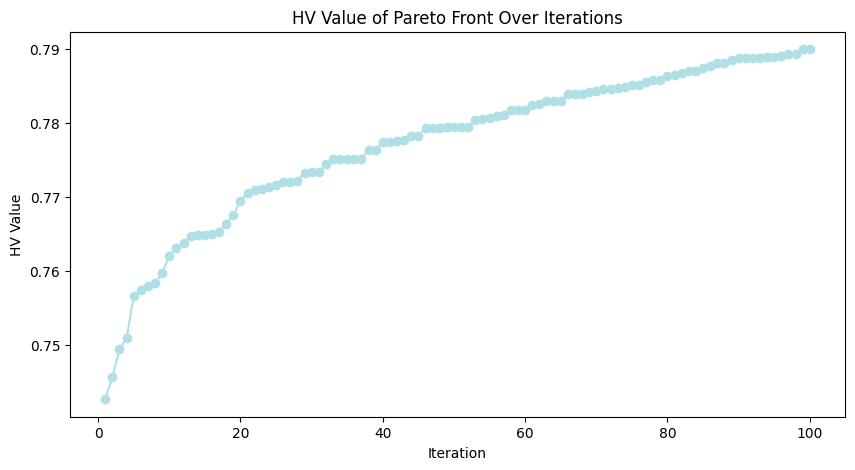

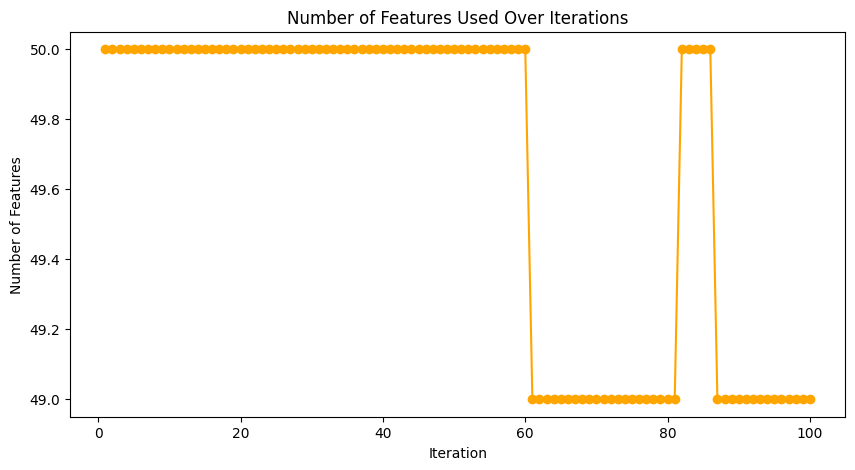

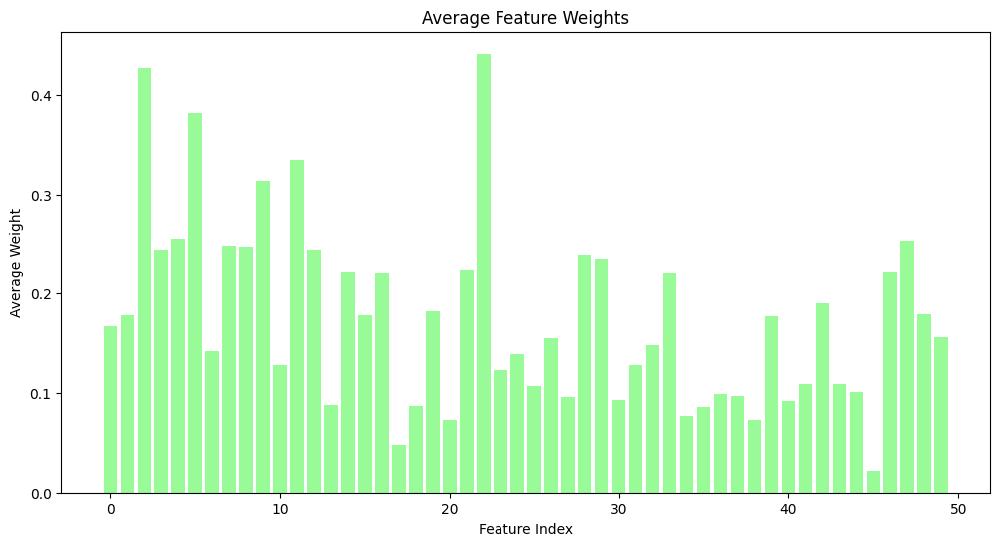

Total population members: 100
Pareto front members: 21


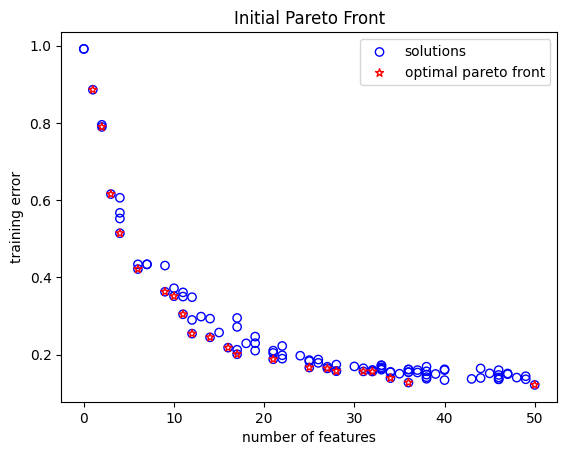

Total population members: 100
Pareto front members: 26


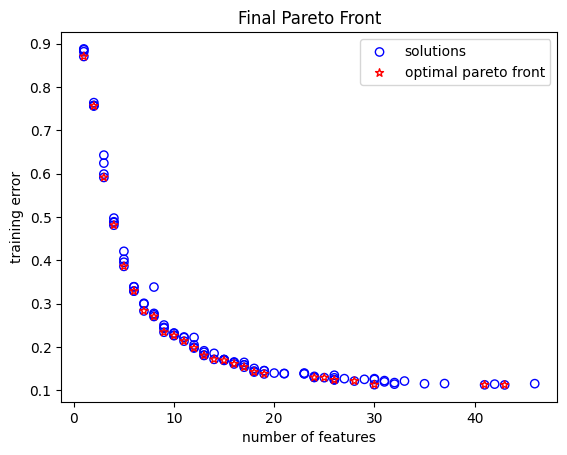

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 7.0
corresponding weights:  [0.         0.36861198 0.49524509 0.         0.         0.
 0.         0.         0.26938106 0.        ] ...
corresponding normalized weights:  [0.         0.1341078  0.18017925 0.         0.         0.
 0.         0.         0.09800577 0.        ] ...
classification error on train sets: 0.282939061158603
classification error on test sets: 0.28133321965093505
solution 1:
number of selected features is: 1.0
corresponding weights:  [0.         0.         0.78379316 0.         0.         0.
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.8701658728253405
classification error on test sets: 0.8763028041286546
solution 2:
number of selected features is: 2.0
corresponding weights:  [0.         0.         0.76902255 0.         0.     

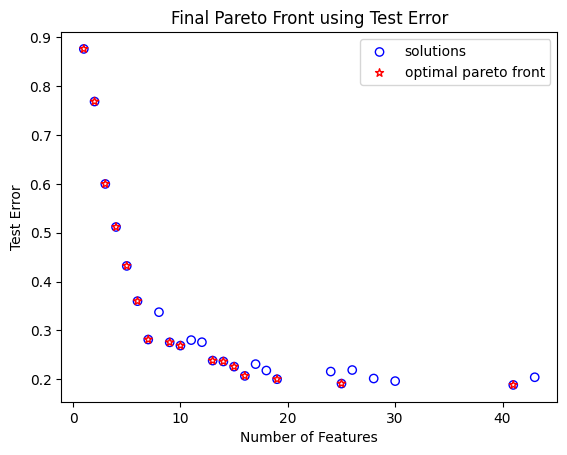

Final PF Results:  {0: {'num_selected_features': 7.0, 'feature_weights': [0.0, 0.36861198269452855, 0.4952450890502594, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2693810617123241, 0.0, 0.0, 0.535320182297984, 0.46569561124395475, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3547466024782152, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.25962390733123275, 0.0, 0.0], 'train_error': 0.282939061158603, 'test_error': 0.28133321965093505}, 1: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.7837931571862106, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.8701658728253405, 'test_error': 0.8763028041286546}, 2: {'num_selected_features': 2.0, 'feature_weights': [0.0, 0.0, 0.7690225465017322, 0.0, 0.0, 0.0, 0.0, 0.0,

In [41]:
# Re-run GDE3 with top 50 features, but with the following changes: compute correlation of top 50 features with the label, and make ONE individual in the initial population have weights equivalent to correlation values

# Read top 50 features
top_50 = pd.read_csv("Top_NSGA2_Features.csv").head(50)
print(top_50)

# Read validation data
validation_path = "KimiaNet_Data/kimianet_validation_data_averaged_feature_vectors.csv"
validation = pd.read_csv(validation_path)
dclass = validation.columns[0]
x = validation.drop(columns=[dclass])
y = validation[dclass]
featureNames = []
for i in top_50['Feature'].tolist():
    featureNames.append(x.columns[i-1]) #featureNames has feature names from 1-1024, not indices; so, to access feature x, we need to go to index i-1
x = x[featureNames]

# Read test data
test_path = "KimiaNet_Data/kimianet_test_data_averaged_feature_vectors.csv"
test = pd.read_csv(test_path)
dclass = test.columns[0]
xtest = test.drop(columns=[dclass])
ytest = test[dclass]
featureNames = []
for i in top_50['Feature'].tolist():
    featureNames.append(xtest.columns[i-1]) 
xtest = xtest[featureNames]

# Compute correlation using Mutual Information between features in training data (i.e., the validation set) and the label
mi_scores = mutual_info_classif(x, y)
mi_df = pd.DataFrame({
    'Feature': featureNames,
    'Mutual_Information': mi_scores
})
print(mi_df)

# Run GDE3 algorithm 10 times
epsilon = 0.01
total_features = x.shape[1] 
popsize = 100
print("TOTAL NUMBER OF FEATURES: ", total_features)
for run in range(10):
    print("*"*50, f"RUN {run+1}", "*"*50)
    dataset_name = f"RUN {run+1}: GDE3 Kimianet Feature Weighting w/ Correlation"

    # Initialize population with ONE individual having weights corresponding to correlation values
    custom_population = generate_individuals(total_features, epsilon, popsize)
    replacement = np.random.randint(0, popsize)
    custom_population[replacement] = mi_scores
    print(f"Replaced individual at index {replacement} with correlation-based weights: {mi_scores[:5]}...")
    pop = Population.new("X", custom_population)

    problem = MyProblem(x,y,epsilon)
    Evaluator().eval(problem, pop) # evaluate initial population
    algorithm = GDE3(pop_size=popsize,
                    variant="DE/rand/1/bin", # selection = random, crossover = binary
                    CR=0.5, # crossover parameter [0,1]
                    F=(0.0, 0.9), # scale factor or mutation parameter (0,2]
                    sampling = pop
                    )
    res = minimize(problem,
                    algorithm,
                    ("n_gen", 100),
                    verbose=True, # prints results if true
                    save_history=True
                    )
    
    final_pf_results, final_test_pf_results, lowest_train_error_solution, lowest_test_error_solution, hv_test, hv_training = visualize(res, x, y, xtest, ytest, epsilon)
    store_results(dataset_name, final_pf_results, final_test_pf_results, lowest_train_error_solution, lowest_test_error_solution, hv_test, hv_training, epsilon, featureNames)

    Feature  Occurrences
0      1022          114
1       996           99
2       976           99
3       708           89
4       766           86
5       955           85
6       630           82
7       881           79
8       793           78
9       545           77
10      769           75
11      781           74
12      855           73
13      767           72
14      819           69
15      841           65
16      982           65
17      790           62
18      586           61
19      845           59
20      794           59
21      898           59
22      773           56
23      735           53
24      918           52
25      698           50
26     1005           49
27      911           49
28      756           49
29      877           48
30      935           48
31      669           45
32      836           45
33     1017           44
34      625           43
35      763           43
36      888           43
37      978           42
38      737           42


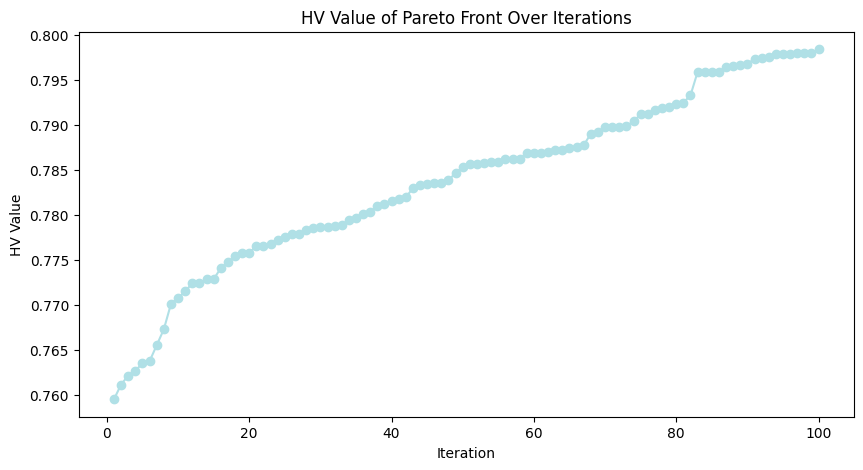

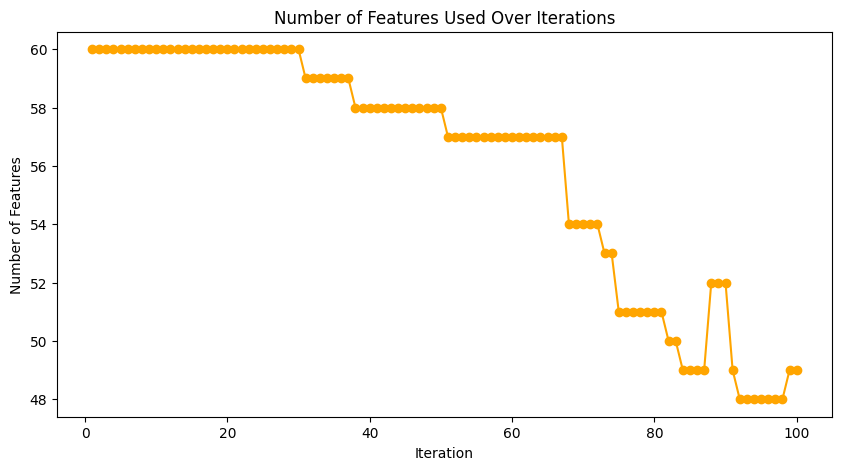

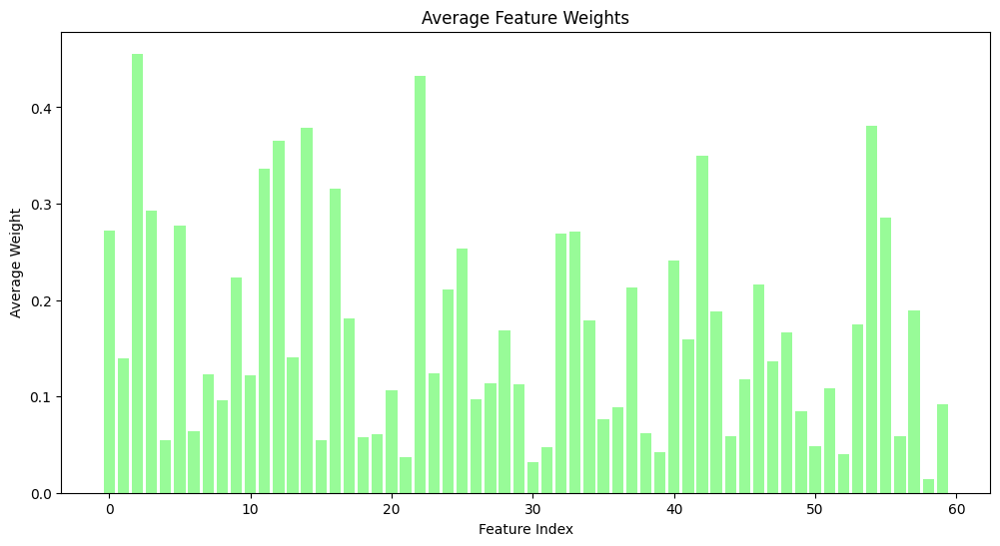

Total population members: 100
Pareto front members: 20


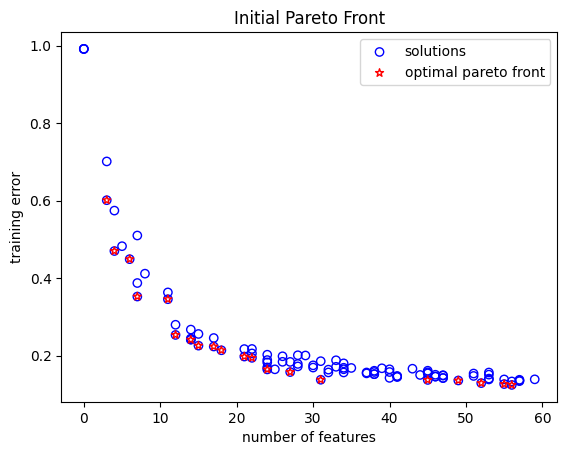

Total population members: 100
Pareto front members: 24


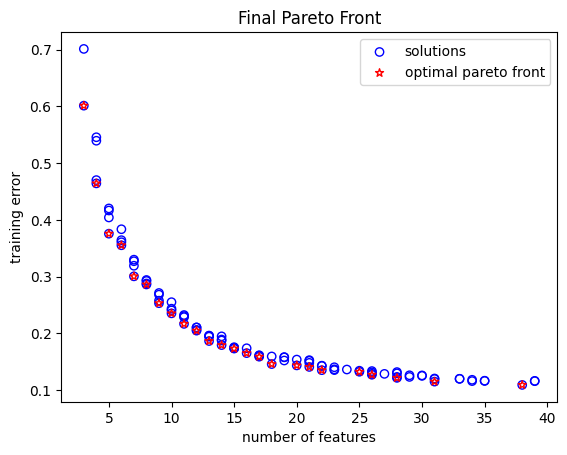

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 25.0
corresponding weights:  [0.         0.         0.91362302 0.62357605 0.         0.94128284
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0.         0.         0.05588839 0.03814556 0.         0.05758041
 0.         0.         0.         0.        ] ...
classification error on train sets: 0.132385686624095
classification error on test sets: 0.21420860612839754
solution 1:
number of selected features is: 38.0
corresponding weights:  [0.21671249 0.         0.91362302 0.46434597 0.         0.94128284
 0.         0.         0.         0.51518585] ...
corresponding normalized weights:  [0.0094325  0.         0.03976581 0.02021085 0.         0.04096971
 0.         0.         0.         0.02242367] ...
classification error on train sets: 0.10921654708682926
classification error on test sets: 0.18554829951880747
solution 2:
num

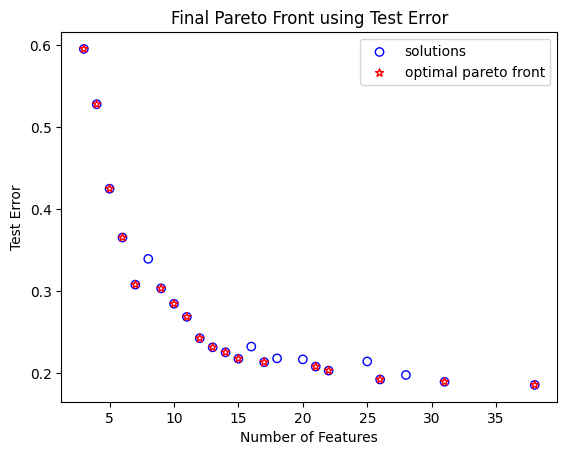

Final PF Results:  {0: {'num_selected_features': 25.0, 'feature_weights': [0.0, 0.0, 0.9136230169255328, 0.6235760474774893, 0.0, 0.9412828412316899, 0.0, 0.0, 0.0, 0.0, 0.7478498441983246, 0.7380146463776102, 0.9882717146679164, 0.5316761376775611, 0.908394280724018, 0.0, 0.5914114313682183, 0.0, 0.0, 0.0, 0.145192546814027, 0.0, 0.8937084752117934, 0.0, 0.0, 0.0, 0.0, 0.0826709594568187, 0.5484805051118515, 0.0, 0.0, 0.0, 0.841216822559948, 0.8222800006179876, 0.9814152363127328, 0.0, 0.0, 0.5043566032958299, 0.25872238910578305, 0.0, 0.5478912954104269, 0.0, 0.9262698483331484, 0.8535290005329983, 0.0, 0.526794349044814, 0.4124690034823561, 0.0, 0.0, 0.0, 0.0, 0.30165993823863546, 0.0, 0.0, 0.7165190483655428, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.132385686624095, 'test_error': 0.21420860612839754}, 1: {'num_selected_features': 38.0, 'feature_weights': [0.21671248846067093, 0.0, 0.9136230169255328, 0.4643459677853335, 0.0, 0.9412828412316899, 0.0, 0.0, 0.0, 0.5151858466909102, 

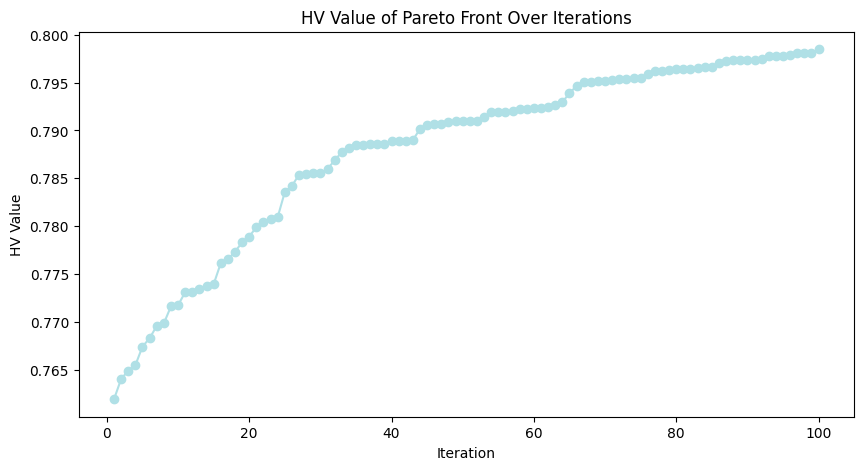

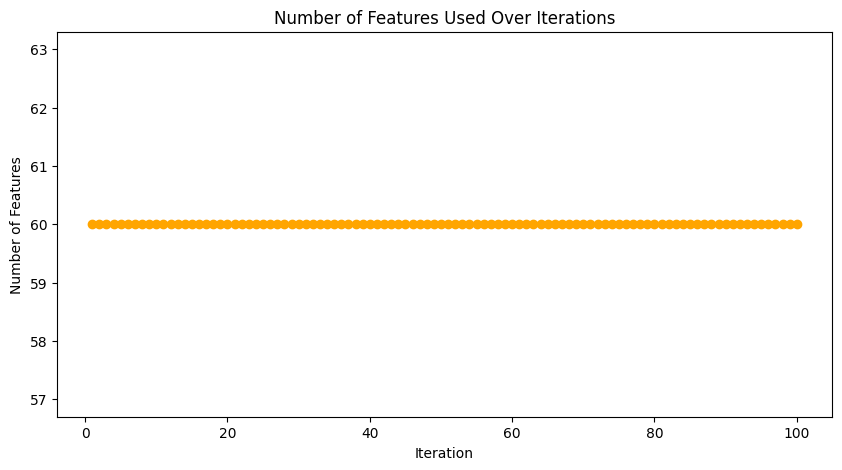

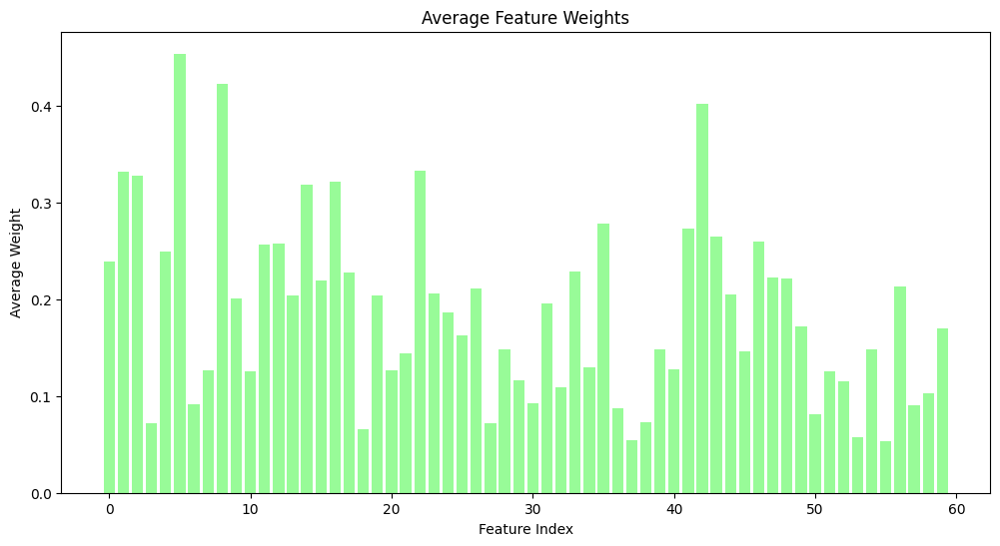

Total population members: 100
Pareto front members: 20


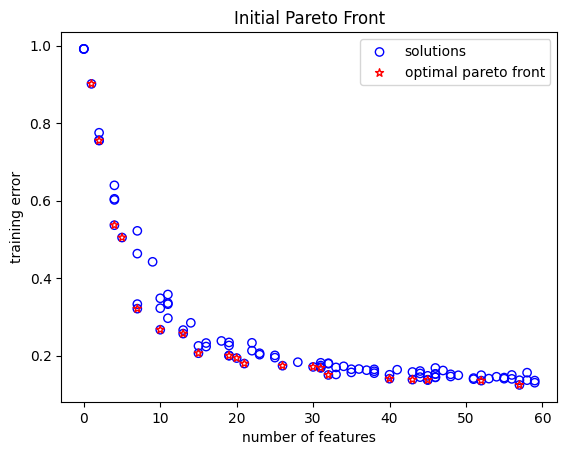

Total population members: 100
Pareto front members: 30


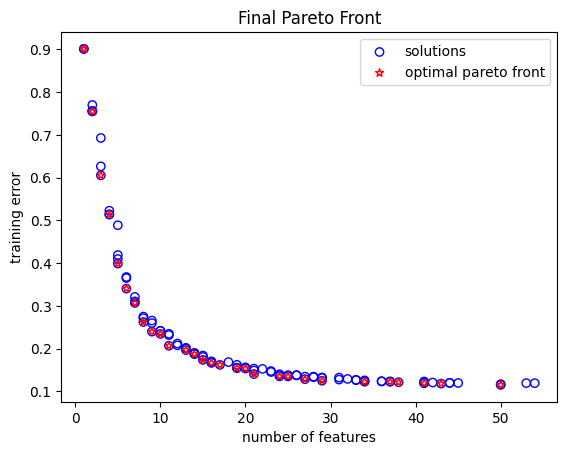

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 2.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.7547068480059886
classification error on test sets: 0.7528459144758175
solution 1:
number of selected features is: 4.0
corresponding weights:  [0.         0.         0.         0.         0.80988728 0.
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0.         0.         0.         0.         0.42847297 0.
 0.         0.         0.         0.        ] ...
classification error on train sets: 0.5134838516601588
classification error on test sets: 0.5374232454033439
solution 2:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification err

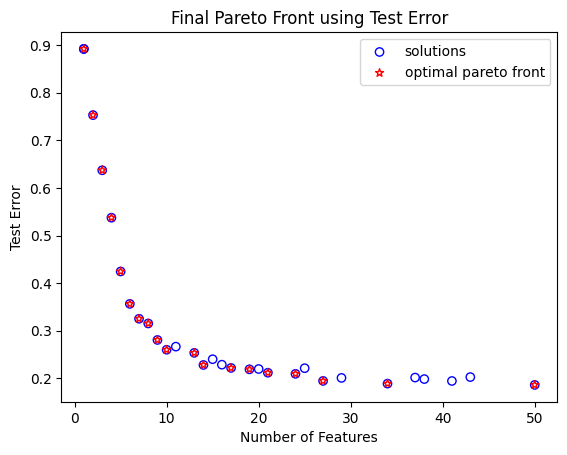

Final PF Results:  {0: {'num_selected_features': 2.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.4528629943058758, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.383833362709897, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.7547068480059886, 'test_error': 0.7528459144758175}, 1: {'num_selected_features': 4.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.8098872837945287, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2763701049048929, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.4200804731874148, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.383833362709897, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.5134838516601588, 'test_error': 0.5374232454033439}, 2: {'num_selected_features': 1.0, 'feature

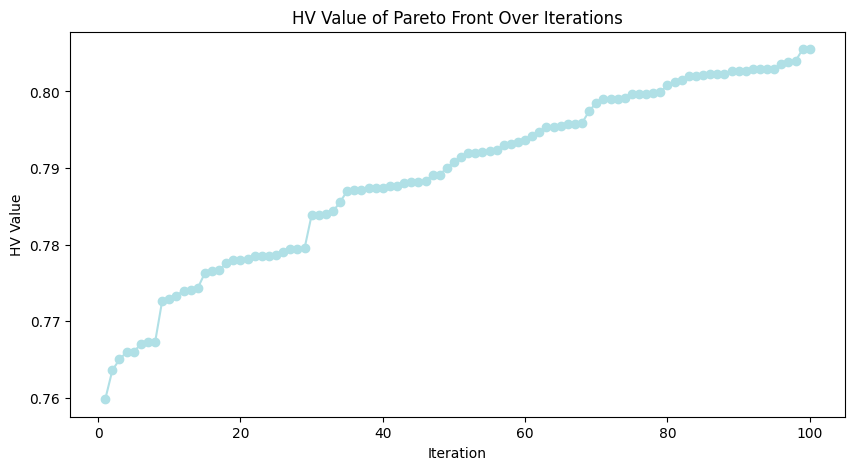

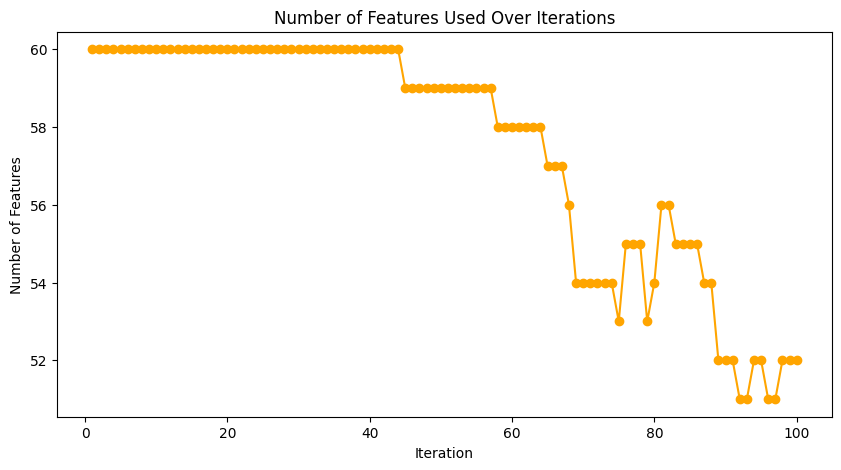

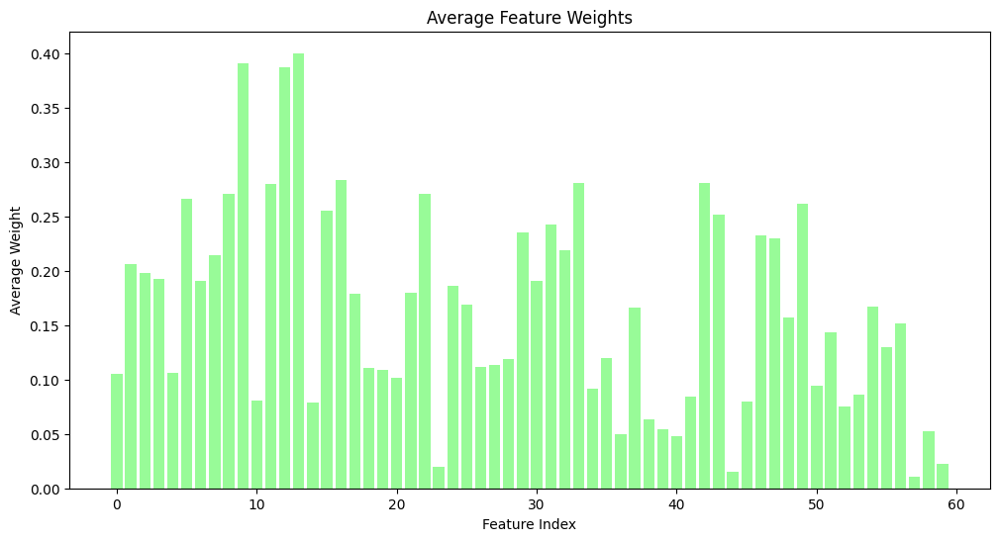

Total population members: 100
Pareto front members: 20


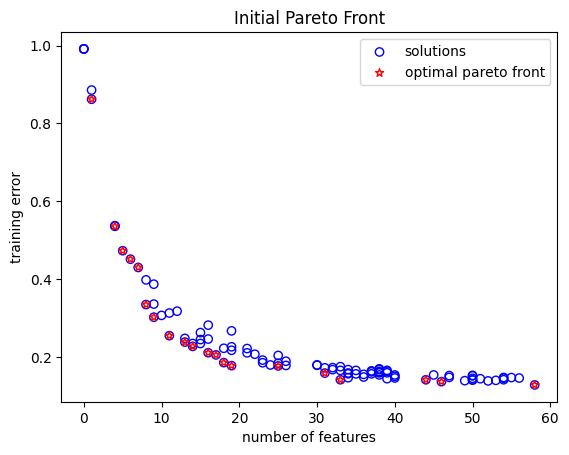

Total population members: 100
Pareto front members: 26


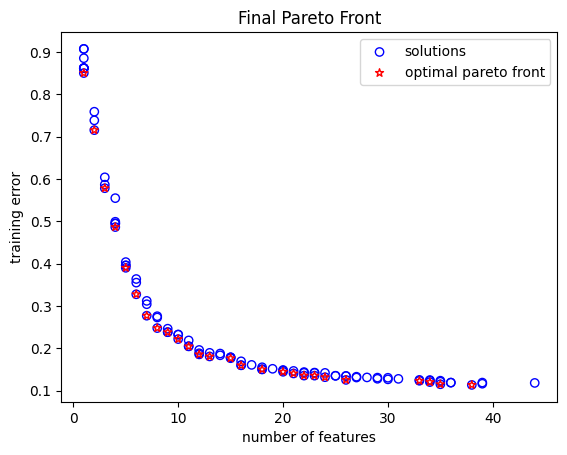

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 8.0
corresponding weights:  [0.         0.65099086 0.         0.         0.         0.
 0.37165473 0.         0.         0.        ] ...
corresponding normalized weights:  [0.         0.12740382 0.         0.         0.         0.
 0.07273563 0.         0.         0.        ] ...
classification error on train sets: 0.2478797741396508
classification error on test sets: 0.3168168734074467
solution 1:
number of selected features is: 9.0
corresponding weights:  [0.         0.64694444 0.         0.         0.         0.
 0.36924838 0.         0.         0.83599854] ...
corresponding normalized weights:  [0.         0.11073424 0.         0.         0.         0.
 0.06320239 0.         0.         0.14309368] ...
classification error on train sets: 0.23810643745456772
classification error on test sets: 0.27504481531673963
solution 2:
number of selected features is: 7.0
c

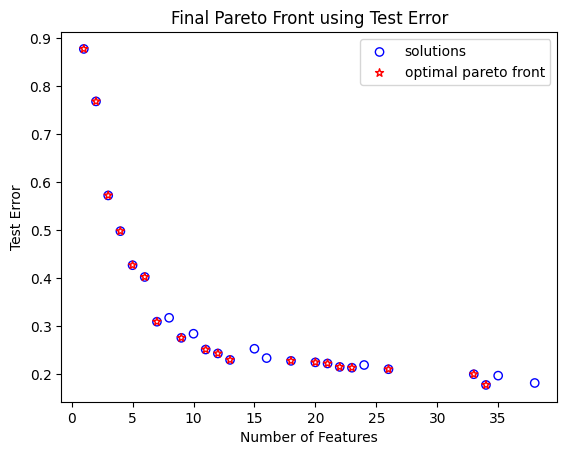

Final PF Results:  {0: {'num_selected_features': 8.0, 'feature_weights': [0.0, 0.6509908557443271, 0.0, 0.0, 0.0, 0.0, 0.37165473232333557, 0.0, 0.0, 0.0, 0.0, 0.0, 0.9307170923143134, 0.8066592046537908, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7810292217413525, 0.0, 0.0, 0.0, 0.4080396898193754, 0.0, 0.0, 0.0, 0.0, 0.4880126311280572, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6725618426093856, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.2478797741396508, 'test_error': 0.3168168734074467}, 1: {'num_selected_features': 9.0, 'feature_weights': [0.0, 0.6469444435153474, 0.0, 0.0, 0.0, 0.0, 0.3692483750636363, 0.0, 0.0, 0.8359985419284813, 0.0, 0.5295466476705429, 0.9307170923143134, 0.8066580606936228, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5675905995996461, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.4830505893389397, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6725618426093856, 0.0, 0.0, 0.0, 0.0, 0.0, 

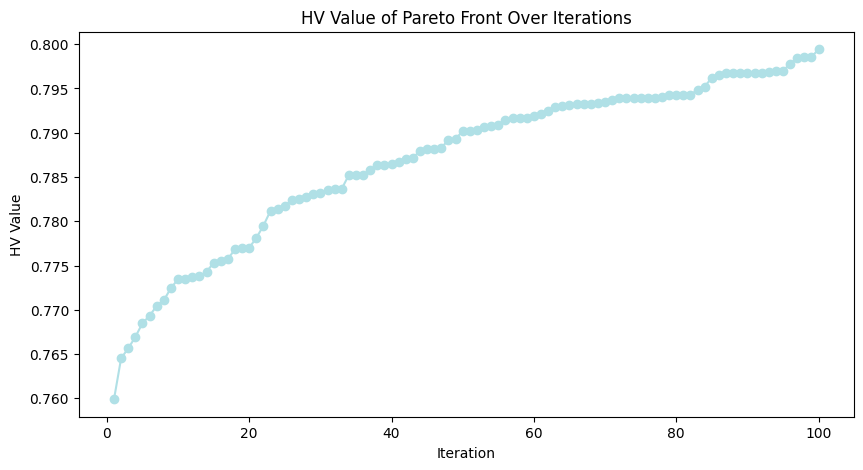

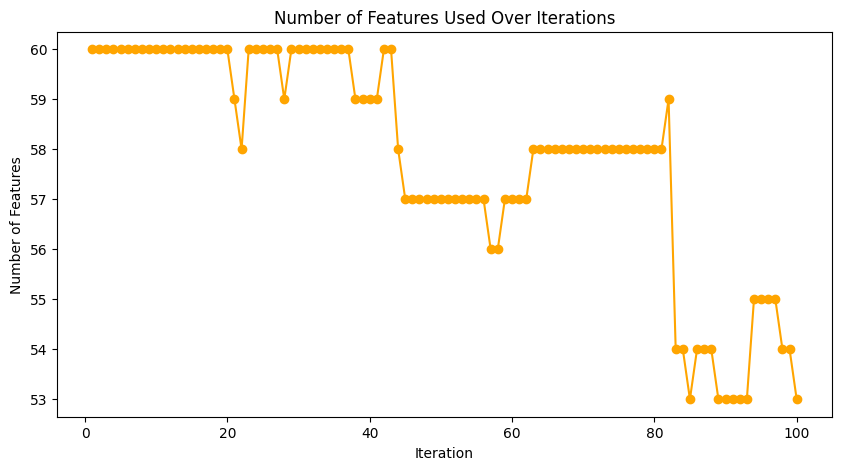

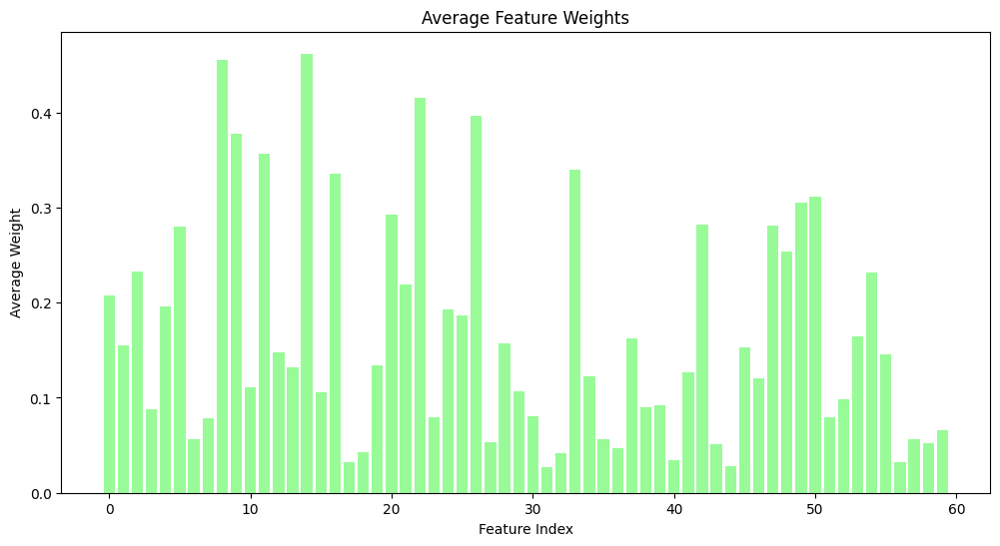

Total population members: 100
Pareto front members: 17


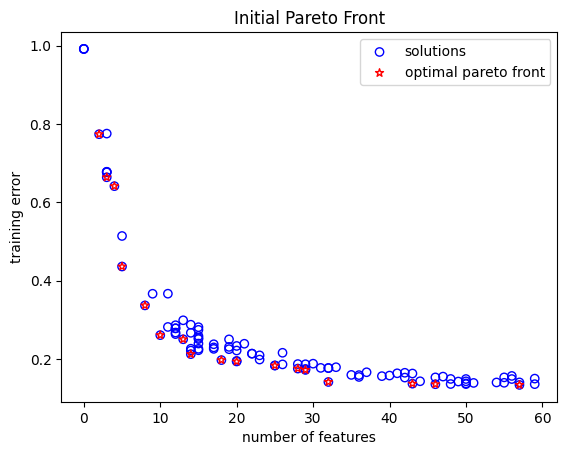

Total population members: 100
Pareto front members: 28


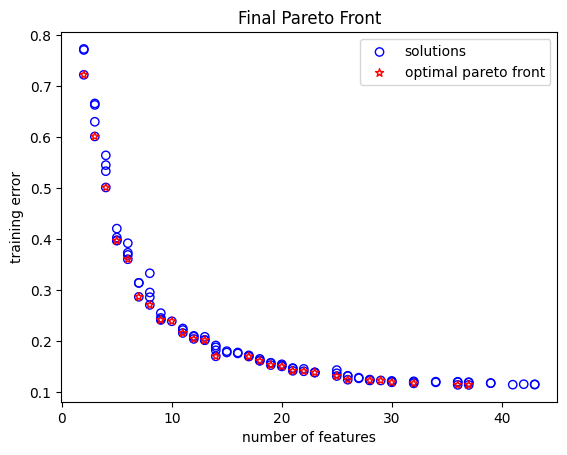

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 7.0
corresponding weights:  [0.24768381 0.         0.         0.         0.         0.48449245
 0.         0.         0.24892547 0.        ] ...
corresponding normalized weights:  [0.09650485 0.         0.         0.         0.         0.18877242
 0.         0.         0.09698864 0.        ] ...
classification error on train sets: 0.2871833882471463
classification error on test sets: 0.33717937891045646
solution 1:
number of selected features is: 13.0
corresponding weights:  [0.24768381 0.65680237 0.         0.         0.         0.48449245
 0.         0.         0.81543918 0.        ] ...
corresponding normalized weights:  [0.0383505  0.101697   0.         0.         0.         0.07501713
 0.         0.         0.12625978 0.        ] ...
classification error on train sets: 0.2019896319371276
classification error on test sets: 0.24551960287232766
solution 2:
numb

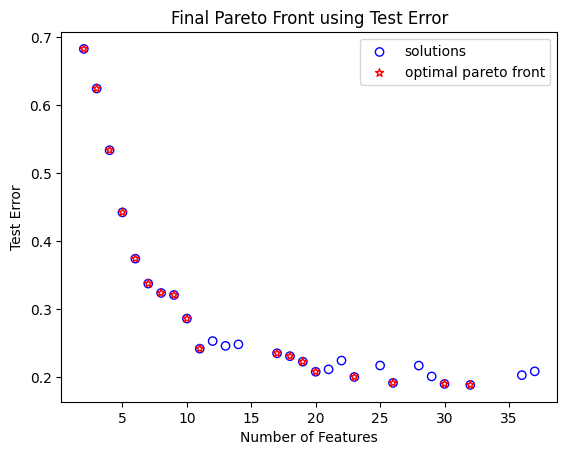

Final PF Results:  {0: {'num_selected_features': 7.0, 'feature_weights': [0.2476838083751106, 0.0, 0.0, 0.0, 0.0, 0.4844924456214733, 0.0, 0.0, 0.248925473477507, 0.0, 0.0, 0.38716151603529925, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3638817167166938, 0.0, 0.0, 0.4752071273820361, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3591904340156266, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.2871833882471463, 'test_error': 0.33717937891045646}, 1: {'num_selected_features': 13.0, 'feature_weights': [0.2476838083751106, 0.6568023722686543, 0.0, 0.0, 0.0, 0.4844924456214733, 0.0, 0.0, 0.8154391847553815, 0.0, 0.0, 0.6010341439762831, 0.0, 0.0, 0.4912870390637356, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6272957581444536, 0.0, 0.8943832264266102, 0.0, 0.0, 0.0, 0.3638817167166938, 0.0, 0.29730207703158595, 0.4752071273820361, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

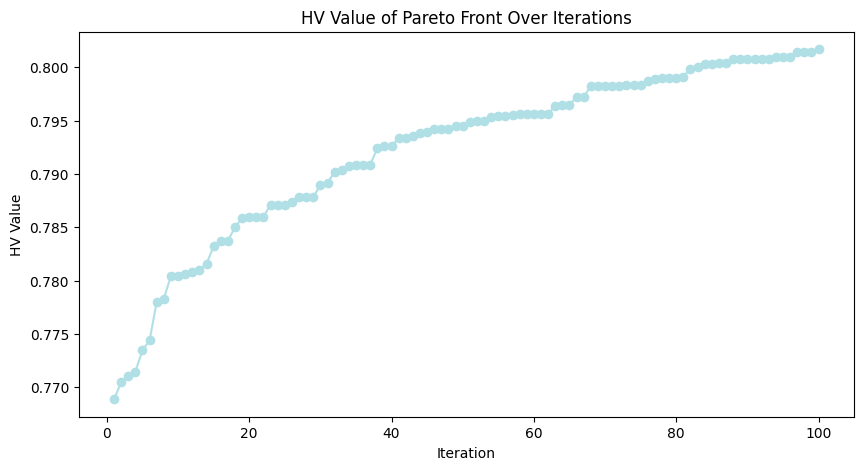

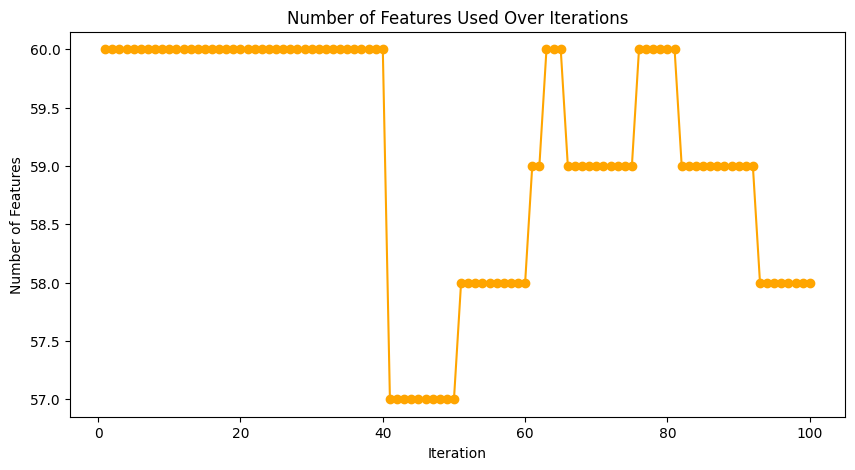

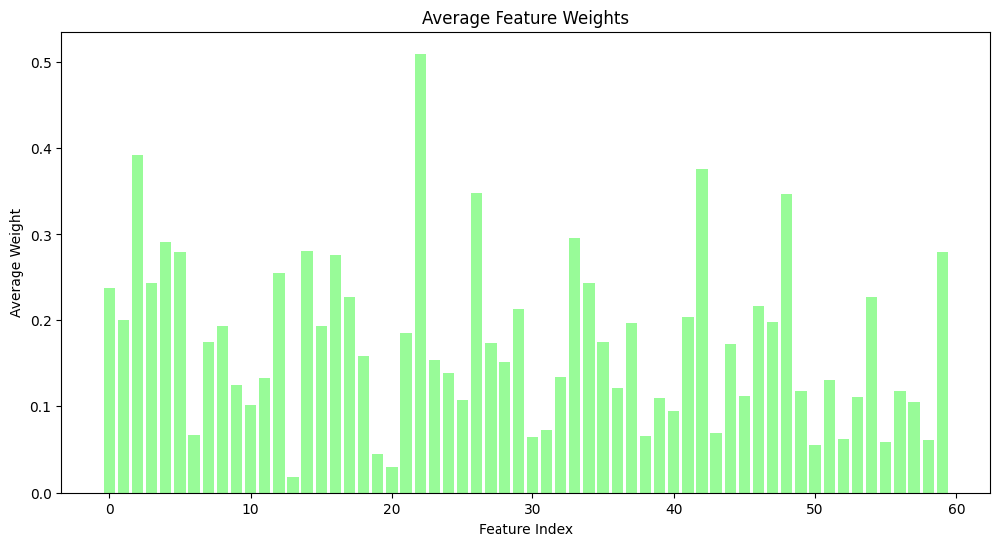

Total population members: 100
Pareto front members: 22


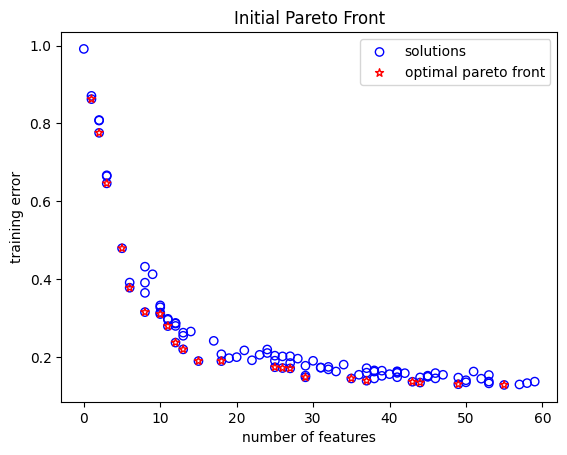

Total population members: 100
Pareto front members: 25


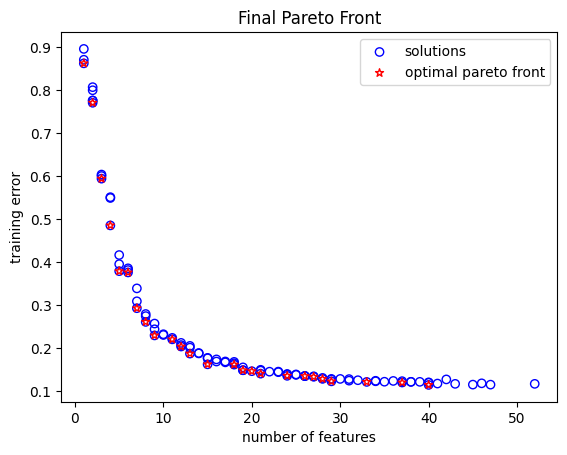

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 6.0
corresponding weights:  [0.         0.37325158 0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0.         0.11416314 0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
classification error on train sets: 0.37553358167004114
classification error on test sets: 0.4260399515359492
solution 1:
number of selected features is: 5.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.37852636394634953
classification error on test sets: 0.4493636085345255
solution 2:
number of selected features is: 2.0
corresponding weights:  [0.         0.02365262 0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
corresponding 

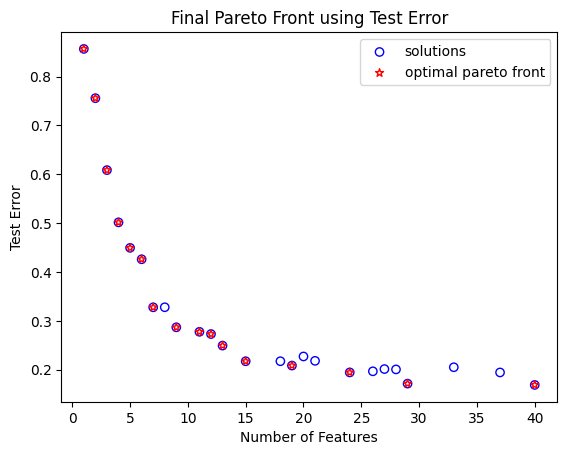

Final PF Results:  {0: {'num_selected_features': 6.0, 'feature_weights': [0.0, 0.3732515785458935, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6396159900277706, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.12954408821685554, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6883035674409241, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.4717252704103326, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.9670175010601177], 'train_error': 0.37553358167004114, 'test_error': 0.4260399515359492}, 1: {'num_selected_features': 5.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5880783949568877, 0.0, 0.0, 0.0, 0.0, 0.8013162824131879, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7746708707766533, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8794676435457904, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.9670175010601177], 'train_error': 0.3785263639463495

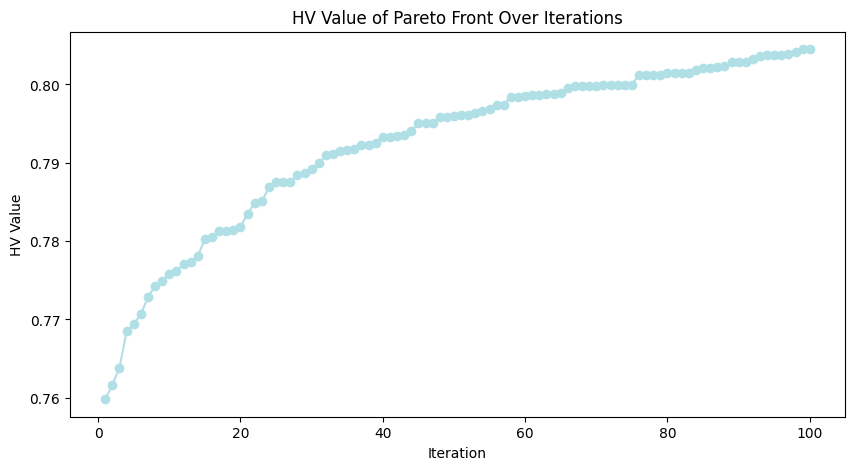

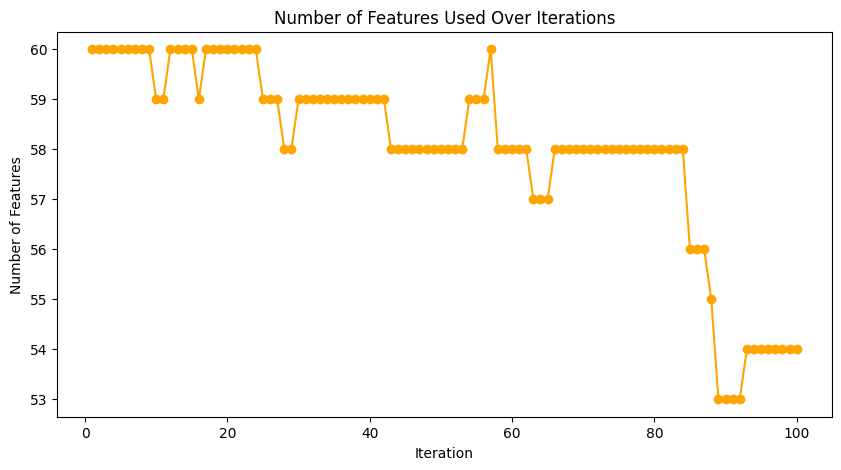

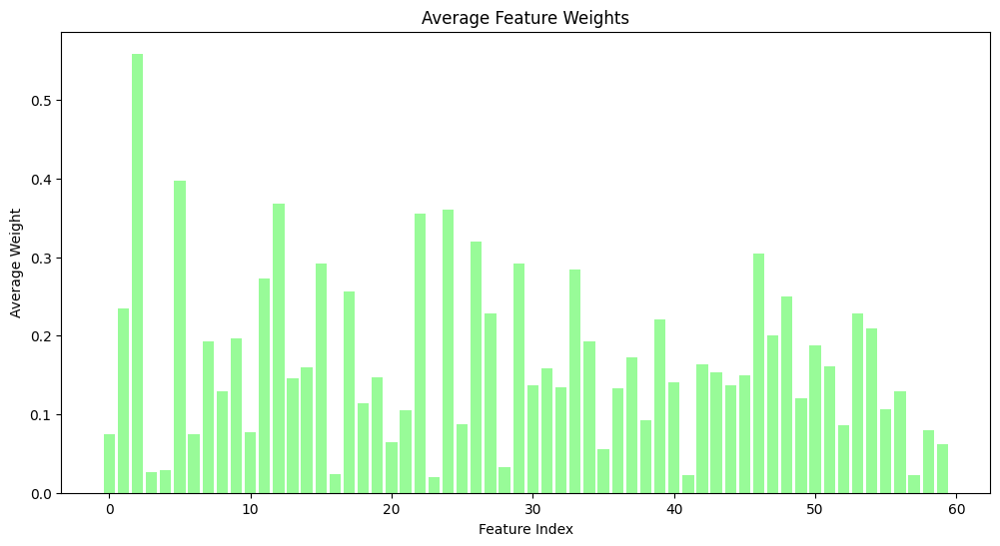

Total population members: 100
Pareto front members: 24


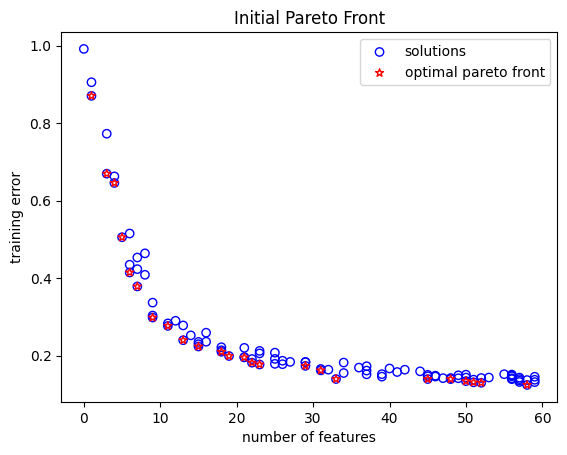

Total population members: 100
Pareto front members: 27


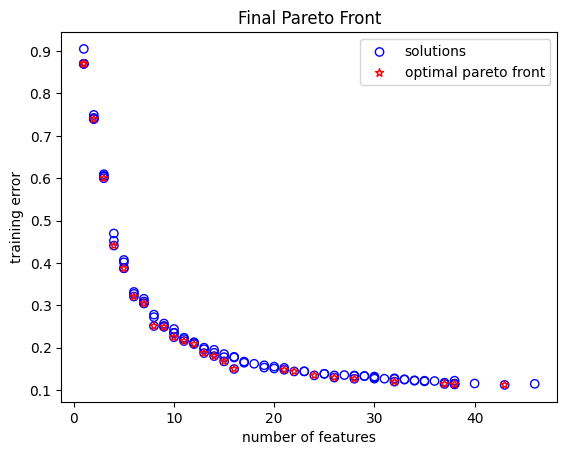

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 1.0
corresponding weights:  [0.         0.         0.63287526 0.         0.         0.
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.8701658728253405
classification error on test sets: 0.8763028041286546
solution 1:
number of selected features is: 1.0
corresponding weights:  [0.         0.         0.63287526 0.         0.         0.
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.8701658728253405
classification error on test sets: 0.8763028041286546
solution 2:
number of selected features is: 1.0
corresponding weights:  [0.         0.         0.63287526 0.         0.         0.
 0.         0.         0.         0.        ] ...
corresponding no

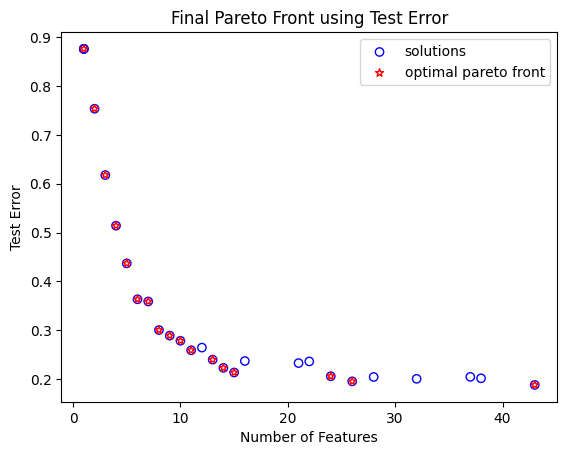

Final PF Results:  {0: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.6328752623789039, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.8701658728253405, 'test_error': 0.8763028041286546}, 1: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.6328752623789039, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.8701658728253405, 'test_error': 0.8763028041286546}, 2: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.6328752623789039, 0.0, 0.0, 0.0, 0

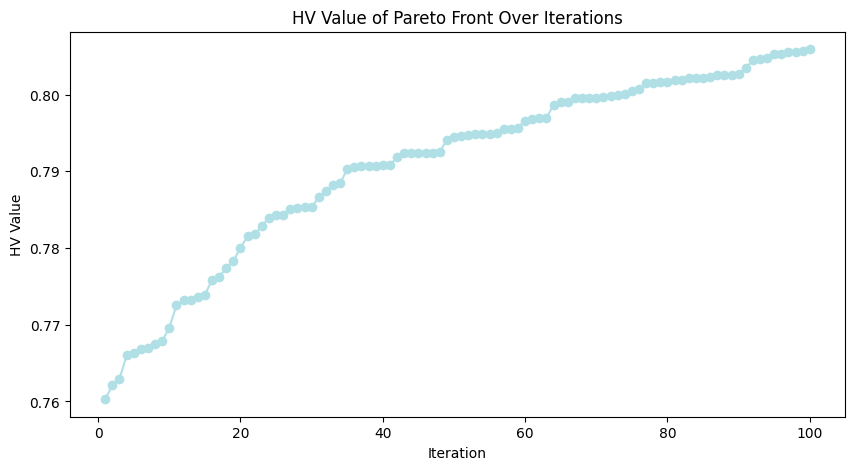

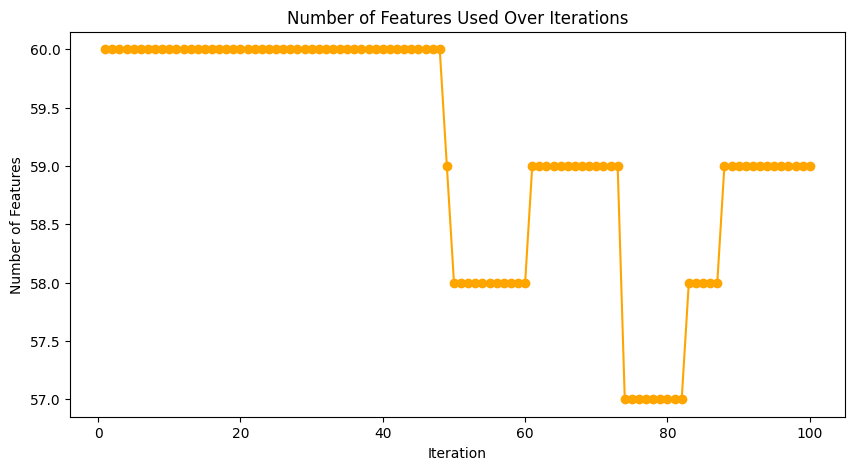

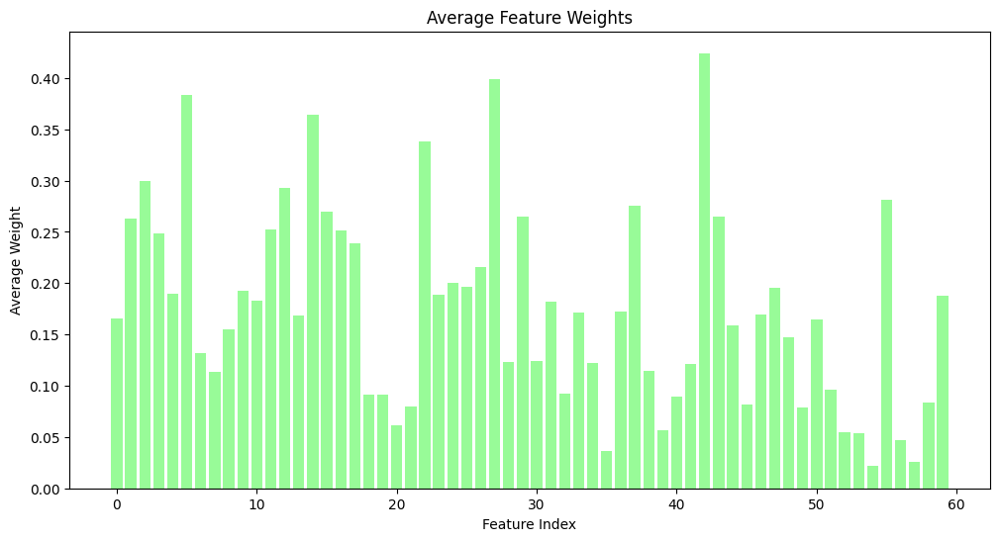

Total population members: 100
Pareto front members: 18


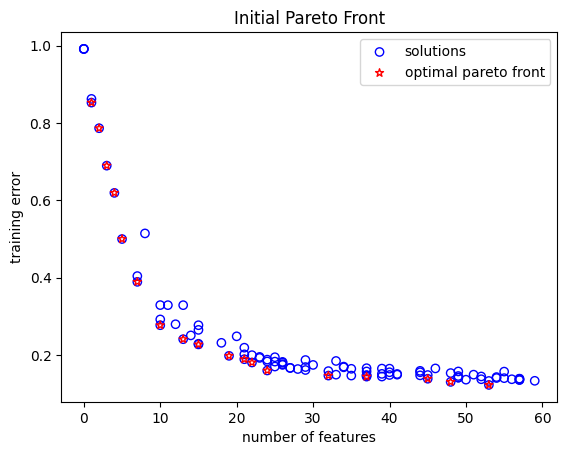

Total population members: 100
Pareto front members: 27


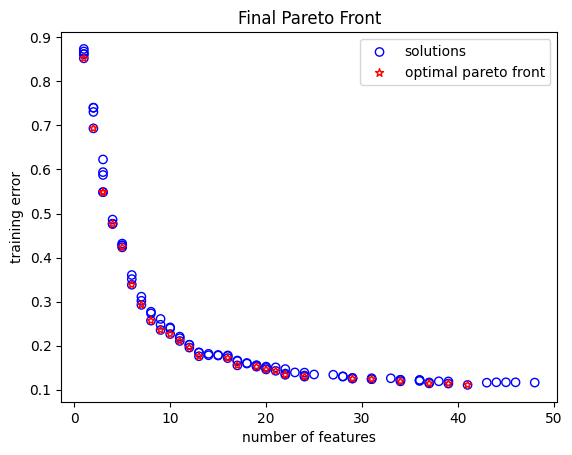

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 1.0
corresponding weights:  [0.         0.         0.         0.74392266 0.         0.
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.8525158032376722
classification error on test sets: 0.8494750751709216
solution 1:
number of selected features is: 4.0
corresponding weights:  [0.         0.         0.         0.74392266 0.         0.
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0.         0.         0.         0.43613935 0.         0.
 0.         0.         0.         0.        ] ...
classification error on train sets: 0.4759893884260893
classification error on test sets: 0.49669312687694545
solution 2:
number of selected features is: 8.0
corresponding weights:  [0.         0.22369888 0.         0.         0.    

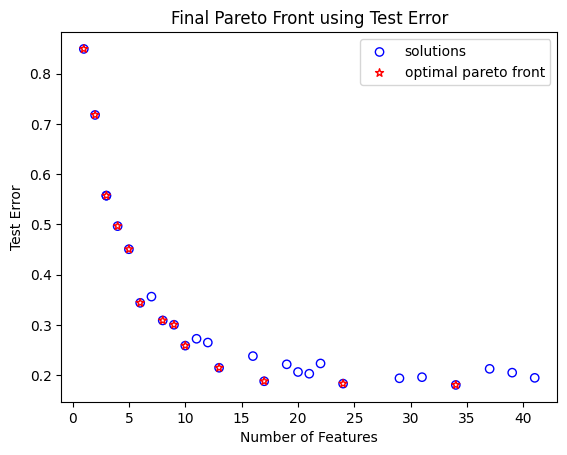

Final PF Results:  {0: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.7439226588844939, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.8525158032376722, 'test_error': 0.8494750751709216}, 1: {'num_selected_features': 4.0, 'feature_weights': [0.0, 0.0, 0.0, 0.7439226588844939, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.30086857650118676, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.34188277340638384, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3190254575637849, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.4759893884260893, 'test_error': 0.49669312687694545}, 2: {'num_selected_features': 8.0, 'feature_weights':

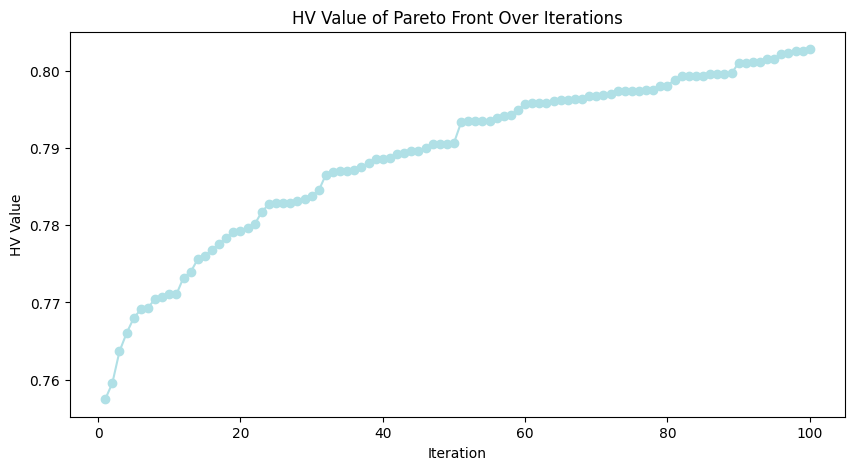

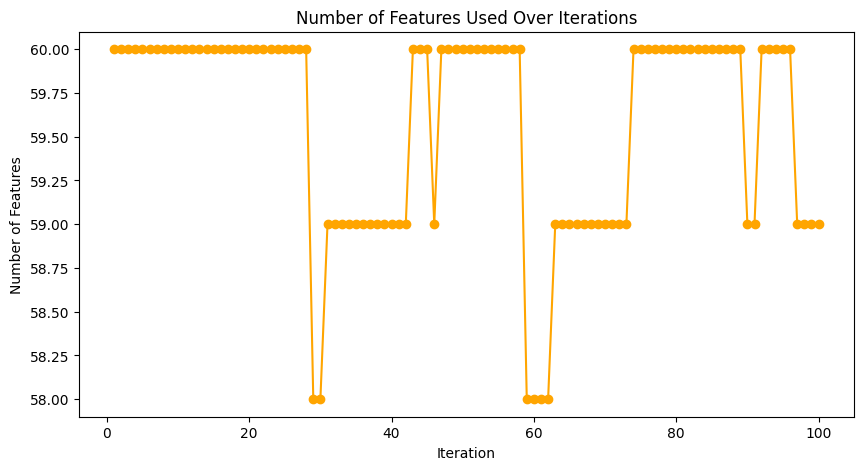

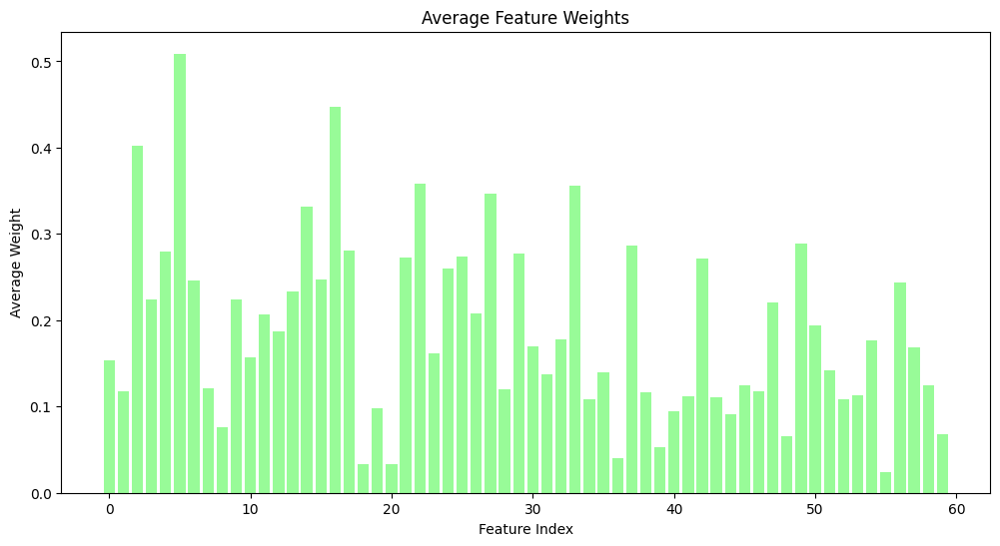

Total population members: 100
Pareto front members: 20


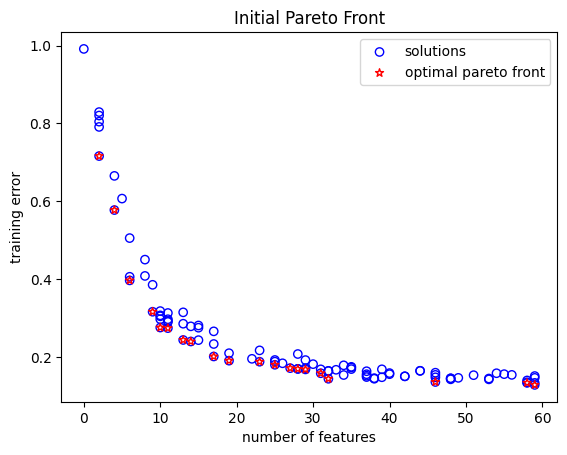

Total population members: 100
Pareto front members: 27


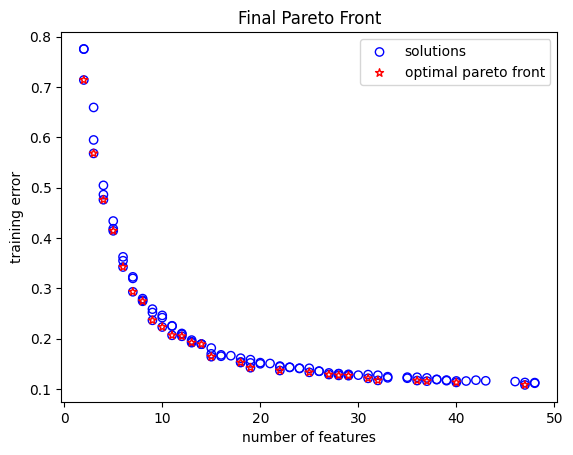

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 2.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.7137256511333595
classification error on test sets: 0.7675002586056822
solution 1:
number of selected features is: 13.0
corresponding weights:  [0.         0.         0.         0.5905366  0.         0.57920553
 0.         0.37813094 0.         0.        ] ...
corresponding normalized weights:  [0.         0.         0.         0.09245812 0.         0.09068405
 0.         0.05920255 0.         0.        ] ...
classification error on train sets: 0.19186524703812113
classification error on test sets: 0.24174921246820347
solution 2:
number of selected features is: 19.0
corresponding weights:  [0.         0.         0.93274782 0.         0.         0.73600007
 0.         0.         0.         0.76

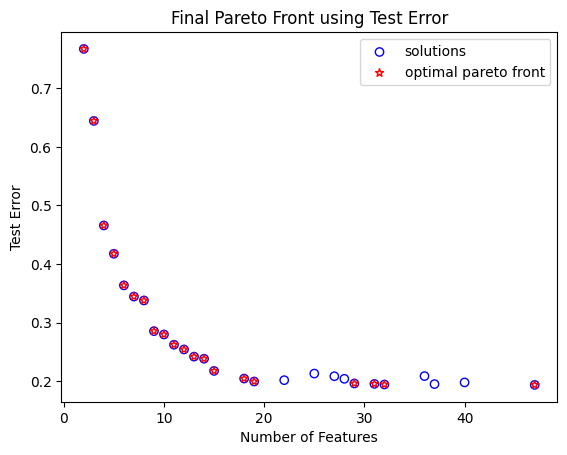

Final PF Results:  {0: {'num_selected_features': 2.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7803512854758563, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7470557765229577, 0.0, 0.0], 'train_error': 0.7137256511333595, 'test_error': 0.7675002586056822}, 1: {'num_selected_features': 13.0, 'feature_weights': [0.0, 0.0, 0.0, 0.5905366018911798, 0.0, 0.5792055337349475, 0.0, 0.3781309420699523, 0.0, 0.0, 0.0, 0.0, 0.0, 0.319353967370621, 0.0, 0.0, 0.4067875452264143, 0.7509777666165437, 0.0, 0.0, 0.0, 0.0, 0.0, 0.35696613663037996, 0.0, 0.0, 0.0, 0.6354142166511931, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5139391515395597, 0.0, 0.0, 0.0, 0.49931612339325204, 0.0, 0.0, 0.0, 0.0, 0.5782856909375619, 0.35435452311580773, 0.0, 0.4238032959788497, 0.0, 0.0, 0.0, 0.0, 0.0

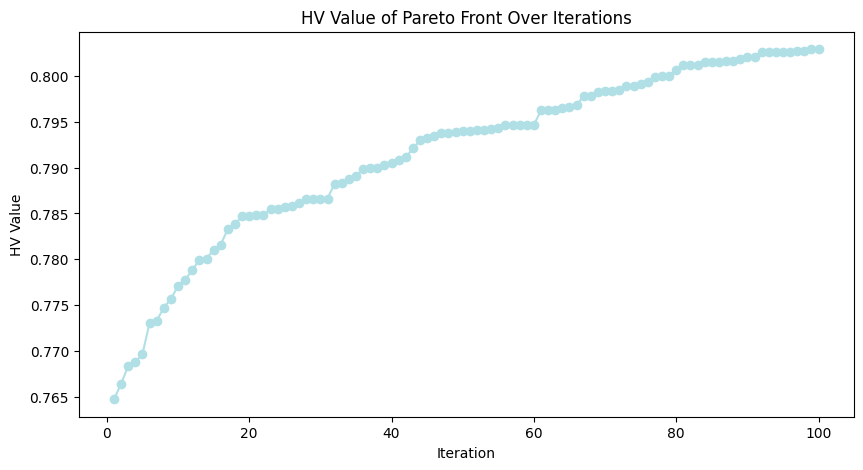

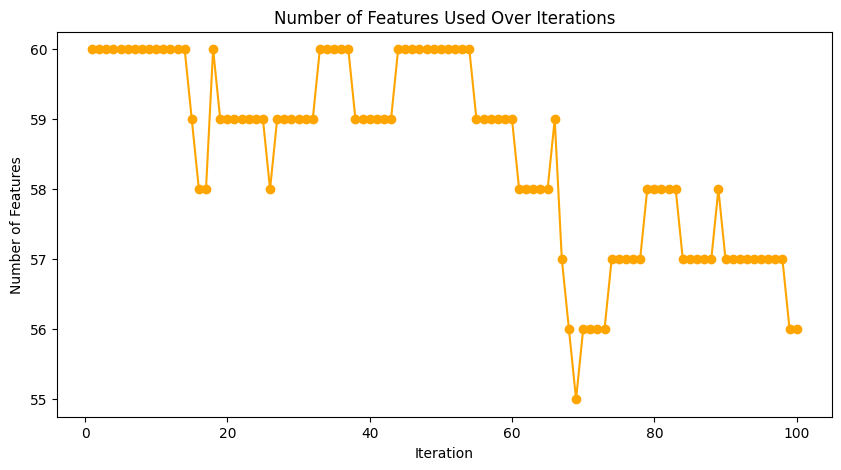

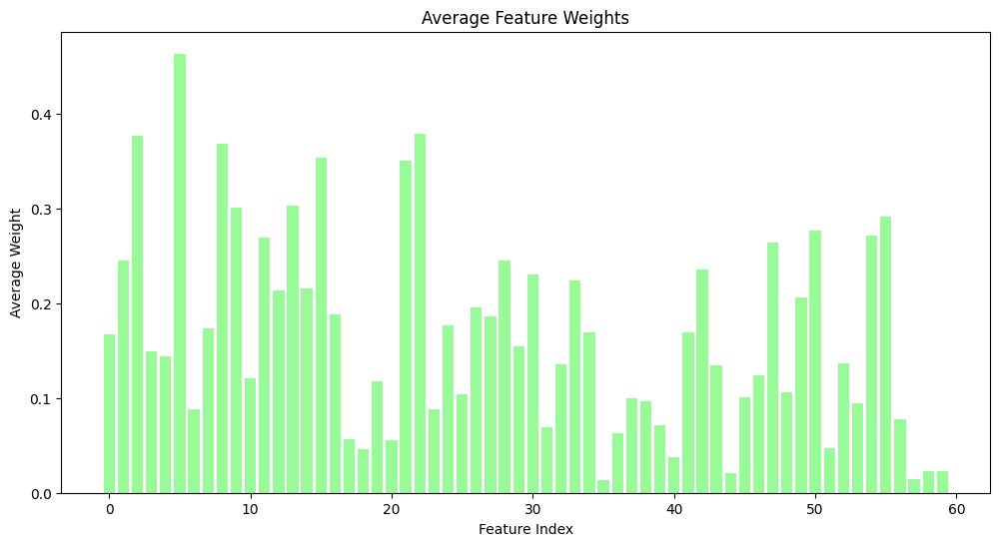

Total population members: 100
Pareto front members: 23


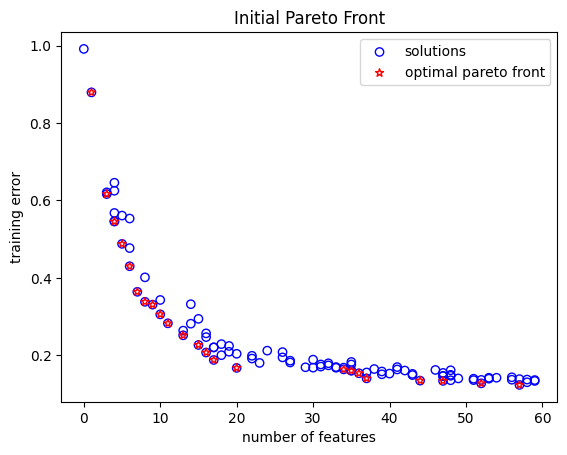

Total population members: 100
Pareto front members: 27


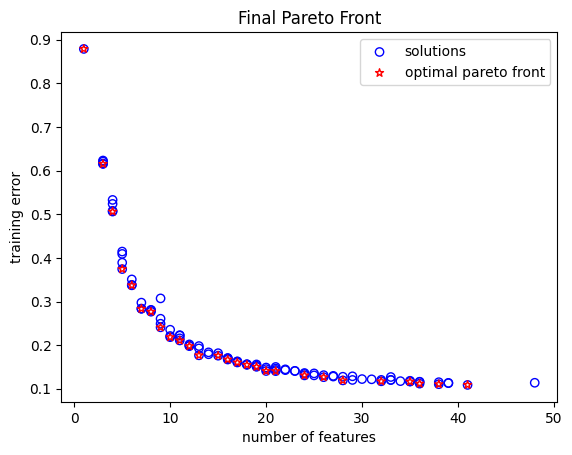

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 11.0
corresponding weights:  [0.         0.89430487 0.94843082 0.         0.         0.69851349
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0.         0.13305633 0.14110928 0.         0.         0.10392612
 0.         0.         0.         0.        ] ...
classification error on train sets: 0.21076014406739085
classification error on test sets: 0.2905498580366327
solution 1:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.8790520095317618
classification error on test sets: 0.857957799176708
solution 2:
number of selected features is: 9.0
corresponding weights:  [0.         0.         0.57414589 0.         0.         0.
 0.         0.         0.31331381 0.        ] ...

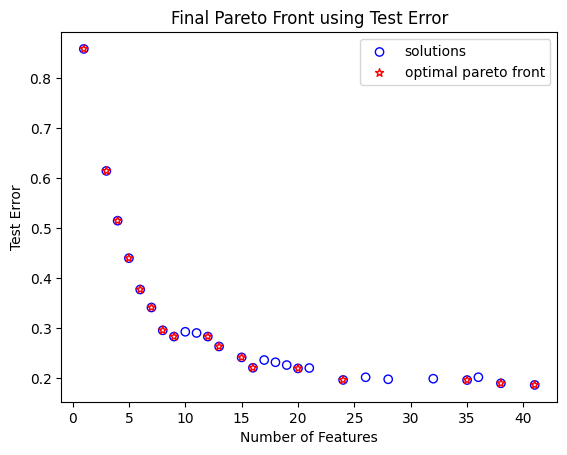

Final PF Results:  {0: {'num_selected_features': 11.0, 'feature_weights': [0.0, 0.8943048692212473, 0.9484308222644655, 0.0, 0.0, 0.6985134889205721, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.029095724031080895, 0.95866483141026, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6599227710544628, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7304293432484008, 0.0, 0.5489080790628753, 0.0, 0.37621012005485194, 0.7329837703250742, 0.14378650126598508, 0.0, 0.0, 0.0], 'train_error': 0.21076014406739085, 'test_error': 0.2905498580366327}, 1: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.11470306623874564, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 

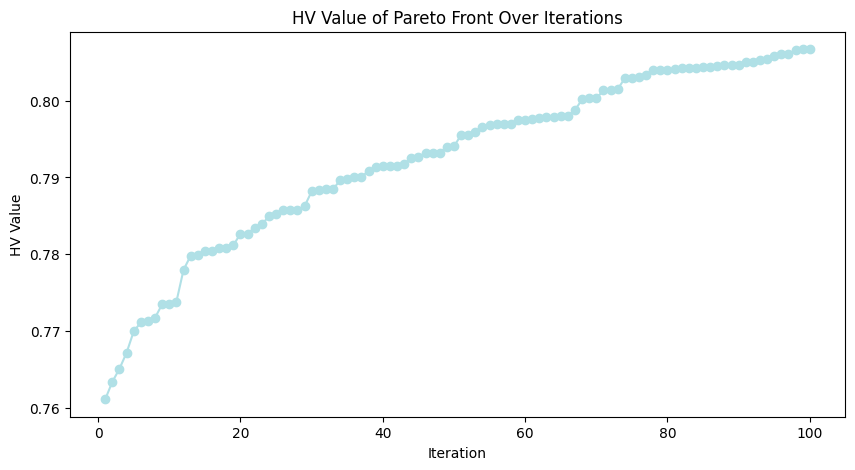

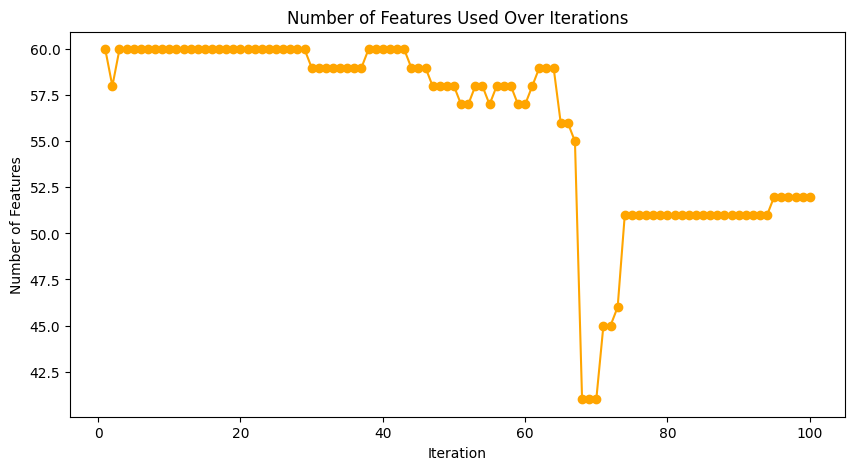

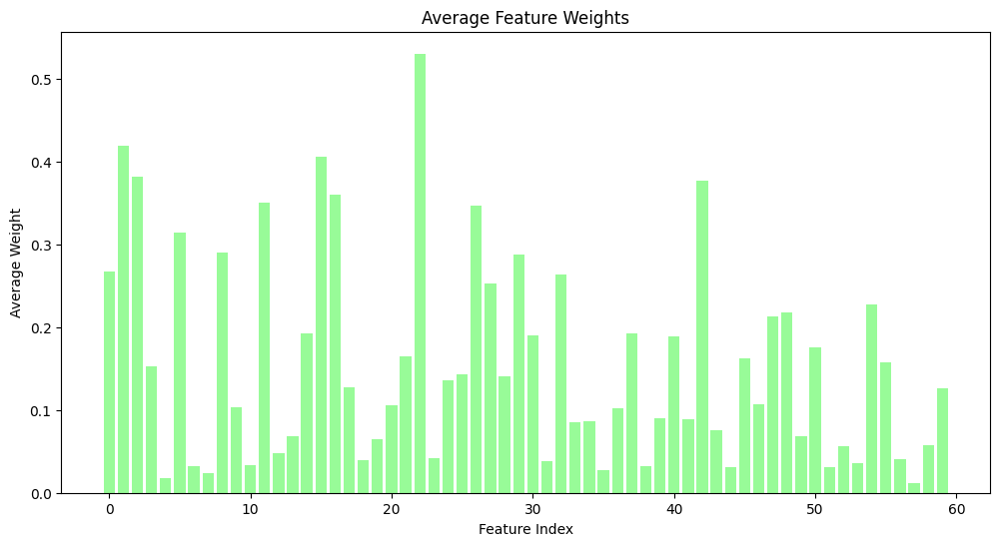

Total population members: 100
Pareto front members: 17


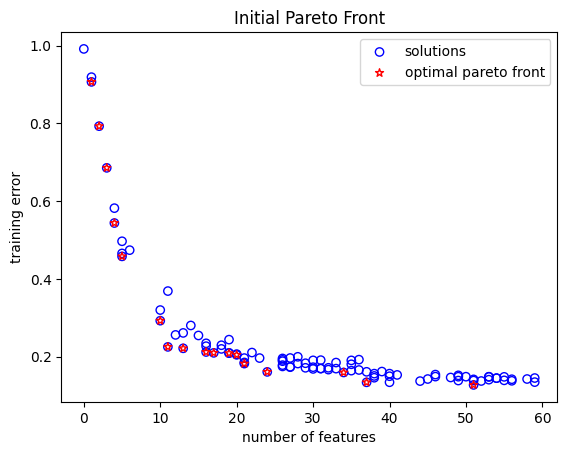

Total population members: 100
Pareto front members: 27


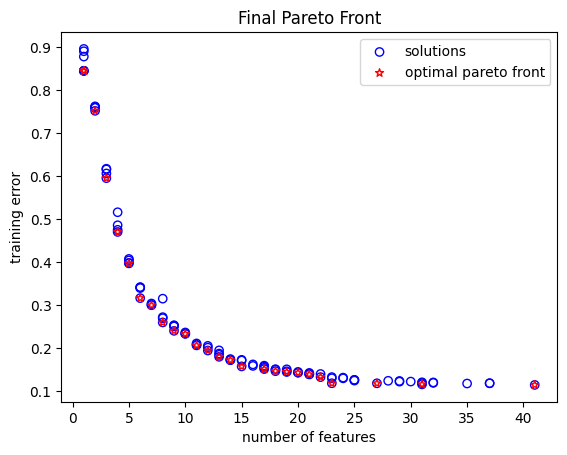

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 6.0
corresponding weights:  [0.         0.73659032 0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0.         0.18832288 0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
classification error on train sets: 0.31619836169881277
classification error on test sets: 0.381531022960905
solution 1:
number of selected features is: 5.0
corresponding weights:  [0.         0.73659032 0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0.         0.23228585 0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
classification error on train sets: 0.3970537466310461
classification error on test sets: 0.41337505021921583
solution 2:
number of selected features is: 10.0
c

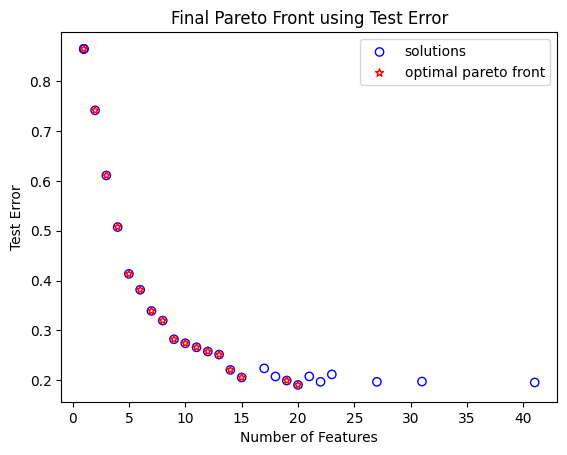

Final PF Results:  {0: {'num_selected_features': 6.0, 'feature_weights': [0.0, 0.7365903191868488, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6022164802093766, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5504547251307468, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5468409442312827, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7633603085906439, 0.0, 0.0, 0.0, 0.0, 0.7118533469309165], 'train_error': 0.31619836169881277, 'test_error': 0.381531022960905}, 1: {'num_selected_features': 5.0, 'feature_weights': [0.0, 0.7365903191868488, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5504547251307468, 0.0, 0.0, 0.4087924649506573, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7633603085906439, 0.0, 0.0, 0.0, 0.0, 0.7118533469309165], 'train_error': 0.3970537466310461, 

In [42]:
# Re-run GDE3 with top 50 features + 10 remaining features with highest correlation

# Read top 50 features
top_50 = pd.read_csv("Top_NSGA2_Features.csv").head(50)
print(top_50)

# Read validation data
validation_path = "KimiaNet_Data/kimianet_validation_data_averaged_feature_vectors.csv"
validation = pd.read_csv(validation_path)
dclass = validation.columns[0]
x = validation.drop(columns=[dclass])
y = validation[dclass]
featureNames = []
for i in top_50['Feature'].tolist():
    featureNames.append(x.columns[i-1]) #featureNames has feature names from 1-1024, not indices; so, to access feature x, we need to go to index i-1

# Compute correlation using Mutual Information between features in training data (i.e., the validation set) and the label, and include the 10 highest correlated features (that aren't already in the top 50)
mi_scores = mutual_info_classif(x, y)
mi_df = pd.DataFrame({
    'Feature': x.columns,
    'Mutual_Information': mi_scores
})
mi_df = mi_df.sort_values(by='Mutual_Information', ascending=False)
additional_features = mi_df[~mi_df['Feature'].isin(featureNames)]
featureNames.extend(additional_features.head(10)['Feature'].tolist())
print("Features used (top 50 + remaining 10 with highest correlation):")
print(featureNames)

x = x[featureNames]

# Read test data
test_path = "KimiaNet_Data/kimianet_test_data_averaged_feature_vectors.csv"
test = pd.read_csv(test_path)
dclass = test.columns[0]
xtest = test.drop(columns=[dclass])
ytest = test[dclass]
xtest = xtest[featureNames]

# Run GDE3 algorithm 10 times
epsilon = 0.01
total_features = x.shape[1] 
popsize = 100
print("TOTAL NUMBER OF FEATURES: ", total_features)
for run in range(10):
    print("*"*50, f"RUN {run+1}", "*"*50)
    dataset_name = f"RUN {run+1}: GDE3 Kimianet Feature Weighting w/ Top 50 + 10 using Correlation"

    # Initialize population with ONE individual having weights corresponding to correlation values
    custom_population = generate_individuals(total_features, epsilon, popsize)
    pop = Population.new("X", custom_population)

    problem = MyProblem(x,y,epsilon)
    Evaluator().eval(problem, pop) # evaluate initial population
    algorithm = GDE3(pop_size=popsize,
                    variant="DE/rand/1/bin", # selection = random, crossover = binary
                    CR=0.5, # crossover parameter [0,1]
                    F=(0.0, 0.9), # scale factor or mutation parameter (0,2]
                    sampling = pop
                    )
    res = minimize(problem,
                    algorithm,
                    ("n_gen", 100),
                    verbose=True, # prints results if true
                    save_history=True
                    )
    
    final_pf_results, final_test_pf_results, lowest_train_error_solution, lowest_test_error_solution, hv_test, hv_training = visualize(res, x, y, xtest, ytest, epsilon)
    store_results(dataset_name, final_pf_results, final_test_pf_results, lowest_train_error_solution, lowest_test_error_solution, hv_test, hv_training, epsilon, featureNames)

    Feature  Occurrences
0      1022          114
1       996           99
2       976           99
3       708           89
4       766           86
5       955           85
6       630           82
7       881           79
8       793           78
9       545           77
10      769           75
11      781           74
12      855           73
13      767           72
14      819           69
15      841           65
16      982           65
17      790           62
18      586           61
19      845           59
20      794           59
21      898           59
22      773           56
23      735           53
24      918           52
25      698           50
26     1005           49
27      911           49
28      756           49
29      877           48
30      935           48
31      669           45
32      836           45
33     1017           44
34      625           43
35      763           43
36      888           43
37      978           42
38      737           42


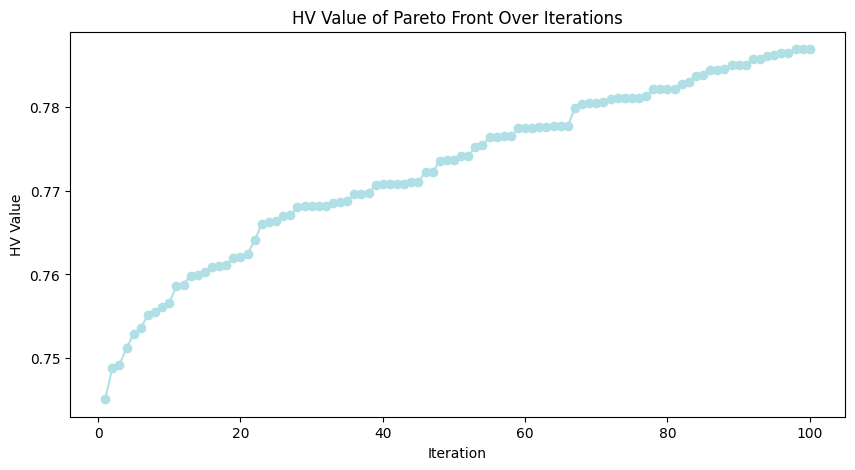

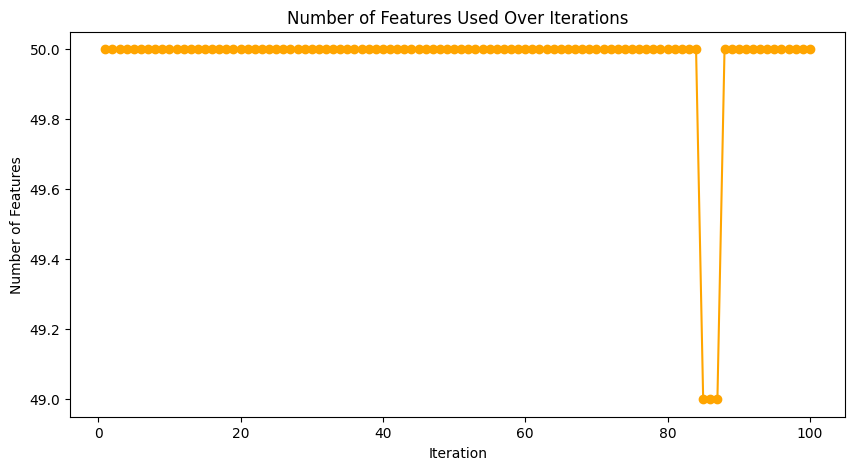

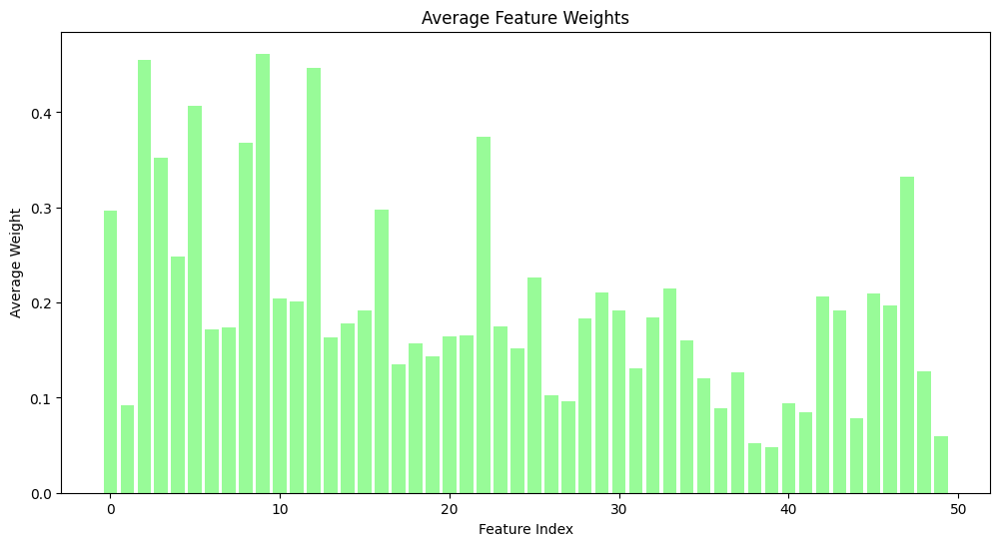

Total population members: 100
Pareto front members: 17


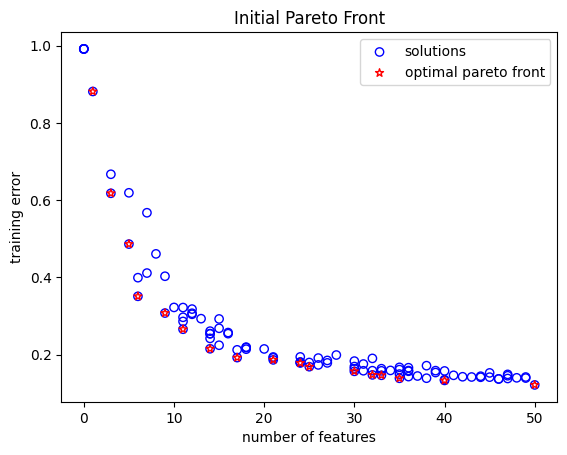

Total population members: 100
Pareto front members: 27


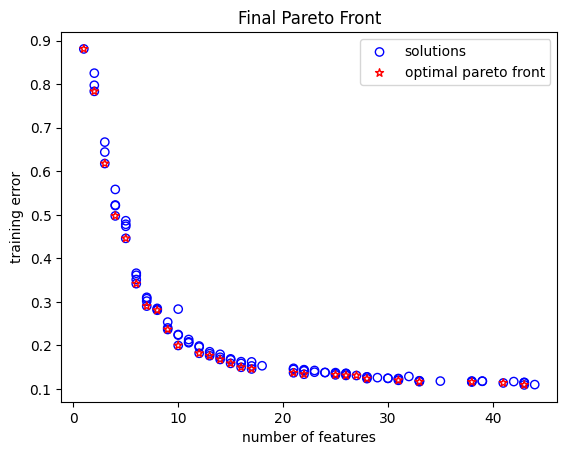

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.8812030334161925
classification error on test sets: 0.9061070769328197
solution 1:
number of selected features is: 2.0
corresponding weights:  [0.        0.        0.        0.        0.7504005 0.        0.
 0.        0.        0.       ] ...
corresponding normalized weights:  [0.         0.         0.         0.         0.58775629 0.
 0.         0.         0.         0.        ] ...
classification error on train sets: 0.7837490920345531
classification error on test sets: 0.7655255499249003
solution 2:
number of selected features is: 3.0
corresponding weights:  [0.         0.         0.         0.77127036 0.         0.74282885
 0.         0.         0.         0.        ] ...
corresponding nor

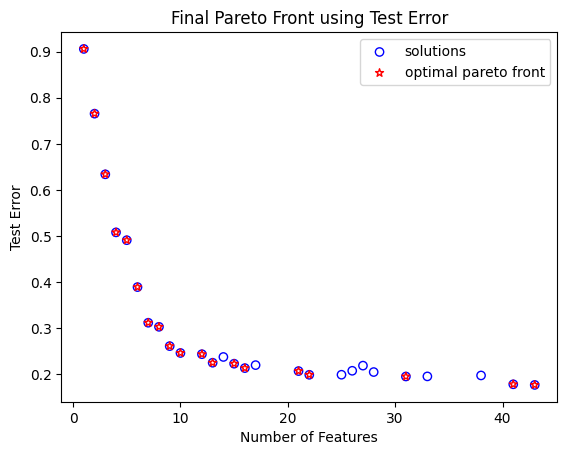

Final PF Results:  {0: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6913367058728835, 0.0, 0.0], 'train_error': 0.8812030334161925, 'test_error': 0.9061070769328197}, 1: {'num_selected_features': 2.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.7504004964242486, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.526319982459799, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.7837490920345531, 'test_error': 0.7655255499249003}, 2: {'num_selected_features': 3.0, 'feature_weights': [0.0, 0.0, 0.0, 0.7712703572056002, 0.0, 0.7428288523386332, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.

C:\Users\krish\AppData\Local\Temp\ipykernel_14124\824608307.py:342: DtypeWarning: Columns (5,6,7,8,15,16,17,18,19,36,37,38,39,40,46,47,48,49,50,51,56,57,58,59,60,70,71,72,73,74,76,77,78,79,80,94,95,96,97,98,101,102,103,104,108,109,110,111,112,118,119,120,121,122,139,140,141,142,149,150,151,152,153,154,159,160,161,162,163,197,198,199,200,207,211,212,213,214,215,221,222,223,224,231,253,254,255,256,262,263,264,265,272,314,315,316,317,324,1097,1098,1099,1100,1101,1103,1104,1105,1106,1107,2124,2125,2126,2127,2128,2130,2131,2132,2133,2134,3151,3152,3153,3154,3155,3157,3158,3159,3160,3161,4178,4179,4180,4181,4182,4184,4185,4186,4187,4188,5205,5206,5207,5208,5209,5211,5212,5213,5214,5215,6232,6233,6234,6235,6236,6238,6239,6240,6241,6242,7259,7260,7261,7262,7263,7265,7266,7267,7268,7269,8286,8287,8288,8289,8290,8292,8293,8294,8295,8296,9313,9314,9315,9316,9317,9319,9320,9321,9322,9323,10340,10341,10342,10343,10344,10346,10347,10348,10355,11367,11368,11369,11370,11371,12394,12395,12396,12397,123

Results saved to data.csv
************************************************** RUN 2 **************************************************
INDIVIDUAL 1, 30 features: [0.         0.40927964 0.26366921 0.18649106 0.87071281 0.
 0.97626807 0.         0.42562739 0.16986593]...
INDIVIDUAL 2, 18 features: [0.76796809 0.         0.99479059 0.         0.         0.
 0.         0.         0.         0.        ]...
INDIVIDUAL 3, 37 features: [0.29333556 0.         0.28466041 0.         0.         0.
 0.         0.         0.35540133 0.        ]...
INDIVIDUAL 4, 49 features: [0.09032348 0.37790213 0.73448068 0.58788399 0.27384097 0.18867814
 0.99725961 0.46091382 0.40551833 0.3869196 ]...
INDIVIDUAL 5, 19 features: [0.4513941  0.63648011 0.         0.         0.32318226 0.81106733
 0.72755073 0.         0.         0.        ]...
INDIVIDUAL 6, 41 features: [0.06478971 0.02694145 0.20667276 0.11608844 0.         0.09435867
 0.47109954 0.19868106 0.13095492 0.50523989]...
INDIVIDUAL 7, 26 features: [0.47

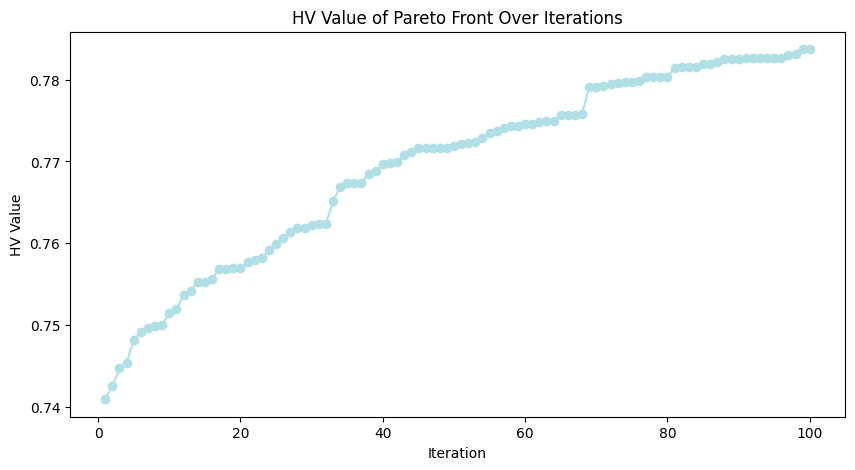

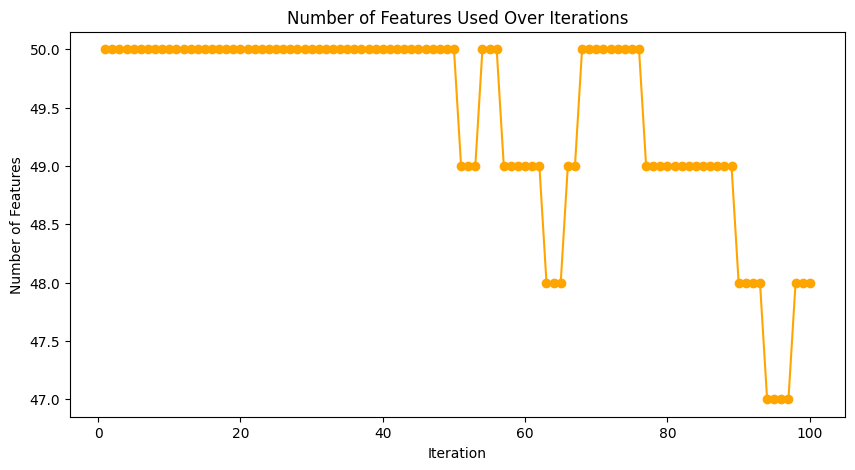

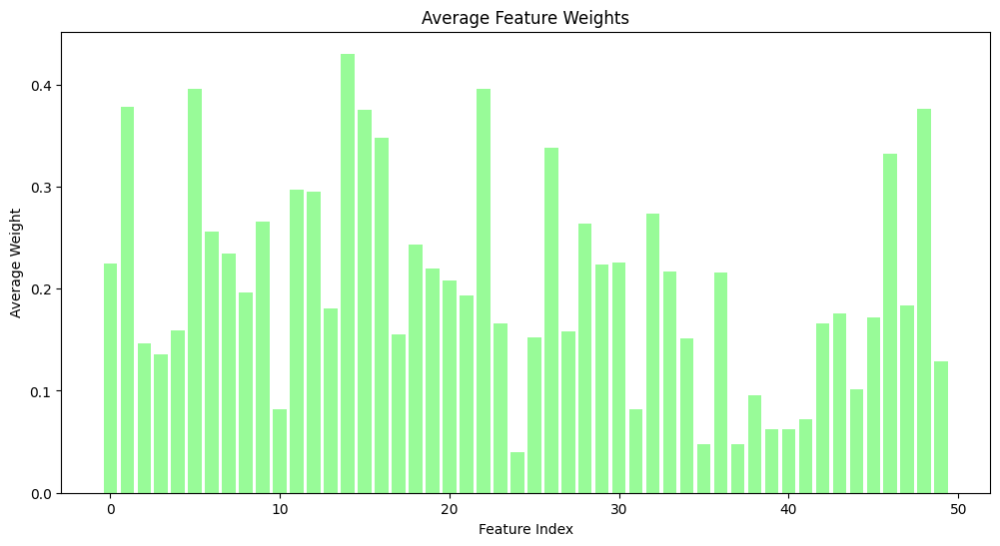

Total population members: 100
Pareto front members: 19


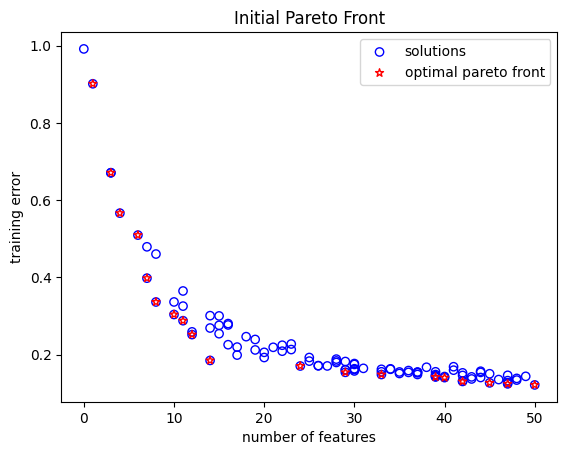

Total population members: 100
Pareto front members: 24


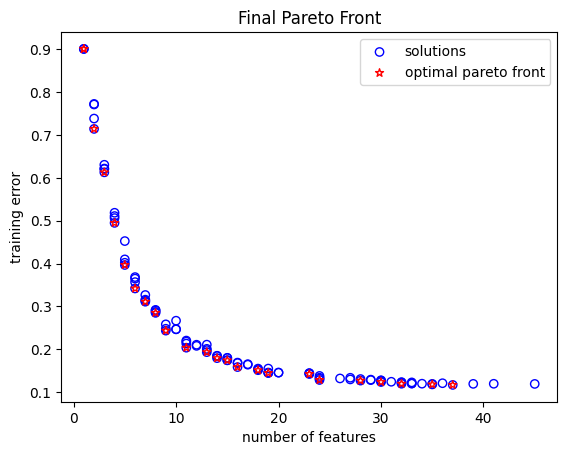

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.9011289944948545
classification error on test sets: 0.8918062532131064
solution 1:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.9011289944948545
classification error on test sets: 0.8918062532131064
solution 2:
number of selected features is: 37.0
corresponding weights:  [0.82241046 0.88981399 0.278624   0.         0.79260163 0.99101269
 0.90630525 0.30126307 0.738954   0.84529322] ...
corresponding normalized weights:  [0.03531616 0.03821062 0.01196474 0.         0.0340361  0.04255632
 0.03891879 0.01293692 0.03173235 0.0362988 ] ...
c

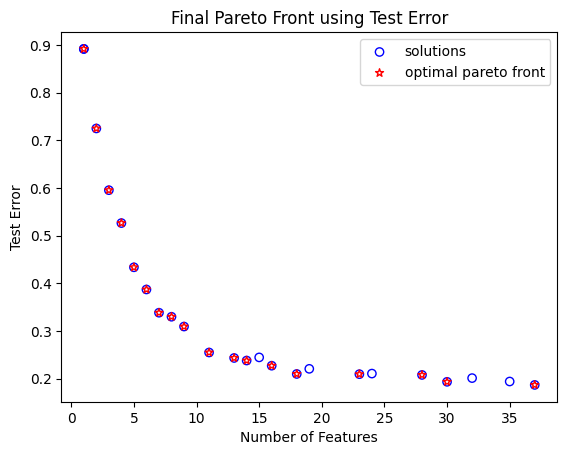

Final PF Results:  {0: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.9371649534863999, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.9011289944948545, 'test_error': 0.8918062532131064}, 1: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.9371649534863999, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.9011289944948545, 'test_error': 0.8918062532131064}, 2: {'num_selected_features': 37.0, 'feature_weights': [0.8224104585876857, 0.8898139881911079, 0.2786239974817969, 0.0, 0.7926016349779224, 0.9910126886588495, 0.9063052538918772, 0.30126306538983144,

C:\Users\krish\AppData\Local\Temp\ipykernel_14124\824608307.py:342: DtypeWarning: Columns (5,6,7,8,15,16,17,18,19,36,37,38,39,40,46,47,48,49,50,51,56,57,58,59,60,70,71,72,73,74,76,77,78,79,80,94,95,96,97,98,101,102,103,104,108,109,110,111,112,118,119,120,121,122,139,140,141,142,149,150,151,152,153,154,159,160,161,162,163,197,198,199,200,207,211,212,213,214,215,221,222,223,224,231,253,254,255,256,262,263,264,265,272,314,315,316,317,324,1097,1098,1099,1100,1101,1103,1104,1105,1106,1107,2124,2125,2126,2127,2128,2130,2131,2132,2133,2134,3151,3152,3153,3154,3155,3157,3158,3159,3160,3161,4178,4179,4180,4181,4182,4184,4185,4186,4187,4188,5205,5206,5207,5208,5209,5211,5212,5213,5214,5215,6232,6233,6234,6235,6236,6238,6239,6240,6241,6242,7259,7260,7261,7262,7263,7265,7266,7267,7268,7269,8286,8287,8288,8289,8290,8292,8293,8294,8295,8296,9313,9314,9315,9316,9317,9319,9320,9321,9322,9323,10340,10341,10342,10343,10344,10346,10347,10348,10355,11367,11368,11369,11370,11371,12394,12395,12396,12397,123

Results saved to data.csv
************************************************** RUN 3 **************************************************
INDIVIDUAL 1, 35 features: [0.         0.2893074  0.52903226 0.93828528 0.60947744 0.15226856
 0.         0.63102073 0.53203787 0.70034063]...
INDIVIDUAL 2, 12 features: [0.         0.         0.         0.64123719 0.11720645 0.
 0.         0.         0.50561045 0.48073467]...
INDIVIDUAL 3, 30 features: [0.         0.12261481 0.127907   0.67422227 0.         0.6013373
 0.         0.17202629 0.         0.62581185]...
INDIVIDUAL 4, 22 features: [0.32474305 0.69292464 0.94800839 0.45655945 0.         0.36299732
 0.         0.         0.         0.        ]...
INDIVIDUAL 5, 45 features: [0.30404315 0.83149174 0.40398929 0.87097183 0.11625184 0.40610315
 0.58282094 0.         0.90255459 0.1658758 ]...
INDIVIDUAL 6, 5 features: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]...
INDIVIDUAL 7, 32 features: [0.53070777 0.         0.         0.282372   0.32493764 0.2081585
 0.113

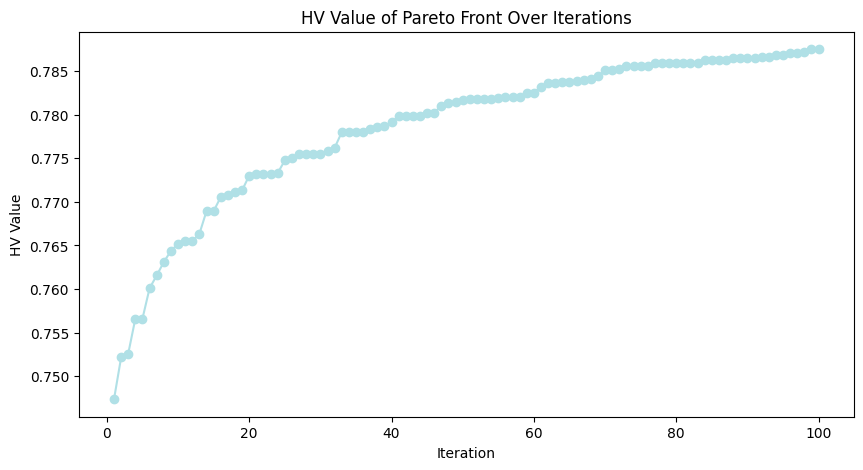

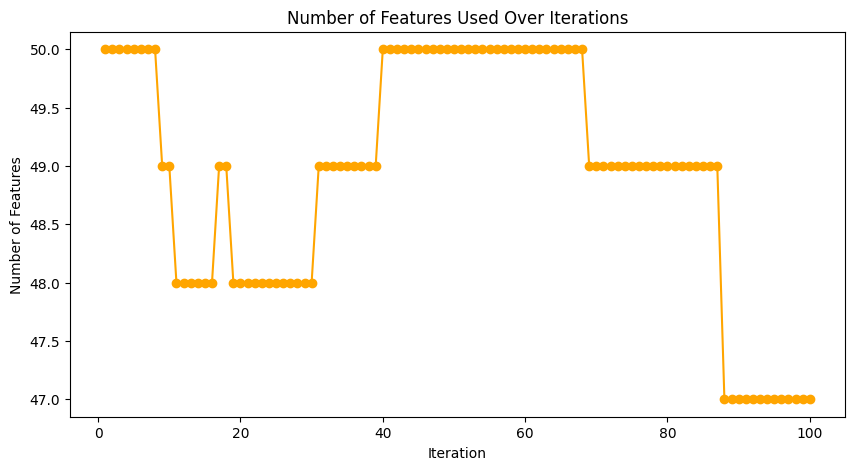

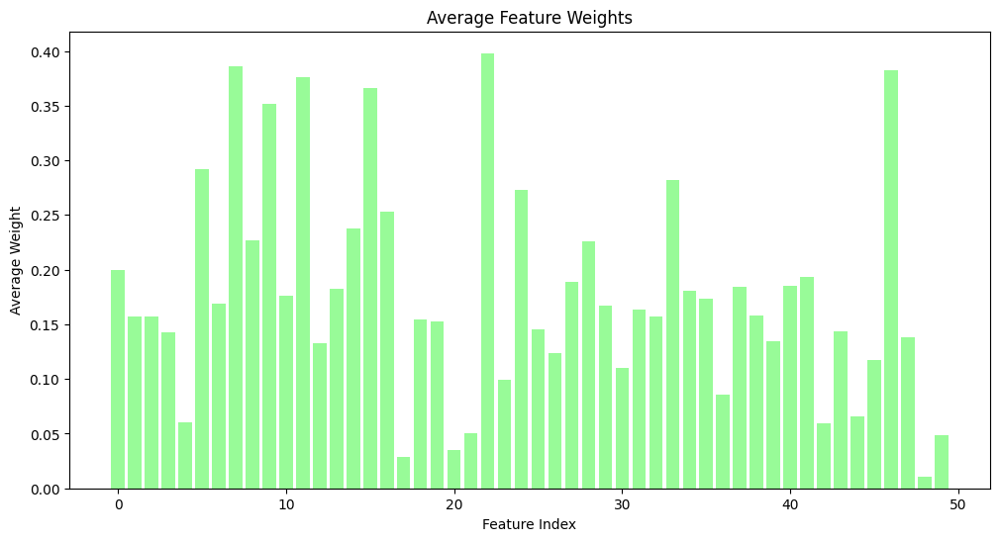

Total population members: 100
Pareto front members: 21


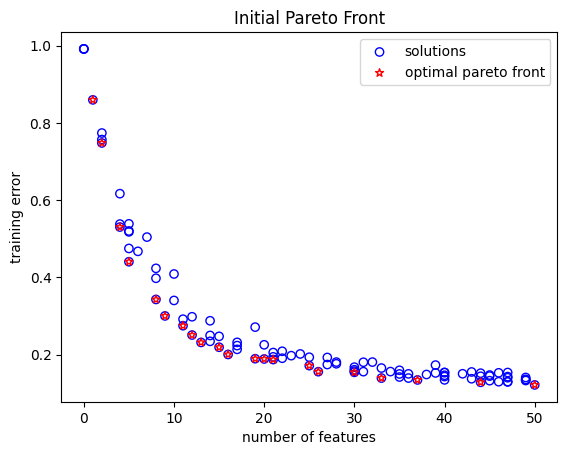

Total population members: 100
Pareto front members: 27


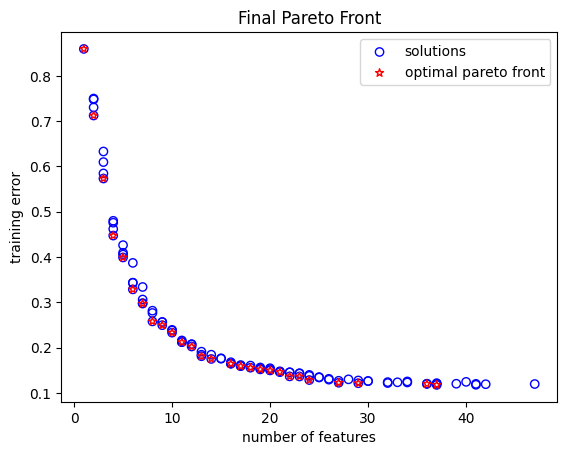

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.8594761613627901
classification error on test sets: 0.9127240052683039
solution 1:
number of selected features is: 8.0
corresponding weights:  [0.         0.         0.         0.         0.         0.
 0.         0.42423336 0.         0.        ] ...
corresponding normalized weights:  [0.         0.         0.         0.         0.         0.
 0.         0.14491448 0.         0.        ] ...
classification error on train sets: 0.2577186043139946
classification error on test sets: 0.3011273443338953
solution 2:
number of selected features is: 29.0
corresponding weights:  [0.51663004 0.45123217 0.         0.         0.         0.47644396
 0.         0.5531683  0.49878429 0.82943881] ...
corresp

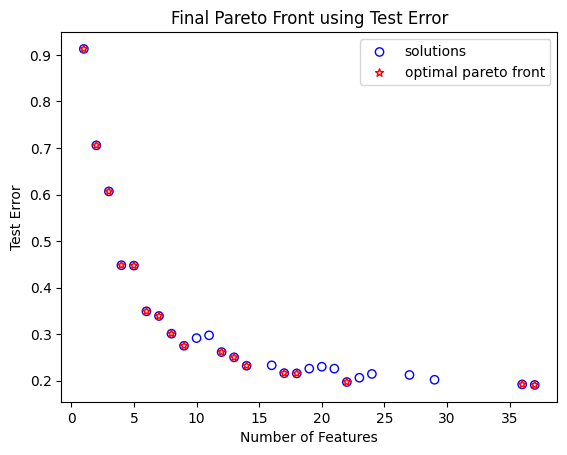

Final PF Results:  {0: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5334283163368594, 0.0, 0.0, 0.0], 'train_error': 0.8594761613627901, 'test_error': 0.9127240052683039}, 1: {'num_selected_features': 8.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.42423335776994725, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2547817152712922, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.33174859800592743, 0.42625590920938927, 0.3921887318997481, 0.0, 0.42086007286791716, 0.0, 0.32596702925686866, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.35143847091105906, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.2577186043139946, 'test_error': 0.3011273443338953}, 2: {'num_selected_features': 29.0, 'feature_weights': [0.516630042665158, 0.4512321657693

C:\Users\krish\AppData\Local\Temp\ipykernel_14124\824608307.py:342: DtypeWarning: Columns (5,6,7,8,15,16,17,18,19,36,37,38,39,40,46,47,48,49,50,51,56,57,58,59,60,70,71,72,73,74,76,77,78,79,80,94,95,96,97,98,101,102,103,104,108,109,110,111,112,118,119,120,121,122,139,140,141,142,149,150,151,152,153,154,159,160,161,162,163,197,198,199,200,207,211,212,213,214,215,221,222,223,224,231,253,254,255,256,262,263,264,265,272,314,315,316,317,324,1097,1098,1099,1100,1101,1103,1104,1105,1106,1107,2124,2125,2126,2127,2128,2130,2131,2132,2133,2134,3151,3152,3153,3154,3155,3157,3158,3159,3160,3161,4178,4179,4180,4181,4182,4184,4185,4186,4187,4188,5205,5206,5207,5208,5209,5211,5212,5213,5214,5215,6232,6233,6234,6235,6236,6238,6239,6240,6241,6242,7259,7260,7261,7262,7263,7265,7266,7267,7268,7269,8286,8287,8288,8289,8290,8292,8293,8294,8295,8296,9313,9314,9315,9316,9317,9319,9320,9321,9322,9323,10340,10341,10342,10343,10344,10346,10347,10348,10355,11367,11368,11369,11370,11371,12394,12395,12396,12397,123

Results saved to data.csv
************************************************** RUN 4 **************************************************
INDIVIDUAL 1, 30 features: [0.17769916 0.         0.08358017 0.6384341  0.         0.
 0.         0.7620983  0.55539242 0.14480429]...
INDIVIDUAL 2, 13 features: [0.         0.         0.22347214 0.         0.30188682 0.
 0.         0.         0.59684077 0.        ]...
INDIVIDUAL 3, 45 features: [0.42891601 0.59331933 0.10685928 0.97800144 0.86484907 0.4964989
 0.21764744 0.3728435  0.4966154  0.67899957]...
INDIVIDUAL 4, 32 features: [0.         0.46414935 0.51429948 0.         0.70977787 0.72822529
 0.         0.22516551 0.         0.10850906]...
INDIVIDUAL 5, 17 features: [0.35615165 0.         0.75545192 0.6837059  0.         0.
 0.         0.         0.         0.        ]...
INDIVIDUAL 6, 10 features: [0.         0.18736813 0.         0.70705451 0.         0.
 0.         0.         0.         0.        ]...
INDIVIDUAL 7, 26 features: [0.19774978 0.

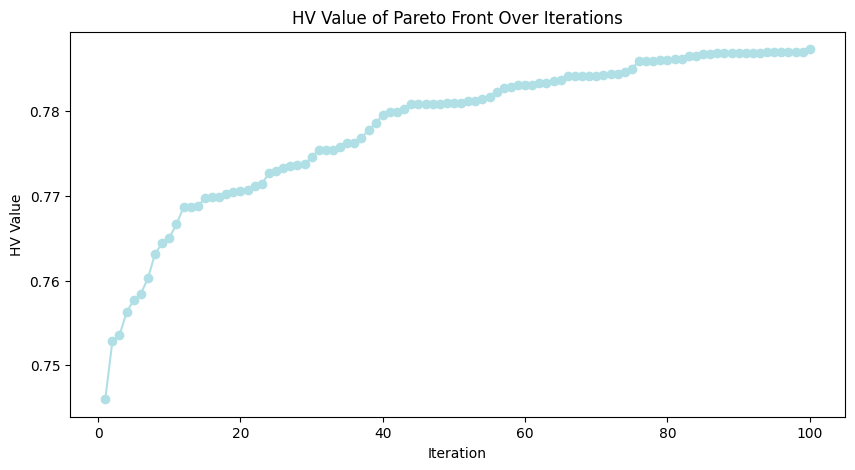

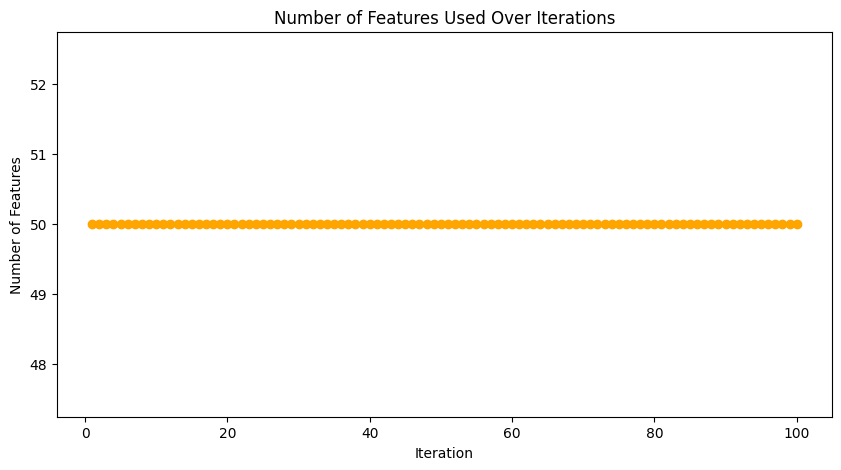

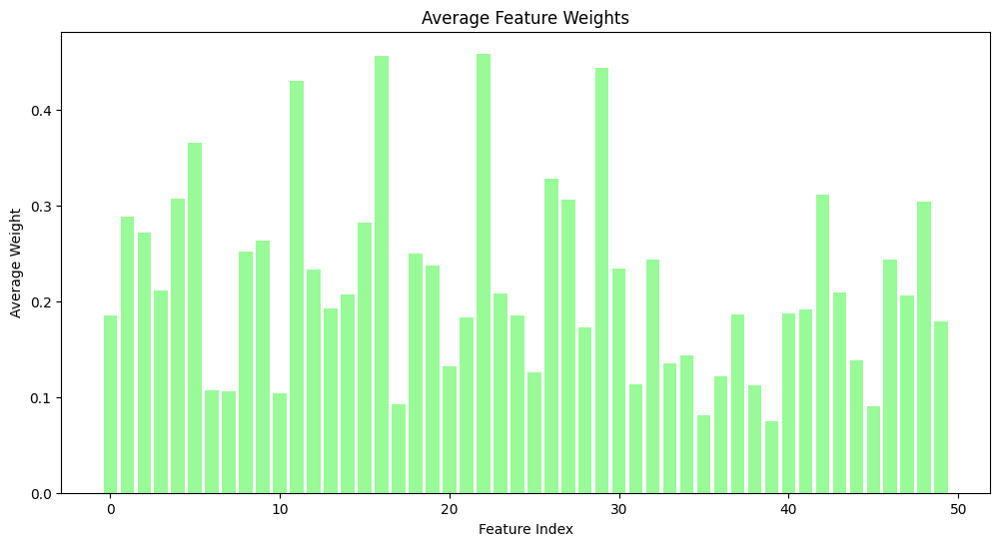

Total population members: 100
Pareto front members: 27


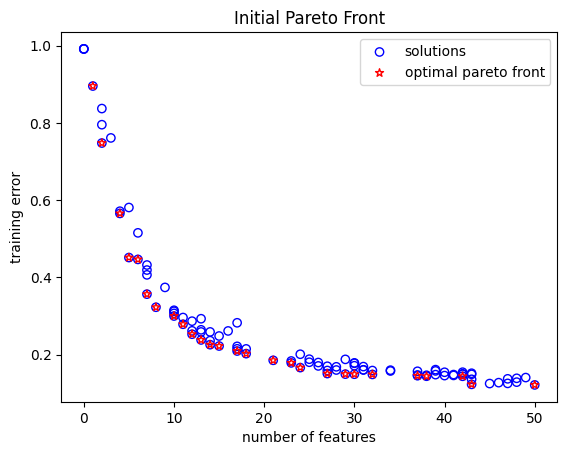

Total population members: 100
Pareto front members: 35


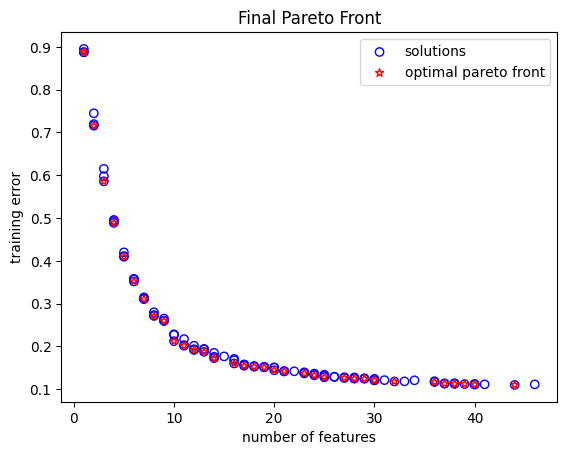

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.8876446452163407
classification error on test sets: 0.9008793929679119
solution 1:
number of selected features is: 11.0
corresponding weights:  [0.         0.         0.67074412 0.         0.         0.
 0.37343816 0.45769363 0.47643887 0.99459633] ...
corresponding normalized weights:  [0.         0.         0.10213424 0.         0.         0.
 0.05686345 0.06969303 0.07254737 0.15144723] ...
classification error on train sets: 0.2017247831171154
classification error on test sets: 0.27994873604119985
solution 2:
number of selected features is: 18.0
corresponding weights:  [0.         0.66506323 0.67074412 0.30289328 0.         0.85272004
 0.50494625 0.         0.47643887 0.99459633] ...
corre

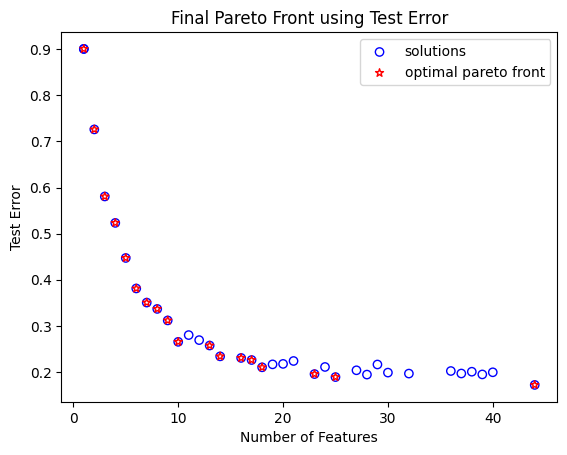

Final PF Results:  {0: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1581768910167307, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.8876446452163407, 'test_error': 0.9008793929679119}, 1: {'num_selected_features': 11.0, 'feature_weights': [0.0, 0.0, 0.6707441246200064, 0.0, 0.0, 0.0, 0.37343816315520817, 0.4576936328867587, 0.4764388695126162, 0.9945963293284124, 0.0, 0.7764148212933293, 0.0, 0.0, 0.0, 0.5613750096717873, 0.9961433659981079, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3451881555703307, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5642585291091118, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3509888110561887, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.2017247831171154, 'test_error': 0.27994873604119985}, 2: {'num_selected_features': 18.0, 'feature_wei

C:\Users\krish\AppData\Local\Temp\ipykernel_14124\824608307.py:342: DtypeWarning: Columns (5,6,7,8,15,16,17,18,19,36,37,38,39,40,46,47,48,49,50,51,56,57,58,59,60,70,71,72,73,74,76,77,78,79,80,94,95,96,97,98,101,102,103,104,108,109,110,111,112,118,119,120,121,122,139,140,141,142,149,150,151,152,153,154,159,160,161,162,163,197,198,199,200,207,211,212,213,214,215,221,222,223,224,231,253,254,255,256,262,263,264,265,272,314,315,316,317,324,1097,1098,1099,1100,1101,1103,1104,1105,1106,1107,2124,2125,2126,2127,2128,2130,2131,2132,2133,2134,3151,3152,3153,3154,3155,3157,3158,3159,3160,3161,4178,4179,4180,4181,4182,4184,4185,4186,4187,4188,5205,5206,5207,5208,5209,5211,5212,5213,5214,5215,6232,6233,6234,6235,6236,6238,6239,6240,6241,6242,7259,7260,7261,7262,7263,7265,7266,7267,7268,7269,8286,8287,8288,8289,8290,8292,8293,8294,8295,8296,9313,9314,9315,9316,9317,9319,9320,9321,9322,9323,10340,10341,10342,10343,10344,10346,10347,10348,10355,11367,11368,11369,11370,11371,12394,12395,12396,12397,123

Results saved to data.csv
************************************************** RUN 5 **************************************************
INDIVIDUAL 1, 42 features: [0.42317065 0.92610319 0.41412868 0.54943523 0.26758311 0.33209692
 0.97677106 0.61185333 0.47928228 0.        ]...
INDIVIDUAL 2, 1 features: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]...
INDIVIDUAL 3, 18 features: [0.78621297 0.         0.         0.37729615 0.         0.09147921
 0.         0.28650575 0.25899913 0.        ]...
INDIVIDUAL 4, 48 features: [0.76337306 0.23087275 0.27126513 0.85369332 0.82814619 0.69581981
 0.90740383 0.57574698 0.93731659 0.06339635]...
INDIVIDUAL 5, 14 features: [0.         0.         0.16445127 0.         0.         0.
 0.         0.         0.86878365 0.        ]...
INDIVIDUAL 6, 29 features: [0.         0.39523913 0.61345487 0.28687222 0.         0.79060636
 0.53722131 0.08964133 0.         0.28291022]...
INDIVIDUAL 7, 12 features: [0.         0.06214967 0.         0.         0.         0.55305858
 0.7

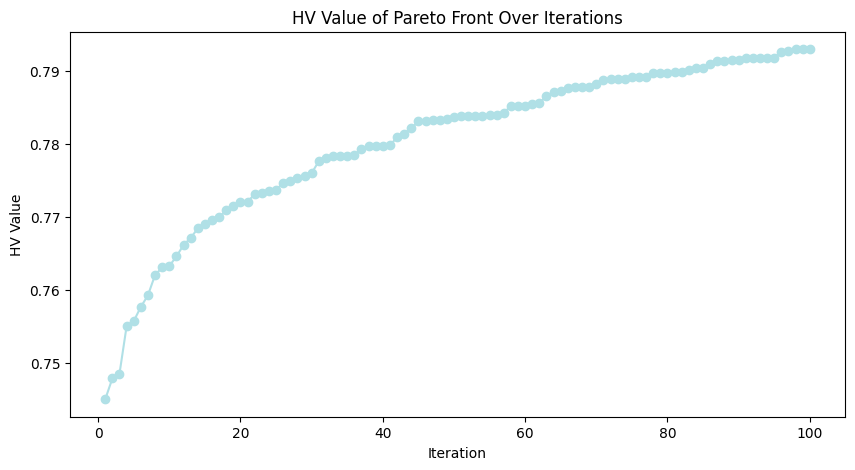

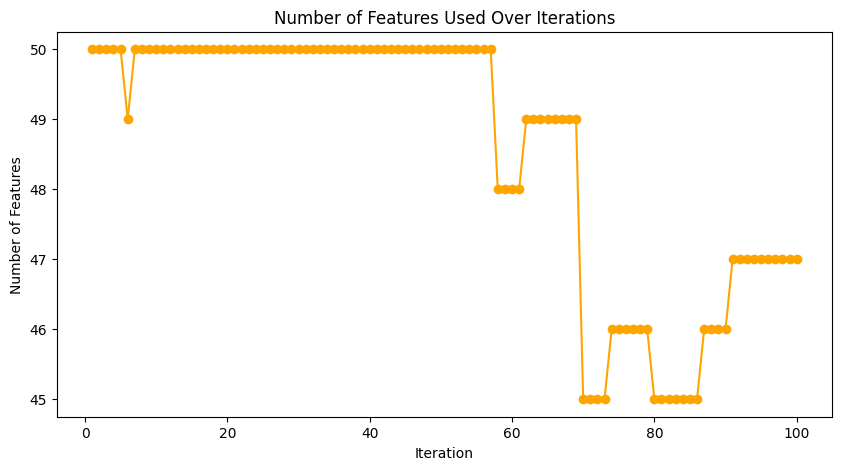

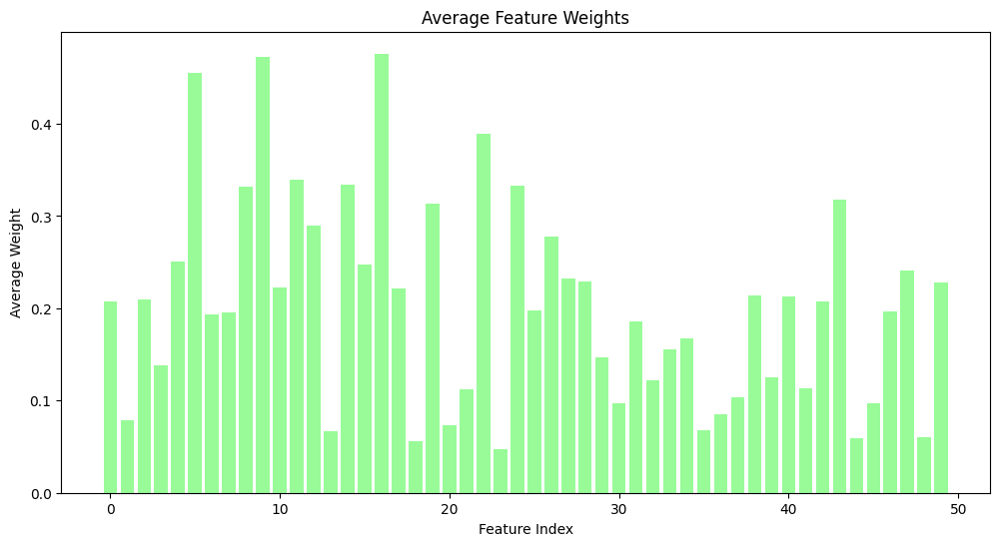

Total population members: 100
Pareto front members: 19


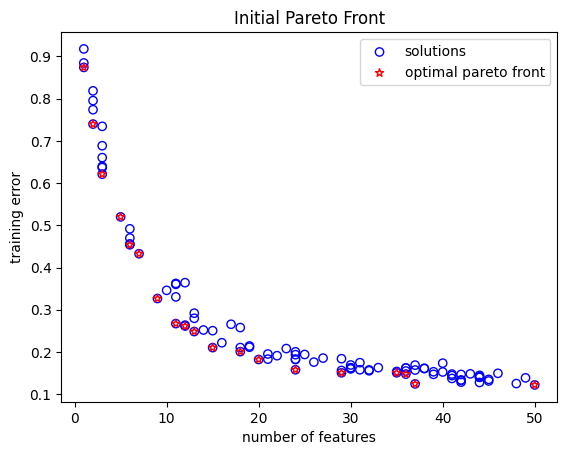

Total population members: 100
Pareto front members: 26


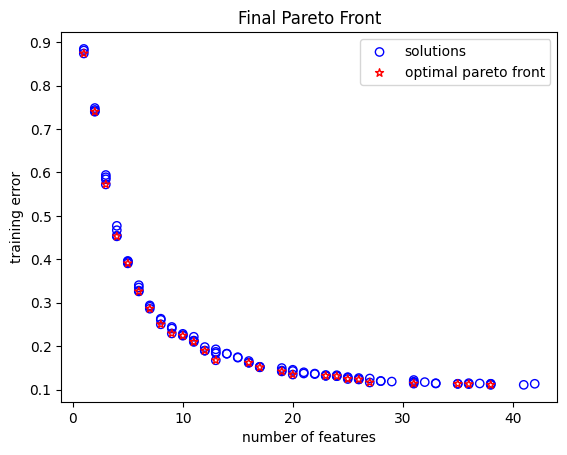

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.8738364247497924
classification error on test sets: 0.894524389883818
solution 1:
number of selected features is: 2.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.7396457207849481
classification error on test sets: 0.7813066288935575
solution 2:
number of selected features is: 5.0
corresponding weights:  [0.38403923 0.         0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0.22664144 0.         0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
classification erro

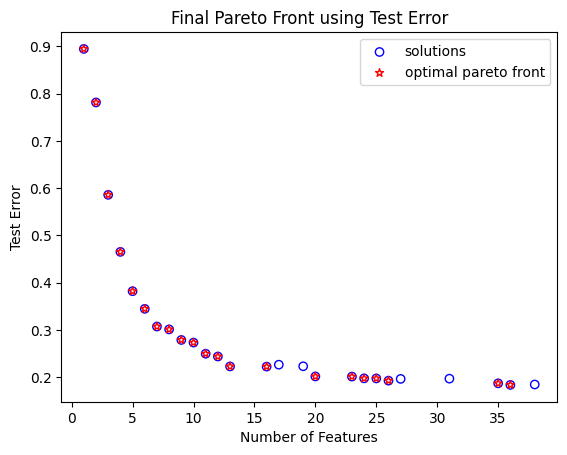

Final PF Results:  {0: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.23789541504519504, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.8738364247497924, 'test_error': 0.894524389883818}, 1: {'num_selected_features': 2.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.9477050770509923, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.06574642807893562, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.7396457207849481, 'test_error': 0.7813066288935575}, 2: {'num_selected_features': 5.0, 'feature_weights': [0.3840392348613096, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2339841707540336, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

C:\Users\krish\AppData\Local\Temp\ipykernel_14124\824608307.py:342: DtypeWarning: Columns (5,6,7,8,15,16,17,18,19,36,37,38,39,40,46,47,48,49,50,51,56,57,58,59,60,70,71,72,73,74,76,77,78,79,80,94,95,96,97,98,101,102,103,104,108,109,110,111,112,118,119,120,121,122,139,140,141,142,149,150,151,152,153,154,159,160,161,162,163,197,198,199,200,207,211,212,213,214,215,221,222,223,224,231,253,254,255,256,262,263,264,265,272,314,315,316,317,324,1097,1098,1099,1100,1101,1103,1104,1105,1106,1107,2124,2125,2126,2127,2128,2130,2131,2132,2133,2134,3151,3152,3153,3154,3155,3157,3158,3159,3160,3161,4178,4179,4180,4181,4182,4184,4185,4186,4187,4188,5205,5206,5207,5208,5209,5211,5212,5213,5214,5215,6232,6233,6234,6235,6236,6238,6239,6240,6241,6242,7259,7260,7261,7262,7263,7265,7266,7267,7268,7269,8286,8287,8288,8289,8290,8292,8293,8294,8295,8296,9313,9314,9315,9316,9317,9319,9320,9321,9322,9323,10340,10341,10342,10343,10344,10346,10347,10348,10355,11367,11368,11369,11370,11371,12394,12395,12396,12397,123

Results saved to data.csv
************************************************** RUN 6 **************************************************
INDIVIDUAL 1, 44 features: [0.38940094 0.0759158  0.81730328 0.06337465 0.30693598 0.21759611
 0.33867153 0.         0.92013389 0.75594633]...
INDIVIDUAL 2, 9 features: [0.         0.01022979 0.         0.         0.         0.
 0.94567568 0.         0.         0.        ]...
INDIVIDUAL 3, 36 features: [0.55319068 0.39079359 0.         0.97744191 0.         0.61429204
 0.         0.24181458 0.         0.        ]...
INDIVIDUAL 4, 39 features: [0.41784679 0.80668569 0.85942017 0.3599724  0.99983195 0.20798297
 0.69710653 0.3975014  0.92769977 0.74121049]...
INDIVIDUAL 5, 17 features: [0.14548569 0.97025998 0.         0.         0.         0.29017498
 0.         0.         0.51832412 0.        ]...
INDIVIDUAL 6, 11 features: [0.77820412 0.780682   0.1460982  0.         0.         0.
 0.         0.         0.         0.        ]...
INDIVIDUAL 7, 35 features

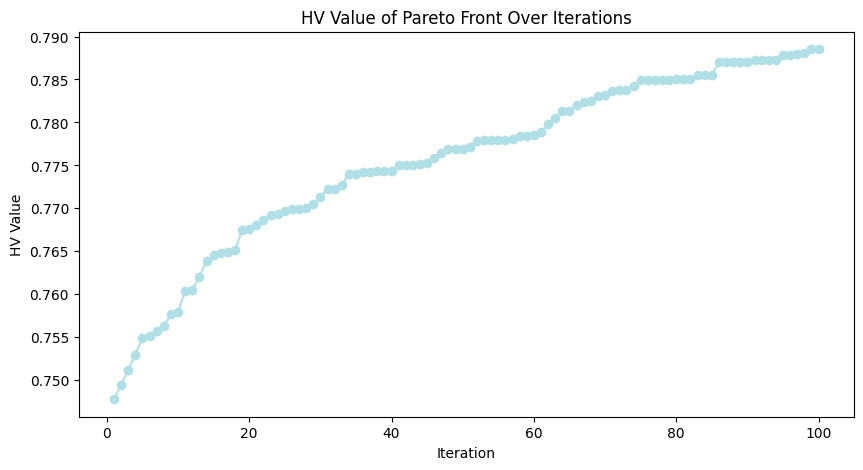

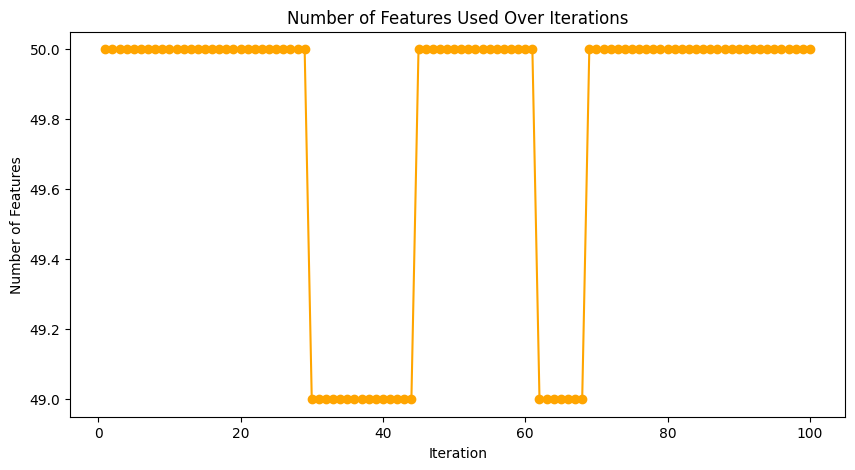

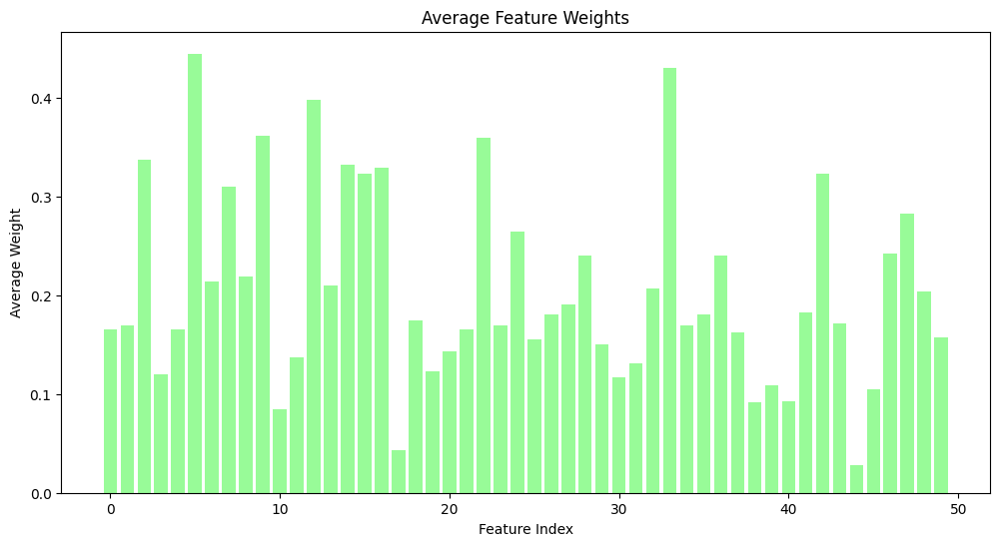

Total population members: 100
Pareto front members: 18


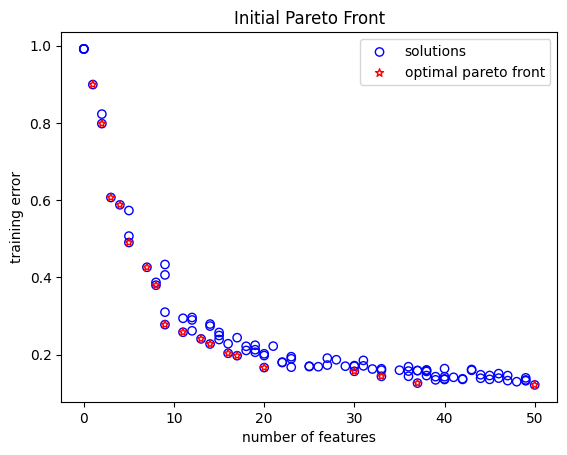

Total population members: 100
Pareto front members: 29


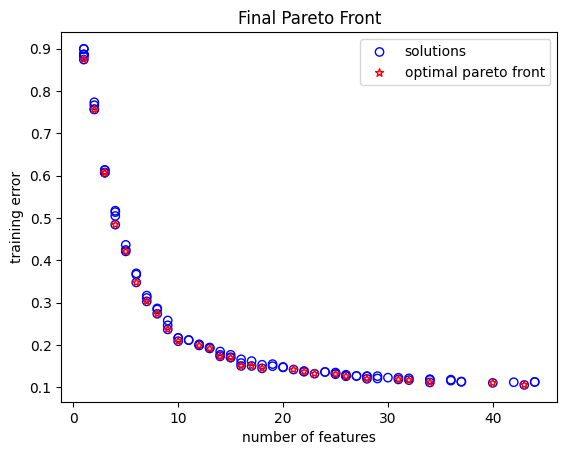

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 12.0
corresponding weights:  [0.         0.45247148 0.         0.         0.         0.6722931
 0.75034793 0.91179186 0.         0.65996822] ...
corresponding normalized weights:  [0.         0.05619994 0.         0.         0.         0.08350323
 0.09319815 0.11325055 0.         0.0819724 ] ...
classification error on train sets: 0.19896643019806182
classification error on test sets: 0.25888864080121243
solution 1:
number of selected features is: 28.0
corresponding weights:  [0.         0.45247148 0.94236678 0.23741877 0.         0.6722931
 0.75034793 0.91179186 0.         0.65996822] ...
corresponding normalized weights:  [0.         0.02231444 0.0464745  0.01170873 0.         0.03315534
 0.03700475 0.04496665 0.         0.03254751] ...
classification error on train sets: 0.12017685536249578
classification error on test sets: 0.20625124569703412
solution 2:
num

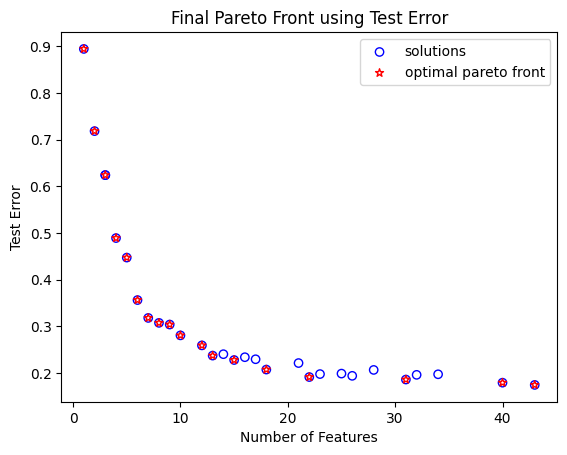

Final PF Results:  {0: {'num_selected_features': 12.0, 'feature_weights': [0.0, 0.45247147892028444, 0.0, 0.0, 0.0, 0.6722930956383449, 0.7503479290567026, 0.9117918572117879, 0.0, 0.659968218707016, 0.0, 0.8774024379177142, 0.8876862729901686, 0.0, 0.0, 0.7948958389397667, 0.3288307788827563, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5243513253419034, 0.0, 0.0, 0.0, 0.0, 0.47215105617034836, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7189126774532069, 0.0, 0.0, 0.0], 'train_error': 0.19896643019806182, 'test_error': 0.25888864080121243}, 1: {'num_selected_features': 28.0, 'feature_weights': [0.0, 0.45247147892028444, 0.9423667775372504, 0.23741877116463123, 0.0, 0.6722930956383449, 0.7503479290567026, 0.9117918572117879, 0.0, 0.659968218707016, 0.0, 0.8774024379177142, 0.8876862729901686, 0.8702186746328584, 0.7413598279995579, 0.7948958389397667, 0.8946021785623703, 0.0, 0.0, 0.0, 0.0, 0.8893177068224495, 0.9999234390192038, 0.0, 0.9824090571562737, 

C:\Users\krish\AppData\Local\Temp\ipykernel_14124\824608307.py:342: DtypeWarning: Columns (5,6,7,8,15,16,17,18,19,36,37,38,39,40,46,47,48,49,50,51,56,57,58,59,60,70,71,72,73,74,76,77,78,79,80,94,95,96,97,98,101,102,103,104,108,109,110,111,112,118,119,120,121,122,139,140,141,142,149,150,151,152,153,154,159,160,161,162,163,197,198,199,200,207,211,212,213,214,215,221,222,223,224,231,253,254,255,256,262,263,264,265,272,314,315,316,317,324,1097,1098,1099,1100,1101,1103,1104,1105,1106,1107,2124,2125,2126,2127,2128,2130,2131,2132,2133,2134,3151,3152,3153,3154,3155,3157,3158,3159,3160,3161,4178,4179,4180,4181,4182,4184,4185,4186,4187,4188,5205,5206,5207,5208,5209,5211,5212,5213,5214,5215,6232,6233,6234,6235,6236,6238,6239,6240,6241,6242,7259,7260,7261,7262,7263,7265,7266,7267,7268,7269,8286,8287,8288,8289,8290,8292,8293,8294,8295,8296,9313,9314,9315,9316,9317,9319,9320,9321,9322,9323,10340,10341,10342,10343,10344,10346,10347,10348,10355,11367,11368,11369,11370,11371,12394,12395,12396,12397,123

Results saved to data.csv
************************************************** RUN 7 **************************************************
INDIVIDUAL 1, 22 features: [0.14030776 0.         0.99232838 0.69940665 0.17217948 0.
 0.         0.         0.76261678 0.3877895 ]...
INDIVIDUAL 2, 30 features: [0.81971966 0.         0.         0.48370041 0.44853891 0.
 0.84452842 0.02289708 0.         0.        ]...
INDIVIDUAL 3, 2 features: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]...
INDIVIDUAL 4, 34 features: [0.         0.         0.98078707 0.         0.50524367 0.52065194
 0.         0.         0.         0.04213275]...
INDIVIDUAL 5, 42 features: [0.         0.06678897 0.42091044 0.71074753 0.98244236 0.69514639
 0.71660877 0.69023286 0.75659385 0.        ]...
INDIVIDUAL 6, 31 features: [0.         0.         0.         0.9420656  0.7047181  0.
 0.79495879 0.96117233 0.         0.42723889]...
INDIVIDUAL 7, 49 features: [0.27551553 0.10734492 0.21315761 0.81041156 0.34736483 0.12306363
 0.3995319  0.316642

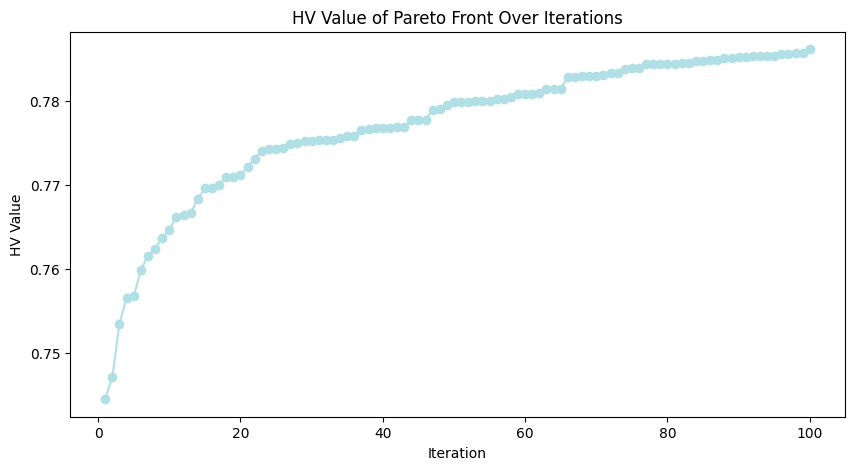

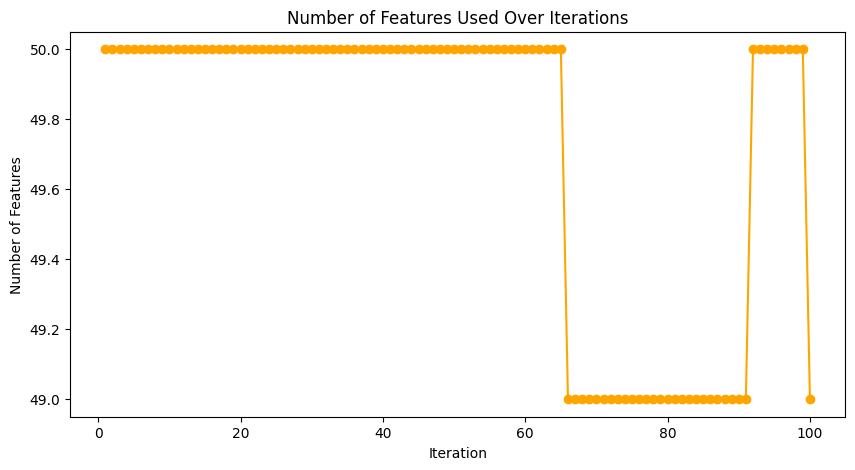

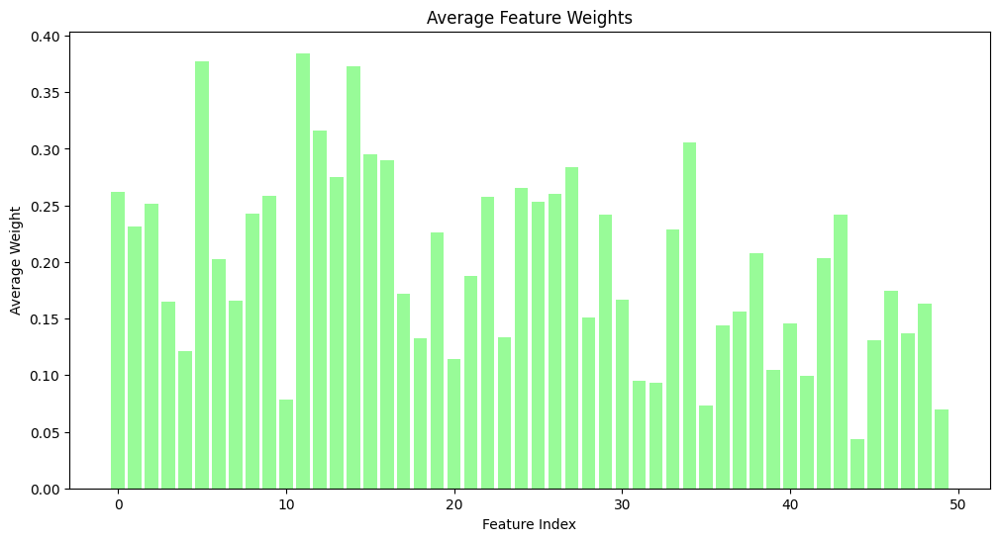

Total population members: 100
Pareto front members: 24


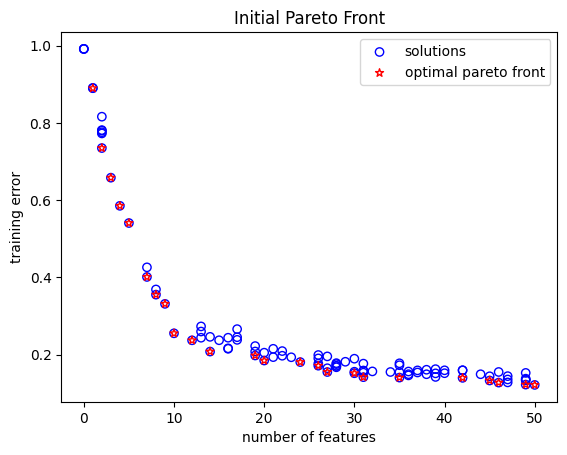

Total population members: 100
Pareto front members: 30


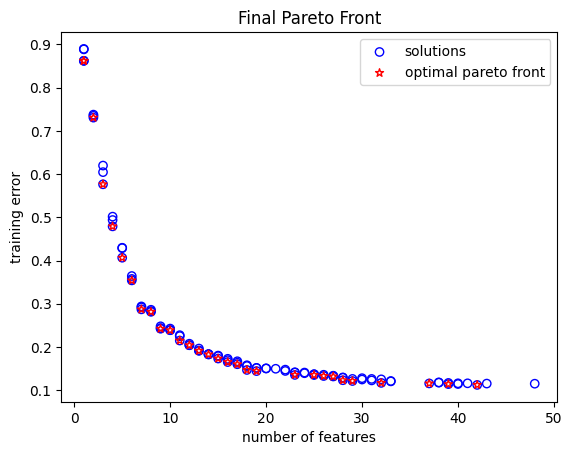

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 23.0
corresponding weights:  [0.592388   0.71626866 0.10351807 0.         0.         0.69633234
 0.76949254 0.         0.66321525 0.        ] ...
corresponding normalized weights:  [0.03724564 0.04503447 0.00650857 0.         0.         0.043781
 0.04838086 0.         0.04169881 0.        ] ...
classification error on train sets: 0.13541872225998697
classification error on test sets: 0.18609084357086747
solution 1:
number of selected features is: 7.0
corresponding weights:  [0.         0.40395049 0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
corresponding normalized weights:  [0.         0.13448316 0.         0.         0.         0.
 0.         0.         0.         0.        ] ...
classification error on train sets: 0.28708829920112555
classification error on test sets: 0.30862934683174703
solution 2:
number of selected f

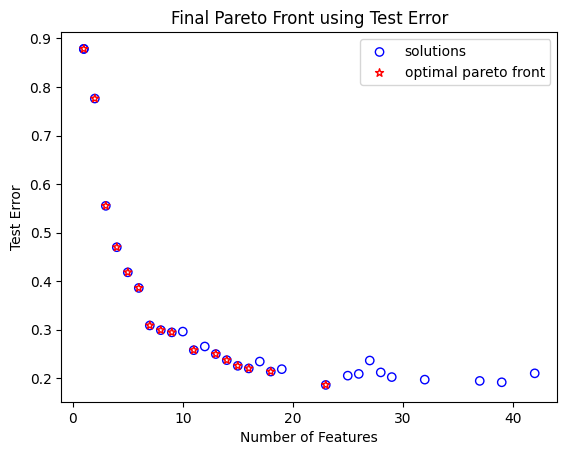

Final PF Results:  {0: {'num_selected_features': 23.0, 'feature_weights': [0.5923880044238923, 0.7162686601126049, 0.1035180677740394, 0.0, 0.0, 0.6963323402897053, 0.7694925364484765, 0.0, 0.663215247036971, 0.0, 0.0, 0.8734598400477601, 0.9027882334024699, 0.0, 0.0, 0.9753825372515045, 0.9122924222852603, 0.0, 0.0, 0.36382840728633936, 0.0, 0.721435814723896, 0.0, 0.3977798511818618, 0.0, 0.9733294115054067, 0.6452863355643215, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7685441509918116, 0.0, 0.9113591356979265, 0.7077406890383962, 0.9438771032620994, 0.785499245895404, 0.5059308187544982, 0.0, 0.0, 0.0, 0.0, 0.0, 0.49126084780817486, 0.0, 0.48388708609679554, 0.0], 'train_error': 0.13541872225998697, 'test_error': 0.18609084357086747}, 1: {'num_selected_features': 7.0, 'feature_weights': [0.0, 0.4039504928485159, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3484016439422677, 0.0, 0.0, 0.6236519101045097, 0.0, 0.0, 0.0, 0.0, 0.0, 0.45747078859561985, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.

C:\Users\krish\AppData\Local\Temp\ipykernel_14124\824608307.py:342: DtypeWarning: Columns (5,6,7,8,15,16,17,18,19,36,37,38,39,40,46,47,48,49,50,51,56,57,58,59,60,70,71,72,73,74,76,77,78,79,80,94,95,96,97,98,101,102,103,104,108,109,110,111,112,118,119,120,121,122,139,140,141,142,149,150,151,152,153,154,159,160,161,162,163,197,198,199,200,207,211,212,213,214,215,221,222,223,224,231,253,254,255,256,262,263,264,265,272,314,315,316,317,324,1097,1098,1099,1100,1101,1103,1104,1105,1106,1107,2124,2125,2126,2127,2128,2130,2131,2132,2133,2134,3151,3152,3153,3154,3155,3157,3158,3159,3160,3161,4178,4179,4180,4181,4182,4184,4185,4186,4187,4188,5205,5206,5207,5208,5209,5211,5212,5213,5214,5215,6232,6233,6234,6235,6236,6238,6239,6240,6241,6242,7259,7260,7261,7262,7263,7265,7266,7267,7268,7269,8286,8287,8288,8289,8290,8292,8293,8294,8295,8296,9313,9314,9315,9316,9317,9319,9320,9321,9322,9323,10340,10341,10342,10343,10344,10346,10347,10348,10355,11367,11368,11369,11370,11371,12394,12395,12396,12397,123

Results saved to data.csv
************************************************** RUN 8 **************************************************
INDIVIDUAL 1, 18 features: [0.         0.21554426 0.03621372 0.26477347 0.25136388 0.
 0.         0.         0.         0.        ]...
INDIVIDUAL 2, 28 features: [0.         0.45494634 0.19991398 0.         0.         0.72116772
 0.54493895 0.31091094 0.         0.18462914]...
INDIVIDUAL 3, 45 features: [0.14784938 0.41720929 0.01248387 0.         0.7640868  0.
 0.36228828 0.84467683 0.84189162 0.54970064]...
INDIVIDUAL 4, 42 features: [0.54364462 0.76795795 0.96864285 0.19509846 0.58906168 0.
 0.85450519 0.84257503 0.65728767 0.65182191]...
INDIVIDUAL 5, 11 features: [0.23304581 0.         0.         0.         0.         0.
 0.         0.89531177 0.7934426  0.58878562]...
INDIVIDUAL 6, 4 features: [0.         0.58747677 0.         0.         0.         0.
 0.55562265 0.         0.         0.        ]...
INDIVIDUAL 7, 42 features: [0.01919884 0.64190015

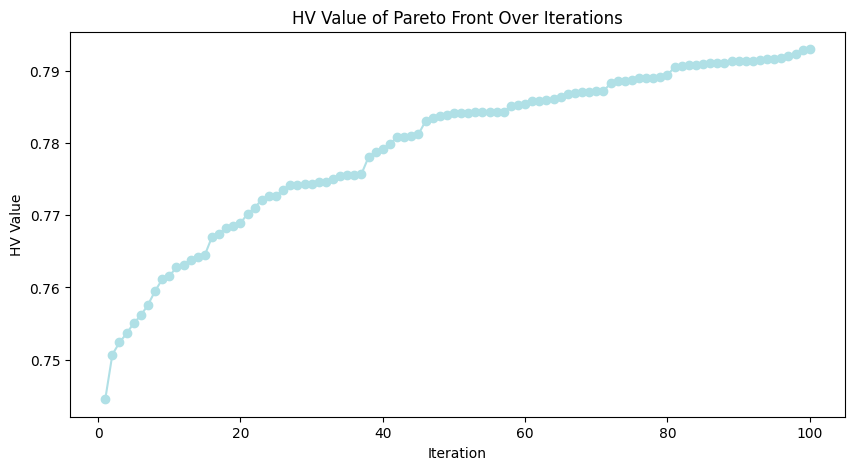

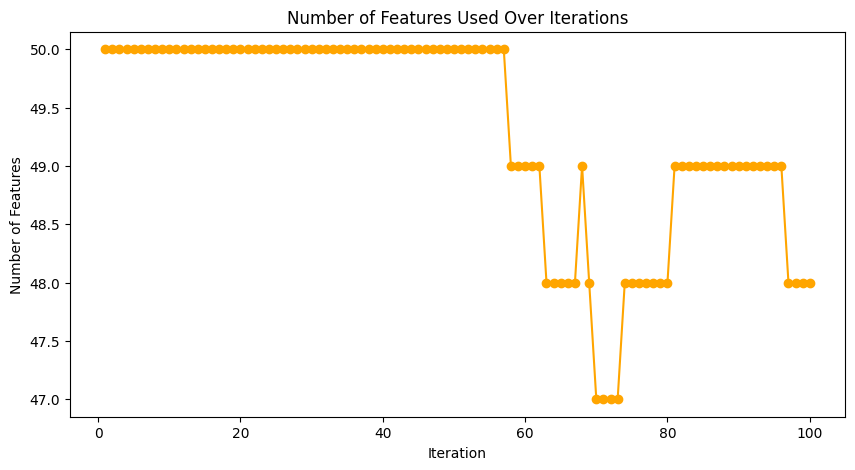

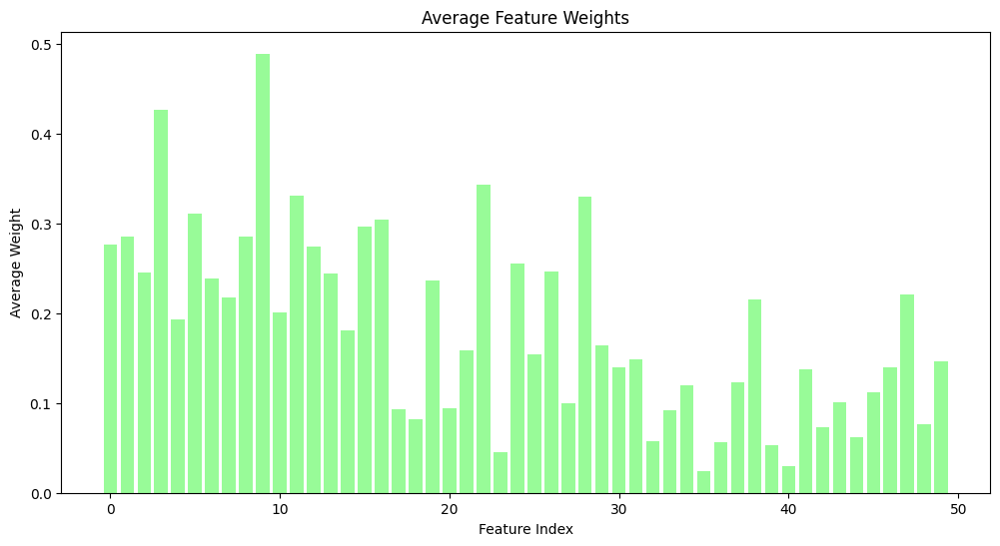

Total population members: 100
Pareto front members: 16


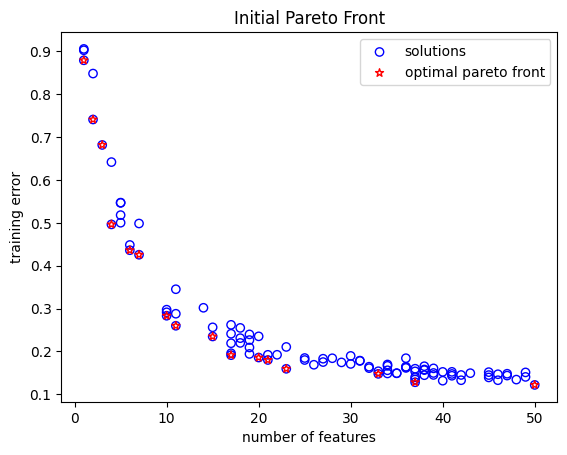

Total population members: 100
Pareto front members: 27


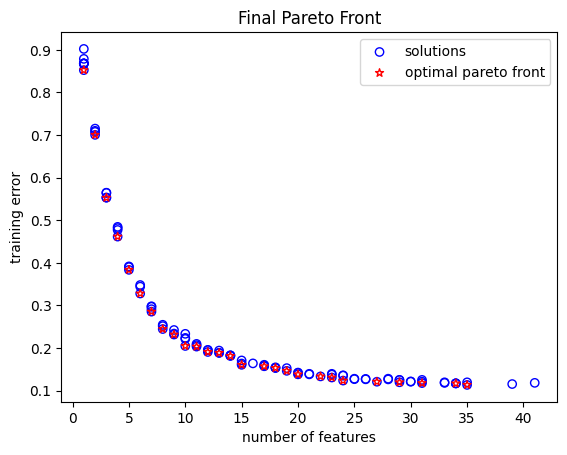

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 35.0
corresponding weights:  [0.69916317 0.         0.         0.89590214 0.60537159 0.59308466
 0.35231378 0.88847987 0.87033816 0.97915297] ...
corresponding normalized weights:  [0.03167419 0.         0.         0.04058706 0.02742515 0.02686852
 0.01596087 0.04025081 0.03942894 0.04435858] ...
classification error on train sets: 0.11333761940639309
classification error on test sets: 0.20325280671568702
solution 1:
number of selected features is: 34.0
corresponding weights:  [0.69916317 0.11912719 0.         0.86491632 0.60537159 0.42553881
 0.50015422 0.60478959 0.78899507 0.88489306] ...
corresponding normalized weights:  [0.03733197 0.00636082 0.         0.0461824  0.03232395 0.02272174
 0.02670585 0.03229287 0.04212857 0.04724906] ...
classification error on train sets: 0.11679437270268733
classification error on test sets: 0.19610543659546387
solution 2:
n

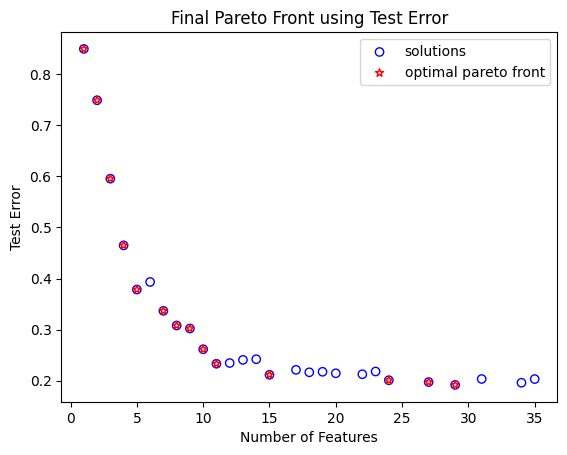

Final PF Results:  {0: {'num_selected_features': 35.0, 'feature_weights': [0.699163173541743, 0.0, 0.0, 0.8959021446442322, 0.6053715882905671, 0.5930846585093401, 0.352313779172992, 0.888479865143872, 0.8703381627608776, 0.9791529743990374, 0.7371809565765366, 0.0, 0.6666868639049799, 0.956324279065298, 0.6744691457501912, 0.7913900892323545, 0.7280010195472174, 0.0, 0.540947597955936, 0.6799312417892381, 0.760911796803208, 0.5797480037182313, 0.9812364550944748, 0.0, 0.661739332170852, 0.5572938639535217, 0.0, 0.11167163961394332, 0.6838628936592703, 0.5296424320943904, 0.353517693352044, 0.0, 0.5929302998402158, 0.0, 0.4770592057567663, 0.0, 0.38837089090246435, 0.48530938307458127, 0.0, 0.0, 0.0, 0.8128805919631501, 0.0, 0.0, 0.25210199118915005, 0.0, 0.3008188563904296, 0.6164433294283914, 0.5799524668835397, 0.6893607852734058], 'train_error': 0.11333761940639309, 'test_error': 0.20325280671568702}, 1: {'num_selected_features': 34.0, 'feature_weights': [0.699163173541743, 0.11912

C:\Users\krish\AppData\Local\Temp\ipykernel_14124\824608307.py:342: DtypeWarning: Columns (5,6,7,8,15,16,17,18,19,36,37,38,39,40,46,47,48,49,50,51,56,57,58,59,60,70,71,72,73,74,76,77,78,79,80,94,95,96,97,98,101,102,103,104,108,109,110,111,112,118,119,120,121,122,139,140,141,142,149,150,151,152,153,154,159,160,161,162,163,197,198,199,200,207,211,212,213,214,215,221,222,223,224,231,253,254,255,256,262,263,264,265,272,314,315,316,317,324,1097,1098,1099,1100,1101,1103,1104,1105,1106,1107,2124,2125,2126,2127,2128,2130,2131,2132,2133,2134,3151,3152,3153,3154,3155,3157,3158,3159,3160,3161,4178,4179,4180,4181,4182,4184,4185,4186,4187,4188,5205,5206,5207,5208,5209,5211,5212,5213,5214,5215,6232,6233,6234,6235,6236,6238,6239,6240,6241,6242,7259,7260,7261,7262,7263,7265,7266,7267,7268,7269,8286,8287,8288,8289,8290,8292,8293,8294,8295,8296,9313,9314,9315,9316,9317,9319,9320,9321,9322,9323,10340,10341,10342,10343,10344,10346,10347,10348,10355,11367,11368,11369,11370,11371,12394,12395,12396,12397,123

Results saved to data.csv
************************************************** RUN 9 **************************************************
INDIVIDUAL 1, 14 features: [0.         0.2281828  0.         0.         0.         0.
 0.25212929 0.12252072 0.         0.8472247 ]...
INDIVIDUAL 2, 21 features: [0.         0.8422856  0.         0.726696   0.         0.
 0.05599744 0.         0.48546847 0.72798335]...
INDIVIDUAL 3, 18 features: [0.         0.         0.         0.94923764 0.23074277 0.
 0.         0.63318294 0.74165703 0.        ]...
INDIVIDUAL 4, 48 features: [0.56999204 0.         0.73656788 0.45123303 0.31106741 0.78861315
 0.96042995 0.35308598 0.64989993 0.97193057]...
INDIVIDUAL 5, 18 features: [0.65447227 0.48220901 0.1784794  0.         0.         0.
 0.95889498 0.         0.15544903 0.32444221]...
INDIVIDUAL 6, 40 features: [0.39829102 0.45050163 0.         0.60941917 0.44025757 0.
 0.32191741 0.82784899 0.         0.24489215]...
INDIVIDUAL 7, 16 features: [0.         0.7463610

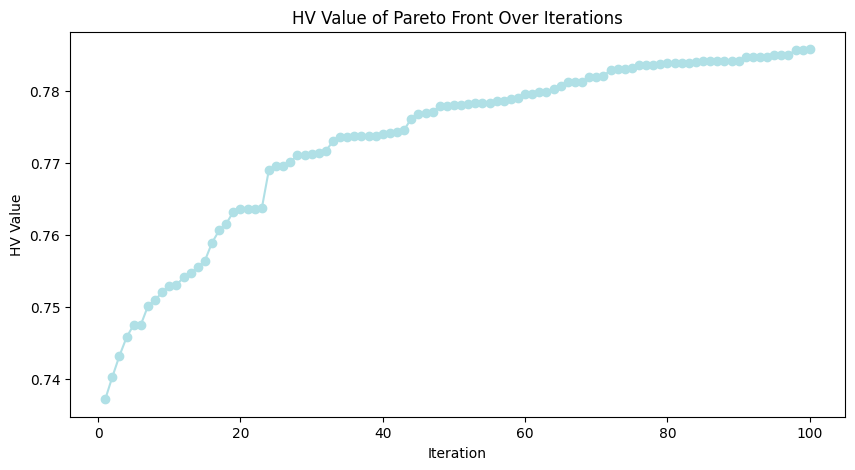

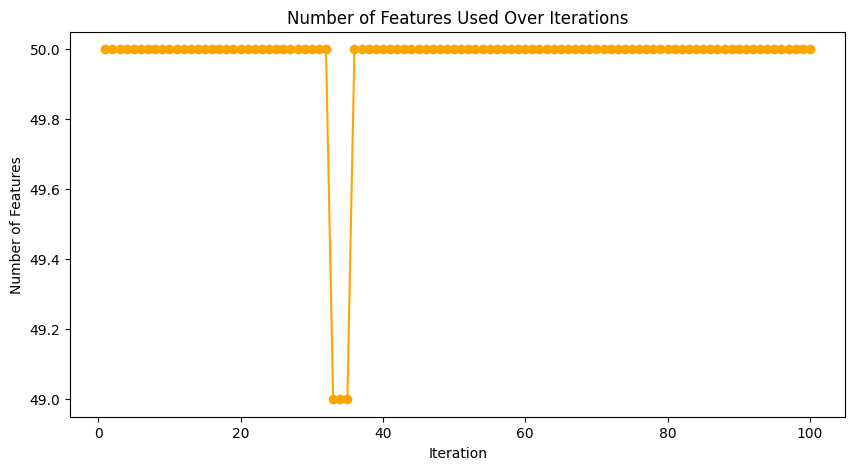

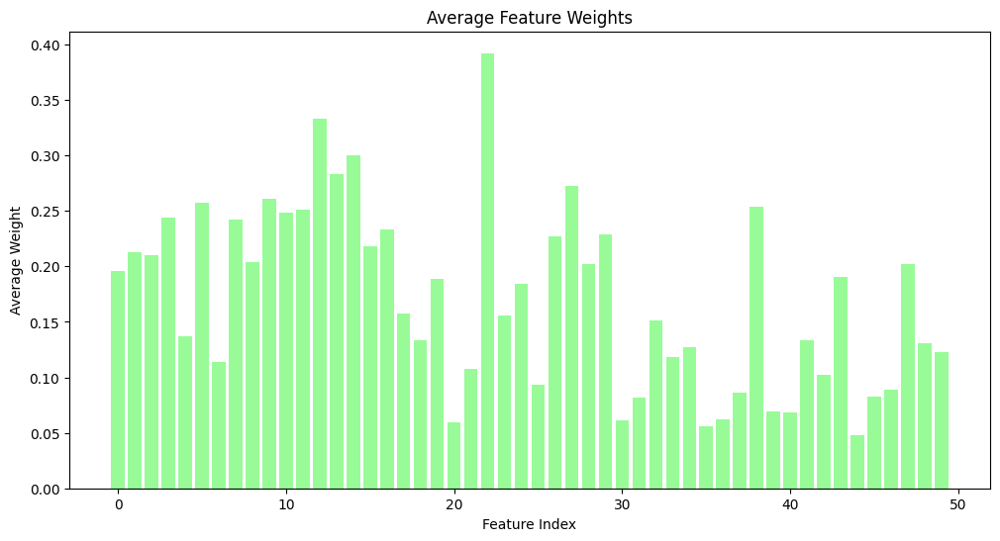

Total population members: 100
Pareto front members: 24


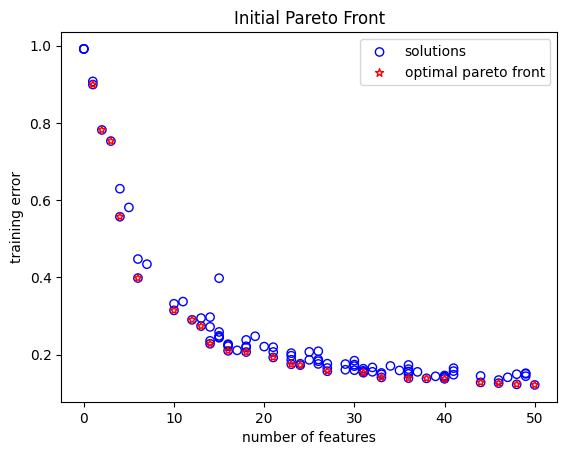

Total population members: 100
Pareto front members: 30


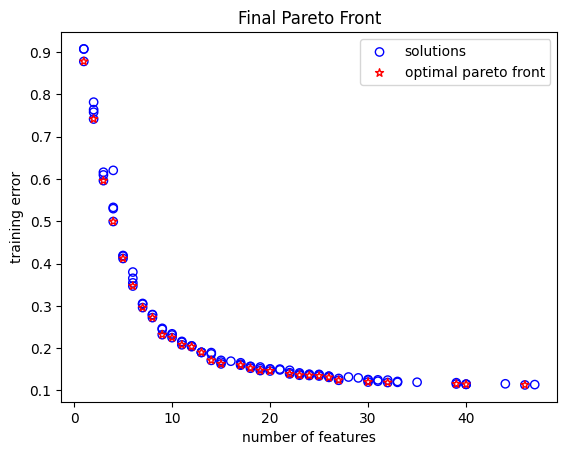

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 1.0
corresponding weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ...
classification error on train sets: 0.8780601421904201
classification error on test sets: 0.9087338236618595
solution 1:
number of selected features is: 5.0
corresponding weights:  [0.         0.74955216 0.         0.         0.         0.
 0.         0.42862656 0.         0.96115122] ...
corresponding normalized weights:  [0.         0.25520731 0.         0.         0.         0.
 0.         0.14593865 0.         0.3272525 ] ...
classification error on train sets: 0.4118975574697943
classification error on test sets: 0.4075595007879048
solution 2:
number of selected features is: 24.0
corresponding weights:  [0.52515238 0.40560936 0.80397516 0.         0.         0.87246014
 0.46141796 0.67644227 0.36541403 0.        ] ...
corresp

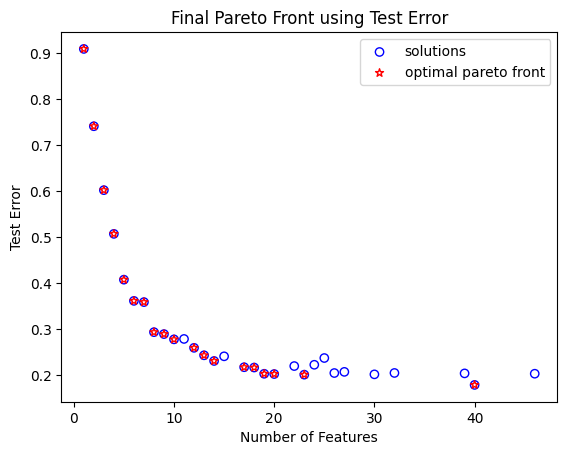

Final PF Results:  {0: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.13806676941639182, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.8780601421904201, 'test_error': 0.9087338236618595}, 1: {'num_selected_features': 5.0, 'feature_weights': [0.0, 0.749552158117464, 0.0, 0.0, 0.0, 0.0, 0.0, 0.428626561004916, 0.0, 0.9611512184111173, 0.0, 0.0, 0.2917026277698933, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5059998888582329, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.4118975574697943, 'test_error': 0.4075595007879048}, 2: {'num_selected_features': 24.0, 'feature_weights': [0.525152376401793, 0.40560935677900467, 0.8039751555238122, 0.0, 0.0, 0.87246013621336

C:\Users\krish\AppData\Local\Temp\ipykernel_14124\824608307.py:342: DtypeWarning: Columns (5,6,7,8,15,16,17,18,19,36,37,38,39,40,46,47,48,49,50,51,56,57,58,59,60,70,71,72,73,74,76,77,78,79,80,94,95,96,97,98,101,102,103,104,108,109,110,111,112,118,119,120,121,122,139,140,141,142,149,150,151,152,153,154,159,160,161,162,163,197,198,199,200,207,211,212,213,214,215,221,222,223,224,231,253,254,255,256,262,263,264,265,272,314,315,316,317,324,1097,1098,1099,1100,1101,1103,1104,1105,1106,1107,2124,2125,2126,2127,2128,2130,2131,2132,2133,2134,3151,3152,3153,3154,3155,3157,3158,3159,3160,3161,4178,4179,4180,4181,4182,4184,4185,4186,4187,4188,5205,5206,5207,5208,5209,5211,5212,5213,5214,5215,6232,6233,6234,6235,6236,6238,6239,6240,6241,6242,7259,7260,7261,7262,7263,7265,7266,7267,7268,7269,8286,8287,8288,8289,8290,8292,8293,8294,8295,8296,9313,9314,9315,9316,9317,9319,9320,9321,9322,9323,10340,10341,10342,10343,10344,10346,10347,10348,10355,11367,11368,11369,11370,11371,12394,12395,12396,12397,123

Results saved to data.csv
************************************************** RUN 10 **************************************************
INDIVIDUAL 1, 24 features: [0.19420553 0.85425061 0.         0.55938664 0.03635778 0.09245199
 0.         0.         0.66620858 0.        ]...
INDIVIDUAL 2, 15 features: [0.83414861 0.         0.20398606 0.         0.         0.
 0.11354034 0.29695572 0.         0.        ]...
INDIVIDUAL 3, 11 features: [0.         0.59524087 0.         0.20799531 0.27819655 0.
 0.         0.         0.         0.        ]...
INDIVIDUAL 4, 5 features: [0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.59418179]...
INDIVIDUAL 5, 40 features: [0.37754093 0.         0.01775693 0.3725026  0.47244799 0.8851902
 0.03439938 0.80966538 0.86196351 0.25308879]...
INDIVIDUAL 6, 37 features: [0.         0.         0.04648496 0.24406815 0.30252967 0.
 0.52792639 0.88485578 0.77084854 0.        ]...
INDIVIDUAL 7, 45 features: [0.99175877 0.

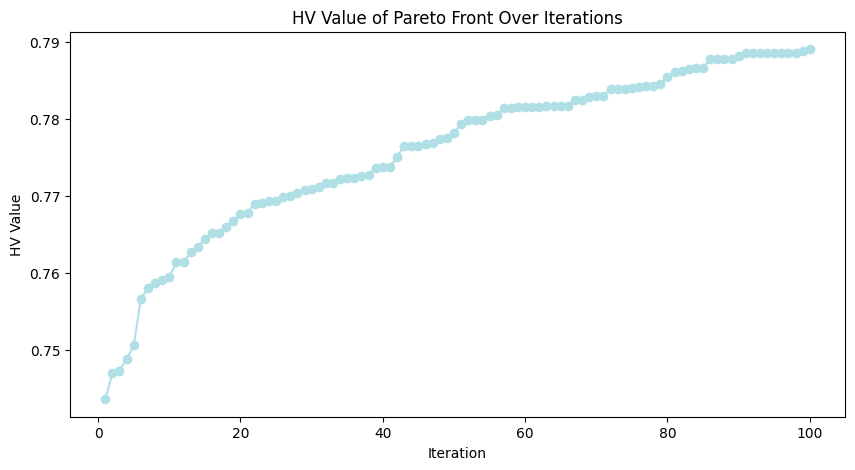

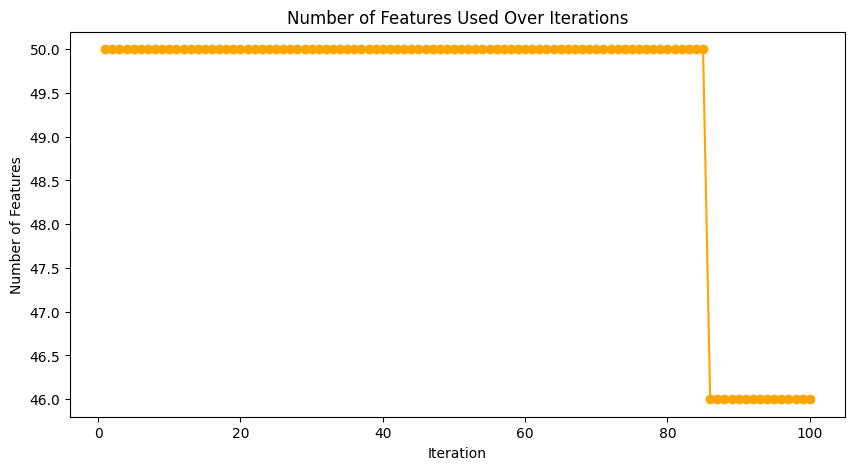

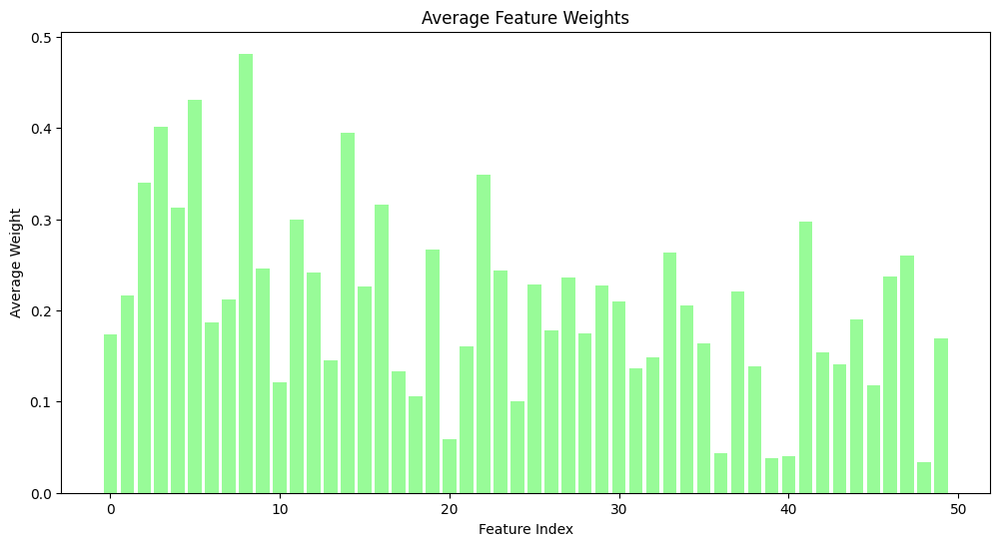

Total population members: 100
Pareto front members: 23


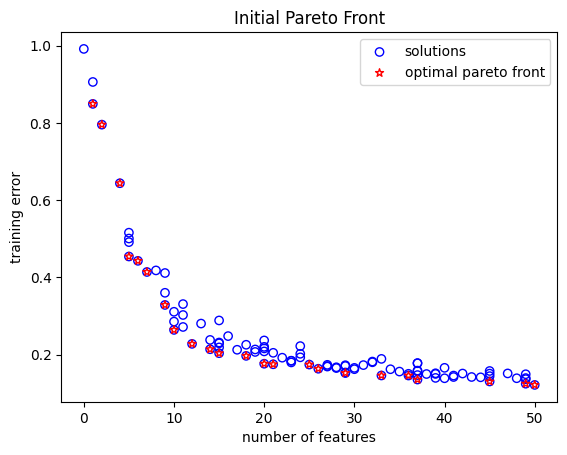

Total population members: 100
Pareto front members: 29


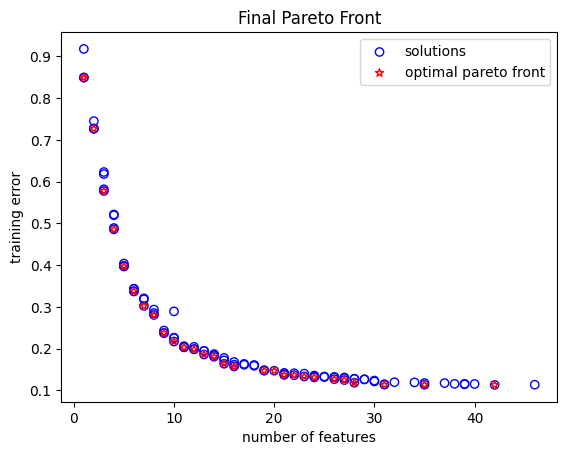

##################################################
Pareto Front Solution Details
solution 0:
number of selected features is: 16.0
corresponding weights:  [0.         0.7516705  0.         0.87222867 0.49724633 0.87344121
 0.         0.         0.79314446 0.31005412] ...
corresponding normalized weights:  [0.         0.07712001 0.         0.08948906 0.05101656 0.08961346
 0.         0.         0.08137517 0.03181098] ...
classification error on train sets: 0.1575320674609968
classification error on test sets: 0.2337628123423835
solution 1:
number of selected features is: 1.0
corresponding weights:  [0.         0.         0.         0.         0.         0.
 0.05724872 0.         0.         0.        ] ...
corresponding normalized weights:  [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.] ...
classification error on train sets: 0.8491146344223194
classification error on test sets: 0.8521156627793923
solution 2:
number of selected features is: 31.0
corresponding weights:  [0.17735015 0.12613506 0.95332614 

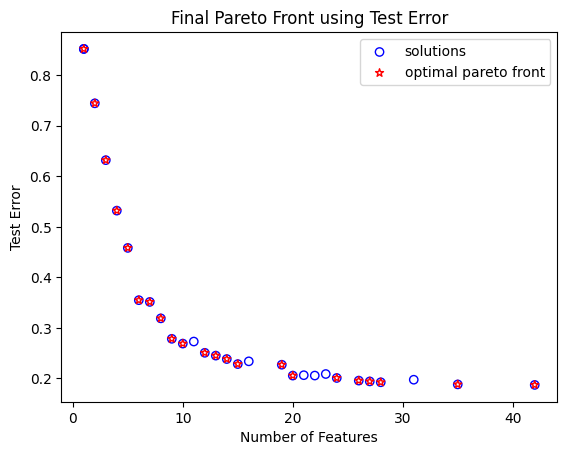

Final PF Results:  {0: {'num_selected_features': 16.0, 'feature_weights': [0.0, 0.751670496959014, 0.0, 0.8722286728113039, 0.4972463326926404, 0.8734412106980115, 0.0, 0.0, 0.7931444559532128, 0.31005412106024777, 0.0, 0.0, 0.0, 0.0, 0.6875625259153775, 0.0, 0.0, 0.0, 0.0, 0.0, 0.42948988065663035, 0.0, 0.7025944108980824, 0.0, 0.0, 0.0, 0.0, 0.870041370094842, 0.45956351938664564, 0.0, 0.0, 0.2700487908500277, 0.0, 0.34724699196791886, 0.0, 0.0, 0.0, 0.0, 0.7075947694556521, 0.0, 0.0, 0.0, 0.6289008226373087, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.545934715364483], 'train_error': 0.1575320674609968, 'test_error': 0.2337628123423835}, 1: {'num_selected_features': 1.0, 'feature_weights': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.057248719990632496, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'train_error': 0.8491146344223194, 'test_

C:\Users\krish\AppData\Local\Temp\ipykernel_14124\824608307.py:342: DtypeWarning: Columns (5,6,7,8,15,16,17,18,19,36,37,38,39,40,46,47,48,49,50,51,56,57,58,59,60,70,71,72,73,74,76,77,78,79,80,94,95,96,97,98,101,102,103,104,108,109,110,111,112,118,119,120,121,122,139,140,141,142,149,150,151,152,153,154,159,160,161,162,163,197,198,199,200,207,211,212,213,214,215,221,222,223,224,231,253,254,255,256,262,263,264,265,272,314,315,316,317,324,1097,1098,1099,1100,1101,1103,1104,1105,1106,1107,2124,2125,2126,2127,2128,2130,2131,2132,2133,2134,3151,3152,3153,3154,3155,3157,3158,3159,3160,3161,4178,4179,4180,4181,4182,4184,4185,4186,4187,4188,5205,5206,5207,5208,5209,5211,5212,5213,5214,5215,6232,6233,6234,6235,6236,6238,6239,6240,6241,6242,7259,7260,7261,7262,7263,7265,7266,7267,7268,7269,8286,8287,8288,8289,8290,8292,8293,8294,8295,8296,9313,9314,9315,9316,9317,9319,9320,9321,9322,9323,10340,10341,10342,10343,10344,10346,10347,10348,10355,11367,11368,11369,11370,11371,12394,12395,12396,12397,123

Results saved to data.csv


In [52]:
# Re-run GDE3 with top 50 features, but with the following changes: compute MIC correlation of top 50 features with the label, and make ONE individual in the initial population have weights equivalent to correlation values

# Read top 50 features
top_50 = pd.read_csv("Top_NSGA2_Features.csv").head(50)
print(top_50)

# Read validation data
validation_path = "KimiaNet_Data/kimianet_validation_data_averaged_feature_vectors.csv"
validation = pd.read_csv(validation_path)
dclass = validation.columns[0]
x = validation.drop(columns=[dclass])
y = validation[dclass]
featureNames = []
for i in top_50['Feature'].tolist():
    featureNames.append(x.columns[i-1]) #featureNames has feature names from 1-1024, not indices; so, to access feature x, we need to go to index i-1
x = x[featureNames]

# Read test data
test_path = "KimiaNet_Data/kimianet_test_data_averaged_feature_vectors.csv"
test = pd.read_csv(test_path)
dclass = test.columns[0]
xtest = test.drop(columns=[dclass])
ytest = test[dclass]
featureNames = []
for i in top_50['Feature'].tolist():
    featureNames.append(xtest.columns[i-1]) 
xtest = xtest[featureNames]

# Read MIC correlation between features in training data (i.e., the validation set) and the label; I computed MIC externally with Colab and stored the results in mic_results.csv
mic_df = pd.read_csv("mic_results.csv")
mic_df = mic_df[mic_df['Feature'].isin(featureNames)]
mic_df['SortOrder'] = mic_df['Feature'].apply(lambda feature: featureNames.index(feature)) # sort mic_df so columns appear in same order as in the val data; this way, when we create an array of correlation-based weights, it aligns with the order of columns in x
mic_df = mic_df.sort_values(by='SortOrder').drop(columns='SortOrder')
mic_scores = mic_df['MIC_Value'].values

# Run GDE3 algorithm 10 times
epsilon = 0.01
total_features = x.shape[1] 
popsize = 100
print("TOTAL NUMBER OF FEATURES: ", total_features)
for run in range(10):
    print("*"*50, f"RUN {run+1}", "*"*50)
    dataset_name = f"RUN {run+1}: GDE3 Kimianet Feature Weighting w/ MIC Correlation"

    # Initialize population with ONE individual having weights corresponding to correlation values
    custom_population = generate_individuals(total_features, epsilon, popsize)
    replacement = np.random.randint(0, popsize)
    custom_population[replacement] = mic_scores
    print(f"Replaced individual at index {replacement} with MIC correlation-based weights: {mic_scores[:5]}...")
    pop = Population.new("X", custom_population)

    problem = MyProblem(x,y,epsilon)
    Evaluator().eval(problem, pop) # evaluate initial population
    algorithm = GDE3(pop_size=popsize,
                    variant="DE/rand/1/bin", # selection = random, crossover = binary
                    CR=0.5, # crossover parameter [0,1]
                    F=(0.0, 0.9), # scale factor or mutation parameter (0,2]
                    sampling = pop
                    )
    res = minimize(problem,
                    algorithm,
                    ("n_gen", 100),
                    verbose=True, # prints results if true
                    save_history=True
                    )
    
    final_pf_results, final_test_pf_results, lowest_train_error_solution, lowest_test_error_solution, hv_test, hv_training = visualize(res, x, y, xtest, ytest, epsilon)
    store_results(dataset_name, final_pf_results, final_test_pf_results, lowest_train_error_solution, lowest_test_error_solution, hv_test, hv_training, epsilon, featureNames)